# **ChatChisel: Enabling Agile Hardware Design with Large Language Models**

<a href="https://colab.research.google.com/github/idea-fasoc/OpenFASOC/blob/main/docs/source/notebooks/temp-sense-gen/temp_sense_genCollab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

```
National ASIC Center, School of Integrate Circuits, Southeast University&
National Center of Technology Innovation for Electronic Design Automation, April 2024
SPDX-License-Identifier: Apache-2.0
```


|Name|Affiliation|IEEE Member|SSCS Member|
|:--:|:----------:|:----------:|:----------:|
| **Team** **member**:
|Tianyang Liu <br /> Email: liutianyang@seu.edu.cn|National ASIC Center, School of Integrate Circuits, Southeast University|No|No|
|Qi Tian  <br /> Email: qi_tian@seu.edu.cn|National ASIC Center, School of Integrate Circuits, Southeast University|No|No|
|Junyan Li <br /> Email: 220236339@seu.edu.cn|National ASIC Center, School of Integrate Circuits, Southeast University|No|No|
|Jianmin Ye <br /> Email: jianmin_y@seu.edu.cn|National ASIC Center, School of Integrate Circuits, Southeast University|No|No|
|LikTung Fu <br /> Email: 220236703@seu.edu.cn|National ASIC Center, School of Integrate Circuits, Southeast University|No|No|
|Shengchu Su <br /> Email: 220236445@seu.edu.cn|National ASIC Center, School of Integrate Circuits, Southeast University|No|No|
|Gwokwaa Wan <br /> Email: gwokwaa@nctieda.com|National Center of Technology Innovation for Electronic Design Automation|No|No|
|SamZaak Wong <br /> Email:  samzaak@nctieda.com|National Center of Technology Innovation for Electronic Design Automation|No|No|
***Advisor:***
|Xi Wang <br /> Email: xi.wang@seu.edu.cn |National ASIC Center, School of Integrated Circuits, Southeast University <br> National Center of Technology Innovation for Electronic Design Automation|Yes|No|

## Abstract
In this notebook, **we introduce ChatChisel, a language-based agile hardware design workflow capable of generating Chisel code from language specifications**. With the increasing complexity of integrated circuits, agile hardware design methodologies become crucial. Modern hardware description languages (HDLs) like Chisel improve design quality, but manual implementations remain error-prone and time-consuming. Large language models (LLMs) offer potential for hardware design automation through natural language but face challenges in generating large circuits using Verilog. We assess LLM capabilities for Chisel and Verilog generation, demonstrating superior Chisel generation ability. We present ChatChisel as the first language-based agile hardware design workflow, generating Chisel code from language specifications. ChatChisel utilizes four LLM-based modules for decomposition, generation, error correction, and composition of hardware designs. Techniques like LLM collaboration and RAG enhance ChatChisel’s performance. Using GPT-3.5-turbo, **we implemented an RV32I RISC-V CPU with a 5-stage pipeline and dynamic branch prediction**. We validate our approach through extensive evaluations. **Experimental results reveal that ChatChisel can outperform LLM-based hardware design with Verilog by an average of 31.86%, implying significant design capability enhancement and design process acceleration with ChatChisel**.

## Background
With the increasing demand for computing in areas such as deep learning, big data, and blockchain, driven by advancements in information technology, the scale and complexity of integrated circuits (ICs) are growing rapidly. The emerging domain-specific architectures (DSAs) targeting distinct application domains feature customized instructions, programming models, microarchitectures, heterogeneity, etc. Such customization inevitably complicates the ASIC design, especially the implementation and verification processes. To address this challenge, there is a pressing need for agile hardware development capabilities.

Current digital circuit designs primarily rely on manually written, relatively primitive hardware description languages(i.e., Verilog and SystemVerilog). Implementations based on traditional HDLs may encounter issues in maintaining readability and modularity, leading to challenges in code reusability and scalability for complex designs, which cannot satisfy the needs of agile design iterations. To address these limitations, modern HDLs such as Chisel have been introduced. Chisel is a Scala-based hardware construction language that describes digital circuits and systems using an object-oriented approach, enabling more expressive, concise, and maintainable designs. This facilitates rapid prototyping and iterative development, making it well-suited for the demands of agile hardware design. However, manual implementations based on modern HDLs still require considerable effort and time. Given that human-driven implementations are error-prone, this does not necessarily reduce the large amount of time spent in debugging and verification processes. Further advancements in design automation and tool support are strongly desired to streamline the development process and minimize errors in complex digital circuit designs.

Machine Learning (ML) has been widely applied in Electronic Design Automation (EDA) to enhance the degree of design automation. While most ML-based optimizations in EDA tools focus on the backend processes, such as placement, routing, timing, and power analysis. However, the frontend of the design flow, which involves the initial creation and verification of hardware descriptions, has seen limited automation advancements. The emergence of large language models (LLMs) such as ChatGPT represents a significant opportunity to bridge this gap and further enhance the efficiency of agile hardware design. LLMs enable RTL-level circuit design using natural language, converting functional descriptions into HDL and modifying the generated HDL based on linter feedback to correct syntax errors. This reduces the time spent on manual HDL writing and fixing syntax errors, consequently improving circuit design and iteration efficiency. However, there are some challenges associated with LLM-based circuit design methodologies:
- LLMs have limited tokens, and cannot directly generate large-scale circuits
- LLMs may exhibit hallucinations, inaccurately converting the description of circuits into HDL
- LLMs’ output is significantly influenced by the given prompt,leading to variations in the quality of generated circuits

This notebook demonstrates that the ability of LLMs to generate Chisel is superior to Verilog under the same conditions. To address the mentioned challenges in LLM-based circuit generation, we propose a LLM-based digital circuit generation framework with Chisel. The framework consists of four LLMs, responsible for design decomposition, generation, error correction, and composition, respectively.

## Design & Methodology

- Design Decomposition: LLMs struggle to generate large-scale circuits mainly due to two limitations. First, the limited number of input and output tokens in LLMs restricts the scale of circuits they can generate. Second, LLMs have limited generation capabilities and may overlook certain details in complex circuit descriptions. Generally, LLMs perform better in classification tasks compared to generation tasks. Therefore, we utilize an LLM to automatically decompose complex design into simpler modules, enabling it to focus on generating multiple logically simple leaf modules separately.
  
- Tool Enhanced LLM Error Correction: LLMs often suffer from hallucinations during generation. In circuit generation, these inaccuracies can be classified into two types: alignment and correctness. Alignment refers to LLM-generated circuits that do not align with the input prompt in terms of functionality, while correctness refers to LLM-generated design exposing syntax or functionality errors in certain circuit structures. To address these issues, we employ tool-assisted error correction methodology. For syntax errors, we utilize an LLM with feedback from a linter for syntax check and correction. For errors captured in functionality verification, we employ an LLM that extracts feedback from testbench output information.
  
- Structured Prompt with RAG: The generation capability of LLMs is limited by the scale and diversity of the training dataset. LLMs struggle to accurately generate content with limited training data. For instance, the lack of Chisel design knowledge impedes the capability of Llama2 to generate circuits in Chisel. Therefore, we employ the RAG technique to enhance the generation capability of LLM in specific domains without requiring additional training. We build a local knowledge base from high-quality open-source hardware designs and use the LangChain framework to integrate and vectorize information into structured prompts for LLMs.

Based on the proposed solutions, we introduce the ChatChisel framework.

![workflow.png][workflow_png]

[workflow_png]: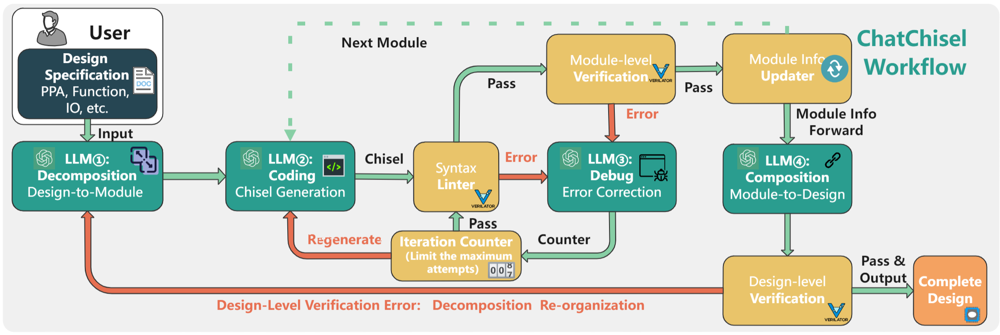

As illustrated in the figure, ChatChisel is an LLM-based framework that directly generates Chisel code from natural language. It aims to assist human designers in the front-end design process by converting functional descriptions of circuits into Chisel code. The generation workflow of ChatChisel is as follows: Initially, we provide a module description, including the name, functionality, and interface information, as input to LLM1. LLM1 decomposes the large-scale designs into individual modules, referred to as leaf modules. The descriptions of the leaf modules are used as prompts for LLM2 to generate Chisel code. The generated Chisel code undergoes syntax checking using a linter and functional verification using verification tools. If there exist errors in syntax and verification, LLM3 is employed for error correction. If errors persist after multiple correction attempts, human feedback will be involved to guide the fixing process and regenerate the Chisel code. Once a leaf module passes functional verification, the generation proceeds to the next leaf module. When all leaf modules are generated, LLM4 composes the leaf modules based on the module information retrieved from LLM1, gradually forming the top-level design. Finally, The entire module undergoes design verification. If the verification passes, the design is completed, and the verified Chisel code is the output. Otherwise, error correction and design decomposition will be conducted.

### A. *Design Decomposition*

To simplify the decomposition of complex and large-scale circuits into easily generated modules, we employ an expert LLM dedicated to design decomposition. We apply in-context learning (ICL) to make the LLM adaptable to this task. Unlike fine-tuning, which requires retraining the LLM on
specific data and is not cost-effective for large-scale LLMs, ICL allows the model to adapt to new tasks without updating its parameters. The system prompt for the LLM used in design decomposition is illustrated in the figure.

<div style="text-align:center;">
    <div style="display:inline-block;">
        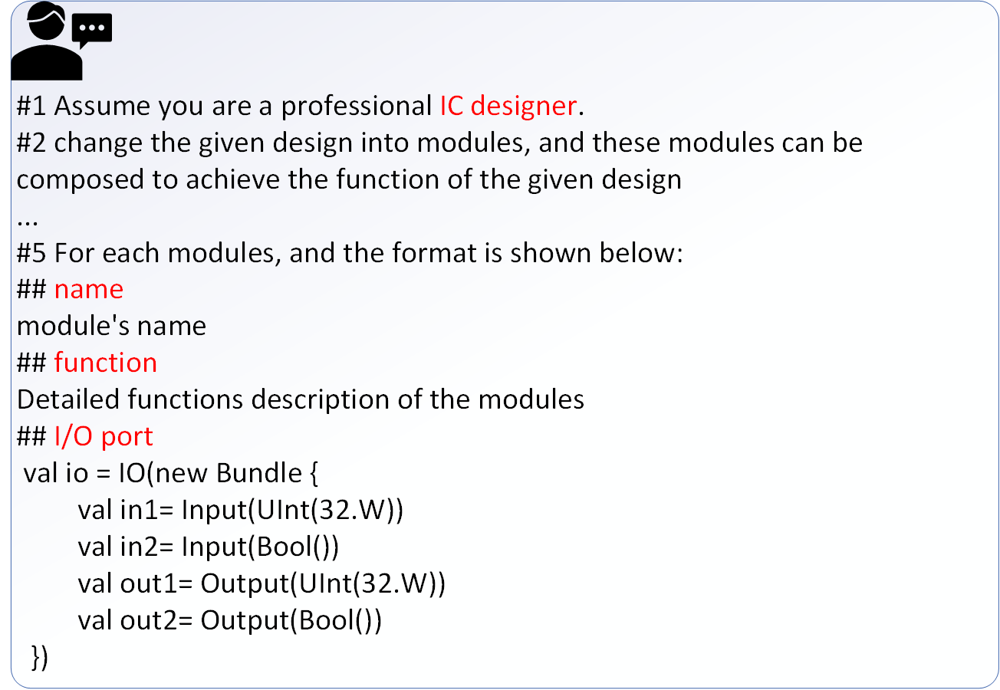
        <div>LLM1 Prompt Example</div>
    </div>
    <div style="display:inline-block;">
        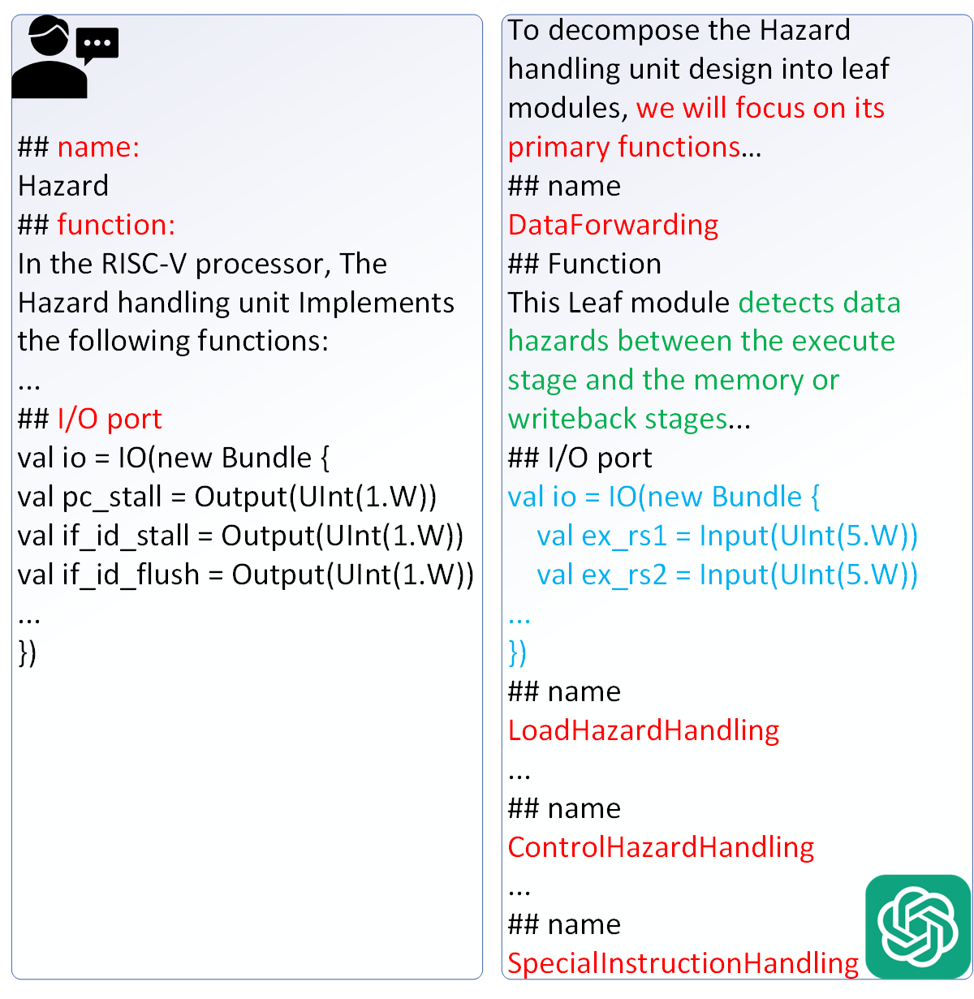
        <div>Example of Decomposition</div>
    </div>
</div>


In this prompt, we define specific rules to guide the behavior of LLM and provide an example to regulate the output format. To illustrate the effectiveness of decomposition, we compare the decomposition results of the Hazard unit in a RISC-V CPU. The Hazard unit, responsible for stall or flush operations in the processor pipeline based on input signals, handles tasks like data forwarding, data hazards, control hazards, interrupts, and exceptions, making it a complex module. The figure above demonstrates the results of design decomposition and shows a portion of the generated circuit logic before and after decomposition. It can be observed that the LLM successfully decomposes the complex Hazard handling unit into four simplified modules according to the specified format. In the Chisel code directly generated from the Hazard unit, due to the complexity of the module logic, errors occur in aspects such as treating the module output as an input and considering two forwarding select signals of the ALU as a single signal, resulting in five functional errors. However, in the leaf module DataForwarding decomposed by the LLM, data forwarding is handled correctly without any functional errors. Therefore, it can be inferred that design decomposition through LLMs can reduce the complexity of each module generated by the LLM, improving the pass rate of function verification

### B. HDL Generation
After the design decomposition, the decomposed modules are used as prompts for the second LLM for Chisel generation.The prompt for this LLM is shown in the figure.Within the input prompt, zero-shot Chain-of-Thought(CoT)is applied to improve the quality of generated Chisel code. By appending the prompt "Let's think step by step" to the input of the LLM, it utilizes the CoT to output natural language level analysis and reasoning steps, which are then used to generate Chisel code. This approach enhances the reasoning ability of LLMs.

<div style="text-align:center;">
    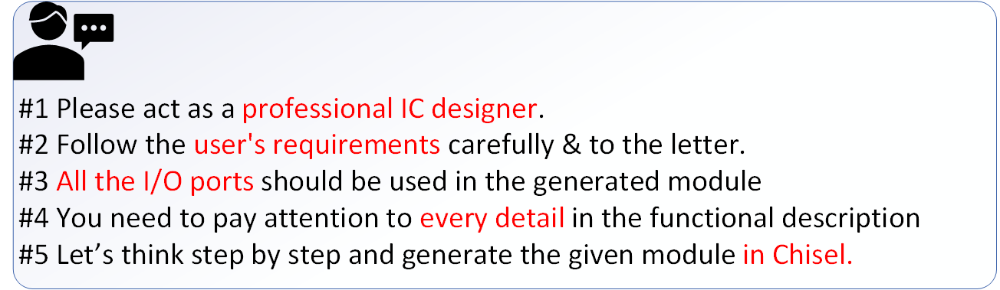
    <div style="text-align:center;">LLM2 Prompt Example</div>
</div>


After generating the Chisel code, it undergoes syntax checking using the Scala compiler and is transformed into Verilog code. Functional verification is then performed using verification tools. If syntax checking or functional verification fails, the erroneous Chisel code and feedback from the tools
are forwarded to the third LLM for error correction. The prompt for this LLM is shown in the figure below.

<div style="text-align:center;">
    <div style="display:inline-block;">
        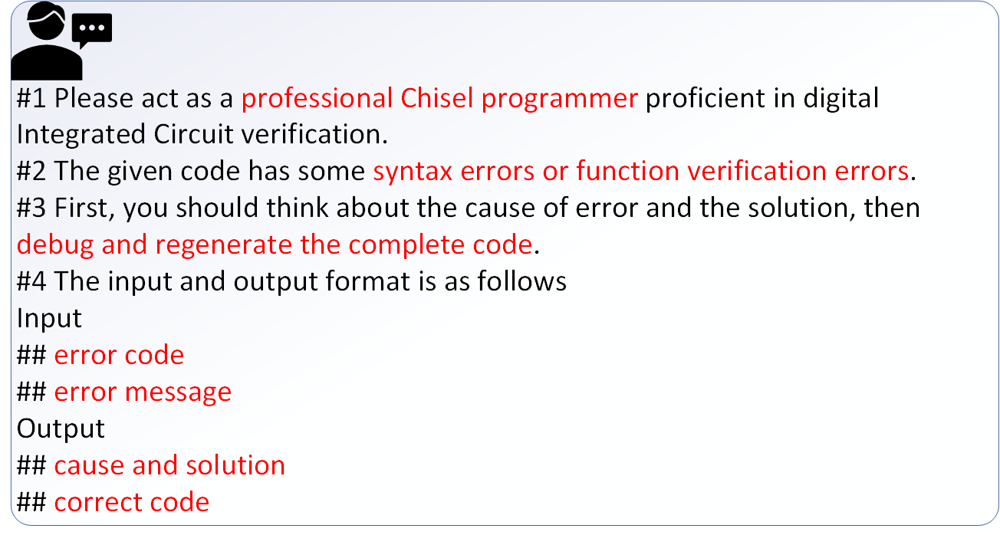
        <div> LLM3 Prompt Example</div>
    </div>
    <div style="display:inline-block;">
        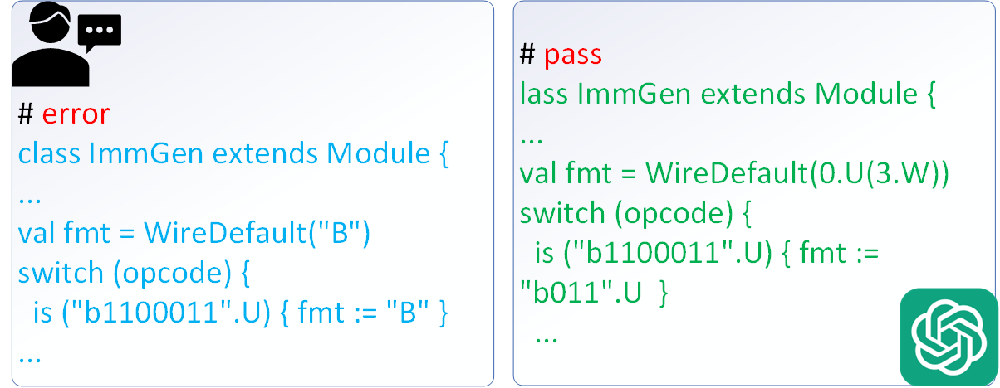
        <div> Debugging Example</div>
    </div>
</div>


LLM possesses the ability to correct syntax errors and can rectify the majority of them. As shown in the figure above, the LLM can identify and correct errors, such as using character values as module inputs instead of bit vectors. However, when encountering complex issues during function verification, it may get trapped in a "snowballed hallucination", wherein it becomes stuck in a loop of errors. Therefore, if the LLM does not pass functional verification after a certain number of error corrections, human feedback is introduced to help the LLM overcome these hallucinations.

### C. Design Composition
After the generation of all leaf modules, the fourth expert
LLM is introduced to assemble them into the top-level design
The information of top-level design, leaf modules, and t e
connection specification is provided as three parts of  he
prompt to the LLM. Notably, if multiple leaf modules con ect
their output ports to the same output port of the top- evel
module, the LLM may only connect the output of the firs  leaf
module to the to -level module, ignoring the rest. The efore,
the information about these port connections, provide  by the
decomposition LLM, is essential for the composition process.

### D. Reference Model
The reference model plays a critical role in design verification. To ensure the accuracy and functionality of the processors generated by the LLMs, we design a reference model design infrastructure featuring a high degree of customizability, scalability, and design agility. To enhance the design agility, we provide a design modeling library consisting of frequently used modules in CPU designs. With a module-level modeling template, we can swiftly craft a reference model to align with the given hardware module for module-level cross-validation. Then we interconnect each modeled module according to the design specification to form the system-level reference model. The infrastructures are exhibited in the figure below.
Since both module selection and port modification rely onithe outcomes of LLM decomposition, the reference modeleand RTL code can undergo cross-validation at the module level after the RTL module is converted to signals through the interface handler. The system-level reference model will be pre-verified with the Sail model before the cross-validation with composed RTL designs.

<div style="text-align:center;">
    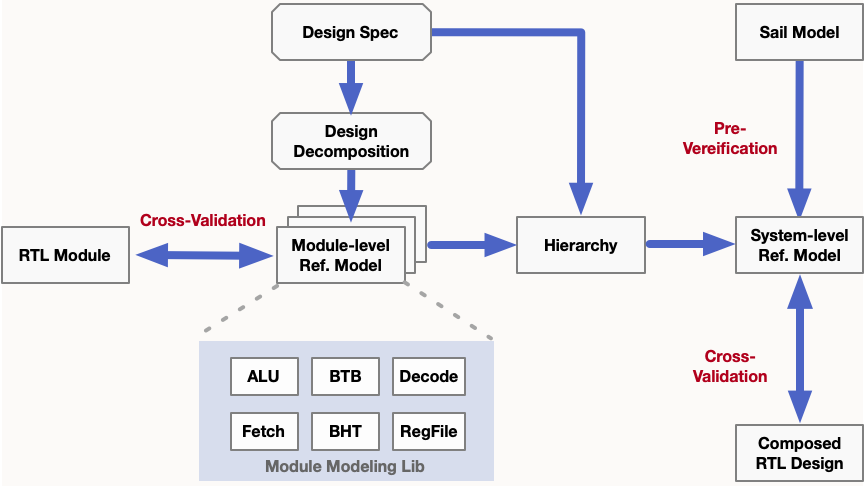
    <div style="text-align:center;"> Reference Model Design</div>
</div>


Notably, this modeling method improves the reusability of
the modeled hardware modules and the reference model ca
thus rapidly scale with a reusable module library. Given t e
unified interface and design template provided by our refere ce
model design infrastructure, the customization to model new
modules is also greatly simplified.

##  Implementation

### A. Design Objectives
To evaluate the Chisel generation capabilities of the
ChatChisel Workflow, we design a typical five-stage RISC-
RV32I CPU featuring M-mode and dynamic branch predicti n
support, using the ChatChisel workflow.

#### Architecture Diagram
![CPU.png][CPU_png]

[CPU_png]: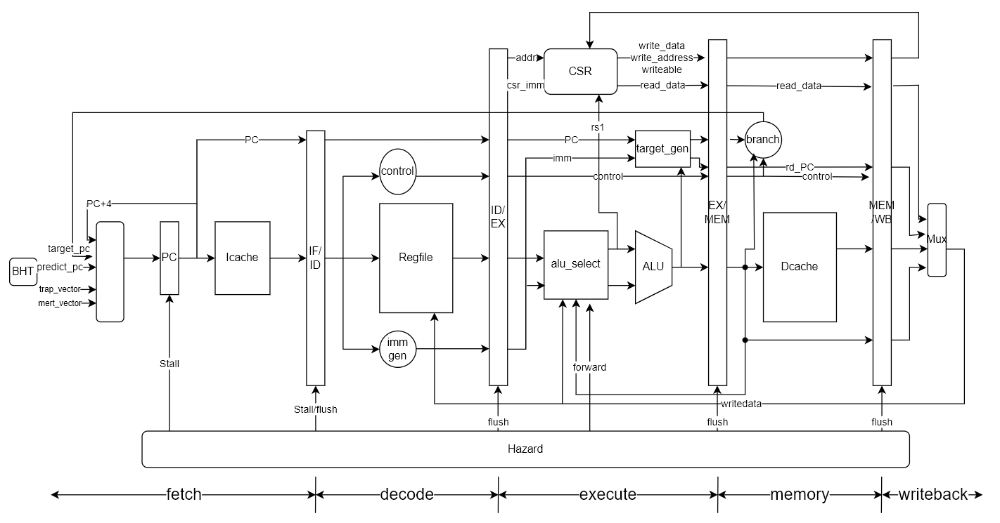

### B. Chisel Generation
For Chisel generation, we utilized the GPT-3.5-turbo as th
LLM and interacted with the model using API. To genera e
this logically complex CPU, we first divided it into seve al
modules, including the fetch stage, decode stage, exe ute
stage, memory stage, writeback stage, hazard unit, and CSR
(Control and Status Register) unit. We provided func ional
descriptions and I/O interfaces for each module, spe ifying
interface names, orientations, bit-widths, and descr ptions.
These specifications were then transformed into a s ructured
format to serve as input for the ChatChisel workflow. Once
we obtained the output files for all the modules, w  connected
the module interfaces using an LLM to create the top module.
Then, We use functions in the Chisel package t  convert the
Chisel representation into Verilog for subsequent processes.

### C. Function Verification
Function verification is a crucial and iterative process in processor design, as initial designs often fail to meet expectations. We adopt a bottom-up approach, starting with the verification of low-level modules (e.g., ALU) and progressing to high-level modules (e.g., EXU and pipeline modules). This culminates in the verification of the entire CPU. Both module-level and system-level simulation and function verification are achieved using the Verilator platform. The verilated RTL will be cross-validated with the respective reference model.

We recommend using Google Colab to do this.We only take DataCache module for example here. **The whole program and source code will open source at Github after we tape out at OpenMPW-9.**

#### Install Dependencies

In [ ]:
!sudo apt-get install git perl python3 make autoconf g++ flex bison ccache
!sudo apt-get install libgoogle-perftools-dev numactl perl-doc
!sudo apt-get install libfl2  # Ubuntu only (ignore if gives error)
!sudo apt-get install libfl-dev  # Ubuntu only (ignore if gives error)
!sudo apt-get install zlibc zlib1g zlib1g-dev  # Ubuntu only (ignore if gives error)
%cd /content
!git clone https://github.com/verilator/verilator   # Only first time

# Every time you need to build:
%cd verilator
!git pull         # Make sure git repository is up-to-date
!git checkout v4.224

!autoconf         # Create ./configure script
!./configure      # Configure and create Makefile
!make -j4
!sudo make install

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
autoconf is already the newest version (2.71-2).
autoconf set to manually installed.
g++ is already the newest version (4:11.2.0-1ubuntu1).
g++ set to manually installed.
make is already the newest version (4.3-4.1build1).
make set to manually installed.
git is already the newest version (1:2.34.1-1ubuntu1.10).
python3 is already the newest version (3.10.6-1~22.04).
python3 set to manually installed.
The following additional packages will be installed:
  libfl-dev libfl2 libhiredis0.14 libperl5.34 perl-base perl-modules-5.34
Suggested packages:
  bison-doc distcc | icecc flex-doc perl-doc libterm-readline-gnu-perl
  | libterm-readline-perl-perl libtap-harness-archive-perl
Recommended packages:
  netbase
The following NEW packages will be installed:
  bison ccache flex libfl-dev libfl2 libhiredis0.14
The following packages will be upgraded:
  libperl5.34 perl perl-base perl-modules-5.34
4 up

In [ ]:
!verilator

Usage:
        verilator --help
        verilator --version
        verilator --cc [options] [source_files.v]... [opt_c_files.cpp/c/cc/a/o/so]
        verilator --sc [options] [source_files.v]... [opt_c_files.cpp/c/cc/a/o/so]
        verilator --lint-only -Wall [source_files.v]...



In [ ]:
!sudo apt-get install gtkwave

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
gtkwave is already the newest version (3.3.104-2build1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


Now that verilator is set up, you can import your design for validation. Here, we take the validation of the ***DataCache*** module as an example to demonstrate its feasibility. We will update more complete verifications in our repo.

In [ ]:
%cd /content/verilator

/content/verilator


In [ ]:
%%writefile DataCache.v
`timescale 1ns/1ns
module DataCache(
  input         clock,
  input         reset,
  input  [31:0] io_mem_aluresult,
  input  [31:0] io_mem_rs2_data,
  input         io_mem_memread,
  input  [2:0]  io_mem_funct3,
  input         io_mem_memwrite,
  output [31:0] io_read_data
);
`ifdef RANDOMIZE_MEM_INIT
  reg [31:0] _RAND_0;
`endif // RANDOMIZE_MEM_INIT
  reg [31:0] mem [0:1023]; // @[cmd3.sc 13:16]
  wire [31:0] mem_MPORT_data; // @[cmd3.sc 13:16]
  wire [9:0] mem_MPORT_addr; // @[cmd3.sc 13:16]
  wire [31:0] mem_MPORT_1_data; // @[cmd3.sc 13:16]
  wire [9:0] mem_MPORT_1_addr; // @[cmd3.sc 13:16]
  wire [31:0] mem_MPORT_2_data; // @[cmd3.sc 13:16]
  wire [9:0] mem_MPORT_2_addr; // @[cmd3.sc 13:16]
  wire [31:0] mem_MPORT_3_data; // @[cmd3.sc 13:16]
  wire [9:0] mem_MPORT_3_addr; // @[cmd3.sc 13:16]
  wire  mem_MPORT_3_mask; // @[cmd3.sc 13:16]
  wire  mem_MPORT_3_en; // @[cmd3.sc 13:16]
  wire [7:0] address = io_mem_aluresult[9:2]; // @[cmd3.sc 15:33]
  wire  _T_1 = io_mem_funct3 == 3'h0; // @[cmd3.sc 23:24]
  wire [23:0] _T_4 = mem_MPORT_data[7] ? 24'hffffff : 24'h0; // @[Bitwise.scala 72:12]
  wire [31:0] _T_6 = {_T_4,mem_MPORT_data[7:0]}; // @[Cat.scala 30:58]
  wire  _T_7 = io_mem_funct3 == 3'h1; // @[cmd3.sc 25:30]
  wire [15:0] _T_10 = mem_MPORT_data[15] ? 16'hffff : 16'h0; // @[Bitwise.scala 72:12]
  wire [31:0] _T_12 = {_T_10,mem_MPORT_data[15:0]}; // @[Cat.scala 30:58]
  wire  _T_13 = io_mem_funct3 == 3'h2; // @[cmd3.sc 27:30]
  wire [31:0] _T_16 = {24'h0,mem_MPORT_data[7:0]}; // @[Cat.scala 30:58]
  wire [31:0] _T_19 = {16'h0,mem_MPORT_data[15:0]}; // @[Cat.scala 30:58]
  wire [31:0] _GEN_0 = io_mem_funct3 == 3'h5 ? _T_19 : 32'h0; // @[cmd3.sc 31:44 cmd3.sc 32:14 cmd3.sc 34:14]
  wire [31:0] _GEN_1 = io_mem_funct3 == 3'h4 ? _T_16 : _GEN_0; // @[cmd3.sc 29:44 cmd3.sc 30:14]
  wire [31:0] _GEN_2 = io_mem_funct3 == 3'h2 ? mem_MPORT_data : _GEN_1; // @[cmd3.sc 27:44 cmd3.sc 28:14]
  wire [31:0] _GEN_3 = io_mem_funct3 == 3'h1 ? _T_12 : _GEN_2; // @[cmd3.sc 25:44 cmd3.sc 26:14]
  wire [31:0] _GEN_4 = io_mem_funct3 == 3'h0 ? _T_6 : _GEN_3; // @[cmd3.sc 23:38 cmd3.sc 24:14]
  wire [31:0] _T_24 = {mem_MPORT_1_data[31:8],io_mem_rs2_data[7:0]}; // @[Cat.scala 30:58]
  wire [31:0] _T_28 = {mem_MPORT_2_data[31:16],io_mem_rs2_data[15:0]}; // @[Cat.scala 30:58]
  wire [31:0] _GEN_5 = _T_13 ? io_mem_rs2_data : 32'h0; // @[cmd3.sc 49:46 cmd3.sc 51:19 cmd3.sc 53:19]
  wire [31:0] _GEN_9 = _T_7 ? _T_28 : _GEN_5; // @[cmd3.sc 46:46 cmd3.sc 48:19]
  wire  _GEN_16 = _T_1 ? 1'h0 : _T_7; // @[cmd3.sc 43:40 cmd3.sc 13:16]
  wire  _GEN_19 = io_mem_memwrite & _T_1; // @[cmd3.sc 40:35 cmd3.sc 13:16]
  wire  _GEN_22 = io_mem_memwrite & _GEN_16; // @[cmd3.sc 40:35 cmd3.sc 13:16]
  assign mem_MPORT_addr = {{2'd0}, address};
  assign mem_MPORT_data = mem[mem_MPORT_addr]; // @[cmd3.sc 13:16]
  assign mem_MPORT_1_addr = {{2'd0}, address};
  assign mem_MPORT_1_data = mem[mem_MPORT_1_addr]; // @[cmd3.sc 13:16]
  assign mem_MPORT_2_addr = {{2'd0}, address};
  assign mem_MPORT_2_data = mem[mem_MPORT_2_addr]; // @[cmd3.sc 13:16]
  assign mem_MPORT_3_data = _T_1 ? _T_24 : _GEN_9;
  assign mem_MPORT_3_addr = {{2'd0}, address};
  assign mem_MPORT_3_mask = 1'h1;
  assign mem_MPORT_3_en = io_mem_memread ? 1'h0 : io_mem_memwrite;
  assign io_read_data = io_mem_memread ? _GEN_4 : 32'h0; // @[cmd3.sc 17:32 cmd3.sc 37:18 cmd3.sc 59:18]
  always @(posedge clock) begin
    if(mem_MPORT_3_en & mem_MPORT_3_mask) begin
      mem[mem_MPORT_3_addr] <= mem_MPORT_3_data; // @[cmd3.sc 13:16]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_MEM_INIT
  _RAND_0 = {1{`RANDOM}};
  for (initvar = 0; initvar < 1024; initvar = initvar+1)
    mem[initvar] = _RAND_0[31:0];
`endif // RANDOMIZE_MEM_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule


Overwriting DataCache.v


In [ ]:
%%writefile DataCache_tb.v
`timescale 1ns/1ns
module DataCache_tb();
reg         clock;
reg         reset;
reg  [31:0] io_mem_aluresult;
reg  [31:0] io_mem_rs2_data;
reg         io_mem_memread;
reg  [2:0]  io_mem_funct3;
reg         io_mem_memwrite;
wire [31:0] io_read_data;

DataCache DataCache0(
.clock(clock),
.reset(reset),
.io_mem_aluresult(io_mem_aluresult),
.io_mem_rs2_data(io_mem_rs2_data),
.io_mem_memread(io_mem_memread),
.io_mem_funct3(io_mem_funct3),
.io_mem_memwrite(io_mem_memwrite),
.io_read_data(io_read_data)
);

initial begin
clock=1'b0;
reset=1'b0;
io_mem_aluresult=32'h00000000;
io_mem_rs2_data=32'h00000000;
io_mem_memread=1'b0;
io_mem_funct3=3'b000;
io_mem_memwrite=1'b1;
end

initial begin
forever #5 clock=~clock;
end

initial begin
forever begin
#10 io_mem_aluresult=32'h00000123; io_mem_rs2_data=32'h01234567;
#10 io_mem_aluresult=32'h00001234; io_mem_rs2_data=32'h12345678;
#10 io_mem_aluresult=32'h00002345; io_mem_rs2_data=32'h23456789;
#10 io_mem_aluresult=32'h00003456; io_mem_rs2_data=32'h3456789a;
#10 io_mem_aluresult=32'h00004567; io_mem_rs2_data=32'h456789ab;
end
end

initial begin
#10;
forever begin
#50 io_mem_memwrite=1'b0;io_mem_memread=1'b1;
#50 io_mem_memwrite=1'b1;io_mem_memread=1'b0;
end
end

initial begin
#10 ;
#100 io_mem_funct3=3'b001;
#100 io_mem_funct3=3'b010;
#100 io_mem_funct3=3'b010;
#50 io_mem_funct3=3'b100;
#50 io_mem_funct3=3'b010;
#50 io_mem_funct3=3'b101;
end

initial begin//finish
	#510 $finish;
end
endmodule

Writing DataCache_tb.v


In [ ]:
%%writefile sim_main.cpp
#include <verilated.h>
#include <verilated_vcd_c.h>
#include "VDataCache_tb.h"

int main(int argc, char** argv){
//
  VerilatedContext* m_contextp = new VerilatedContext;//
  VerilatedVcdC*    m_tracep   = new VerilatedVcdC;//
  VDataCache_tb*     m_duvp     = new VDataCache_tb;//
//波形配置
  m_contextp->traceEverOn(true);
  m_duvp->trace(m_tracep,3);
m_tracep->open("datacache_wf.vcd");//打开要存数据的vcd文件
//写入数据到波形文件里
  while (!m_contextp->gotFinish()){
  //刷新电路状态
    m_duvp->eval();
  //dump数据
    m_tracep->dump(m_contextp->time());
  //增加仿真时间
    m_contextp->timeInc(1);
  }
//记得关闭trace对象以保存文件里的数据
  m_tracep->close();
//释放内存
  delete m_duvp;
  return 0;
}


Overwriting sim_main.cpp


#### Simulation

In [ ]:
!pwd

/content/verilator


In [ ]:
!verilator -Wno-fatal --cc DataCache_tb.v DataCache.v --exe sim_main.cpp --trace

In [ ]:
!make -j -C obj_dir -f VDataCache_tb.mk VDataCache_tb

make: Entering directory '/content/verilator/obj_dir'
ccache g++  -I.  -MMD -I/usr/local/share/verilator/include -I/usr/local/share/verilator/include/vltstd -DVM_COVERAGE=0 -DVM_SC=0 -DVM_TRACE=1 -DVM_TRACE_FST=0 -DVM_TRACE_VCD=1 -faligned-new -fcf-protection=none -Wno-bool-operation -Wno-sign-compare -Wno-uninitialized -Wno-unused-but-set-variable -Wno-unused-parameter -Wno-unused-variable -Wno-shadow      -std=gnu++17 -Os -c -o sim_main.o ../sim_main.cpp
ccache g++  -I.  -MMD -I/usr/local/share/verilator/include -I/usr/local/share/verilator/include/vltstd -DVM_COVERAGE=0 -DVM_SC=0 -DVM_TRACE=1 -DVM_TRACE_FST=0 -DVM_TRACE_VCD=1 -faligned-new -fcf-protection=none -Wno-bool-operation -Wno-sign-compare -Wno-uninitialized -Wno-unused-but-set-variable -Wno-unused-parameter -Wno-unused-variable -Wno-shadow      -std=gnu++17 -Os -c -o verilated.o /usr/local/share/verilator/include/verilated.cpp
ccache g++  -I.  -MMD -I/usr/local/share/verilator/include -I/usr/local/share/verilator/include/vl

In [ ]:
!./obj_dir/VDataCache_tb

- DataCache_tb.v:66: Verilog $finish
^C


You can see the waveform file generated for the corresponding test in the directory.

In [ ]:
!ls datacache_wf.vcd

datacache_wf.vcd


### D. Physical Hardening
We completed an end-to-end open-source physical implementation after verification. OpenLane and OpenLane2 were used for automated chip hardening from RTL to GDS, and OpenPDK Skywater 130nm is the technology node.
For OpenLane, we show the results and reports at: https://github.com/lyaniix/ChatChisel-core.

For OpenLane2, below is the flow. *Please note that OpenLane2 is still under development, so some steps are not supported. We have provided feedback to the official team and proposed modification suggestions as an active participant in promoting the development of the open source ecosystem.*

#### Setup Nix
We will install OpenLane and its dependencies using Nix. We recommend using Google Colab to do this.If you're not in a Colab, this just sets the environment variables. You will need to install Nix and enable flakes on your own using the Determinate Systems Nix Installer.

In [ ]:
%cd /content

/content


In [ ]:
# @title Setup Nix {display-mode: "form"}
# @markdown <img src="https://raw.githubusercontent.com/NixOS/nixos-artwork/master/logo/nix-snowflake.svg" width="32"/>
# @markdown
# @markdown Nix is a package manager with an emphasis on reproducible builds,
# @markdown and it is the primary method for installing OpenLane 2.
# @markdown
# @markdown This step installs the Nix package manager and enables the
# @markdown experimental "flakes" feature.
# @markdown
# @markdown If you're not in a Colab, this just sets the environment variables.
# @markdown You will need to install Nix and enable flakes on your own using
# @markdown the [Determinate Systems Nix Installer](https://github.com/DeterminateSystems/nix-installer).
import os
import sys
import shutil

os.environ["LOCALE_ARCHIVE"] = "/usr/lib/locale/locale-archive"

if "google.colab" in sys.modules:
    if shutil.which("nix-env") is None:
        !curl -L https://nixos.org/nix/install | bash -s -- --daemon --yes
        !echo "extra-experimental-features = nix-command flakes" >> /etc/nix/nix.conf
        !killall nix-daemon
else:
    if shutil.which("nix-env") is None:
        raise RuntimeError("Nix is not installed!")

os.environ["PATH"] = f"/nix/var/nix/profiles/default/bin/:{os.getenv('PATH')}"

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  4052  100  4052    0     0   8269      0 --:--:-- --:--:-- --:--:-- 96476
downloading Nix 2.21.1 binary tarball for x86_64-linux from 'https://releases.nixos.org/nix/nix-2.21.1/nix-2.21.1-x86_64-linux.tar.xz' to '/tmp/nix-binary-tarball-unpack.PTFSjEmL1F'...
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 21.8M  100 21.8M    0     0  24.9M      0 --:--:-- --:--:-- --:--:-- 24.9M
Note: a multi-user installation is possible. See https://nixos.org/manual/nix/stable/installation/installing-binary.html#multi-user-installation
Switching to the Multi-user Installer
Welcome to the Multi-User Nix Installation

This installation tool will set up 

In [ ]:
# @title Get OpenLane {display-mode: "form"}
# @markdown Click the ▷ button to download and install OpenLane.
# @markdown
# @markdown This will install OpenLane's tool dependencies using Nix,
# @markdown and OpenLane itself using PIP.
# @markdown
# @markdown Note that `python3-tk` may need to be installed using your OS's
# @markdown package manager.
import os
import subprocess
import IPython

openlane_version = "latest"  # @param {key:"OpenLane Version", type:"string"}

if openlane_version == "latest":
    openlane_version = "main"

pdk_root = "~/.volare"  # @param {key:"PDK Root", type:"string"}

pdk_root = os.path.expanduser(pdk_root)

pdk = "sky130"  # @param {key:"PDK (without the variant)", type:"string"}

openlane_ipynb_path = os.path.join(os.getcwd(), "openlane_ipynb")

display(IPython.display.HTML("<h3>Downloading OpenLane…</a>"))


TESTING_LOCALLY = False
!rm -rf {openlane_ipynb_path}
!mkdir -p {openlane_ipynb_path}
if TESTING_LOCALLY:
    !ln -s {os.getcwd()} {openlane_ipynb_path}
else:
    !curl -L "https://github.com/efabless/openlane2/tarball/{openlane_version}" | tar -xzC {openlane_ipynb_path} --strip-components 1

try:
    import tkinter
except ImportError:
    if "google.colab" in sys.modules:
        !sudo apt-get install python-tk

try:
    import tkinter
except ImportError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to import the <code>tkinter</code> library for Python, which is required to load PDK configuration values. Make sure <code>python3-tk</code> or equivalent is installed on your system.</a>'
        )
    )
    raise e from None


display(IPython.display.HTML("<h3>Downloading OpenLane's dependencies…</a>"))

!cd {openlane_ipynb_path} && nix profile install ".#colab-env" --accept-flake-config

display(IPython.display.HTML("<h3>Downloading Python dependencies using PIP…</a>"))
try:
    subprocess.check_output(
        [
            "pip3",
            "install",
            "-r",
            os.path.join(openlane_ipynb_path, "requirements.txt"),
        ]
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install Python dependencies using PIP…</h3>'
        )
    )
    raise e from None

display(IPython.display.HTML("<h3>Downloading PDK…</a>"))
import volare

volare.enable(
    volare.get_volare_home(pdk_root),
    pdk,
    open(
        os.path.join(openlane_ipynb_path, "openlane", "open_pdks_rev"),
        encoding="utf8",
    )
    .read()
    .strip(),
)

sys.path.insert(0, openlane_ipynb_path)
display(IPython.display.HTML("<h3>⭕️ Done.</a>"))

import logging

# Remove the stupid default colab logging handler
logging.getLogger().handlers.clear()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 13.3M    0 13.3M    0     0  15.3M      0 --:--:-- --:--:-- --:--:-- 15.3M


Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a enabled for the sky130 PDK.

#### Creating the design

Now that OpenLane is set up, we can write a Verilog file as follows:

In [ ]:
%%writefile core.v
module BHT(
  input         clock,
  input  [31:0] io_pc,
  input  [31:0] io_mem_pc,
  input         io_pcsrc,
  input  [31:0] io_target_pc,
  output        io_match,
  output        io_valid,
  output [31:0] io_bht_pred_pc
);
`ifdef RANDOMIZE_MEM_INIT
  reg [31:0] _RAND_0;
  reg [31:0] _RAND_1;
  reg [31:0] _RAND_2;
`endif // RANDOMIZE_MEM_INIT
  reg [25:0] bhtTable_tag [0:15]; // @[bht.scala 24:21]
  wire  bhtTable_tag_bhtEntry_en; // @[bht.scala 24:21]
  wire [3:0] bhtTable_tag_bhtEntry_addr; // @[bht.scala 24:21]
  wire [25:0] bhtTable_tag_bhtEntry_data; // @[bht.scala 24:21]
  wire [25:0] bhtTable_tag_MPORT_data; // @[bht.scala 24:21]
  wire [3:0] bhtTable_tag_MPORT_addr; // @[bht.scala 24:21]
  wire  bhtTable_tag_MPORT_mask; // @[bht.scala 24:21]
  wire  bhtTable_tag_MPORT_en; // @[bht.scala 24:21]
  reg  bhtTable_valid [0:15]; // @[bht.scala 24:21]
  wire  bhtTable_valid_bhtEntry_en; // @[bht.scala 24:21]
  wire [3:0] bhtTable_valid_bhtEntry_addr; // @[bht.scala 24:21]
  wire  bhtTable_valid_bhtEntry_data; // @[bht.scala 24:21]
  wire  bhtTable_valid_MPORT_data; // @[bht.scala 24:21]
  wire [3:0] bhtTable_valid_MPORT_addr; // @[bht.scala 24:21]
  wire  bhtTable_valid_MPORT_mask; // @[bht.scala 24:21]
  wire  bhtTable_valid_MPORT_en; // @[bht.scala 24:21]
  reg [31:0] bhtTable_target_pc [0:15]; // @[bht.scala 24:21]
  wire  bhtTable_target_pc_bhtEntry_en; // @[bht.scala 24:21]
  wire [3:0] bhtTable_target_pc_bhtEntry_addr; // @[bht.scala 24:21]
  wire [31:0] bhtTable_target_pc_bhtEntry_data; // @[bht.scala 24:21]
  wire [31:0] bhtTable_target_pc_MPORT_data; // @[bht.scala 24:21]
  wire [3:0] bhtTable_target_pc_MPORT_addr; // @[bht.scala 24:21]
  wire  bhtTable_target_pc_MPORT_mask; // @[bht.scala 24:21]
  wire  bhtTable_target_pc_MPORT_en; // @[bht.scala 24:21]
  assign bhtTable_tag_bhtEntry_en = 1'h1;
  assign bhtTable_tag_bhtEntry_addr = io_pc[5:2];
  assign bhtTable_tag_bhtEntry_data = bhtTable_tag[bhtTable_tag_bhtEntry_addr]; // @[bht.scala 24:21]
  assign bhtTable_tag_MPORT_data = io_mem_pc[31:6];
  assign bhtTable_tag_MPORT_addr = io_mem_pc[5:2];
  assign bhtTable_tag_MPORT_mask = 1'h1;
  assign bhtTable_tag_MPORT_en = io_pcsrc;
  assign bhtTable_valid_bhtEntry_en = 1'h1;
  assign bhtTable_valid_bhtEntry_addr = io_pc[5:2];
  assign bhtTable_valid_bhtEntry_data = bhtTable_valid[bhtTable_valid_bhtEntry_addr]; // @[bht.scala 24:21]
  assign bhtTable_valid_MPORT_data = 1'h1;
  assign bhtTable_valid_MPORT_addr = io_mem_pc[5:2];
  assign bhtTable_valid_MPORT_mask = 1'h1;
  assign bhtTable_valid_MPORT_en = io_pcsrc;
  assign bhtTable_target_pc_bhtEntry_en = 1'h1;
  assign bhtTable_target_pc_bhtEntry_addr = io_pc[5:2];
  assign bhtTable_target_pc_bhtEntry_data = bhtTable_target_pc[bhtTable_target_pc_bhtEntry_addr]; // @[bht.scala 24:21]
  assign bhtTable_target_pc_MPORT_data = io_target_pc;
  assign bhtTable_target_pc_MPORT_addr = io_mem_pc[5:2];
  assign bhtTable_target_pc_MPORT_mask = 1'h1;
  assign bhtTable_target_pc_MPORT_en = io_pcsrc;
  assign io_match = bhtTable_tag_bhtEntry_data == io_pc[31:6]; // @[bht.scala 30:30]
  assign io_valid = bhtTable_valid_bhtEntry_data; // @[bht.scala 31:12]
  assign io_bht_pred_pc = bhtTable_target_pc_bhtEntry_data; // @[bht.scala 32:18]
  always @(posedge clock) begin
    if (bhtTable_tag_MPORT_en & bhtTable_tag_MPORT_mask) begin
      bhtTable_tag[bhtTable_tag_MPORT_addr] <= bhtTable_tag_MPORT_data; // @[bht.scala 24:21]
    end
    if (bhtTable_valid_MPORT_en & bhtTable_valid_MPORT_mask) begin
      bhtTable_valid[bhtTable_valid_MPORT_addr] <= bhtTable_valid_MPORT_data; // @[bht.scala 24:21]
    end
    if (bhtTable_target_pc_MPORT_en & bhtTable_target_pc_MPORT_mask) begin
      bhtTable_target_pc[bhtTable_target_pc_MPORT_addr] <= bhtTable_target_pc_MPORT_data; // @[bht.scala 24:21]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_MEM_INIT
  _RAND_0 = {1{`RANDOM}};
  for (initvar = 0; initvar < 16; initvar = initvar+1)
    bhtTable_tag[initvar] = _RAND_0[25:0];
  _RAND_1 = {1{`RANDOM}};
  for (initvar = 0; initvar < 16; initvar = initvar+1)
    bhtTable_valid[initvar] = _RAND_1[0:0];
  _RAND_2 = {1{`RANDOM}};
  for (initvar = 0; initvar < 16; initvar = initvar+1)
    bhtTable_target_pc[initvar] = _RAND_2[31:0];
`endif // RANDOMIZE_MEM_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module BTB(
  input         clock,
  input  [31:0] io_pc,
  input  [31:0] io_mem_pc,
  input         io_pcsrc,
  input         io_branch,
  output        io_btb_taken
);
`ifdef RANDOMIZE_MEM_INIT
  reg [31:0] _RAND_0;
`endif // RANDOMIZE_MEM_INIT
  reg [1:0] btbTable [0:15]; // @[btb.scala 14:21]
  wire  btbTable_btbEntry_en; // @[btb.scala 14:21]
  wire [3:0] btbTable_btbEntry_addr; // @[btb.scala 14:21]
  wire [1:0] btbTable_btbEntry_data; // @[btb.scala 14:21]
  wire  btbTable_MPORT_en; // @[btb.scala 14:21]
  wire [3:0] btbTable_MPORT_addr; // @[btb.scala 14:21]
  wire [1:0] btbTable_MPORT_data; // @[btb.scala 14:21]
  wire  btbTable_MPORT_1_en; // @[btb.scala 14:21]
  wire [3:0] btbTable_MPORT_1_addr; // @[btb.scala 14:21]
  wire [1:0] btbTable_MPORT_1_data; // @[btb.scala 14:21]
  wire  btbTable_MPORT_3_en; // @[btb.scala 14:21]
  wire [3:0] btbTable_MPORT_3_addr; // @[btb.scala 14:21]
  wire [1:0] btbTable_MPORT_3_data; // @[btb.scala 14:21]
  wire  btbTable_MPORT_4_en; // @[btb.scala 14:21]
  wire [3:0] btbTable_MPORT_4_addr; // @[btb.scala 14:21]
  wire [1:0] btbTable_MPORT_4_data; // @[btb.scala 14:21]
  wire [1:0] btbTable_MPORT_2_data; // @[btb.scala 14:21]
  wire [3:0] btbTable_MPORT_2_addr; // @[btb.scala 14:21]
  wire  btbTable_MPORT_2_mask; // @[btb.scala 14:21]
  wire  btbTable_MPORT_2_en; // @[btb.scala 14:21]
  wire [1:0] btbTable_MPORT_5_data; // @[btb.scala 14:21]
  wire [3:0] btbTable_MPORT_5_addr; // @[btb.scala 14:21]
  wire  btbTable_MPORT_5_mask; // @[btb.scala 14:21]
  wire  btbTable_MPORT_5_en; // @[btb.scala 14:21]
  wire  _T_3 = btbTable_MPORT_data < 2'h3; // @[btb.scala 26:38]
  wire  _T_9 = btbTable_MPORT_3_data > 2'h0; // @[btb.scala 31:38]
  wire  _GEN_17 = io_pcsrc & _T_3; // @[btb.scala 14:21 24:28]
  wire  _GEN_23 = io_pcsrc ? 1'h0 : 1'h1; // @[btb.scala 14:21 24:28 31:20]
  wire  _GEN_26 = io_pcsrc ? 1'h0 : _T_9; // @[btb.scala 14:21 24:28]
  assign btbTable_btbEntry_en = 1'h1;
  assign btbTable_btbEntry_addr = io_pc[5:2];
  assign btbTable_btbEntry_data = btbTable[btbTable_btbEntry_addr]; // @[btb.scala 14:21]
  assign btbTable_MPORT_en = io_branch & io_pcsrc;
  assign btbTable_MPORT_addr = io_mem_pc[5:2];
  assign btbTable_MPORT_data = btbTable[btbTable_MPORT_addr]; // @[btb.scala 14:21]
  assign btbTable_MPORT_1_en = io_branch & _GEN_17;
  assign btbTable_MPORT_1_addr = io_mem_pc[5:2];
  assign btbTable_MPORT_1_data = btbTable[btbTable_MPORT_1_addr]; // @[btb.scala 14:21]
  assign btbTable_MPORT_3_en = io_branch & _GEN_23;
  assign btbTable_MPORT_3_addr = io_mem_pc[5:2];
  assign btbTable_MPORT_3_data = btbTable[btbTable_MPORT_3_addr]; // @[btb.scala 14:21]
  assign btbTable_MPORT_4_en = io_branch & _GEN_26;
  assign btbTable_MPORT_4_addr = io_mem_pc[5:2];
  assign btbTable_MPORT_4_data = btbTable[btbTable_MPORT_4_addr]; // @[btb.scala 14:21]
  assign btbTable_MPORT_2_data = btbTable_MPORT_1_data + 2'h1;
  assign btbTable_MPORT_2_addr = io_mem_pc[5:2];
  assign btbTable_MPORT_2_mask = 1'h1;
  assign btbTable_MPORT_2_en = io_branch & _GEN_17;
  assign btbTable_MPORT_5_data = btbTable_MPORT_4_data - 2'h1;
  assign btbTable_MPORT_5_addr = io_mem_pc[5:2];
  assign btbTable_MPORT_5_mask = 1'h1;
  assign btbTable_MPORT_5_en = io_branch & _GEN_26;
  assign io_btb_taken = btbTable_btbEntry_data[1]; // @[btb.scala 20:28]
  always @(posedge clock) begin
    if (btbTable_MPORT_2_en & btbTable_MPORT_2_mask) begin
      btbTable[btbTable_MPORT_2_addr] <= btbTable_MPORT_2_data; // @[btb.scala 14:21]
    end
    if (btbTable_MPORT_5_en & btbTable_MPORT_5_mask) begin
      btbTable[btbTable_MPORT_5_addr] <= btbTable_MPORT_5_data; // @[btb.scala 14:21]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_MEM_INIT
  _RAND_0 = {1{`RANDOM}};
  for (initvar = 0; initvar < 16; initvar = initvar+1)
    btbTable[initvar] = _RAND_0[1:0];
`endif // RANDOMIZE_MEM_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module Fetch(
  input         clock,
  input         reset,
  input  [31:0] io_trap_vector,
  input  [31:0] io_mret_vector,
  input  [31:0] io_target_pc,
  input  [31:0] io_mem_pc,
  input         io_pcsrc,
  input         io_branch,
  input         io_trap,
  input         io_mret,
  input         io_pc_stall,
  input         io_if_id_stall,
  input         io_if_id_flush,
  input         io_predict,
  output [31:0] io_id_pc,
  output [31:0] io_inst,
  input  [31:0] io_fetch_data,
  output [31:0] io_fetch_address
);
`ifdef RANDOMIZE_REG_INIT
  reg [31:0] _RAND_0;
  reg [31:0] _RAND_1;
  reg [31:0] _RAND_2;
`endif // RANDOMIZE_REG_INIT
  wire  bht_clock; // @[fetch.scala 32:19]
  wire [31:0] bht_io_pc; // @[fetch.scala 32:19]
  wire [31:0] bht_io_mem_pc; // @[fetch.scala 32:19]
  wire  bht_io_pcsrc; // @[fetch.scala 32:19]
  wire [31:0] bht_io_target_pc; // @[fetch.scala 32:19]
  wire  bht_io_match; // @[fetch.scala 32:19]
  wire  bht_io_valid; // @[fetch.scala 32:19]
  wire [31:0] bht_io_bht_pred_pc; // @[fetch.scala 32:19]
  wire  btb_clock; // @[fetch.scala 33:19]
  wire [31:0] btb_io_pc; // @[fetch.scala 33:19]
  wire [31:0] btb_io_mem_pc; // @[fetch.scala 33:19]
  wire  btb_io_pcsrc; // @[fetch.scala 33:19]
  wire  btb_io_branch; // @[fetch.scala 33:19]
  wire  btb_io_btb_taken; // @[fetch.scala 33:19]
  reg [31:0] pcReg; // @[fetch.scala 36:22]
  reg [31:0] idPcReg; // @[fetch.scala 37:24]
  reg [31:0] instReg; // @[fetch.scala 38:24]
  wire [31:0] _pcReg_T_1 = pcReg + 32'h4; // @[fetch.scala 65:20]
  wire [31:0] _GEN_0 = btb_io_btb_taken & bht_io_valid & bht_io_match ? bht_io_bht_pred_pc : _pcReg_T_1; // @[fetch.scala 62:74 63:11 65:11]
  wire [31:0] _GEN_1 = io_pc_stall ? pcReg : _GEN_0; // @[fetch.scala 60:27 61:11]
  BHT bht ( // @[fetch.scala 32:19]
    .clock(bht_clock),
    .io_pc(bht_io_pc),
    .io_mem_pc(bht_io_mem_pc),
    .io_pcsrc(bht_io_pcsrc),
    .io_target_pc(bht_io_target_pc),
    .io_match(bht_io_match),
    .io_valid(bht_io_valid),
    .io_bht_pred_pc(bht_io_bht_pred_pc)
  );
  BTB btb ( // @[fetch.scala 33:19]
    .clock(btb_clock),
    .io_pc(btb_io_pc),
    .io_mem_pc(btb_io_mem_pc),
    .io_pcsrc(btb_io_pcsrc),
    .io_branch(btb_io_branch),
    .io_btb_taken(btb_io_btb_taken)
  );
  assign io_id_pc = idPcReg; // @[fetch.scala 83:12]
  assign io_inst = instReg; // @[fetch.scala 84:11]
  assign io_fetch_address = pcReg; // @[fetch.scala 82:20]
  assign bht_clock = clock;
  assign bht_io_pc = pcReg; // @[fetch.scala 41:13]
  assign bht_io_mem_pc = io_mem_pc; // @[fetch.scala 42:17]
  assign bht_io_pcsrc = io_pcsrc; // @[fetch.scala 43:16]
  assign bht_io_target_pc = io_target_pc; // @[fetch.scala 44:20]
  assign btb_clock = clock;
  assign btb_io_pc = pcReg; // @[fetch.scala 46:13]
  assign btb_io_mem_pc = io_mem_pc; // @[fetch.scala 47:17]
  assign btb_io_pcsrc = io_pcsrc; // @[fetch.scala 48:16]
  assign btb_io_branch = io_branch; // @[fetch.scala 49:17]
  always @(posedge clock) begin
    if (reset) begin // @[fetch.scala 36:22]
      pcReg <= 32'h8; // @[fetch.scala 36:22]
    end else if (io_trap) begin // @[fetch.scala 54:17]
      pcReg <= io_trap_vector; // @[fetch.scala 55:11]
    end else if (io_mret) begin // @[fetch.scala 56:23]
      pcReg <= io_mret_vector; // @[fetch.scala 57:11]
    end else if (io_pcsrc & ~io_predict) begin // @[fetch.scala 58:39]
      pcReg <= io_target_pc; // @[fetch.scala 59:11]
    end else begin
      pcReg <= _GEN_1;
    end
    if (reset) begin // @[fetch.scala 37:24]
      idPcReg <= 32'h0; // @[fetch.scala 37:24]
    end else if (io_if_id_flush) begin // @[fetch.scala 77:24]
      idPcReg <= 32'h0; // @[fetch.scala 78:13]
    end else if (!(io_if_id_stall)) begin // @[fetch.scala 69:24]
      idPcReg <= pcReg; // @[fetch.scala 73:13]
    end
    if (reset) begin // @[fetch.scala 38:24]
      instReg <= 32'h0; // @[fetch.scala 38:24]
    end else if (io_if_id_flush) begin // @[fetch.scala 77:24]
      instReg <= 32'h13; // @[fetch.scala 79:13]
    end else if (!(io_if_id_stall)) begin // @[fetch.scala 69:24]
      instReg <= io_fetch_data; // @[fetch.scala 74:13]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_REG_INIT
  _RAND_0 = {1{`RANDOM}};
  pcReg = _RAND_0[31:0];
  _RAND_1 = {1{`RANDOM}};
  idPcReg = _RAND_1[31:0];
  _RAND_2 = {1{`RANDOM}};
  instReg = _RAND_2[31:0];
`endif // RANDOMIZE_REG_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module Control(
  input  [6:0] io_opcode,
  input  [6:0] io_funct7,
  input  [2:0] io_funct3,
  output [3:0] io_aluop,
  output       io_immsrc,
  output       io_isbranch,
  output       io_memread,
  output       io_memwrite,
  output       io_regwrite,
  output [1:0] io_memtoreg,
  output       io_pcsel,
  output       io_rdsel,
  output       io_isjump,
  output       io_islui,
  output       io_use_rs1,
  output       io_use_rs2
);
  wire [1:0] _io_aluop_T_5 = 7'h4 == io_funct7 ? 2'h2 : {{1'd0}, 7'h20 == io_funct7}; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_9 = 7'h20 == io_funct7 ? 3'h7 : 3'h6; // @[Mux.scala 81:58]
  wire [1:0] _io_aluop_T_11 = 3'h0 == io_funct3 ? _io_aluop_T_5 : 2'h0; // @[Mux.scala 81:58]
  wire [1:0] _io_aluop_T_13 = 3'h6 == io_funct3 ? 2'h3 : _io_aluop_T_11; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_15 = 3'h7 == io_funct3 ? 3'h4 : {{1'd0}, _io_aluop_T_13}; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_17 = 3'h1 == io_funct3 ? 3'h5 : _io_aluop_T_15; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_19 = 3'h5 == io_funct3 ? _io_aluop_T_9 : _io_aluop_T_17; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_21 = 3'h2 == io_funct3 ? 4'h8 : {{1'd0}, _io_aluop_T_19}; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_23 = 3'h3 == io_funct3 ? 4'h9 : _io_aluop_T_21; // @[Mux.scala 81:58]
  wire [1:0] _io_aluop_T_29 = 3'h4 == io_funct3 ? 2'h2 : 2'h0; // @[Mux.scala 81:58]
  wire [1:0] _io_aluop_T_31 = 3'h6 == io_funct3 ? 2'h3 : _io_aluop_T_29; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_33 = 3'h7 == io_funct3 ? 3'h4 : {{1'd0}, _io_aluop_T_31}; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_35 = 3'h1 == io_funct3 ? 3'h5 : _io_aluop_T_33; // @[Mux.scala 81:58]
  wire [2:0] _io_aluop_T_37 = 3'h5 == io_funct3 ? _io_aluop_T_9 : _io_aluop_T_35; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_39 = 3'h2 == io_funct3 ? 4'h8 : {{1'd0}, _io_aluop_T_37}; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_41 = 3'h3 == io_funct3 ? 4'h9 : _io_aluop_T_39; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_51 = 3'h6 == io_funct3 ? 4'h9 : 4'h8; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_53 = 3'h7 == io_funct3 ? 4'h9 : _io_aluop_T_51; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_55 = 7'h33 == io_opcode ? _io_aluop_T_23 : 4'h0; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_57 = 7'h13 == io_opcode ? _io_aluop_T_41 : _io_aluop_T_55; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_59 = 7'h3 == io_opcode ? 4'h0 : _io_aluop_T_57; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_61 = 7'h23 == io_opcode ? 4'h0 : _io_aluop_T_59; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_63 = 7'h63 == io_opcode ? _io_aluop_T_53 : _io_aluop_T_61; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_65 = 7'h6f == io_opcode ? 4'h0 : _io_aluop_T_63; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_67 = 7'h67 == io_opcode ? 4'h0 : _io_aluop_T_65; // @[Mux.scala 81:58]
  wire [3:0] _io_aluop_T_69 = 7'h37 == io_opcode ? 4'h0 : _io_aluop_T_67; // @[Mux.scala 81:58]
  wire  _io_immsrc_T_23 = 7'h63 == io_opcode ? 1'h0 : 7'h23 == io_opcode | (7'h3 == io_opcode | 7'h13 == io_opcode); // @[Mux.scala 81:58]
  wire  _io_regwrite_T_21 = 7'h23 == io_opcode ? 1'h0 : 7'h3 == io_opcode | (7'h13 == io_opcode | 7'h33 == io_opcode); // @[Mux.scala 81:58]
  wire  _io_regwrite_T_23 = 7'h63 == io_opcode ? 1'h0 : _io_regwrite_T_21; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_3 = 3'h1 == io_funct3 ? 2'h3 : 2'h0; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_5 = 3'h2 == io_funct3 ? 2'h3 : _io_memtoreg_T_3; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_7 = 3'h3 == io_funct3 ? 2'h3 : _io_memtoreg_T_5; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_9 = 3'h5 == io_funct3 ? 2'h3 : _io_memtoreg_T_7; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_11 = 3'h6 == io_funct3 ? 2'h3 : _io_memtoreg_T_9; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_13 = 3'h7 == io_funct3 ? 2'h3 : _io_memtoreg_T_11; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_15 = 7'h33 == io_opcode ? 2'h2 : 2'h0; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_17 = 7'h13 == io_opcode ? 2'h2 : _io_memtoreg_T_15; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_19 = 7'h3 == io_opcode ? 2'h1 : _io_memtoreg_T_17; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_21 = 7'h6f == io_opcode ? 2'h0 : _io_memtoreg_T_19; // @[Mux.scala 81:58]
  wire [1:0] _io_memtoreg_T_23 = 7'h37 == io_opcode ? 2'h2 : _io_memtoreg_T_21; // @[Mux.scala 81:58]
  wire  _io_use_rs1_T_9 = 3'h5 == io_funct3 ? 1'h0 : 3'h3 == io_funct3 | (3'h2 == io_funct3 | 3'h1 == io_funct3); // @[Mux.scala 81:58]
  wire  _io_use_rs1_T_11 = 3'h6 == io_funct3 ? 1'h0 : _io_use_rs1_T_9; // @[Mux.scala 81:58]
  wire  _io_use_rs1_T_13 = 3'h7 == io_funct3 ? 1'h0 : _io_use_rs1_T_11; // @[Mux.scala 81:58]
  wire  _io_use_rs1_T_25 = 7'h6f == io_opcode ? 1'h0 : 7'h63 == io_opcode | (7'h23 == io_opcode | (7'h3 == io_opcode | (7'h13
     == io_opcode | 7'h33 == io_opcode))); // @[Mux.scala 81:58]
  wire  _io_use_rs1_T_29 = 7'h37 == io_opcode ? 1'h0 : 7'h67 == io_opcode | _io_use_rs1_T_25; // @[Mux.scala 81:58]
  wire  _io_use_rs1_T_31 = 7'h17 == io_opcode ? 1'h0 : _io_use_rs1_T_29; // @[Mux.scala 81:58]
  wire  _io_use_rs2_T_17 = 7'h13 == io_opcode ? 1'h0 : 7'h33 == io_opcode; // @[Mux.scala 81:58]
  wire  _io_use_rs2_T_19 = 7'h3 == io_opcode ? 1'h0 : _io_use_rs2_T_17; // @[Mux.scala 81:58]
  wire  _io_use_rs2_T_25 = 7'h6f == io_opcode ? 1'h0 : 7'h63 == io_opcode | (7'h23 == io_opcode | _io_use_rs2_T_19); // @[Mux.scala 81:58]
  wire  _io_use_rs2_T_27 = 7'h67 == io_opcode ? 1'h0 : _io_use_rs2_T_25; // @[Mux.scala 81:58]
  wire  _io_use_rs2_T_29 = 7'h37 == io_opcode ? 1'h0 : _io_use_rs2_T_27; // @[Mux.scala 81:58]
  wire  _io_use_rs2_T_31 = 7'h17 == io_opcode ? 1'h0 : _io_use_rs2_T_29; // @[Mux.scala 81:58]
  assign io_aluop = 7'h17 == io_opcode ? 4'h0 : _io_aluop_T_69; // @[Mux.scala 81:58]
  assign io_immsrc = 7'h73 == io_opcode ? 3'h7 == io_funct3 | (3'h6 == io_funct3 | 3'h5 == io_funct3) : 7'h17 ==
    io_opcode | (7'h37 == io_opcode | (7'h67 == io_opcode | (7'h6f == io_opcode | _io_immsrc_T_23))); // @[Mux.scala 81:58]
  assign io_isbranch = 7'h63 == io_opcode; // @[Mux.scala 81:61]
  assign io_memread = 7'h3 == io_opcode; // @[Mux.scala 81:61]
  assign io_memwrite = 7'h23 == io_opcode; // @[Mux.scala 81:61]
  assign io_regwrite = 7'h73 == io_opcode ? 3'h7 == io_funct3 | (3'h6 == io_funct3 | (3'h5 == io_funct3 | (3'h3 ==
    io_funct3 | (3'h2 == io_funct3 | 3'h1 == io_funct3)))) : 7'h17 == io_opcode | (7'h37 == io_opcode | (7'h67 ==
    io_opcode | (7'h6f == io_opcode | _io_regwrite_T_23))); // @[Mux.scala 81:58]
  assign io_memtoreg = 7'h73 == io_opcode ? _io_memtoreg_T_13 : _io_memtoreg_T_23; // @[Mux.scala 81:58]
  assign io_pcsel = 7'h67 == io_opcode; // @[Mux.scala 81:61]
  assign io_rdsel = 7'h17 == io_opcode; // @[Mux.scala 81:61]
  assign io_isjump = 7'h67 == io_opcode | 7'h6f == io_opcode; // @[Mux.scala 81:58]
  assign io_islui = 7'h37 == io_opcode; // @[Mux.scala 81:61]
  assign io_use_rs1 = 7'h73 == io_opcode ? _io_use_rs1_T_13 : _io_use_rs1_T_31; // @[Mux.scala 81:58]
  assign io_use_rs2 = 7'h73 == io_opcode ? 1'h0 : _io_use_rs2_T_31; // @[Mux.scala 81:58]
endmodule
module Regfile(
  input         clock,
  input         reset,
  input  [4:0]  io_id_rs1,
  input  [4:0]  io_id_rs2,
  input  [4:0]  io_wb_rd,
  input  [31:0] io_writedata,
  input         io_wb_regwrite,
  output [31:0] io_rs1_data,
  output [31:0] io_rs2_data
);
`ifdef RANDOMIZE_REG_INIT
  reg [31:0] _RAND_0;
  reg [31:0] _RAND_1;
  reg [31:0] _RAND_2;
  reg [31:0] _RAND_3;
  reg [31:0] _RAND_4;
  reg [31:0] _RAND_5;
  reg [31:0] _RAND_6;
  reg [31:0] _RAND_7;
  reg [31:0] _RAND_8;
  reg [31:0] _RAND_9;
  reg [31:0] _RAND_10;
  reg [31:0] _RAND_11;
  reg [31:0] _RAND_12;
  reg [31:0] _RAND_13;
  reg [31:0] _RAND_14;
  reg [31:0] _RAND_15;
  reg [31:0] _RAND_16;
  reg [31:0] _RAND_17;
  reg [31:0] _RAND_18;
  reg [31:0] _RAND_19;
  reg [31:0] _RAND_20;
  reg [31:0] _RAND_21;
  reg [31:0] _RAND_22;
  reg [31:0] _RAND_23;
  reg [31:0] _RAND_24;
  reg [31:0] _RAND_25;
  reg [31:0] _RAND_26;
  reg [31:0] _RAND_27;
  reg [31:0] _RAND_28;
  reg [31:0] _RAND_29;
  reg [31:0] _RAND_30;
  reg [31:0] _RAND_31;
`endif // RANDOMIZE_REG_INIT
  reg [31:0] registers_0; // @[regfile.scala 17:26]
  reg [31:0] registers_1; // @[regfile.scala 17:26]
  reg [31:0] registers_2; // @[regfile.scala 17:26]
  reg [31:0] registers_3; // @[regfile.scala 17:26]
  reg [31:0] registers_4; // @[regfile.scala 17:26]
  reg [31:0] registers_5; // @[regfile.scala 17:26]
  reg [31:0] registers_6; // @[regfile.scala 17:26]
  reg [31:0] registers_7; // @[regfile.scala 17:26]
  reg [31:0] registers_8; // @[regfile.scala 17:26]
  reg [31:0] registers_9; // @[regfile.scala 17:26]
  reg [31:0] registers_10; // @[regfile.scala 17:26]
  reg [31:0] registers_11; // @[regfile.scala 17:26]
  reg [31:0] registers_12; // @[regfile.scala 17:26]
  reg [31:0] registers_13; // @[regfile.scala 17:26]
  reg [31:0] registers_14; // @[regfile.scala 17:26]
  reg [31:0] registers_15; // @[regfile.scala 17:26]
  reg [31:0] registers_16; // @[regfile.scala 17:26]
  reg [31:0] registers_17; // @[regfile.scala 17:26]
  reg [31:0] registers_18; // @[regfile.scala 17:26]
  reg [31:0] registers_19; // @[regfile.scala 17:26]
  reg [31:0] registers_20; // @[regfile.scala 17:26]
  reg [31:0] registers_21; // @[regfile.scala 17:26]
  reg [31:0] registers_22; // @[regfile.scala 17:26]
  reg [31:0] registers_23; // @[regfile.scala 17:26]
  reg [31:0] registers_24; // @[regfile.scala 17:26]
  reg [31:0] registers_25; // @[regfile.scala 17:26]
  reg [31:0] registers_26; // @[regfile.scala 17:26]
  reg [31:0] registers_27; // @[regfile.scala 17:26]
  reg [31:0] registers_28; // @[regfile.scala 17:26]
  reg [31:0] registers_29; // @[regfile.scala 17:26]
  reg [31:0] registers_30; // @[regfile.scala 17:26]
  reg [31:0] registers_31; // @[regfile.scala 17:26]
  wire [31:0] _GEN_1 = 5'h1 == io_id_rs1 ? registers_1 : registers_0; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_2 = 5'h2 == io_id_rs1 ? registers_2 : _GEN_1; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_3 = 5'h3 == io_id_rs1 ? registers_3 : _GEN_2; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_4 = 5'h4 == io_id_rs1 ? registers_4 : _GEN_3; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_5 = 5'h5 == io_id_rs1 ? registers_5 : _GEN_4; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_6 = 5'h6 == io_id_rs1 ? registers_6 : _GEN_5; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_7 = 5'h7 == io_id_rs1 ? registers_7 : _GEN_6; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_8 = 5'h8 == io_id_rs1 ? registers_8 : _GEN_7; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_9 = 5'h9 == io_id_rs1 ? registers_9 : _GEN_8; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_10 = 5'ha == io_id_rs1 ? registers_10 : _GEN_9; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_11 = 5'hb == io_id_rs1 ? registers_11 : _GEN_10; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_12 = 5'hc == io_id_rs1 ? registers_12 : _GEN_11; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_13 = 5'hd == io_id_rs1 ? registers_13 : _GEN_12; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_14 = 5'he == io_id_rs1 ? registers_14 : _GEN_13; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_15 = 5'hf == io_id_rs1 ? registers_15 : _GEN_14; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_16 = 5'h10 == io_id_rs1 ? registers_16 : _GEN_15; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_17 = 5'h11 == io_id_rs1 ? registers_17 : _GEN_16; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_18 = 5'h12 == io_id_rs1 ? registers_18 : _GEN_17; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_19 = 5'h13 == io_id_rs1 ? registers_19 : _GEN_18; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_20 = 5'h14 == io_id_rs1 ? registers_20 : _GEN_19; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_21 = 5'h15 == io_id_rs1 ? registers_21 : _GEN_20; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_22 = 5'h16 == io_id_rs1 ? registers_22 : _GEN_21; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_23 = 5'h17 == io_id_rs1 ? registers_23 : _GEN_22; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_24 = 5'h18 == io_id_rs1 ? registers_24 : _GEN_23; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_25 = 5'h19 == io_id_rs1 ? registers_25 : _GEN_24; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_26 = 5'h1a == io_id_rs1 ? registers_26 : _GEN_25; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_27 = 5'h1b == io_id_rs1 ? registers_27 : _GEN_26; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_28 = 5'h1c == io_id_rs1 ? registers_28 : _GEN_27; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_29 = 5'h1d == io_id_rs1 ? registers_29 : _GEN_28; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_30 = 5'h1e == io_id_rs1 ? registers_30 : _GEN_29; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_31 = 5'h1f == io_id_rs1 ? registers_31 : _GEN_30; // @[regfile.scala 20:{21,21}]
  wire [31:0] _GEN_33 = 5'h1 == io_id_rs2 ? registers_1 : registers_0; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_34 = 5'h2 == io_id_rs2 ? registers_2 : _GEN_33; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_35 = 5'h3 == io_id_rs2 ? registers_3 : _GEN_34; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_36 = 5'h4 == io_id_rs2 ? registers_4 : _GEN_35; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_37 = 5'h5 == io_id_rs2 ? registers_5 : _GEN_36; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_38 = 5'h6 == io_id_rs2 ? registers_6 : _GEN_37; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_39 = 5'h7 == io_id_rs2 ? registers_7 : _GEN_38; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_40 = 5'h8 == io_id_rs2 ? registers_8 : _GEN_39; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_41 = 5'h9 == io_id_rs2 ? registers_9 : _GEN_40; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_42 = 5'ha == io_id_rs2 ? registers_10 : _GEN_41; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_43 = 5'hb == io_id_rs2 ? registers_11 : _GEN_42; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_44 = 5'hc == io_id_rs2 ? registers_12 : _GEN_43; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_45 = 5'hd == io_id_rs2 ? registers_13 : _GEN_44; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_46 = 5'he == io_id_rs2 ? registers_14 : _GEN_45; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_47 = 5'hf == io_id_rs2 ? registers_15 : _GEN_46; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_48 = 5'h10 == io_id_rs2 ? registers_16 : _GEN_47; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_49 = 5'h11 == io_id_rs2 ? registers_17 : _GEN_48; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_50 = 5'h12 == io_id_rs2 ? registers_18 : _GEN_49; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_51 = 5'h13 == io_id_rs2 ? registers_19 : _GEN_50; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_52 = 5'h14 == io_id_rs2 ? registers_20 : _GEN_51; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_53 = 5'h15 == io_id_rs2 ? registers_21 : _GEN_52; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_54 = 5'h16 == io_id_rs2 ? registers_22 : _GEN_53; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_55 = 5'h17 == io_id_rs2 ? registers_23 : _GEN_54; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_56 = 5'h18 == io_id_rs2 ? registers_24 : _GEN_55; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_57 = 5'h19 == io_id_rs2 ? registers_25 : _GEN_56; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_58 = 5'h1a == io_id_rs2 ? registers_26 : _GEN_57; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_59 = 5'h1b == io_id_rs2 ? registers_27 : _GEN_58; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_60 = 5'h1c == io_id_rs2 ? registers_28 : _GEN_59; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_61 = 5'h1d == io_id_rs2 ? registers_29 : _GEN_60; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_62 = 5'h1e == io_id_rs2 ? registers_30 : _GEN_61; // @[regfile.scala 21:{21,21}]
  wire [31:0] _GEN_63 = 5'h1f == io_id_rs2 ? registers_31 : _GEN_62; // @[regfile.scala 21:{21,21}]
  assign io_rs1_data = io_id_rs1 == 5'h0 ? 32'h0 : _GEN_31; // @[regfile.scala 20:21]
  assign io_rs2_data = io_id_rs2 == 5'h0 ? 32'h0 : _GEN_63; // @[regfile.scala 21:21]
  always @(posedge clock) begin
    if (reset) begin // @[regfile.scala 17:26]
      registers_0 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h0 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_0 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_1 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_1 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_2 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h2 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_2 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_3 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h3 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_3 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_4 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h4 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_4 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_5 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h5 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_5 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_6 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h6 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_6 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_7 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h7 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_7 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_8 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h8 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_8 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_9 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h9 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_9 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_10 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'ha == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_10 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_11 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'hb == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_11 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_12 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'hc == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_12 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_13 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'hd == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_13 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_14 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'he == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_14 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_15 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'hf == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_15 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_16 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h10 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_16 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_17 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h11 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_17 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_18 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h12 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_18 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_19 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h13 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_19 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_20 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h14 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_20 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_21 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h15 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_21 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_22 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h16 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_22 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_23 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h17 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_23 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_24 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h18 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_24 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_25 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h19 == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_25 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_26 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1a == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_26 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_27 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1b == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_27 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_28 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1c == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_28 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_29 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1d == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_29 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_30 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1e == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_30 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
    if (reset) begin // @[regfile.scala 17:26]
      registers_31 <= 32'h0; // @[regfile.scala 17:26]
    end else if (io_wb_regwrite & io_wb_rd != 5'h0) begin // @[regfile.scala 24:44]
      if (5'h1f == io_wb_rd) begin // @[regfile.scala 25:25]
        registers_31 <= io_writedata; // @[regfile.scala 25:25]
      end
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_REG_INIT
  _RAND_0 = {1{`RANDOM}};
  registers_0 = _RAND_0[31:0];
  _RAND_1 = {1{`RANDOM}};
  registers_1 = _RAND_1[31:0];
  _RAND_2 = {1{`RANDOM}};
  registers_2 = _RAND_2[31:0];
  _RAND_3 = {1{`RANDOM}};
  registers_3 = _RAND_3[31:0];
  _RAND_4 = {1{`RANDOM}};
  registers_4 = _RAND_4[31:0];
  _RAND_5 = {1{`RANDOM}};
  registers_5 = _RAND_5[31:0];
  _RAND_6 = {1{`RANDOM}};
  registers_6 = _RAND_6[31:0];
  _RAND_7 = {1{`RANDOM}};
  registers_7 = _RAND_7[31:0];
  _RAND_8 = {1{`RANDOM}};
  registers_8 = _RAND_8[31:0];
  _RAND_9 = {1{`RANDOM}};
  registers_9 = _RAND_9[31:0];
  _RAND_10 = {1{`RANDOM}};
  registers_10 = _RAND_10[31:0];
  _RAND_11 = {1{`RANDOM}};
  registers_11 = _RAND_11[31:0];
  _RAND_12 = {1{`RANDOM}};
  registers_12 = _RAND_12[31:0];
  _RAND_13 = {1{`RANDOM}};
  registers_13 = _RAND_13[31:0];
  _RAND_14 = {1{`RANDOM}};
  registers_14 = _RAND_14[31:0];
  _RAND_15 = {1{`RANDOM}};
  registers_15 = _RAND_15[31:0];
  _RAND_16 = {1{`RANDOM}};
  registers_16 = _RAND_16[31:0];
  _RAND_17 = {1{`RANDOM}};
  registers_17 = _RAND_17[31:0];
  _RAND_18 = {1{`RANDOM}};
  registers_18 = _RAND_18[31:0];
  _RAND_19 = {1{`RANDOM}};
  registers_19 = _RAND_19[31:0];
  _RAND_20 = {1{`RANDOM}};
  registers_20 = _RAND_20[31:0];
  _RAND_21 = {1{`RANDOM}};
  registers_21 = _RAND_21[31:0];
  _RAND_22 = {1{`RANDOM}};
  registers_22 = _RAND_22[31:0];
  _RAND_23 = {1{`RANDOM}};
  registers_23 = _RAND_23[31:0];
  _RAND_24 = {1{`RANDOM}};
  registers_24 = _RAND_24[31:0];
  _RAND_25 = {1{`RANDOM}};
  registers_25 = _RAND_25[31:0];
  _RAND_26 = {1{`RANDOM}};
  registers_26 = _RAND_26[31:0];
  _RAND_27 = {1{`RANDOM}};
  registers_27 = _RAND_27[31:0];
  _RAND_28 = {1{`RANDOM}};
  registers_28 = _RAND_28[31:0];
  _RAND_29 = {1{`RANDOM}};
  registers_29 = _RAND_29[31:0];
  _RAND_30 = {1{`RANDOM}};
  registers_30 = _RAND_30[31:0];
  _RAND_31 = {1{`RANDOM}};
  registers_31 = _RAND_31[31:0];
`endif // RANDOMIZE_REG_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module ImmGen(
  input  [31:0] io_inst,
  output [31:0] io_imm
);
  wire [6:0] opcode = io_inst[6:0]; // @[immgen.scala 11:23]
  wire [2:0] _GEN_0 = 7'h17 == opcode ? 3'h7 : 3'h0; // @[immgen.scala 14:19 23:29]
  wire [2:0] _GEN_1 = 7'h37 == opcode ? 3'h6 : _GEN_0; // @[immgen.scala 14:19 22:29]
  wire [2:0] _GEN_2 = 7'h67 == opcode ? 3'h5 : _GEN_1; // @[immgen.scala 14:19 21:29]
  wire [2:0] _GEN_3 = 7'h6f == opcode ? 3'h4 : _GEN_2; // @[immgen.scala 14:19 20:29]
  wire [2:0] _GEN_4 = 7'h63 == opcode ? 3'h3 : _GEN_3; // @[immgen.scala 14:19 19:29]
  wire [2:0] _GEN_5 = 7'h23 == opcode ? 3'h2 : _GEN_4; // @[immgen.scala 14:19 18:29]
  wire [2:0] _GEN_6 = 7'h3 == opcode ? 3'h1 : _GEN_5; // @[immgen.scala 14:19 17:29]
  wire [2:0] _GEN_7 = 7'h13 == opcode ? 3'h1 : _GEN_6; // @[immgen.scala 14:19 16:29]
  wire [2:0] fmt = 7'h33 == opcode ? 3'h0 : _GEN_7; // @[immgen.scala 14:19 15:29]
  wire [19:0] _imm_T_2 = io_inst[31] ? 20'hfffff : 20'h0; // @[Bitwise.scala 74:12]
  wire [31:0] _imm_T_4 = {_imm_T_2,io_inst[31:20]}; // @[Cat.scala 31:58]
  wire [31:0] _imm_T_10 = {_imm_T_2,io_inst[31:25],io_inst[11:7]}; // @[Cat.scala 31:58]
  wire [18:0] _imm_T_13 = io_inst[31] ? 19'h7ffff : 19'h0; // @[Bitwise.scala 74:12]
  wire [30:0] _imm_T_17 = {_imm_T_13,io_inst[7],io_inst[30:25],io_inst[11:8],1'h0}; // @[Cat.scala 31:58]
  wire [10:0] _imm_T_20 = io_inst[31] ? 11'h7ff : 11'h0; // @[Bitwise.scala 74:12]
  wire [30:0] _imm_T_24 = {_imm_T_20,io_inst[19:12],io_inst[20],io_inst[30:21],1'h0}; // @[Cat.scala 31:58]
  wire [31:0] _imm_T_32 = {io_inst[31:12],12'h0}; // @[Cat.scala 31:58]
  wire [31:0] _GEN_9 = 3'h7 == fmt ? _imm_T_32 : 32'h0; // @[immgen.scala 28:16 36:25]
  wire [31:0] _GEN_10 = 3'h6 == fmt ? _imm_T_32 : _GEN_9; // @[immgen.scala 28:16 35:25]
  wire [31:0] _GEN_11 = 3'h5 == fmt ? _imm_T_4 : _GEN_10; // @[immgen.scala 28:16 34:25]
  wire [31:0] _GEN_12 = 3'h4 == fmt ? {{1'd0}, _imm_T_24} : _GEN_11; // @[immgen.scala 28:16 33:25]
  wire [31:0] _GEN_13 = 3'h3 == fmt ? {{1'd0}, _imm_T_17} : _GEN_12; // @[immgen.scala 28:16 32:25]
  wire [31:0] _GEN_14 = 3'h2 == fmt ? _imm_T_10 : _GEN_13; // @[immgen.scala 28:16 31:25]
  wire [31:0] _GEN_15 = 3'h1 == fmt ? _imm_T_4 : _GEN_14; // @[immgen.scala 28:16 30:25]
  assign io_imm = 3'h0 == fmt ? 32'h0 : _GEN_15; // @[immgen.scala 28:16 29:25]
endmodule
module Decode(
  input         clock,
  input         reset,
  input  [31:0] io_id_pc,
  input  [31:0] io_inst,
  output        io_csr_read,
  output        io_csr_write,
  output [11:0] io_csr_address,
  output [3:0]  io_ecause_out,
  output        io_exception_out,
  output        io_mret_out,
  output        io_wfi_out,
  output [31:0] io_ex_pc,
  output [3:0]  io_aluop,
  output        io_immsrc,
  output        io_isbranch,
  output        io_memread,
  output        io_memwrite,
  output        io_regwrite,
  output [1:0]  io_memtoreg,
  output        io_pcsel,
  output        io_rdsel,
  output        io_isjump,
  output        io_islui,
  output [31:0] io_rs1_data,
  output [31:0] io_rs2_data,
  output [31:0] io_imm,
  output [31:0] io_funct3,
  output [4:0]  io_ex_rs1,
  output [4:0]  io_ex_rs2,
  output [4:0]  io_ex_rd,
  output        io_ex_use_rs1,
  output        io_ex_use_rs2,
  input  [4:0]  io_wb_rd,
  input         io_wb_regwrite,
  input  [31:0] io_writedata,
  input         io_id_ex_flush,
  output [4:0]  io_id_rs1,
  output [4:0]  io_id_rs2,
  output        io_use_rs1,
  output        io_use_rs2
);
`ifdef RANDOMIZE_REG_INIT
  reg [31:0] _RAND_0;
  reg [31:0] _RAND_1;
  reg [31:0] _RAND_2;
  reg [31:0] _RAND_3;
  reg [31:0] _RAND_4;
  reg [31:0] _RAND_5;
  reg [31:0] _RAND_6;
  reg [31:0] _RAND_7;
  reg [31:0] _RAND_8;
  reg [31:0] _RAND_9;
  reg [31:0] _RAND_10;
  reg [31:0] _RAND_11;
  reg [31:0] _RAND_12;
  reg [31:0] _RAND_13;
  reg [31:0] _RAND_14;
  reg [31:0] _RAND_15;
  reg [31:0] _RAND_16;
  reg [31:0] _RAND_17;
  reg [31:0] _RAND_18;
  reg [31:0] _RAND_19;
  reg [31:0] _RAND_20;
  reg [31:0] _RAND_21;
  reg [31:0] _RAND_22;
  reg [31:0] _RAND_23;
  reg [31:0] _RAND_24;
  reg [31:0] _RAND_25;
  reg [31:0] _RAND_26;
  reg [31:0] _RAND_27;
`endif // RANDOMIZE_REG_INIT
  wire [6:0] control_io_opcode; // @[decode.scala 52:23]
  wire [6:0] control_io_funct7; // @[decode.scala 52:23]
  wire [2:0] control_io_funct3; // @[decode.scala 52:23]
  wire [3:0] control_io_aluop; // @[decode.scala 52:23]
  wire  control_io_immsrc; // @[decode.scala 52:23]
  wire  control_io_isbranch; // @[decode.scala 52:23]
  wire  control_io_memread; // @[decode.scala 52:23]
  wire  control_io_memwrite; // @[decode.scala 52:23]
  wire  control_io_regwrite; // @[decode.scala 52:23]
  wire [1:0] control_io_memtoreg; // @[decode.scala 52:23]
  wire  control_io_pcsel; // @[decode.scala 52:23]
  wire  control_io_rdsel; // @[decode.scala 52:23]
  wire  control_io_isjump; // @[decode.scala 52:23]
  wire  control_io_islui; // @[decode.scala 52:23]
  wire  control_io_use_rs1; // @[decode.scala 52:23]
  wire  control_io_use_rs2; // @[decode.scala 52:23]
  wire  regfile_clock; // @[decode.scala 53:23]
  wire  regfile_reset; // @[decode.scala 53:23]
  wire [4:0] regfile_io_id_rs1; // @[decode.scala 53:23]
  wire [4:0] regfile_io_id_rs2; // @[decode.scala 53:23]
  wire [4:0] regfile_io_wb_rd; // @[decode.scala 53:23]
  wire [31:0] regfile_io_writedata; // @[decode.scala 53:23]
  wire  regfile_io_wb_regwrite; // @[decode.scala 53:23]
  wire [31:0] regfile_io_rs1_data; // @[decode.scala 53:23]
  wire [31:0] regfile_io_rs2_data; // @[decode.scala 53:23]
  wire [31:0] immGen_io_inst; // @[decode.scala 54:22]
  wire [31:0] immGen_io_imm; // @[decode.scala 54:22]
  reg  csr_read_reg; // @[decode.scala 57:29]
  reg  csr_write_reg; // @[decode.scala 58:30]
  reg [11:0] csr_address_reg; // @[decode.scala 59:32]
  reg [3:0] ecause_out_reg; // @[decode.scala 60:31]
  reg  exception_out_reg; // @[decode.scala 61:34]
  reg  mret_out_reg; // @[decode.scala 62:29]
  reg  wfi_out_reg; // @[decode.scala 63:28]
  reg [31:0] id_ex_pc_reg; // @[decode.scala 64:29]
  reg [3:0] id_ex_aluop_reg; // @[decode.scala 65:32]
  reg  id_ex_immsrc_reg; // @[decode.scala 66:33]
  reg  id_ex_isbranch_reg; // @[decode.scala 67:35]
  reg  id_ex_memread_reg; // @[decode.scala 68:34]
  reg  id_ex_memwrite_reg; // @[decode.scala 69:35]
  reg  id_ex_regwrite_reg; // @[decode.scala 70:35]
  reg [1:0] id_ex_memtoreg_reg; // @[decode.scala 71:35]
  reg  id_ex_pcsel_reg; // @[decode.scala 72:32]
  reg  id_ex_rdsel_reg; // @[decode.scala 73:32]
  reg  id_ex_isjump_reg; // @[decode.scala 74:33]
  reg  id_ex_islui_reg; // @[decode.scala 75:32]
  reg [31:0] id_ex_rs1_data_reg; // @[decode.scala 76:35]
  reg [31:0] id_ex_rs2_data_reg; // @[decode.scala 77:35]
  reg [31:0] id_ex_imm_reg; // @[decode.scala 78:30]
  reg [2:0] id_ex_funct3_reg; // @[decode.scala 79:33]
  reg [4:0] id_ex_ex_rs1_reg; // @[decode.scala 80:33]
  reg [4:0] id_ex_ex_rs2_reg; // @[decode.scala 81:33]
  reg [4:0] id_ex_ex_rd_reg; // @[decode.scala 82:32]
  reg  id_ex_ex_use_rs1_reg; // @[decode.scala 83:37]
  reg  id_ex_ex_use_rs2_reg; // @[decode.scala 84:37]
  wire  csrInst = io_inst[6:0] == 7'h73; // @[decode.scala 100:38]
  wire  _csrrwInst_T_1 = io_inst[14:12] == 3'h1; // @[decode.scala 101:53]
  wire  csrrwInst = csrInst & io_inst[14:12] == 3'h1; // @[decode.scala 101:27]
  wire  _csrrsInst_T_1 = io_inst[14:12] == 3'h2; // @[decode.scala 102:53]
  wire  csrrsInst = csrInst & io_inst[14:12] == 3'h2; // @[decode.scala 102:27]
  wire  _csrrcInst_T_1 = io_inst[14:12] == 3'h3; // @[decode.scala 103:53]
  wire  csrrcInst = csrInst & io_inst[14:12] == 3'h3; // @[decode.scala 103:27]
  wire  _csrrwiInst_T_1 = io_inst[14:12] == 3'h5; // @[decode.scala 104:54]
  wire  csrrwiInst = csrInst & io_inst[14:12] == 3'h5; // @[decode.scala 104:28]
  wire  _csrrsiInst_T_1 = io_inst[14:12] == 3'h6; // @[decode.scala 105:54]
  wire  csrrsiInst = csrInst & io_inst[14:12] == 3'h6; // @[decode.scala 105:28]
  wire  _csrrciInst_T_1 = io_inst[14:12] == 3'h7; // @[decode.scala 106:54]
  wire  csrrciInst = csrInst & io_inst[14:12] == 3'h7; // @[decode.scala 106:28]
  wire  mret_out = io_inst == 32'h30200073; // @[decode.scala 118:26]
  wire  wfi_out = io_inst == 32'h10500073; // @[decode.scala 119:25]
  wire  _isLegalInstruction_T = io_inst[6:0] == 7'h33; // @[decode.scala 127:13]
  wire  _isLegalInstruction_T_1 = io_inst[14:12] == 3'h0; // @[decode.scala 127:40]
  wire  _isLegalInstruction_T_2 = io_inst[6:0] == 7'h33 & io_inst[14:12] == 3'h0; // @[decode.scala 127:30]
  wire  _isLegalInstruction_T_3 = io_inst[31:25] == 7'h0; // @[decode.scala 127:63]
  wire  _isLegalInstruction_T_4 = io_inst[6:0] == 7'h33 & io_inst[14:12] == 3'h0 & io_inst[31:25] == 7'h0; // @[decode.scala 127:53]
  wire  _isLegalInstruction_T_8 = io_inst[31:25] == 7'h20; // @[decode.scala 128:63]
  wire  _isLegalInstruction_T_9 = _isLegalInstruction_T_2 & io_inst[31:25] == 7'h20; // @[decode.scala 128:53]
  wire  _isLegalInstruction_T_14 = _isLegalInstruction_T_2 & io_inst[31:25] == 7'h4; // @[decode.scala 129:53]
  wire  _isLegalInstruction_T_19 = _isLegalInstruction_T & _csrrsiInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 130:53]
  wire  _isLegalInstruction_T_24 = _isLegalInstruction_T & _csrrciInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 131:53]
  wire  _isLegalInstruction_T_29 = _isLegalInstruction_T & _csrrwInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 132:53]
  wire  _isLegalInstruction_T_32 = _isLegalInstruction_T & _csrrwiInst_T_1; // @[decode.scala 133:30]
  wire  _isLegalInstruction_T_34 = _isLegalInstruction_T & _csrrwiInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 133:53]
  wire  _isLegalInstruction_T_39 = _isLegalInstruction_T_32 & _isLegalInstruction_T_8; // @[decode.scala 134:53]
  wire  _isLegalInstruction_T_44 = _isLegalInstruction_T & _csrrsInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 135:53]
  wire  _isLegalInstruction_T_49 = _isLegalInstruction_T & _csrrcInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 136:53]
  wire  _isLegalInstruction_T_50 = io_inst[6:0] == 7'h13; // @[decode.scala 137:13]
  wire  _isLegalInstruction_T_52 = io_inst[6:0] == 7'h13 & _isLegalInstruction_T_1; // @[decode.scala 137:30]
  wire  _isLegalInstruction_T_54 = io_inst[14:12] == 3'h4; // @[decode.scala 138:40]
  wire  _isLegalInstruction_T_55 = _isLegalInstruction_T_50 & io_inst[14:12] == 3'h4; // @[decode.scala 138:30]
  wire  _isLegalInstruction_T_58 = _isLegalInstruction_T_50 & _csrrsiInst_T_1; // @[decode.scala 139:30]
  wire  _isLegalInstruction_T_61 = _isLegalInstruction_T_50 & _csrrciInst_T_1; // @[decode.scala 140:30]
  wire  _isLegalInstruction_T_66 = _isLegalInstruction_T_50 & _csrrwInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 141:53]
  wire  _isLegalInstruction_T_69 = _isLegalInstruction_T_50 & _csrrwiInst_T_1; // @[decode.scala 142:30]
  wire  _isLegalInstruction_T_71 = _isLegalInstruction_T_50 & _csrrwiInst_T_1 & _isLegalInstruction_T_3; // @[decode.scala 142:53]
  wire  _isLegalInstruction_T_76 = _isLegalInstruction_T_69 & _isLegalInstruction_T_8; // @[decode.scala 143:53]
  wire  _isLegalInstruction_T_79 = _isLegalInstruction_T_50 & _csrrsInst_T_1; // @[decode.scala 144:30]
  wire  _isLegalInstruction_T_82 = _isLegalInstruction_T_50 & _csrrcInst_T_1; // @[decode.scala 145:30]
  wire  _isLegalInstruction_T_83 = io_inst[6:0] == 7'h3; // @[decode.scala 146:13]
  wire  _isLegalInstruction_T_85 = io_inst[6:0] == 7'h3 & _isLegalInstruction_T_1; // @[decode.scala 146:30]
  wire  _isLegalInstruction_T_88 = _isLegalInstruction_T_83 & _csrrwInst_T_1; // @[decode.scala 147:30]
  wire  _isLegalInstruction_T_91 = _isLegalInstruction_T_83 & _csrrsInst_T_1; // @[decode.scala 148:30]
  wire  _isLegalInstruction_T_94 = _isLegalInstruction_T_83 & _isLegalInstruction_T_54; // @[decode.scala 149:30]
  wire  _isLegalInstruction_T_97 = _isLegalInstruction_T_83 & _csrrwiInst_T_1; // @[decode.scala 150:30]
  wire  _isLegalInstruction_T_98 = io_inst[6:0] == 7'h23; // @[decode.scala 151:13]
  wire  _isLegalInstruction_T_100 = io_inst[6:0] == 7'h23 & _isLegalInstruction_T_1; // @[decode.scala 151:30]
  wire  _isLegalInstruction_T_103 = _isLegalInstruction_T_98 & _csrrwInst_T_1; // @[decode.scala 152:30]
  wire  _isLegalInstruction_T_106 = _isLegalInstruction_T_98 & _csrrsInst_T_1; // @[decode.scala 153:30]
  wire  _isLegalInstruction_T_107 = io_inst[6:0] == 7'h63; // @[decode.scala 154:13]
  wire  _isLegalInstruction_T_109 = io_inst[6:0] == 7'h63 & _isLegalInstruction_T_1; // @[decode.scala 154:30]
  wire  _isLegalInstruction_T_112 = _isLegalInstruction_T_107 & _csrrwInst_T_1; // @[decode.scala 155:30]
  wire  _isLegalInstruction_T_115 = _isLegalInstruction_T_107 & _isLegalInstruction_T_54; // @[decode.scala 156:30]
  wire  _isLegalInstruction_T_118 = _isLegalInstruction_T_107 & _csrrwiInst_T_1; // @[decode.scala 157:30]
  wire  _isLegalInstruction_T_121 = _isLegalInstruction_T_107 & _csrrsiInst_T_1; // @[decode.scala 158:30]
  wire  _isLegalInstruction_T_124 = _isLegalInstruction_T_107 & _csrrciInst_T_1; // @[decode.scala 159:30]
  wire  _isLegalInstruction_T_125 = io_inst[6:0] == 7'h6f; // @[decode.scala 160:13]
  wire  _isLegalInstruction_T_128 = io_inst[6:0] == 7'h67 & _isLegalInstruction_T_1; // @[decode.scala 161:30]
  wire  _isLegalInstruction_T_129 = io_inst[6:0] == 7'h37; // @[decode.scala 162:13]
  wire  _isLegalInstruction_T_130 = io_inst[6:0] == 7'h17; // @[decode.scala 163:13]
  wire  _isLegalInstruction_T_133 = csrInst & _isLegalInstruction_T_1; // @[decode.scala 164:30]
  wire  _isLegalInstruction_T_135 = csrInst & _isLegalInstruction_T_1 & _isLegalInstruction_T_3; // @[decode.scala 164:53]
  wire  _isLegalInstruction_T_140 = _isLegalInstruction_T_133 & io_inst[31:25] == 7'h1; // @[decode.scala 165:53]
  wire  _isLegalInstruction_T_145 = _isLegalInstruction_T_133 & io_inst[31:25] == 7'h18; // @[decode.scala 166:53]
  wire  _isLegalInstruction_T_150 = _isLegalInstruction_T_133 & io_inst[31:25] == 7'h8; // @[decode.scala 167:53]
  wire  _isLegalInstruction_T_199 = _isLegalInstruction_T_76 | (_isLegalInstruction_T_79 | (_isLegalInstruction_T_82 | (
    _isLegalInstruction_T_85 | (_isLegalInstruction_T_88 | (_isLegalInstruction_T_91 | (_isLegalInstruction_T_94 | (
    _isLegalInstruction_T_97 | (_isLegalInstruction_T_100 | (_isLegalInstruction_T_103 | (_isLegalInstruction_T_106 | (
    _isLegalInstruction_T_109 | (_isLegalInstruction_T_112 | (_isLegalInstruction_T_115 | (_isLegalInstruction_T_118 | (
    _isLegalInstruction_T_121 | (_isLegalInstruction_T_124 | (_isLegalInstruction_T_125 | (_isLegalInstruction_T_128 | (
    _isLegalInstruction_T_129 | (_isLegalInstruction_T_130 | (_isLegalInstruction_T_135 | (_isLegalInstruction_T_140 | (
    _isLegalInstruction_T_145 | (_isLegalInstruction_T_150 | (csrrwInst | (csrrsInst | (csrrcInst | (csrrwiInst | (
    csrrsiInst | csrrciInst))))))))))))))))))))))))))))); // @[Mux.scala 101:16]
  wire  isLegalInstruction = _isLegalInstruction_T_4 | (_isLegalInstruction_T_9 | (_isLegalInstruction_T_14 | (
    _isLegalInstruction_T_19 | (_isLegalInstruction_T_24 | (_isLegalInstruction_T_29 | (_isLegalInstruction_T_34 | (
    _isLegalInstruction_T_39 | (_isLegalInstruction_T_44 | (_isLegalInstruction_T_49 | (_isLegalInstruction_T_52 | (
    _isLegalInstruction_T_55 | (_isLegalInstruction_T_58 | (_isLegalInstruction_T_61 | (_isLegalInstruction_T_66 | (
    _isLegalInstruction_T_71 | _isLegalInstruction_T_199))))))))))))))); // @[Mux.scala 101:16]
  wire [1:0] ecause_out = isLegalInstruction ? 2'h0 : 2'h2; // @[decode.scala 177:23]
  wire [1:0] _GEN_26 = io_id_ex_flush ? 2'h0 : ecause_out; // @[decode.scala 180:25 205:20 213:20]
  Control control ( // @[decode.scala 52:23]
    .io_opcode(control_io_opcode),
    .io_funct7(control_io_funct7),
    .io_funct3(control_io_funct3),
    .io_aluop(control_io_aluop),
    .io_immsrc(control_io_immsrc),
    .io_isbranch(control_io_isbranch),
    .io_memread(control_io_memread),
    .io_memwrite(control_io_memwrite),
    .io_regwrite(control_io_regwrite),
    .io_memtoreg(control_io_memtoreg),
    .io_pcsel(control_io_pcsel),
    .io_rdsel(control_io_rdsel),
    .io_isjump(control_io_isjump),
    .io_islui(control_io_islui),
    .io_use_rs1(control_io_use_rs1),
    .io_use_rs2(control_io_use_rs2)
  );
  Regfile regfile ( // @[decode.scala 53:23]
    .clock(regfile_clock),
    .reset(regfile_reset),
    .io_id_rs1(regfile_io_id_rs1),
    .io_id_rs2(regfile_io_id_rs2),
    .io_wb_rd(regfile_io_wb_rd),
    .io_writedata(regfile_io_writedata),
    .io_wb_regwrite(regfile_io_wb_regwrite),
    .io_rs1_data(regfile_io_rs1_data),
    .io_rs2_data(regfile_io_rs2_data)
  );
  ImmGen immGen ( // @[decode.scala 54:22]
    .io_inst(immGen_io_inst),
    .io_imm(immGen_io_imm)
  );
  assign io_csr_read = csr_read_reg; // @[decode.scala 244:15]
  assign io_csr_write = csr_write_reg; // @[decode.scala 245:16]
  assign io_csr_address = csr_address_reg; // @[decode.scala 246:18]
  assign io_ecause_out = ecause_out_reg; // @[decode.scala 247:17]
  assign io_exception_out = exception_out_reg; // @[decode.scala 248:20]
  assign io_mret_out = mret_out_reg; // @[decode.scala 249:15]
  assign io_wfi_out = wfi_out_reg; // @[decode.scala 250:14]
  assign io_ex_pc = id_ex_pc_reg; // @[decode.scala 251:12]
  assign io_aluop = id_ex_aluop_reg; // @[decode.scala 252:12]
  assign io_immsrc = id_ex_immsrc_reg; // @[decode.scala 253:13]
  assign io_isbranch = id_ex_isbranch_reg; // @[decode.scala 254:15]
  assign io_memread = id_ex_memread_reg; // @[decode.scala 255:14]
  assign io_memwrite = id_ex_memwrite_reg; // @[decode.scala 256:15]
  assign io_regwrite = id_ex_regwrite_reg; // @[decode.scala 257:15]
  assign io_memtoreg = id_ex_memtoreg_reg; // @[decode.scala 258:15]
  assign io_pcsel = id_ex_pcsel_reg; // @[decode.scala 259:12]
  assign io_rdsel = id_ex_rdsel_reg; // @[decode.scala 260:12]
  assign io_isjump = id_ex_isjump_reg; // @[decode.scala 261:13]
  assign io_islui = id_ex_islui_reg; // @[decode.scala 262:12]
  assign io_rs1_data = id_ex_rs1_data_reg; // @[decode.scala 263:15]
  assign io_rs2_data = id_ex_rs2_data_reg; // @[decode.scala 264:15]
  assign io_imm = id_ex_imm_reg; // @[decode.scala 265:10]
  assign io_funct3 = {{29'd0}, id_ex_funct3_reg}; // @[decode.scala 266:13]
  assign io_ex_rs1 = id_ex_ex_rs1_reg; // @[decode.scala 267:13]
  assign io_ex_rs2 = id_ex_ex_rs2_reg; // @[decode.scala 268:13]
  assign io_ex_rd = id_ex_ex_rd_reg; // @[decode.scala 269:12]
  assign io_ex_use_rs1 = id_ex_ex_use_rs1_reg; // @[decode.scala 270:17]
  assign io_ex_use_rs2 = id_ex_ex_use_rs2_reg; // @[decode.scala 271:17]
  assign io_id_rs1 = io_inst[19:15]; // @[decode.scala 274:23]
  assign io_id_rs2 = io_inst[24:20]; // @[decode.scala 275:23]
  assign io_use_rs1 = control_io_use_rs1; // @[decode.scala 276:14]
  assign io_use_rs2 = control_io_use_rs2; // @[decode.scala 277:14]
  assign control_io_opcode = io_inst[6:0]; // @[decode.scala 87:31]
  assign control_io_funct7 = io_inst[31:25]; // @[decode.scala 88:31]
  assign control_io_funct3 = io_inst[14:12]; // @[decode.scala 89:31]
  assign regfile_clock = clock;
  assign regfile_reset = reset;
  assign regfile_io_id_rs1 = io_inst[19:15]; // @[decode.scala 91:31]
  assign regfile_io_id_rs2 = io_inst[24:20]; // @[decode.scala 92:31]
  assign regfile_io_wb_rd = io_wb_rd; // @[decode.scala 93:20]
  assign regfile_io_writedata = io_writedata; // @[decode.scala 94:24]
  assign regfile_io_wb_regwrite = io_wb_regwrite; // @[decode.scala 95:26]
  assign immGen_io_inst = io_inst; // @[decode.scala 97:18]
  always @(posedge clock) begin
    if (reset) begin // @[decode.scala 57:29]
      csr_read_reg <= 1'h0; // @[decode.scala 57:29]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      csr_read_reg <= 1'h0; // @[decode.scala 202:18]
    end else if ((csrrwInst | csrrwiInst) & io_inst[11:7] == 5'h0) begin // @[decode.scala 111:66]
      csr_read_reg <= 1'h0; // @[decode.scala 112:12]
    end else begin
      csr_read_reg <= csrInst;
    end
    if (reset) begin // @[decode.scala 58:30]
      csr_write_reg <= 1'h0; // @[decode.scala 58:30]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      csr_write_reg <= 1'h0; // @[decode.scala 203:19]
    end else if ((csrrsInst | csrrcInst | csrrsiInst | csrrciInst) & io_inst[19:15] == 5'h0) begin // @[decode.scala 114:94]
      csr_write_reg <= 1'h0; // @[decode.scala 115:13]
    end else begin
      csr_write_reg <= csrInst;
    end
    if (reset) begin // @[decode.scala 59:32]
      csr_address_reg <= 12'h0; // @[decode.scala 59:32]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      csr_address_reg <= 12'h0; // @[decode.scala 204:21]
    end else begin
      csr_address_reg <= io_inst[31:20]; // @[decode.scala 212:21]
    end
    if (reset) begin // @[decode.scala 60:31]
      ecause_out_reg <= 4'h0; // @[decode.scala 60:31]
    end else begin
      ecause_out_reg <= {{2'd0}, _GEN_26};
    end
    if (reset) begin // @[decode.scala 61:34]
      exception_out_reg <= 1'h0; // @[decode.scala 61:34]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      exception_out_reg <= 1'h0; // @[decode.scala 206:23]
    end else if (isLegalInstruction) begin // @[decode.scala 176:26]
      exception_out_reg <= 1'h0;
    end else begin
      exception_out_reg <= 1'h1;
    end
    if (reset) begin // @[decode.scala 62:29]
      mret_out_reg <= 1'h0; // @[decode.scala 62:29]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      mret_out_reg <= 1'h0; // @[decode.scala 207:18]
    end else begin
      mret_out_reg <= mret_out; // @[decode.scala 215:18]
    end
    if (reset) begin // @[decode.scala 63:28]
      wfi_out_reg <= 1'h0; // @[decode.scala 63:28]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      wfi_out_reg <= 1'h0; // @[decode.scala 208:17]
    end else begin
      wfi_out_reg <= wfi_out; // @[decode.scala 216:17]
    end
    if (reset) begin // @[decode.scala 64:29]
      id_ex_pc_reg <= 32'h0; // @[decode.scala 64:29]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_pc_reg <= 32'h0; // @[decode.scala 181:18]
    end else begin
      id_ex_pc_reg <= io_id_pc; // @[decode.scala 217:18]
    end
    if (reset) begin // @[decode.scala 65:32]
      id_ex_aluop_reg <= 4'h0; // @[decode.scala 65:32]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_aluop_reg <= 4'h0; // @[decode.scala 182:21]
    end else begin
      id_ex_aluop_reg <= control_io_aluop; // @[decode.scala 218:21]
    end
    if (reset) begin // @[decode.scala 66:33]
      id_ex_immsrc_reg <= 1'h0; // @[decode.scala 66:33]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_immsrc_reg <= 1'h0; // @[decode.scala 183:22]
    end else begin
      id_ex_immsrc_reg <= control_io_immsrc; // @[decode.scala 219:22]
    end
    if (reset) begin // @[decode.scala 67:35]
      id_ex_isbranch_reg <= 1'h0; // @[decode.scala 67:35]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_isbranch_reg <= 1'h0; // @[decode.scala 184:24]
    end else begin
      id_ex_isbranch_reg <= control_io_isbranch; // @[decode.scala 220:24]
    end
    if (reset) begin // @[decode.scala 68:34]
      id_ex_memread_reg <= 1'h0; // @[decode.scala 68:34]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_memread_reg <= 1'h0; // @[decode.scala 185:23]
    end else begin
      id_ex_memread_reg <= control_io_memread; // @[decode.scala 221:23]
    end
    if (reset) begin // @[decode.scala 69:35]
      id_ex_memwrite_reg <= 1'h0; // @[decode.scala 69:35]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_memwrite_reg <= 1'h0; // @[decode.scala 186:24]
    end else begin
      id_ex_memwrite_reg <= control_io_memwrite; // @[decode.scala 222:24]
    end
    if (reset) begin // @[decode.scala 70:35]
      id_ex_regwrite_reg <= 1'h0; // @[decode.scala 70:35]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_regwrite_reg <= 1'h0; // @[decode.scala 187:24]
    end else begin
      id_ex_regwrite_reg <= control_io_regwrite; // @[decode.scala 223:24]
    end
    if (reset) begin // @[decode.scala 71:35]
      id_ex_memtoreg_reg <= 2'h0; // @[decode.scala 71:35]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_memtoreg_reg <= 2'h0; // @[decode.scala 188:24]
    end else begin
      id_ex_memtoreg_reg <= control_io_memtoreg; // @[decode.scala 224:24]
    end
    if (reset) begin // @[decode.scala 72:32]
      id_ex_pcsel_reg <= 1'h0; // @[decode.scala 72:32]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_pcsel_reg <= 1'h0; // @[decode.scala 189:21]
    end else begin
      id_ex_pcsel_reg <= control_io_pcsel; // @[decode.scala 225:21]
    end
    if (reset) begin // @[decode.scala 73:32]
      id_ex_rdsel_reg <= 1'h0; // @[decode.scala 73:32]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_rdsel_reg <= 1'h0; // @[decode.scala 190:21]
    end else begin
      id_ex_rdsel_reg <= control_io_rdsel; // @[decode.scala 226:21]
    end
    if (reset) begin // @[decode.scala 74:33]
      id_ex_isjump_reg <= 1'h0; // @[decode.scala 74:33]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_isjump_reg <= 1'h0; // @[decode.scala 191:22]
    end else begin
      id_ex_isjump_reg <= control_io_isjump; // @[decode.scala 227:22]
    end
    if (reset) begin // @[decode.scala 75:32]
      id_ex_islui_reg <= 1'h0; // @[decode.scala 75:32]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_islui_reg <= 1'h0; // @[decode.scala 192:21]
    end else begin
      id_ex_islui_reg <= control_io_islui; // @[decode.scala 228:21]
    end
    if (reset) begin // @[decode.scala 76:35]
      id_ex_rs1_data_reg <= 32'h0; // @[decode.scala 76:35]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_rs1_data_reg <= 32'h0; // @[decode.scala 193:24]
    end else begin
      id_ex_rs1_data_reg <= regfile_io_rs1_data; // @[decode.scala 229:24]
    end
    if (reset) begin // @[decode.scala 77:35]
      id_ex_rs2_data_reg <= 32'h0; // @[decode.scala 77:35]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_rs2_data_reg <= 32'h0; // @[decode.scala 194:24]
    end else begin
      id_ex_rs2_data_reg <= regfile_io_rs2_data; // @[decode.scala 230:24]
    end
    if (reset) begin // @[decode.scala 78:30]
      id_ex_imm_reg <= 32'h0; // @[decode.scala 78:30]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_imm_reg <= 32'h0; // @[decode.scala 195:19]
    end else begin
      id_ex_imm_reg <= immGen_io_imm; // @[decode.scala 231:19]
    end
    if (reset) begin // @[decode.scala 79:33]
      id_ex_funct3_reg <= 3'h0; // @[decode.scala 79:33]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_funct3_reg <= 3'h0; // @[decode.scala 196:22]
    end else begin
      id_ex_funct3_reg <= io_inst[14:12]; // @[decode.scala 232:22]
    end
    if (reset) begin // @[decode.scala 80:33]
      id_ex_ex_rs1_reg <= 5'h0; // @[decode.scala 80:33]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_ex_rs1_reg <= 5'h0; // @[decode.scala 197:22]
    end else begin
      id_ex_ex_rs1_reg <= io_inst[19:15]; // @[decode.scala 233:22]
    end
    if (reset) begin // @[decode.scala 81:33]
      id_ex_ex_rs2_reg <= 5'h0; // @[decode.scala 81:33]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_ex_rs2_reg <= 5'h0; // @[decode.scala 198:22]
    end else begin
      id_ex_ex_rs2_reg <= io_inst[24:20]; // @[decode.scala 234:22]
    end
    if (reset) begin // @[decode.scala 82:32]
      id_ex_ex_rd_reg <= 5'h0; // @[decode.scala 82:32]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_ex_rd_reg <= 5'h0; // @[decode.scala 199:21]
    end else begin
      id_ex_ex_rd_reg <= io_inst[11:7]; // @[decode.scala 235:21]
    end
    if (reset) begin // @[decode.scala 83:37]
      id_ex_ex_use_rs1_reg <= 1'h0; // @[decode.scala 83:37]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_ex_use_rs1_reg <= 1'h0; // @[decode.scala 200:26]
    end else begin
      id_ex_ex_use_rs1_reg <= control_io_use_rs1; // @[decode.scala 236:26]
    end
    if (reset) begin // @[decode.scala 84:37]
      id_ex_ex_use_rs2_reg <= 1'h0; // @[decode.scala 84:37]
    end else if (io_id_ex_flush) begin // @[decode.scala 180:25]
      id_ex_ex_use_rs2_reg <= 1'h0; // @[decode.scala 201:26]
    end else begin
      id_ex_ex_use_rs2_reg <= control_io_use_rs2; // @[decode.scala 237:26]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_REG_INIT
  _RAND_0 = {1{`RANDOM}};
  csr_read_reg = _RAND_0[0:0];
  _RAND_1 = {1{`RANDOM}};
  csr_write_reg = _RAND_1[0:0];
  _RAND_2 = {1{`RANDOM}};
  csr_address_reg = _RAND_2[11:0];
  _RAND_3 = {1{`RANDOM}};
  ecause_out_reg = _RAND_3[3:0];
  _RAND_4 = {1{`RANDOM}};
  exception_out_reg = _RAND_4[0:0];
  _RAND_5 = {1{`RANDOM}};
  mret_out_reg = _RAND_5[0:0];
  _RAND_6 = {1{`RANDOM}};
  wfi_out_reg = _RAND_6[0:0];
  _RAND_7 = {1{`RANDOM}};
  id_ex_pc_reg = _RAND_7[31:0];
  _RAND_8 = {1{`RANDOM}};
  id_ex_aluop_reg = _RAND_8[3:0];
  _RAND_9 = {1{`RANDOM}};
  id_ex_immsrc_reg = _RAND_9[0:0];
  _RAND_10 = {1{`RANDOM}};
  id_ex_isbranch_reg = _RAND_10[0:0];
  _RAND_11 = {1{`RANDOM}};
  id_ex_memread_reg = _RAND_11[0:0];
  _RAND_12 = {1{`RANDOM}};
  id_ex_memwrite_reg = _RAND_12[0:0];
  _RAND_13 = {1{`RANDOM}};
  id_ex_regwrite_reg = _RAND_13[0:0];
  _RAND_14 = {1{`RANDOM}};
  id_ex_memtoreg_reg = _RAND_14[1:0];
  _RAND_15 = {1{`RANDOM}};
  id_ex_pcsel_reg = _RAND_15[0:0];
  _RAND_16 = {1{`RANDOM}};
  id_ex_rdsel_reg = _RAND_16[0:0];
  _RAND_17 = {1{`RANDOM}};
  id_ex_isjump_reg = _RAND_17[0:0];
  _RAND_18 = {1{`RANDOM}};
  id_ex_islui_reg = _RAND_18[0:0];
  _RAND_19 = {1{`RANDOM}};
  id_ex_rs1_data_reg = _RAND_19[31:0];
  _RAND_20 = {1{`RANDOM}};
  id_ex_rs2_data_reg = _RAND_20[31:0];
  _RAND_21 = {1{`RANDOM}};
  id_ex_imm_reg = _RAND_21[31:0];
  _RAND_22 = {1{`RANDOM}};
  id_ex_funct3_reg = _RAND_22[2:0];
  _RAND_23 = {1{`RANDOM}};
  id_ex_ex_rs1_reg = _RAND_23[4:0];
  _RAND_24 = {1{`RANDOM}};
  id_ex_ex_rs2_reg = _RAND_24[4:0];
  _RAND_25 = {1{`RANDOM}};
  id_ex_ex_rd_reg = _RAND_25[4:0];
  _RAND_26 = {1{`RANDOM}};
  id_ex_ex_use_rs1_reg = _RAND_26[0:0];
  _RAND_27 = {1{`RANDOM}};
  id_ex_ex_use_rs2_reg = _RAND_27[0:0];
`endif // RANDOMIZE_REG_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module AluSelect(
  input  [31:0] io_rs1_data,
  input  [31:0] io_rs2_data,
  input  [31:0] io_imm,
  input  [31:0] io_mem_aluresult,
  input  [31:0] io_writedata,
  input         io_immsrc,
  input         io_islui,
  input  [1:0]  io_forward1,
  input  [1:0]  io_forward2,
  output [31:0] io_alu_in1,
  output [31:0] io_alu_in2
);
  wire  _select1_T = io_forward1 == 2'h0; // @[aluselect.scala 21:18]
  wire  _select1_T_1 = io_forward1 == 2'h1; // @[aluselect.scala 22:18]
  wire  _select1_T_2 = io_forward1 == 2'h2; // @[aluselect.scala 23:18]
  wire [31:0] _select1_T_3 = _select1_T_2 ? io_writedata : io_rs1_data; // @[Mux.scala 101:16]
  wire [31:0] _select1_T_4 = _select1_T_1 ? io_mem_aluresult : _select1_T_3; // @[Mux.scala 101:16]
  wire [31:0] select1 = _select1_T ? io_rs1_data : _select1_T_4; // @[Mux.scala 101:16]
  wire  _select2_T = io_forward2 == 2'h0; // @[aluselect.scala 29:18]
  wire  _select2_T_1 = io_forward2 == 2'h1; // @[aluselect.scala 30:18]
  wire  _select2_T_2 = io_forward2 == 2'h2; // @[aluselect.scala 31:18]
  wire [31:0] _select2_T_3 = _select2_T_2 ? io_writedata : io_rs2_data; // @[Mux.scala 101:16]
  wire [31:0] _select2_T_4 = _select2_T_1 ? io_mem_aluresult : _select2_T_3; // @[Mux.scala 101:16]
  wire [31:0] select2 = _select2_T ? io_rs2_data : _select2_T_4; // @[Mux.scala 101:16]
  assign io_alu_in1 = io_islui ? 32'h0 : select1; // @[aluselect.scala 25:20]
  assign io_alu_in2 = io_immsrc ? io_imm : select2; // @[aluselect.scala 33:20]
endmodule
module ALU(
  input  [31:0] io_alu_in1,
  input  [31:0] io_alu_in2,
  input  [3:0]  io_aluop,
  output        io_zero,
  output [31:0] io_alu_result
);
  wire [31:0] add_result = io_alu_in1 + io_alu_in2; // @[alu.scala 13:31]
  wire [31:0] sub_result = io_alu_in1 - io_alu_in2; // @[alu.scala 14:31]
  wire [31:0] xor_result = io_alu_in1 ^ io_alu_in2; // @[alu.scala 15:31]
  wire [31:0] or_result = io_alu_in1 | io_alu_in2; // @[alu.scala 16:30]
  wire [31:0] and_result = io_alu_in1 & io_alu_in2; // @[alu.scala 17:31]
  wire [62:0] _GEN_0 = {{31'd0}, io_alu_in1}; // @[alu.scala 18:31]
  wire [62:0] sll_result = _GEN_0 << io_alu_in2[4:0]; // @[alu.scala 18:31]
  wire [31:0] srl_result = io_alu_in1 >> io_alu_in2[4:0]; // @[alu.scala 19:31]
  wire [31:0] sra_result = $signed(io_alu_in1) >>> io_alu_in2[4:0]; // @[alu.scala 20:60]
  wire  slt_result = $signed(io_alu_in1) < $signed(io_alu_in2); // @[alu.scala 21:38]
  wire  sltu_result = io_alu_in1 < io_alu_in2; // @[alu.scala 22:32]
  wire [31:0] _io_alu_result_T_1 = 4'h0 == io_aluop ? add_result : 32'h0; // @[Mux.scala 81:58]
  wire [31:0] _io_alu_result_T_3 = 4'h1 == io_aluop ? sub_result : _io_alu_result_T_1; // @[Mux.scala 81:58]
  wire [31:0] _io_alu_result_T_5 = 4'h2 == io_aluop ? xor_result : _io_alu_result_T_3; // @[Mux.scala 81:58]
  wire [31:0] _io_alu_result_T_7 = 4'h3 == io_aluop ? or_result : _io_alu_result_T_5; // @[Mux.scala 81:58]
  wire [31:0] _io_alu_result_T_9 = 4'h4 == io_aluop ? and_result : _io_alu_result_T_7; // @[Mux.scala 81:58]
  wire [62:0] _io_alu_result_T_11 = 4'h5 == io_aluop ? sll_result : {{31'd0}, _io_alu_result_T_9}; // @[Mux.scala 81:58]
  wire [62:0] _io_alu_result_T_13 = 4'h6 == io_aluop ? {{31'd0}, srl_result} : _io_alu_result_T_11; // @[Mux.scala 81:58]
  wire [62:0] _io_alu_result_T_15 = 4'h7 == io_aluop ? {{31'd0}, sra_result} : _io_alu_result_T_13; // @[Mux.scala 81:58]
  wire [62:0] _io_alu_result_T_17 = 4'h8 == io_aluop ? {{62'd0}, slt_result} : _io_alu_result_T_15; // @[Mux.scala 81:58]
  wire [62:0] _io_alu_result_T_19 = 4'h9 == io_aluop ? {{62'd0}, sltu_result} : _io_alu_result_T_17; // @[Mux.scala 81:58]
  assign io_zero = io_alu_in1 == io_alu_in2; // @[alu.scala 24:26]
  assign io_alu_result = _io_alu_result_T_19[31:0]; // @[alu.scala 26:17]
endmodule
module TargetGen(
  input  [31:0] io_ex_pc,
  input  [31:0] io_imm,
  input  [31:0] io_alu_result,
  input         io_pcsel,
  input         io_rdsel,
  output [31:0] io_reg_pc,
  output [31:0] io_target_pc
);
  wire [31:0] _io_target_pc_T_1 = io_ex_pc + io_imm; // @[targetgen.scala 17:30]
  wire [31:0] _io_reg_pc_T_3 = io_ex_pc + 32'h4; // @[targetgen.scala 23:27]
  assign io_reg_pc = io_rdsel ? _io_target_pc_T_1 : _io_reg_pc_T_3; // @[targetgen.scala 20:26 21:15 23:15]
  assign io_target_pc = io_pcsel ? io_alu_result : _io_target_pc_T_1; // @[targetgen.scala 14:26 15:18 17:18]
endmodule
module Execute(
  input         clock,
  input         reset,
  input         io_csr_read,
  input         io_csr_write,
  input  [11:0] io_csr_address,
  input  [3:0]  io_ecause_in,
  input         io_exception_in,
  input         io_mret_in,
  input         io_wfi_in,
  input  [31:0] io_ex_pc,
  input  [3:0]  io_aluop,
  input         io_immsrc,
  input         io_isbranch,
  input         io_memread,
  input         io_memwrite,
  input         io_regwrite,
  input  [1:0]  io_memtoreg,
  input         io_pcsel,
  input         io_rdsel,
  input         io_isjump,
  input         io_islui,
  input  [31:0] io_rs1_data,
  input  [31:0] io_rs2_data,
  input  [31:0] io_imm,
  input  [31:0] io_funct3,
  input  [4:0]  io_ex_rs1,
  input  [4:0]  io_ex_rd,
  output [31:0] io_mem_pc,
  output [31:0] io_target_pc,
  input  [31:0] io_csr_read_data,
  input         io_readable,
  input         io_writeable,
  output [31:0] io_csr_read_data_out,
  output        io_csr_write_enable_out,
  output [11:0] io_csr_write_address_out,
  output [31:0] io_csr_write_data_out,
  output [3:0]  io_ecause_out,
  output        io_exception_out,
  output        io_mret_out,
  output        io_wfi_out,
  output [31:0] io_reg_pc,
  output        io_mem_isbranch,
  output        io_mem_isjump,
  output        io_mem_memread,
  output        io_mem_memwrite,
  output        io_mem_regwrite,
  output [1:0]  io_mem_memtoreg,
  output        io_mem_zero,
  output [31:0] io_mem_aluresult,
  output [31:0] io_mem_rs2_data,
  output [2:0]  io_mem_funct3,
  output [4:0]  io_mem_rd,
  input  [31:0] io_writedata,
  input  [1:0]  io_forward1,
  input  [1:0]  io_forward2,
  input         io_ex_mem_flush
);
`ifdef RANDOMIZE_REG_INIT
  reg [31:0] _RAND_0;
  reg [31:0] _RAND_1;
  reg [31:0] _RAND_2;
  reg [31:0] _RAND_3;
  reg [31:0] _RAND_4;
  reg [31:0] _RAND_5;
  reg [31:0] _RAND_6;
  reg [31:0] _RAND_7;
  reg [31:0] _RAND_8;
  reg [31:0] _RAND_9;
  reg [31:0] _RAND_10;
  reg [31:0] _RAND_11;
  reg [31:0] _RAND_12;
  reg [31:0] _RAND_13;
  reg [31:0] _RAND_14;
  reg [31:0] _RAND_15;
  reg [31:0] _RAND_16;
  reg [31:0] _RAND_17;
  reg [31:0] _RAND_18;
  reg [31:0] _RAND_19;
  reg [31:0] _RAND_20;
  reg [31:0] _RAND_21;
`endif // RANDOMIZE_REG_INIT
  wire [31:0] aluSelect_io_rs1_data; // @[execute.scala 69:25]
  wire [31:0] aluSelect_io_rs2_data; // @[execute.scala 69:25]
  wire [31:0] aluSelect_io_imm; // @[execute.scala 69:25]
  wire [31:0] aluSelect_io_mem_aluresult; // @[execute.scala 69:25]
  wire [31:0] aluSelect_io_writedata; // @[execute.scala 69:25]
  wire  aluSelect_io_immsrc; // @[execute.scala 69:25]
  wire  aluSelect_io_islui; // @[execute.scala 69:25]
  wire [1:0] aluSelect_io_forward1; // @[execute.scala 69:25]
  wire [1:0] aluSelect_io_forward2; // @[execute.scala 69:25]
  wire [31:0] aluSelect_io_alu_in1; // @[execute.scala 69:25]
  wire [31:0] aluSelect_io_alu_in2; // @[execute.scala 69:25]
  wire [31:0] alu_io_alu_in1; // @[execute.scala 70:19]
  wire [31:0] alu_io_alu_in2; // @[execute.scala 70:19]
  wire [3:0] alu_io_aluop; // @[execute.scala 70:19]
  wire  alu_io_zero; // @[execute.scala 70:19]
  wire [31:0] alu_io_alu_result; // @[execute.scala 70:19]
  wire [31:0] targetGen_io_ex_pc; // @[execute.scala 71:25]
  wire [31:0] targetGen_io_imm; // @[execute.scala 71:25]
  wire [31:0] targetGen_io_alu_result; // @[execute.scala 71:25]
  wire  targetGen_io_pcsel; // @[execute.scala 71:25]
  wire  targetGen_io_rdsel; // @[execute.scala 71:25]
  wire [31:0] targetGen_io_reg_pc; // @[execute.scala 71:25]
  wire [31:0] targetGen_io_target_pc; // @[execute.scala 71:25]
  reg  mret_out_reg; // @[execute.scala 74:29]
  reg  wfi_out_reg; // @[execute.scala 75:28]
  reg [3:0] ecause_out_reg; // @[execute.scala 76:31]
  reg  exception_out_reg; // @[execute.scala 77:34]
  reg [31:0] csr_read_data_out_reg; // @[execute.scala 78:38]
  reg  csr_write_enable_out_reg; // @[execute.scala 79:41]
  reg [11:0] csr_write_address_out_reg; // @[execute.scala 80:42]
  reg [31:0] csr_write_data_out_reg; // @[execute.scala 81:39]
  reg [31:0] reg_pc_reg; // @[execute.scala 82:27]
  reg [31:0] target_pc_reg; // @[execute.scala 83:30]
  reg [31:0] mem_pc_reg; // @[execute.scala 84:27]
  reg  mem_isbranch_reg; // @[execute.scala 85:33]
  reg  mem_isjump_reg; // @[execute.scala 86:31]
  reg  mem_memread_reg; // @[execute.scala 87:32]
  reg  mem_memwrite_reg; // @[execute.scala 88:33]
  reg  mem_regwrite_reg; // @[execute.scala 89:33]
  reg [1:0] mem_memtoreg_reg; // @[execute.scala 90:33]
  reg  mem_zero_reg; // @[execute.scala 91:29]
  reg [31:0] mem_aluresult_reg; // @[execute.scala 92:34]
  reg [31:0] mem_rs2_data_reg; // @[execute.scala 93:33]
  reg [2:0] mem_funct3_reg; // @[execute.scala 94:31]
  reg [4:0] mem_rd_reg; // @[execute.scala 95:27]
  wire  _aluSelect_io_mem_aluresult_T = mem_memtoreg_reg == 2'h0; // @[execute.scala 104:21]
  wire  _aluSelect_io_mem_aluresult_T_1 = mem_memtoreg_reg == 2'h3; // @[execute.scala 105:21]
  wire [31:0] _aluSelect_io_mem_aluresult_T_2 = _aluSelect_io_mem_aluresult_T_1 ? csr_read_data_out_reg :
    mem_aluresult_reg; // @[Mux.scala 101:16]
  wire [31:0] _csr_write_temp_T = {27'h0,io_ex_rs1}; // @[Cat.scala 31:58]
  wire [31:0] csr_write_temp = io_immsrc ? _csr_write_temp_T : io_rs1_data; // @[execute.scala 124:27]
  wire [31:0] _csr_write_out_T = io_csr_read_data | csr_write_temp; // @[execute.scala 128:35]
  wire [31:0] _csr_write_out_T_2 = ~csr_write_temp; // @[execute.scala 130:37]
  wire [31:0] _csr_write_out_T_3 = io_csr_read_data & _csr_write_out_T_2; // @[execute.scala 130:35]
  wire [31:0] _csr_write_out_T_11 = 32'h2 == io_funct3 ? _csr_write_out_T : csr_write_temp; // @[Mux.scala 81:58]
  wire [31:0] _csr_write_out_T_13 = 32'h6 == io_funct3 ? _csr_write_out_T : _csr_write_out_T_11; // @[Mux.scala 81:58]
  wire  csr_exception = io_csr_read != io_readable | io_csr_write != io_writeable; // @[execute.scala 135:53]
  wire  _ecause_out_reg_T_1 = ~io_exception_in & csr_exception; // @[execute.scala 164:48]
  wire [31:0] _GEN_20 = io_ex_mem_flush ? 32'h0 : io_funct3; // @[execute.scala 138:25 159:24 182:24]
  wire [31:0] _GEN_22 = reset ? 32'h0 : _GEN_20; // @[execute.scala 94:{31,31}]
  AluSelect aluSelect ( // @[execute.scala 69:25]
    .io_rs1_data(aluSelect_io_rs1_data),
    .io_rs2_data(aluSelect_io_rs2_data),
    .io_imm(aluSelect_io_imm),
    .io_mem_aluresult(aluSelect_io_mem_aluresult),
    .io_writedata(aluSelect_io_writedata),
    .io_immsrc(aluSelect_io_immsrc),
    .io_islui(aluSelect_io_islui),
    .io_forward1(aluSelect_io_forward1),
    .io_forward2(aluSelect_io_forward2),
    .io_alu_in1(aluSelect_io_alu_in1),
    .io_alu_in2(aluSelect_io_alu_in2)
  );
  ALU alu ( // @[execute.scala 70:19]
    .io_alu_in1(alu_io_alu_in1),
    .io_alu_in2(alu_io_alu_in2),
    .io_aluop(alu_io_aluop),
    .io_zero(alu_io_zero),
    .io_alu_result(alu_io_alu_result)
  );
  TargetGen targetGen ( // @[execute.scala 71:25]
    .io_ex_pc(targetGen_io_ex_pc),
    .io_imm(targetGen_io_imm),
    .io_alu_result(targetGen_io_alu_result),
    .io_pcsel(targetGen_io_pcsel),
    .io_rdsel(targetGen_io_rdsel),
    .io_reg_pc(targetGen_io_reg_pc),
    .io_target_pc(targetGen_io_target_pc)
  );
  assign io_mem_pc = mem_pc_reg; // @[execute.scala 197:19]
  assign io_target_pc = target_pc_reg; // @[execute.scala 196:22]
  assign io_csr_read_data_out = csr_read_data_out_reg; // @[execute.scala 191:30]
  assign io_csr_write_enable_out = csr_write_enable_out_reg; // @[execute.scala 192:33]
  assign io_csr_write_address_out = csr_write_address_out_reg; // @[execute.scala 193:34]
  assign io_csr_write_data_out = csr_write_data_out_reg; // @[execute.scala 194:31]
  assign io_ecause_out = ecause_out_reg; // @[execute.scala 189:23]
  assign io_exception_out = exception_out_reg; // @[execute.scala 190:26]
  assign io_mret_out = mret_out_reg; // @[execute.scala 187:21]
  assign io_wfi_out = wfi_out_reg; // @[execute.scala 188:20]
  assign io_reg_pc = reg_pc_reg; // @[execute.scala 195:19]
  assign io_mem_isbranch = mem_isbranch_reg; // @[execute.scala 198:25]
  assign io_mem_isjump = mem_isjump_reg; // @[execute.scala 199:23]
  assign io_mem_memread = mem_memread_reg; // @[execute.scala 200:24]
  assign io_mem_memwrite = mem_memwrite_reg; // @[execute.scala 201:25]
  assign io_mem_regwrite = mem_regwrite_reg; // @[execute.scala 202:25]
  assign io_mem_memtoreg = mem_memtoreg_reg; // @[execute.scala 203:25]
  assign io_mem_zero = mem_zero_reg; // @[execute.scala 204:21]
  assign io_mem_aluresult = mem_aluresult_reg; // @[execute.scala 205:26]
  assign io_mem_rs2_data = mem_rs2_data_reg; // @[execute.scala 206:25]
  assign io_mem_funct3 = mem_funct3_reg; // @[execute.scala 207:23]
  assign io_mem_rd = mem_rd_reg; // @[execute.scala 208:19]
  assign aluSelect_io_rs1_data = io_rs1_data; // @[execute.scala 100:25]
  assign aluSelect_io_rs2_data = io_rs2_data; // @[execute.scala 101:25]
  assign aluSelect_io_imm = io_imm; // @[execute.scala 102:20]
  assign aluSelect_io_mem_aluresult = _aluSelect_io_mem_aluresult_T ? reg_pc_reg : _aluSelect_io_mem_aluresult_T_2; // @[Mux.scala 101:16]
  assign aluSelect_io_writedata = io_writedata; // @[execute.scala 107:26]
  assign aluSelect_io_immsrc = io_immsrc; // @[execute.scala 108:23]
  assign aluSelect_io_islui = io_islui; // @[execute.scala 109:22]
  assign aluSelect_io_forward1 = io_forward1; // @[execute.scala 110:25]
  assign aluSelect_io_forward2 = io_forward2; // @[execute.scala 111:25]
  assign alu_io_alu_in1 = aluSelect_io_alu_in1; // @[execute.scala 112:18]
  assign alu_io_alu_in2 = aluSelect_io_alu_in2; // @[execute.scala 113:18]
  assign alu_io_aluop = io_aluop; // @[execute.scala 114:16]
  assign targetGen_io_ex_pc = io_ex_pc; // @[execute.scala 115:22]
  assign targetGen_io_imm = io_imm; // @[execute.scala 116:20]
  assign targetGen_io_alu_result = alu_io_alu_result; // @[execute.scala 117:27]
  assign targetGen_io_pcsel = io_pcsel; // @[execute.scala 118:22]
  assign targetGen_io_rdsel = io_rdsel; // @[execute.scala 119:22]
  always @(posedge clock) begin
    if (reset) begin // @[execute.scala 74:29]
      mret_out_reg <= 1'h0; // @[execute.scala 74:29]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mret_out_reg <= 1'h0; // @[execute.scala 139:18]
    end else begin
      mret_out_reg <= io_mret_in; // @[execute.scala 162:22]
    end
    if (reset) begin // @[execute.scala 75:28]
      wfi_out_reg <= 1'h0; // @[execute.scala 75:28]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      wfi_out_reg <= 1'h0; // @[execute.scala 140:17]
    end else begin
      wfi_out_reg <= io_wfi_in; // @[execute.scala 163:21]
    end
    if (reset) begin // @[execute.scala 76:31]
      ecause_out_reg <= 4'h0; // @[execute.scala 76:31]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      ecause_out_reg <= 4'h0; // @[execute.scala 141:24]
    end else if (~io_exception_in & csr_exception) begin // @[execute.scala 164:30]
      ecause_out_reg <= 4'h2;
    end else begin
      ecause_out_reg <= io_ecause_in;
    end
    if (reset) begin // @[execute.scala 77:34]
      exception_out_reg <= 1'h0; // @[execute.scala 77:34]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      exception_out_reg <= 1'h0; // @[execute.scala 142:27]
    end else begin
      exception_out_reg <= _ecause_out_reg_T_1 | io_exception_in; // @[execute.scala 165:27]
    end
    if (reset) begin // @[execute.scala 78:38]
      csr_read_data_out_reg <= 32'h0; // @[execute.scala 78:38]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      csr_read_data_out_reg <= 32'h0; // @[execute.scala 143:31]
    end else begin
      csr_read_data_out_reg <= io_csr_read_data; // @[execute.scala 166:31]
    end
    if (reset) begin // @[execute.scala 79:41]
      csr_write_enable_out_reg <= 1'h0; // @[execute.scala 79:41]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      csr_write_enable_out_reg <= 1'h0; // @[execute.scala 144:34]
    end else begin
      csr_write_enable_out_reg <= io_csr_write; // @[execute.scala 167:34]
    end
    if (reset) begin // @[execute.scala 80:42]
      csr_write_address_out_reg <= 12'h0; // @[execute.scala 80:42]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      csr_write_address_out_reg <= 12'h0; // @[execute.scala 145:35]
    end else begin
      csr_write_address_out_reg <= io_csr_address; // @[execute.scala 168:35]
    end
    if (reset) begin // @[execute.scala 81:39]
      csr_write_data_out_reg <= 32'h0; // @[execute.scala 81:39]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      csr_write_data_out_reg <= 32'h0; // @[execute.scala 146:32]
    end else if (32'h7 == io_funct3) begin // @[Mux.scala 81:58]
      csr_write_data_out_reg <= _csr_write_out_T_3;
    end else if (32'h3 == io_funct3) begin // @[Mux.scala 81:58]
      csr_write_data_out_reg <= _csr_write_out_T_3;
    end else begin
      csr_write_data_out_reg <= _csr_write_out_T_13;
    end
    if (reset) begin // @[execute.scala 82:27]
      reg_pc_reg <= 32'h0; // @[execute.scala 82:27]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      reg_pc_reg <= 32'h0; // @[execute.scala 147:20]
    end else begin
      reg_pc_reg <= targetGen_io_reg_pc; // @[execute.scala 170:20]
    end
    if (reset) begin // @[execute.scala 83:30]
      target_pc_reg <= 32'h0; // @[execute.scala 83:30]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      target_pc_reg <= 32'h0; // @[execute.scala 148:23]
    end else begin
      target_pc_reg <= targetGen_io_target_pc; // @[execute.scala 171:23]
    end
    if (reset) begin // @[execute.scala 84:27]
      mem_pc_reg <= 32'h0; // @[execute.scala 84:27]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_pc_reg <= 32'h0; // @[execute.scala 149:20]
    end else begin
      mem_pc_reg <= io_ex_pc; // @[execute.scala 172:20]
    end
    if (reset) begin // @[execute.scala 85:33]
      mem_isbranch_reg <= 1'h0; // @[execute.scala 85:33]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_isbranch_reg <= 1'h0; // @[execute.scala 150:26]
    end else begin
      mem_isbranch_reg <= io_isbranch; // @[execute.scala 173:26]
    end
    if (reset) begin // @[execute.scala 86:31]
      mem_isjump_reg <= 1'h0; // @[execute.scala 86:31]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_isjump_reg <= 1'h0; // @[execute.scala 151:24]
    end else begin
      mem_isjump_reg <= io_isjump; // @[execute.scala 174:24]
    end
    if (reset) begin // @[execute.scala 87:32]
      mem_memread_reg <= 1'h0; // @[execute.scala 87:32]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_memread_reg <= 1'h0; // @[execute.scala 152:25]
    end else begin
      mem_memread_reg <= io_memread; // @[execute.scala 175:25]
    end
    if (reset) begin // @[execute.scala 88:33]
      mem_memwrite_reg <= 1'h0; // @[execute.scala 88:33]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_memwrite_reg <= 1'h0; // @[execute.scala 153:26]
    end else begin
      mem_memwrite_reg <= io_memwrite; // @[execute.scala 176:26]
    end
    if (reset) begin // @[execute.scala 89:33]
      mem_regwrite_reg <= 1'h0; // @[execute.scala 89:33]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_regwrite_reg <= 1'h0; // @[execute.scala 154:26]
    end else begin
      mem_regwrite_reg <= io_regwrite; // @[execute.scala 177:26]
    end
    if (reset) begin // @[execute.scala 90:33]
      mem_memtoreg_reg <= 2'h0; // @[execute.scala 90:33]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_memtoreg_reg <= 2'h0; // @[execute.scala 155:26]
    end else begin
      mem_memtoreg_reg <= io_memtoreg; // @[execute.scala 178:26]
    end
    if (reset) begin // @[execute.scala 91:29]
      mem_zero_reg <= 1'h0; // @[execute.scala 91:29]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_zero_reg <= 1'h0; // @[execute.scala 156:22]
    end else begin
      mem_zero_reg <= alu_io_zero; // @[execute.scala 179:22]
    end
    if (reset) begin // @[execute.scala 92:34]
      mem_aluresult_reg <= 32'h0; // @[execute.scala 92:34]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_aluresult_reg <= 32'h0; // @[execute.scala 157:27]
    end else begin
      mem_aluresult_reg <= alu_io_alu_result; // @[execute.scala 180:27]
    end
    if (reset) begin // @[execute.scala 93:33]
      mem_rs2_data_reg <= 32'h0; // @[execute.scala 93:33]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_rs2_data_reg <= 32'h0; // @[execute.scala 158:26]
    end else begin
      mem_rs2_data_reg <= io_rs2_data; // @[execute.scala 181:26]
    end
    mem_funct3_reg <= _GEN_22[2:0]; // @[execute.scala 94:{31,31}]
    if (reset) begin // @[execute.scala 95:27]
      mem_rd_reg <= 5'h0; // @[execute.scala 95:27]
    end else if (io_ex_mem_flush) begin // @[execute.scala 138:25]
      mem_rd_reg <= 5'h0; // @[execute.scala 160:20]
    end else begin
      mem_rd_reg <= io_ex_rd; // @[execute.scala 183:20]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_REG_INIT
  _RAND_0 = {1{`RANDOM}};
  mret_out_reg = _RAND_0[0:0];
  _RAND_1 = {1{`RANDOM}};
  wfi_out_reg = _RAND_1[0:0];
  _RAND_2 = {1{`RANDOM}};
  ecause_out_reg = _RAND_2[3:0];
  _RAND_3 = {1{`RANDOM}};
  exception_out_reg = _RAND_3[0:0];
  _RAND_4 = {1{`RANDOM}};
  csr_read_data_out_reg = _RAND_4[31:0];
  _RAND_5 = {1{`RANDOM}};
  csr_write_enable_out_reg = _RAND_5[0:0];
  _RAND_6 = {1{`RANDOM}};
  csr_write_address_out_reg = _RAND_6[11:0];
  _RAND_7 = {1{`RANDOM}};
  csr_write_data_out_reg = _RAND_7[31:0];
  _RAND_8 = {1{`RANDOM}};
  reg_pc_reg = _RAND_8[31:0];
  _RAND_9 = {1{`RANDOM}};
  target_pc_reg = _RAND_9[31:0];
  _RAND_10 = {1{`RANDOM}};
  mem_pc_reg = _RAND_10[31:0];
  _RAND_11 = {1{`RANDOM}};
  mem_isbranch_reg = _RAND_11[0:0];
  _RAND_12 = {1{`RANDOM}};
  mem_isjump_reg = _RAND_12[0:0];
  _RAND_13 = {1{`RANDOM}};
  mem_memread_reg = _RAND_13[0:0];
  _RAND_14 = {1{`RANDOM}};
  mem_memwrite_reg = _RAND_14[0:0];
  _RAND_15 = {1{`RANDOM}};
  mem_regwrite_reg = _RAND_15[0:0];
  _RAND_16 = {1{`RANDOM}};
  mem_memtoreg_reg = _RAND_16[1:0];
  _RAND_17 = {1{`RANDOM}};
  mem_zero_reg = _RAND_17[0:0];
  _RAND_18 = {1{`RANDOM}};
  mem_aluresult_reg = _RAND_18[31:0];
  _RAND_19 = {1{`RANDOM}};
  mem_rs2_data_reg = _RAND_19[31:0];
  _RAND_20 = {1{`RANDOM}};
  mem_funct3_reg = _RAND_20[2:0];
  _RAND_21 = {1{`RANDOM}};
  mem_rd_reg = _RAND_21[4:0];
`endif // RANDOMIZE_REG_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module Branch(
  input         io_mem_zero,
  input  [31:0] io_mem_aluresult,
  input  [2:0]  io_mem_funct3,
  input         io_mem_isbranch,
  input         io_mem_isjump,
  output        io_branch,
  output        io_pcsrc
);
  wire  branchEq = io_mem_funct3 == 3'h0 & io_mem_zero; // @[branch.scala 18:41]
  wire  branchNe = io_mem_funct3 == 3'h1 & ~io_mem_zero; // @[branch.scala 19:41]
  wire  branchLt = io_mem_funct3 == 3'h4 & io_mem_aluresult[0]; // @[branch.scala 20:41]
  wire  _branchGe_T_2 = ~io_mem_aluresult[0]; // @[branch.scala 21:44]
  wire  branchGe = io_mem_funct3 == 3'h5 & ~io_mem_aluresult[0]; // @[branch.scala 21:41]
  wire  branchLtu = io_mem_funct3 == 3'h6 & io_mem_aluresult[0]; // @[branch.scala 22:41]
  wire  branchGeu = io_mem_funct3 == 3'h7 & _branchGe_T_2; // @[branch.scala 23:41]
  assign io_branch = io_mem_isbranch; // @[branch.scala 25:13]
  assign io_pcsrc = io_mem_isjump | (branchEq | branchNe | branchLt | branchGe | branchLtu | branchGeu) &
    io_mem_isbranch; // @[branch.scala 26:22]
endmodule
module Memory(
  input         clock,
  input         reset,
  input  [31:0] io_csr_read_data_in,
  input         io_csr_write_enable_in,
  input  [11:0] io_csr_write_address_in,
  input  [31:0] io_csr_write_data_in,
  input  [3:0]  io_ecause_in,
  input         io_exception_in,
  input         io_mret_in,
  input         io_wfi_in,
  input  [31:0] io_reg_pc,
  input         io_mem_isbranch,
  input         io_mem_isjump,
  input         io_mem_memread,
  input         io_mem_memwrite,
  input         io_mem_regwrite,
  input  [1:0]  io_mem_memtoreg,
  input         io_mem_zero,
  input  [31:0] io_mem_aluresult,
  input  [31:0] io_mem_rs2_data,
  input  [2:0]  io_mem_funct3,
  input  [4:0]  io_mem_rd,
  input         io_sip,
  input         io_tip,
  input         io_eip,
  output        io_csr_write_enable_out,
  output [11:0] io_csr_write_address_out,
  output [31:0] io_csr_write_data_out,
  output [3:0]  io_ecause_out,
  output        io_trapped,
  output        io_interrupt,
  output        io_inst_retired,
  output        io_mret_out,
  output [31:0] io_csr_read_data_out,
  output [31:0] io_wb_reg_pc,
  output [31:0] io_wb_readdata,
  output [31:0] io_wb_aluresult,
  output [1:0]  io_wb_memtoreg,
  output        io_wb_regwrite,
  output [4:0]  io_wb_rd,
  output        io_pcsrc,
  output        io_branch,
  input         io_mem_wb_flush,
  input  [31:0] io_memory_read_data,
  output        io_load_store_unsigned,
  output [1:0]  io_memory_size,
  output [31:0] io_memory_address,
  output [31:0] io_memory_write_data,
  output        io_memory_read,
  output        io_memory_write
);
`ifdef RANDOMIZE_REG_INIT
  reg [31:0] _RAND_0;
  reg [31:0] _RAND_1;
  reg [31:0] _RAND_2;
  reg [31:0] _RAND_3;
  reg [31:0] _RAND_4;
  reg [31:0] _RAND_5;
  reg [31:0] _RAND_6;
  reg [31:0] _RAND_7;
  reg [31:0] _RAND_8;
  reg [31:0] _RAND_9;
  reg [31:0] _RAND_10;
  reg [31:0] _RAND_11;
  reg [31:0] _RAND_12;
  reg [31:0] _RAND_13;
  reg [31:0] _RAND_14;
  reg [31:0] _RAND_15;
  reg [31:0] _RAND_16;
`endif // RANDOMIZE_REG_INIT
  wire  branch_io_mem_zero; // @[memory.scala 102:22]
  wire [31:0] branch_io_mem_aluresult; // @[memory.scala 102:22]
  wire [2:0] branch_io_mem_funct3; // @[memory.scala 102:22]
  wire  branch_io_mem_isbranch; // @[memory.scala 102:22]
  wire  branch_io_mem_isjump; // @[memory.scala 102:22]
  wire  branch_io_branch; // @[memory.scala 102:22]
  wire  branch_io_pcsrc; // @[memory.scala 102:22]
  wire  load_exception = io_mem_memread & io_mem_rd != 5'h0; // @[memory.scala 66:39]
  wire  mem_misaligned_exception = (io_mem_memread | io_mem_memwrite) & io_mem_aluresult[1:0] != 2'h0; // @[memory.scala 67:70]
  wire  _T = ~io_exception_in; // @[memory.scala 83:14]
  wire [2:0] _ecause_out_T = io_mem_memread ? 3'h4 : 3'h6; // @[memory.scala 89:22]
  wire  _GEN_0 = _T & mem_misaligned_exception | io_exception_in; // @[memory.scala 87:60 88:15 92:15]
  wire [3:0] _GEN_1 = _T & mem_misaligned_exception ? {{1'd0}, _ecause_out_T} : io_ecause_in; // @[memory.scala 87:60 89:16 93:16]
  wire  _GEN_3 = ~io_exception_in & load_exception | _GEN_0; // @[memory.scala 83:50 84:15]
  wire [3:0] _GEN_4 = ~io_exception_in & load_exception ? 4'h5 : _GEN_1; // @[memory.scala 83:50 85:16]
  wire [3:0] _GEN_6 = io_sip ? 4'h3 : _GEN_4; // @[memory.scala 80:22 81:16]
  wire  _GEN_8 = io_sip ? 1'h0 : _GEN_3; // @[memory.scala 80:22]
  wire  _GEN_10 = io_tip | io_sip; // @[memory.scala 77:22 79:15]
  wire  _GEN_11 = io_tip ? 1'h0 : _GEN_8; // @[memory.scala 77:22]
  wire  interrupt = io_eip | _GEN_10; // @[memory.scala 74:16 76:15]
  wire  exception = io_eip ? 1'h0 : _GEN_11; // @[memory.scala 74:16]
  wire  trapped = io_sip | io_tip | io_eip | exception; // @[memory.scala 97:42]
  wire  retired = ~trapped & ~io_wfi_in; // @[memory.scala 98:23]
  reg  csr_write_enable_out_reg; // @[memory.scala 118:41]
  reg [11:0] csr_write_address_out_reg; // @[memory.scala 119:42]
  reg [31:0] csr_write_data_out_reg; // @[memory.scala 120:39]
  reg [3:0] ecause_out_reg; // @[memory.scala 121:31]
  reg  trapped_reg; // @[memory.scala 122:28]
  reg  interrupt_reg; // @[memory.scala 123:30]
  reg  inst_retired_reg; // @[memory.scala 124:33]
  reg [31:0] csr_read_data_out_reg; // @[memory.scala 125:38]
  reg  mret_out_reg; // @[memory.scala 126:29]
  reg [31:0] wb_reg_pc_reg; // @[memory.scala 128:30]
  reg [31:0] wb_readdata_reg; // @[memory.scala 129:32]
  reg [31:0] wb_aluresult_reg; // @[memory.scala 130:33]
  reg [1:0] wb_memtoreg_reg; // @[memory.scala 131:32]
  reg  wb_regwrite_reg; // @[memory.scala 132:32]
  reg [4:0] wb_rd_reg; // @[memory.scala 133:26]
  reg  pcsrc_reg; // @[memory.scala 134:26]
  reg  branch_reg; // @[memory.scala 135:27]
  wire  _T_4 = ~io_mem_wb_flush; // @[memory.scala 139:8]
  wire  _GEN_15 = ~io_mem_wb_flush & io_csr_write_enable_in; // @[memory.scala 139:26 140:30 149:30]
  wire  _GEN_19 = ~io_mem_wb_flush & trapped; // @[memory.scala 139:26 144:17 153:17]
  wire  _GEN_20 = ~io_mem_wb_flush & interrupt; // @[memory.scala 139:26 145:19 154:19]
  wire  _GEN_21 = ~io_mem_wb_flush & retired; // @[memory.scala 139:26 146:22 155:22]
  wire  _GEN_22 = ~io_mem_wb_flush & io_mret_in; // @[memory.scala 139:26 147:18 156:18]
  wire  _GEN_29 = _T_4 & io_mem_regwrite; // @[memory.scala 160:26 167:21 176:21]
  wire  _GEN_31 = _T_4 & branch_io_pcsrc; // @[memory.scala 181:26 182:15 185:15]
  wire  _GEN_32 = _T_4 & branch_io_branch; // @[memory.scala 181:26 183:16 186:16]
  Branch branch ( // @[memory.scala 102:22]
    .io_mem_zero(branch_io_mem_zero),
    .io_mem_aluresult(branch_io_mem_aluresult),
    .io_mem_funct3(branch_io_mem_funct3),
    .io_mem_isbranch(branch_io_mem_isbranch),
    .io_mem_isjump(branch_io_mem_isjump),
    .io_branch(branch_io_branch),
    .io_pcsrc(branch_io_pcsrc)
  );
  assign io_csr_write_enable_out = csr_write_enable_out_reg; // @[memory.scala 190:27]
  assign io_csr_write_address_out = csr_write_address_out_reg; // @[memory.scala 191:28]
  assign io_csr_write_data_out = csr_write_data_out_reg; // @[memory.scala 192:25]
  assign io_ecause_out = ecause_out_reg; // @[memory.scala 193:17]
  assign io_trapped = trapped_reg; // @[memory.scala 194:14]
  assign io_interrupt = interrupt_reg; // @[memory.scala 195:16]
  assign io_inst_retired = inst_retired_reg; // @[memory.scala 196:19]
  assign io_mret_out = mret_out_reg; // @[memory.scala 198:15]
  assign io_csr_read_data_out = csr_read_data_out_reg; // @[memory.scala 197:24]
  assign io_wb_reg_pc = wb_reg_pc_reg; // @[memory.scala 200:16]
  assign io_wb_readdata = wb_readdata_reg; // @[memory.scala 201:18]
  assign io_wb_aluresult = wb_aluresult_reg; // @[memory.scala 202:19]
  assign io_wb_memtoreg = wb_memtoreg_reg; // @[memory.scala 203:18]
  assign io_wb_regwrite = wb_regwrite_reg; // @[memory.scala 204:18]
  assign io_wb_rd = wb_rd_reg; // @[memory.scala 205:12]
  assign io_pcsrc = pcsrc_reg; // @[memory.scala 206:12]
  assign io_branch = branch_reg; // @[memory.scala 207:13]
  assign io_load_store_unsigned = io_mem_funct3[2]; // @[memory.scala 113:42]
  assign io_memory_size = io_mem_funct3[1:0]; // @[memory.scala 114:34]
  assign io_memory_address = io_mem_aluresult; // @[memory.scala 110:21]
  assign io_memory_write_data = io_mem_rs2_data; // @[memory.scala 111:24]
  assign io_memory_read = io_mem_memread; // @[memory.scala 112:18]
  assign io_memory_write = io_mem_memwrite & trapped; // @[memory.scala 115:38]
  assign branch_io_mem_zero = io_mem_zero; // @[memory.scala 103:22]
  assign branch_io_mem_aluresult = io_mem_aluresult; // @[memory.scala 104:27]
  assign branch_io_mem_funct3 = io_mem_funct3; // @[memory.scala 105:24]
  assign branch_io_mem_isbranch = io_mem_isbranch; // @[memory.scala 106:26]
  assign branch_io_mem_isjump = io_mem_isjump; // @[memory.scala 107:24]
  always @(posedge clock) begin
    if (reset) begin // @[memory.scala 118:41]
      csr_write_enable_out_reg <= 1'h0; // @[memory.scala 118:41]
    end else begin
      csr_write_enable_out_reg <= _GEN_15;
    end
    if (reset) begin // @[memory.scala 119:42]
      csr_write_address_out_reg <= 12'h0; // @[memory.scala 119:42]
    end else if (~io_mem_wb_flush) begin // @[memory.scala 139:26]
      csr_write_address_out_reg <= io_csr_write_address_in; // @[memory.scala 141:31]
    end else begin
      csr_write_address_out_reg <= 12'h0; // @[memory.scala 150:31]
    end
    if (reset) begin // @[memory.scala 120:39]
      csr_write_data_out_reg <= 32'h0; // @[memory.scala 120:39]
    end else if (~io_mem_wb_flush) begin // @[memory.scala 139:26]
      csr_write_data_out_reg <= io_csr_write_data_in; // @[memory.scala 142:28]
    end else begin
      csr_write_data_out_reg <= 32'h0; // @[memory.scala 151:28]
    end
    if (reset) begin // @[memory.scala 121:31]
      ecause_out_reg <= 4'h0; // @[memory.scala 121:31]
    end else if (~io_mem_wb_flush) begin // @[memory.scala 139:26]
      if (io_eip) begin // @[memory.scala 74:16]
        ecause_out_reg <= 4'hb; // @[memory.scala 75:16]
      end else if (io_tip) begin // @[memory.scala 77:22]
        ecause_out_reg <= 4'h7; // @[memory.scala 78:16]
      end else begin
        ecause_out_reg <= _GEN_6;
      end
    end else begin
      ecause_out_reg <= 4'h0; // @[memory.scala 152:20]
    end
    if (reset) begin // @[memory.scala 122:28]
      trapped_reg <= 1'h0; // @[memory.scala 122:28]
    end else begin
      trapped_reg <= _GEN_19;
    end
    if (reset) begin // @[memory.scala 123:30]
      interrupt_reg <= 1'h0; // @[memory.scala 123:30]
    end else begin
      interrupt_reg <= _GEN_20;
    end
    if (reset) begin // @[memory.scala 124:33]
      inst_retired_reg <= 1'h0; // @[memory.scala 124:33]
    end else begin
      inst_retired_reg <= _GEN_21;
    end
    if (reset) begin // @[memory.scala 125:38]
      csr_read_data_out_reg <= 32'h0; // @[memory.scala 125:38]
    end else if (_T_4) begin // @[memory.scala 160:26]
      csr_read_data_out_reg <= io_csr_read_data_in; // @[memory.scala 161:27]
    end else begin
      csr_read_data_out_reg <= 32'h0; // @[memory.scala 170:27]
    end
    if (reset) begin // @[memory.scala 126:29]
      mret_out_reg <= 1'h0; // @[memory.scala 126:29]
    end else begin
      mret_out_reg <= _GEN_22;
    end
    if (reset) begin // @[memory.scala 128:30]
      wb_reg_pc_reg <= 32'h0; // @[memory.scala 128:30]
    end else if (_T_4) begin // @[memory.scala 160:26]
      wb_reg_pc_reg <= io_reg_pc; // @[memory.scala 163:19]
    end else begin
      wb_reg_pc_reg <= 32'h0; // @[memory.scala 172:19]
    end
    if (reset) begin // @[memory.scala 129:32]
      wb_readdata_reg <= 32'h0; // @[memory.scala 129:32]
    end else if (_T_4) begin // @[memory.scala 160:26]
      wb_readdata_reg <= io_memory_read_data; // @[memory.scala 164:21]
    end else begin
      wb_readdata_reg <= 32'h0; // @[memory.scala 173:21]
    end
    if (reset) begin // @[memory.scala 130:33]
      wb_aluresult_reg <= 32'h0; // @[memory.scala 130:33]
    end else if (_T_4) begin // @[memory.scala 160:26]
      wb_aluresult_reg <= io_mem_aluresult; // @[memory.scala 165:22]
    end else begin
      wb_aluresult_reg <= 32'h0; // @[memory.scala 174:22]
    end
    if (reset) begin // @[memory.scala 131:32]
      wb_memtoreg_reg <= 2'h0; // @[memory.scala 131:32]
    end else if (_T_4) begin // @[memory.scala 160:26]
      wb_memtoreg_reg <= io_mem_memtoreg; // @[memory.scala 166:21]
    end else begin
      wb_memtoreg_reg <= 2'h0; // @[memory.scala 175:21]
    end
    if (reset) begin // @[memory.scala 132:32]
      wb_regwrite_reg <= 1'h0; // @[memory.scala 132:32]
    end else begin
      wb_regwrite_reg <= _GEN_29;
    end
    if (reset) begin // @[memory.scala 133:26]
      wb_rd_reg <= 5'h0; // @[memory.scala 133:26]
    end else if (_T_4) begin // @[memory.scala 160:26]
      wb_rd_reg <= io_mem_rd; // @[memory.scala 168:15]
    end else begin
      wb_rd_reg <= 5'h0; // @[memory.scala 177:15]
    end
    if (reset) begin // @[memory.scala 134:26]
      pcsrc_reg <= 1'h0; // @[memory.scala 134:26]
    end else begin
      pcsrc_reg <= _GEN_31;
    end
    if (reset) begin // @[memory.scala 135:27]
      branch_reg <= 1'h0; // @[memory.scala 135:27]
    end else begin
      branch_reg <= _GEN_32;
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_REG_INIT
  _RAND_0 = {1{`RANDOM}};
  csr_write_enable_out_reg = _RAND_0[0:0];
  _RAND_1 = {1{`RANDOM}};
  csr_write_address_out_reg = _RAND_1[11:0];
  _RAND_2 = {1{`RANDOM}};
  csr_write_data_out_reg = _RAND_2[31:0];
  _RAND_3 = {1{`RANDOM}};
  ecause_out_reg = _RAND_3[3:0];
  _RAND_4 = {1{`RANDOM}};
  trapped_reg = _RAND_4[0:0];
  _RAND_5 = {1{`RANDOM}};
  interrupt_reg = _RAND_5[0:0];
  _RAND_6 = {1{`RANDOM}};
  inst_retired_reg = _RAND_6[0:0];
  _RAND_7 = {1{`RANDOM}};
  csr_read_data_out_reg = _RAND_7[31:0];
  _RAND_8 = {1{`RANDOM}};
  mret_out_reg = _RAND_8[0:0];
  _RAND_9 = {1{`RANDOM}};
  wb_reg_pc_reg = _RAND_9[31:0];
  _RAND_10 = {1{`RANDOM}};
  wb_readdata_reg = _RAND_10[31:0];
  _RAND_11 = {1{`RANDOM}};
  wb_aluresult_reg = _RAND_11[31:0];
  _RAND_12 = {1{`RANDOM}};
  wb_memtoreg_reg = _RAND_12[1:0];
  _RAND_13 = {1{`RANDOM}};
  wb_regwrite_reg = _RAND_13[0:0];
  _RAND_14 = {1{`RANDOM}};
  wb_rd_reg = _RAND_14[4:0];
  _RAND_15 = {1{`RANDOM}};
  pcsrc_reg = _RAND_15[0:0];
  _RAND_16 = {1{`RANDOM}};
  branch_reg = _RAND_16[0:0];
`endif // RANDOMIZE_REG_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module Writeback(
  input  [31:0] io_csr_read_data_in,
  input  [31:0] io_wb_reg_pc,
  input  [31:0] io_wb_readdata,
  input  [31:0] io_wb_aluresult,
  input  [1:0]  io_wb_memtoreg,
  output [31:0] io_writedata
);
  wire [31:0] _io_writedata_T_1 = 2'h1 == io_wb_memtoreg ? io_wb_readdata : io_wb_reg_pc; // @[Mux.scala 81:58]
  wire [31:0] _io_writedata_T_3 = 2'h2 == io_wb_memtoreg ? io_wb_aluresult : _io_writedata_T_1; // @[Mux.scala 81:58]
  assign io_writedata = 2'h3 == io_wb_memtoreg ? io_csr_read_data_in : _io_writedata_T_3; // @[Mux.scala 81:58]
endmodule
module CSR(
  input         clock,
  input         reset,
  input         io_meip,
  input  [11:0] io_csr_address,
  input  [31:0] io_mem_pc,
  output [31:0] io_csr_read_data,
  output        io_readable,
  output        io_writeable,
  input         io_csr_write_enable,
  input  [11:0] io_csr_write_address,
  input  [31:0] io_csr_write_data,
  input         io_inst_retired,
  input         io_trapped,
  input         io_mret,
  input  [2:0]  io_ecause,
  input         io_interrupt,
  output        io_eip,
  output        io_tip,
  output        io_sip,
  output [31:0] io_trap_vector,
  output [31:0] io_mret_vector
);
`ifdef RANDOMIZE_REG_INIT
  reg [63:0] _RAND_0;
  reg [63:0] _RAND_1;
  reg [31:0] _RAND_2;
  reg [31:0] _RAND_3;
  reg [31:0] _RAND_4;
  reg [31:0] _RAND_5;
  reg [31:0] _RAND_6;
  reg [31:0] _RAND_7;
  reg [31:0] _RAND_8;
  reg [31:0] _RAND_9;
  reg [31:0] _RAND_10;
  reg [31:0] _RAND_11;
  reg [31:0] _RAND_12;
  reg [31:0] _RAND_13;
`endif // RANDOMIZE_REG_INIT
  reg [63:0] mcycle; // @[csr.scala 41:23]
  reg [63:0] minstret; // @[csr.scala 42:25]
  reg [31:0] mepc; // @[csr.scala 44:21]
  reg [31:0] mscratch; // @[csr.scala 45:25]
  reg [31:0] mtvec; // @[csr.scala 46:22]
  reg [3:0] mcause; // @[csr.scala 47:23]
  reg  minterrupt; // @[csr.scala 48:27]
  reg  pie; // @[csr.scala 50:20]
  reg  ie; // @[csr.scala 51:19]
  reg  meie; // @[csr.scala 52:21]
  reg  msie; // @[csr.scala 53:21]
  reg  msip; // @[csr.scala 54:21]
  reg  mtie; // @[csr.scala 55:21]
  reg  mtip; // @[csr.scala 56:21]
  wire [31:0] _csr_read_data_T_3 = {21'h0,3'h0,pie,2'h0,1'h0,ie,1'h0,2'h0}; // @[Cat.scala 31:58]
  wire [31:0] _csr_read_data_T_5 = {20'h0,io_meip,2'h0,1'h0,mtip,1'h0,2'h0,msip,3'h0}; // @[Cat.scala 31:58]
  wire [31:0] _csr_read_data_T_6 = {20'h0,meie,2'h0,1'h0,mtie,1'h0,2'h0,msie,3'h0}; // @[Cat.scala 31:58]
  wire [31:0] _csr_read_data_T_8 = {mtvec[31:2],2'h0}; // @[Cat.scala 31:58]
  wire [31:0] _csr_read_data_T_9 = {minterrupt,27'h0,mcause}; // @[Cat.scala 31:58]
  wire [31:0] _GEN_0 = 12'hb02 == io_csr_address ? minstret[31:0] : 32'h0; // @[csr.scala 141:21 69:26]
  wire [31:0] _GEN_2 = 12'hb00 == io_csr_address | 12'hb01 == io_csr_address ? mcycle[31:0] : _GEN_0; // @[csr.scala 136:21 69:26]
  wire  _GEN_3 = 12'hb00 == io_csr_address | 12'hb01 == io_csr_address | 12'hb02 == io_csr_address; // @[csr.scala 137:16 69:26]
  wire [31:0] _GEN_4 = 12'h343 == io_csr_address ? 32'h0 : _GEN_2; // @[csr.scala 131:21 69:26]
  wire  _GEN_5 = 12'h343 == io_csr_address | _GEN_3; // @[csr.scala 132:16 69:26]
  wire [31:0] _GEN_6 = 12'h342 == io_csr_address ? _csr_read_data_T_9 : _GEN_4; // @[csr.scala 126:21 69:26]
  wire  _GEN_7 = 12'h342 == io_csr_address | _GEN_5; // @[csr.scala 127:16 69:26]
  wire [31:0] _GEN_8 = 12'h341 == io_csr_address ? mepc : _GEN_6; // @[csr.scala 121:21 69:26]
  wire  _GEN_9 = 12'h341 == io_csr_address | _GEN_7; // @[csr.scala 122:16 69:26]
  wire [31:0] _GEN_10 = 12'h340 == io_csr_address ? mscratch : _GEN_8; // @[csr.scala 116:21 69:26]
  wire  _GEN_11 = 12'h340 == io_csr_address | _GEN_9; // @[csr.scala 117:16 69:26]
  wire [31:0] _GEN_12 = 12'h305 == io_csr_address ? _csr_read_data_T_8 : _GEN_10; // @[csr.scala 111:21 69:26]
  wire  _GEN_13 = 12'h305 == io_csr_address | _GEN_11; // @[csr.scala 112:16 69:26]
  wire [31:0] _GEN_14 = 12'h304 == io_csr_address ? _csr_read_data_T_6 : _GEN_12; // @[csr.scala 106:21 69:26]
  wire  _GEN_15 = 12'h304 == io_csr_address | _GEN_13; // @[csr.scala 107:16 69:26]
  wire [31:0] _GEN_16 = 12'h344 == io_csr_address ? _csr_read_data_T_5 : _GEN_14; // @[csr.scala 101:21 69:26]
  wire  _GEN_17 = 12'h344 == io_csr_address | _GEN_15; // @[csr.scala 102:16 69:26]
  wire [31:0] _GEN_18 = 12'h301 == io_csr_address ? 32'h40000100 : _GEN_16; // @[csr.scala 69:26 96:21]
  wire  _GEN_19 = 12'h301 == io_csr_address | _GEN_17; // @[csr.scala 69:26 97:16]
  wire [31:0] _GEN_20 = 12'h300 == io_csr_address ? _csr_read_data_T_3 : _GEN_18; // @[csr.scala 69:26 91:21]
  wire  _GEN_21 = 12'h300 == io_csr_address | _GEN_19; // @[csr.scala 69:26 92:16]
  wire [31:0] _GEN_22 = 12'hf11 == io_csr_address | 12'hf12 == io_csr_address | 12'hf13 == io_csr_address | 12'hf14 ==
    io_csr_address ? 32'h0 : _GEN_20; // @[csr.scala 69:26 86:21]
  wire  _GEN_23 = 12'hf11 == io_csr_address | 12'hf12 == io_csr_address | 12'hf13 == io_csr_address | 12'hf14 ==
    io_csr_address | _GEN_21; // @[csr.scala 69:26 87:16]
  wire  _GEN_24 = 12'hf11 == io_csr_address | 12'hf12 == io_csr_address | 12'hf13 == io_csr_address | 12'hf14 ==
    io_csr_address ? 1'h0 : _GEN_21; // @[csr.scala 69:26 88:17]
  wire [31:0] _GEN_25 = 12'hc82 == io_csr_address ? minstret[63:32] : _GEN_22; // @[csr.scala 69:26 81:21]
  wire  _GEN_26 = 12'hc82 == io_csr_address | _GEN_23; // @[csr.scala 69:26 82:16]
  wire  _GEN_27 = 12'hc82 == io_csr_address ? 1'h0 : _GEN_24; // @[csr.scala 69:26 83:17]
  wire [31:0] _GEN_28 = 12'hc02 == io_csr_address ? minstret[31:0] : _GEN_25; // @[csr.scala 69:26 76:21]
  wire  _GEN_29 = 12'hc02 == io_csr_address | _GEN_26; // @[csr.scala 69:26 77:16]
  wire  _GEN_30 = 12'hc02 == io_csr_address ? 1'h0 : _GEN_27; // @[csr.scala 69:26 78:17]
  wire  _GEN_34 = io_mret ? pie : ie; // @[csr.scala 156:24 157:8 51:19]
  wire  _GEN_35 = io_mret | pie; // @[csr.scala 156:24 158:9 50:20]
  wire  _GEN_36 = io_trapped ? ie : _GEN_35; // @[csr.scala 150:20 151:9]
  wire  _GEN_37 = io_trapped ? 1'h0 : _GEN_34; // @[csr.scala 150:20 152:8]
  wire [31:0] _GEN_38 = io_trapped ? io_mem_pc : mepc; // @[csr.scala 150:20 153:10 44:21]
  wire  _GEN_39 = io_trapped ? io_interrupt : minterrupt; // @[csr.scala 150:20 154:16 48:27]
  wire [3:0] _GEN_40 = io_trapped ? {{1'd0}, io_ecause} : mcause; // @[csr.scala 150:20 155:12 47:23]
  wire [63:0] _mcycle_T_1 = mcycle + 64'h1; // @[csr.scala 161:20]
  wire [63:0] _minstret_T_1 = minstret + 64'h1; // @[csr.scala 163:26]
  wire [63:0] _GEN_41 = io_inst_retired ? _minstret_T_1 : minstret; // @[csr.scala 162:25 163:14 42:25]
  wire [31:0] _mtvec_T_1 = {io_csr_write_data[31:2],2'h0}; // @[Cat.scala 31:58]
  wire [63:0] _mcycle_T_2 = {32'h0,io_csr_write_data}; // @[Cat.scala 31:58]
  wire [63:0] _mcycle_T_3 = _mcycle_T_2 | mcycle; // @[csr.scala 198:52]
  wire [63:0] _minstret_T_3 = _mcycle_T_2 | minstret; // @[csr.scala 201:54]
  wire [63:0] _GEN_42 = 12'hb02 == io_csr_write_address ? _minstret_T_3 : _GEN_41; // @[csr.scala 168:34 201:18]
  wire [63:0] _GEN_43 = 12'hb00 == io_csr_write_address | 12'hb01 == io_csr_write_address ? _mcycle_T_3 : _mcycle_T_1; // @[csr.scala 161:10 168:34 198:16]
  wire [63:0] _GEN_44 = 12'hb00 == io_csr_write_address | 12'hb01 == io_csr_write_address ? _GEN_41 : _GEN_42; // @[csr.scala 168:34]
  wire [63:0] _GEN_46 = 12'h343 == io_csr_write_address ? _mcycle_T_1 : _GEN_43; // @[csr.scala 161:10 168:34]
  wire [63:0] _GEN_47 = 12'h343 == io_csr_write_address ? _GEN_41 : _GEN_44; // @[csr.scala 168:34]
  wire  _GEN_48 = 12'h342 == io_csr_write_address ? io_csr_write_data[31] : _GEN_39; // @[csr.scala 168:34 191:20]
  wire [3:0] _GEN_49 = 12'h342 == io_csr_write_address ? io_csr_write_data[3:0] : _GEN_40; // @[csr.scala 168:34 192:16]
  wire [63:0] _GEN_51 = 12'h342 == io_csr_write_address ? _mcycle_T_1 : _GEN_46; // @[csr.scala 161:10 168:34]
  wire [63:0] _GEN_52 = 12'h342 == io_csr_write_address ? _GEN_41 : _GEN_47; // @[csr.scala 168:34]
  wire [31:0] _GEN_53 = 12'h341 == io_csr_write_address ? io_csr_write_data : _GEN_38; // @[csr.scala 168:34 188:14]
  wire  _GEN_54 = 12'h341 == io_csr_write_address ? _GEN_39 : _GEN_48; // @[csr.scala 168:34]
  wire [3:0] _GEN_55 = 12'h341 == io_csr_write_address ? _GEN_40 : _GEN_49; // @[csr.scala 168:34]
  wire [63:0] _GEN_57 = 12'h341 == io_csr_write_address ? _mcycle_T_1 : _GEN_51; // @[csr.scala 161:10 168:34]
  wire [63:0] _GEN_58 = 12'h341 == io_csr_write_address ? _GEN_41 : _GEN_52; // @[csr.scala 168:34]
  wire [31:0] _GEN_59 = 12'h340 == io_csr_write_address ? io_csr_write_data : mscratch; // @[csr.scala 168:34 185:18 45:25]
  wire [31:0] _GEN_60 = 12'h340 == io_csr_write_address ? _GEN_38 : _GEN_53; // @[csr.scala 168:34]
  wire  _GEN_61 = 12'h340 == io_csr_write_address ? _GEN_39 : _GEN_54; // @[csr.scala 168:34]
  wire [3:0] _GEN_62 = 12'h340 == io_csr_write_address ? _GEN_40 : _GEN_55; // @[csr.scala 168:34]
  wire [63:0] _GEN_64 = 12'h340 == io_csr_write_address ? _mcycle_T_1 : _GEN_57; // @[csr.scala 161:10 168:34]
  wire [63:0] _GEN_65 = 12'h340 == io_csr_write_address ? _GEN_41 : _GEN_58; // @[csr.scala 168:34]
  wire [31:0] _GEN_66 = 12'h305 == io_csr_write_address ? _mtvec_T_1 : mtvec; // @[csr.scala 168:34 182:15 46:22]
  wire [31:0] _GEN_67 = 12'h305 == io_csr_write_address ? mscratch : _GEN_59; // @[csr.scala 168:34 45:25]
  wire [31:0] _GEN_68 = 12'h305 == io_csr_write_address ? _GEN_38 : _GEN_60; // @[csr.scala 168:34]
  wire  _GEN_69 = 12'h305 == io_csr_write_address ? _GEN_39 : _GEN_61; // @[csr.scala 168:34]
  wire [3:0] _GEN_70 = 12'h305 == io_csr_write_address ? _GEN_40 : _GEN_62; // @[csr.scala 168:34]
  wire [63:0] _GEN_72 = 12'h305 == io_csr_write_address ? _mcycle_T_1 : _GEN_64; // @[csr.scala 161:10 168:34]
  wire [63:0] _GEN_73 = 12'h305 == io_csr_write_address ? _GEN_41 : _GEN_65; // @[csr.scala 168:34]
  wire  _GEN_74 = 12'h304 == io_csr_write_address ? io_csr_write_data[3] : msie; // @[csr.scala 168:34 177:14 53:21]
  wire  _GEN_75 = 12'h304 == io_csr_write_address ? io_csr_write_data[7] : mtie; // @[csr.scala 168:34 178:14 55:21]
  wire  _GEN_76 = 12'h304 == io_csr_write_address ? io_csr_write_data[11] : meie; // @[csr.scala 168:34 179:14 52:21]
  wire [31:0] _GEN_77 = 12'h304 == io_csr_write_address ? mtvec : _GEN_66; // @[csr.scala 168:34 46:22]
  wire [31:0] _GEN_78 = 12'h304 == io_csr_write_address ? mscratch : _GEN_67; // @[csr.scala 168:34 45:25]
  wire [31:0] _GEN_79 = 12'h304 == io_csr_write_address ? _GEN_38 : _GEN_68; // @[csr.scala 168:34]
  wire  _GEN_80 = 12'h304 == io_csr_write_address ? _GEN_39 : _GEN_69; // @[csr.scala 168:34]
  wire [3:0] _GEN_81 = 12'h304 == io_csr_write_address ? _GEN_40 : _GEN_70; // @[csr.scala 168:34]
  wire [63:0] _GEN_83 = 12'h304 == io_csr_write_address ? _mcycle_T_1 : _GEN_72; // @[csr.scala 161:10 168:34]
  wire [63:0] _GEN_84 = 12'h304 == io_csr_write_address ? _GEN_41 : _GEN_73; // @[csr.scala 168:34]
  assign io_csr_read_data = 12'hc00 == io_csr_address | 12'hc01 == io_csr_address ? mcycle[31:0] : _GEN_28; // @[csr.scala 69:26 71:21]
  assign io_readable = 12'hc00 == io_csr_address | 12'hc01 == io_csr_address | _GEN_29; // @[csr.scala 69:26 72:16]
  assign io_writeable = 12'hc00 == io_csr_address | 12'hc01 == io_csr_address ? 1'h0 : _GEN_30; // @[csr.scala 69:26 73:17]
  assign io_eip = ie & meie & io_meip; // @[csr.scala 58:24]
  assign io_tip = ie & mtie & mtip; // @[csr.scala 59:24]
  assign io_sip = ie & msie & msip; // @[csr.scala 60:24]
  assign io_trap_vector = mtvec; // @[csr.scala 62:18]
  assign io_mret_vector = mepc; // @[csr.scala 63:18]
  always @(posedge clock) begin
    if (reset) begin // @[csr.scala 41:23]
      mcycle <= 64'h0; // @[csr.scala 41:23]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        mcycle <= _mcycle_T_1; // @[csr.scala 161:10]
      end else if (12'h344 == io_csr_write_address) begin // @[csr.scala 168:34]
        mcycle <= _mcycle_T_1; // @[csr.scala 161:10]
      end else begin
        mcycle <= _GEN_83;
      end
    end else begin
      mcycle <= _mcycle_T_1; // @[csr.scala 161:10]
    end
    if (reset) begin // @[csr.scala 42:25]
      minstret <= 64'h0; // @[csr.scala 42:25]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        minstret <= _GEN_41;
      end else if (12'h344 == io_csr_write_address) begin // @[csr.scala 168:34]
        minstret <= _GEN_41;
      end else begin
        minstret <= _GEN_84;
      end
    end else begin
      minstret <= _GEN_41;
    end
    if (reset) begin // @[csr.scala 44:21]
      mepc <= 32'h0; // @[csr.scala 44:21]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        mepc <= _GEN_38;
      end else if (12'h344 == io_csr_write_address) begin // @[csr.scala 168:34]
        mepc <= _GEN_38;
      end else begin
        mepc <= _GEN_79;
      end
    end else begin
      mepc <= _GEN_38;
    end
    if (reset) begin // @[csr.scala 45:25]
      mscratch <= 32'h0; // @[csr.scala 45:25]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (!(12'h300 == io_csr_write_address)) begin // @[csr.scala 168:34]
        if (!(12'h344 == io_csr_write_address)) begin // @[csr.scala 168:34]
          mscratch <= _GEN_78;
        end
      end
    end
    if (reset) begin // @[csr.scala 46:22]
      mtvec <= 32'h0; // @[csr.scala 46:22]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (!(12'h300 == io_csr_write_address)) begin // @[csr.scala 168:34]
        if (!(12'h344 == io_csr_write_address)) begin // @[csr.scala 168:34]
          mtvec <= _GEN_77;
        end
      end
    end
    if (reset) begin // @[csr.scala 47:23]
      mcause <= 4'h0; // @[csr.scala 47:23]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        mcause <= _GEN_40;
      end else if (12'h344 == io_csr_write_address) begin // @[csr.scala 168:34]
        mcause <= _GEN_40;
      end else begin
        mcause <= _GEN_81;
      end
    end else begin
      mcause <= _GEN_40;
    end
    if (reset) begin // @[csr.scala 48:27]
      minterrupt <= 1'h0; // @[csr.scala 48:27]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        minterrupt <= _GEN_39;
      end else if (12'h344 == io_csr_write_address) begin // @[csr.scala 168:34]
        minterrupt <= _GEN_39;
      end else begin
        minterrupt <= _GEN_80;
      end
    end else begin
      minterrupt <= _GEN_39;
    end
    if (reset) begin // @[csr.scala 50:20]
      pie <= 1'h0; // @[csr.scala 50:20]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        pie <= io_csr_write_data[7]; // @[csr.scala 171:13]
      end else begin
        pie <= _GEN_36;
      end
    end else begin
      pie <= _GEN_36;
    end
    if (reset) begin // @[csr.scala 51:19]
      ie <= 1'h0; // @[csr.scala 51:19]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (12'h300 == io_csr_write_address) begin // @[csr.scala 168:34]
        ie <= io_csr_write_data[3]; // @[csr.scala 170:12]
      end else begin
        ie <= _GEN_37;
      end
    end else begin
      ie <= _GEN_37;
    end
    if (reset) begin // @[csr.scala 52:21]
      meie <= 1'h0; // @[csr.scala 52:21]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (!(12'h300 == io_csr_write_address)) begin // @[csr.scala 168:34]
        if (!(12'h344 == io_csr_write_address)) begin // @[csr.scala 168:34]
          meie <= _GEN_76;
        end
      end
    end
    if (reset) begin // @[csr.scala 53:21]
      msie <= 1'h0; // @[csr.scala 53:21]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (!(12'h300 == io_csr_write_address)) begin // @[csr.scala 168:34]
        if (!(12'h344 == io_csr_write_address)) begin // @[csr.scala 168:34]
          msie <= _GEN_74;
        end
      end
    end
    if (reset) begin // @[csr.scala 54:21]
      msip <= 1'h0; // @[csr.scala 54:21]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (!(12'h300 == io_csr_write_address)) begin // @[csr.scala 168:34]
        if (12'h344 == io_csr_write_address) begin // @[csr.scala 168:34]
          msip <= io_csr_write_data[3]; // @[csr.scala 174:14]
        end
      end
    end
    if (reset) begin // @[csr.scala 55:21]
      mtie <= 1'h0; // @[csr.scala 55:21]
    end else if (io_csr_write_enable) begin // @[csr.scala 167:29]
      if (!(12'h300 == io_csr_write_address)) begin // @[csr.scala 168:34]
        if (!(12'h344 == io_csr_write_address)) begin // @[csr.scala 168:34]
          mtie <= _GEN_75;
        end
      end
    end
    if (reset) begin // @[csr.scala 56:21]
      mtip <= 1'h0; // @[csr.scala 56:21]
    end else begin
      mtip <= mcycle >= 64'h7fffffff; // @[csr.scala 205:8]
    end
  end
// Register and memory initialization
`ifdef RANDOMIZE_GARBAGE_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_INVALID_ASSIGN
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_REG_INIT
`define RANDOMIZE
`endif
`ifdef RANDOMIZE_MEM_INIT
`define RANDOMIZE
`endif
`ifndef RANDOM
`define RANDOM $random
`endif
`ifdef RANDOMIZE_MEM_INIT
  integer initvar;
`endif
`ifndef SYNTHESIS
`ifdef FIRRTL_BEFORE_INITIAL
`FIRRTL_BEFORE_INITIAL
`endif
initial begin
  `ifdef RANDOMIZE
    `ifdef INIT_RANDOM
      `INIT_RANDOM
    `endif
    `ifndef VERILATOR
      `ifdef RANDOMIZE_DELAY
        #`RANDOMIZE_DELAY begin end
      `else
        #0.002 begin end
      `endif
    `endif
`ifdef RANDOMIZE_REG_INIT
  _RAND_0 = {2{`RANDOM}};
  mcycle = _RAND_0[63:0];
  _RAND_1 = {2{`RANDOM}};
  minstret = _RAND_1[63:0];
  _RAND_2 = {1{`RANDOM}};
  mepc = _RAND_2[31:0];
  _RAND_3 = {1{`RANDOM}};
  mscratch = _RAND_3[31:0];
  _RAND_4 = {1{`RANDOM}};
  mtvec = _RAND_4[31:0];
  _RAND_5 = {1{`RANDOM}};
  mcause = _RAND_5[3:0];
  _RAND_6 = {1{`RANDOM}};
  minterrupt = _RAND_6[0:0];
  _RAND_7 = {1{`RANDOM}};
  pie = _RAND_7[0:0];
  _RAND_8 = {1{`RANDOM}};
  ie = _RAND_8[0:0];
  _RAND_9 = {1{`RANDOM}};
  meie = _RAND_9[0:0];
  _RAND_10 = {1{`RANDOM}};
  msie = _RAND_10[0:0];
  _RAND_11 = {1{`RANDOM}};
  msip = _RAND_11[0:0];
  _RAND_12 = {1{`RANDOM}};
  mtie = _RAND_12[0:0];
  _RAND_13 = {1{`RANDOM}};
  mtip = _RAND_13[0:0];
`endif // RANDOMIZE_REG_INIT
  `endif // RANDOMIZE
end // initial
`ifdef FIRRTL_AFTER_INITIAL
`FIRRTL_AFTER_INITIAL
`endif
`endif // SYNTHESIS
endmodule
module Hazard(
  output        io_predict,
  output        io_pc_stall,
  output        io_if_id_stall,
  output        io_if_id_flush,
  input         io_memread,
  input         io_use_rs1,
  input         io_use_rs2,
  input  [4:0]  io_id_rs1,
  input  [4:0]  io_id_rs2,
  input  [4:0]  io_ex_rd,
  input         io_ex_use_rs1,
  input         io_ex_use_rs2,
  input  [4:0]  io_ex_rs1,
  input  [4:0]  io_ex_rs2,
  input  [31:0] io_ex_pc,
  output        io_id_ex_flush,
  input  [4:0]  io_mem_rd,
  input         io_mem_regwrite,
  input  [31:0] io_mem_pc,
  input  [31:0] io_target_pc,
  output [1:0]  io_forward1,
  output [1:0]  io_forward2,
  output        io_ex_mem_flush,
  input  [4:0]  io_wb_rd,
  input         io_wb_regwrite,
  input         io_pcsrc,
  input         io_trapped,
  input         io_mret,
  output        io_mem_wb_flush
);
  wire  _T_5 = io_mem_rd != 5'h0; // @[hazard.scala 48:97]
  wire  _T_12 = io_wb_rd != 5'h0; // @[hazard.scala 50:100]
  wire [1:0] _GEN_0 = io_ex_use_rs1 & io_ex_rs1 == io_wb_rd & io_wb_regwrite & io_wb_rd != 5'h0 ? 2'h2 : 2'h0; // @[hazard.scala 50:109 51:14 53:14]
  wire [1:0] _GEN_2 = io_ex_use_rs2 & io_ex_rs2 == io_wb_rd & io_wb_regwrite & _T_12 ? 2'h2 : 2'h0; // @[hazard.scala 58:109 59:14 61:14]
  wire  hazard = io_memread & (io_use_rs1 & io_id_rs1 == io_ex_rd | io_use_rs2 & io_id_rs2 == io_ex_rd); // @[hazard.scala 69:35]
  wire  _T_30 = io_pcsrc & io_target_pc != io_ex_pc; // @[hazard.scala 79:25]
  wire [31:0] _T_33 = io_mem_pc + 32'h4; // @[hazard.scala 83:52]
  wire  controlHazard = ~io_pcsrc & io_ex_pc != _T_33 | _T_30; // @[hazard.scala 83:60 84:19]
  wire  _io_if_id_flush_T_1 = controlHazard | io_trapped; // @[hazard.scala 92:35]
  assign io_predict = io_pcsrc & io_target_pc == io_ex_pc; // @[hazard.scala 87:25]
  assign io_pc_stall = io_memread & (io_use_rs1 & io_id_rs1 == io_ex_rd | io_use_rs2 & io_id_rs2 == io_ex_rd); // @[hazard.scala 69:35]
  assign io_if_id_stall = io_memread & (io_use_rs1 & io_id_rs1 == io_ex_rd | io_use_rs2 & io_id_rs2 == io_ex_rd); // @[hazard.scala 69:35]
  assign io_if_id_flush = controlHazard | io_trapped | io_mret; // @[hazard.scala 92:57]
  assign io_id_ex_flush = hazard | controlHazard | io_trapped | io_mret; // @[hazard.scala 95:67]
  assign io_forward1 = io_ex_use_rs1 & io_ex_rs1 == io_mem_rd & io_mem_regwrite & io_mem_rd != 5'h0 ? 2'h1 : _GEN_0; // @[hazard.scala 48:106 49:14]
  assign io_forward2 = io_ex_use_rs2 & io_ex_rs2 == io_mem_rd & io_mem_regwrite & _T_5 ? 2'h1 : _GEN_2; // @[hazard.scala 56:106 57:14]
  assign io_ex_mem_flush = _io_if_id_flush_T_1 | io_mret; // @[hazard.scala 93:58]
  assign io_mem_wb_flush = io_trapped | io_mret; // @[hazard.scala 96:41]
endmodule
module core(
  input         clock,
  input         reset,
  input         io_meip,
  input  [31:0] io_fetch_data,
  output [31:0] io_fetch_address,
  output        io_load_store_unsigned,
  output [1:0]  io_memory_size,
  output [31:0] io_memory_address,
  output [31:0] io_memory_write_data,
  input  [31:0] io_memory_read_data,
  output        io_memory_read,
  output        io_memory_write
);
  wire  fetch_clock; // @[core.scala 18:21]
  wire  fetch_reset; // @[core.scala 18:21]
  wire [31:0] fetch_io_trap_vector; // @[core.scala 18:21]
  wire [31:0] fetch_io_mret_vector; // @[core.scala 18:21]
  wire [31:0] fetch_io_target_pc; // @[core.scala 18:21]
  wire [31:0] fetch_io_mem_pc; // @[core.scala 18:21]
  wire  fetch_io_pcsrc; // @[core.scala 18:21]
  wire  fetch_io_branch; // @[core.scala 18:21]
  wire  fetch_io_trap; // @[core.scala 18:21]
  wire  fetch_io_mret; // @[core.scala 18:21]
  wire  fetch_io_pc_stall; // @[core.scala 18:21]
  wire  fetch_io_if_id_stall; // @[core.scala 18:21]
  wire  fetch_io_if_id_flush; // @[core.scala 18:21]
  wire  fetch_io_predict; // @[core.scala 18:21]
  wire [31:0] fetch_io_id_pc; // @[core.scala 18:21]
  wire [31:0] fetch_io_inst; // @[core.scala 18:21]
  wire [31:0] fetch_io_fetch_data; // @[core.scala 18:21]
  wire [31:0] fetch_io_fetch_address; // @[core.scala 18:21]
  wire  decode_clock; // @[core.scala 19:22]
  wire  decode_reset; // @[core.scala 19:22]
  wire [31:0] decode_io_id_pc; // @[core.scala 19:22]
  wire [31:0] decode_io_inst; // @[core.scala 19:22]
  wire  decode_io_csr_read; // @[core.scala 19:22]
  wire  decode_io_csr_write; // @[core.scala 19:22]
  wire [11:0] decode_io_csr_address; // @[core.scala 19:22]
  wire [3:0] decode_io_ecause_out; // @[core.scala 19:22]
  wire  decode_io_exception_out; // @[core.scala 19:22]
  wire  decode_io_mret_out; // @[core.scala 19:22]
  wire  decode_io_wfi_out; // @[core.scala 19:22]
  wire [31:0] decode_io_ex_pc; // @[core.scala 19:22]
  wire [3:0] decode_io_aluop; // @[core.scala 19:22]
  wire  decode_io_immsrc; // @[core.scala 19:22]
  wire  decode_io_isbranch; // @[core.scala 19:22]
  wire  decode_io_memread; // @[core.scala 19:22]
  wire  decode_io_memwrite; // @[core.scala 19:22]
  wire  decode_io_regwrite; // @[core.scala 19:22]
  wire [1:0] decode_io_memtoreg; // @[core.scala 19:22]
  wire  decode_io_pcsel; // @[core.scala 19:22]
  wire  decode_io_rdsel; // @[core.scala 19:22]
  wire  decode_io_isjump; // @[core.scala 19:22]
  wire  decode_io_islui; // @[core.scala 19:22]
  wire [31:0] decode_io_rs1_data; // @[core.scala 19:22]
  wire [31:0] decode_io_rs2_data; // @[core.scala 19:22]
  wire [31:0] decode_io_imm; // @[core.scala 19:22]
  wire [31:0] decode_io_funct3; // @[core.scala 19:22]
  wire [4:0] decode_io_ex_rs1; // @[core.scala 19:22]
  wire [4:0] decode_io_ex_rs2; // @[core.scala 19:22]
  wire [4:0] decode_io_ex_rd; // @[core.scala 19:22]
  wire  decode_io_ex_use_rs1; // @[core.scala 19:22]
  wire  decode_io_ex_use_rs2; // @[core.scala 19:22]
  wire [4:0] decode_io_wb_rd; // @[core.scala 19:22]
  wire  decode_io_wb_regwrite; // @[core.scala 19:22]
  wire [31:0] decode_io_writedata; // @[core.scala 19:22]
  wire  decode_io_id_ex_flush; // @[core.scala 19:22]
  wire [4:0] decode_io_id_rs1; // @[core.scala 19:22]
  wire [4:0] decode_io_id_rs2; // @[core.scala 19:22]
  wire  decode_io_use_rs1; // @[core.scala 19:22]
  wire  decode_io_use_rs2; // @[core.scala 19:22]
  wire  execute_clock; // @[core.scala 20:23]
  wire  execute_reset; // @[core.scala 20:23]
  wire  execute_io_csr_read; // @[core.scala 20:23]
  wire  execute_io_csr_write; // @[core.scala 20:23]
  wire [11:0] execute_io_csr_address; // @[core.scala 20:23]
  wire [3:0] execute_io_ecause_in; // @[core.scala 20:23]
  wire  execute_io_exception_in; // @[core.scala 20:23]
  wire  execute_io_mret_in; // @[core.scala 20:23]
  wire  execute_io_wfi_in; // @[core.scala 20:23]
  wire [31:0] execute_io_ex_pc; // @[core.scala 20:23]
  wire [3:0] execute_io_aluop; // @[core.scala 20:23]
  wire  execute_io_immsrc; // @[core.scala 20:23]
  wire  execute_io_isbranch; // @[core.scala 20:23]
  wire  execute_io_memread; // @[core.scala 20:23]
  wire  execute_io_memwrite; // @[core.scala 20:23]
  wire  execute_io_regwrite; // @[core.scala 20:23]
  wire [1:0] execute_io_memtoreg; // @[core.scala 20:23]
  wire  execute_io_pcsel; // @[core.scala 20:23]
  wire  execute_io_rdsel; // @[core.scala 20:23]
  wire  execute_io_isjump; // @[core.scala 20:23]
  wire  execute_io_islui; // @[core.scala 20:23]
  wire [31:0] execute_io_rs1_data; // @[core.scala 20:23]
  wire [31:0] execute_io_rs2_data; // @[core.scala 20:23]
  wire [31:0] execute_io_imm; // @[core.scala 20:23]
  wire [31:0] execute_io_funct3; // @[core.scala 20:23]
  wire [4:0] execute_io_ex_rs1; // @[core.scala 20:23]
  wire [4:0] execute_io_ex_rd; // @[core.scala 20:23]
  wire [31:0] execute_io_mem_pc; // @[core.scala 20:23]
  wire [31:0] execute_io_target_pc; // @[core.scala 20:23]
  wire [31:0] execute_io_csr_read_data; // @[core.scala 20:23]
  wire  execute_io_readable; // @[core.scala 20:23]
  wire  execute_io_writeable; // @[core.scala 20:23]
  wire [31:0] execute_io_csr_read_data_out; // @[core.scala 20:23]
  wire  execute_io_csr_write_enable_out; // @[core.scala 20:23]
  wire [11:0] execute_io_csr_write_address_out; // @[core.scala 20:23]
  wire [31:0] execute_io_csr_write_data_out; // @[core.scala 20:23]
  wire [3:0] execute_io_ecause_out; // @[core.scala 20:23]
  wire  execute_io_exception_out; // @[core.scala 20:23]
  wire  execute_io_mret_out; // @[core.scala 20:23]
  wire  execute_io_wfi_out; // @[core.scala 20:23]
  wire [31:0] execute_io_reg_pc; // @[core.scala 20:23]
  wire  execute_io_mem_isbranch; // @[core.scala 20:23]
  wire  execute_io_mem_isjump; // @[core.scala 20:23]
  wire  execute_io_mem_memread; // @[core.scala 20:23]
  wire  execute_io_mem_memwrite; // @[core.scala 20:23]
  wire  execute_io_mem_regwrite; // @[core.scala 20:23]
  wire [1:0] execute_io_mem_memtoreg; // @[core.scala 20:23]
  wire  execute_io_mem_zero; // @[core.scala 20:23]
  wire [31:0] execute_io_mem_aluresult; // @[core.scala 20:23]
  wire [31:0] execute_io_mem_rs2_data; // @[core.scala 20:23]
  wire [2:0] execute_io_mem_funct3; // @[core.scala 20:23]
  wire [4:0] execute_io_mem_rd; // @[core.scala 20:23]
  wire [31:0] execute_io_writedata; // @[core.scala 20:23]
  wire [1:0] execute_io_forward1; // @[core.scala 20:23]
  wire [1:0] execute_io_forward2; // @[core.scala 20:23]
  wire  execute_io_ex_mem_flush; // @[core.scala 20:23]
  wire  memory_clock; // @[core.scala 21:22]
  wire  memory_reset; // @[core.scala 21:22]
  wire [31:0] memory_io_csr_read_data_in; // @[core.scala 21:22]
  wire  memory_io_csr_write_enable_in; // @[core.scala 21:22]
  wire [11:0] memory_io_csr_write_address_in; // @[core.scala 21:22]
  wire [31:0] memory_io_csr_write_data_in; // @[core.scala 21:22]
  wire [3:0] memory_io_ecause_in; // @[core.scala 21:22]
  wire  memory_io_exception_in; // @[core.scala 21:22]
  wire  memory_io_mret_in; // @[core.scala 21:22]
  wire  memory_io_wfi_in; // @[core.scala 21:22]
  wire [31:0] memory_io_reg_pc; // @[core.scala 21:22]
  wire  memory_io_mem_isbranch; // @[core.scala 21:22]
  wire  memory_io_mem_isjump; // @[core.scala 21:22]
  wire  memory_io_mem_memread; // @[core.scala 21:22]
  wire  memory_io_mem_memwrite; // @[core.scala 21:22]
  wire  memory_io_mem_regwrite; // @[core.scala 21:22]
  wire [1:0] memory_io_mem_memtoreg; // @[core.scala 21:22]
  wire  memory_io_mem_zero; // @[core.scala 21:22]
  wire [31:0] memory_io_mem_aluresult; // @[core.scala 21:22]
  wire [31:0] memory_io_mem_rs2_data; // @[core.scala 21:22]
  wire [2:0] memory_io_mem_funct3; // @[core.scala 21:22]
  wire [4:0] memory_io_mem_rd; // @[core.scala 21:22]
  wire  memory_io_sip; // @[core.scala 21:22]
  wire  memory_io_tip; // @[core.scala 21:22]
  wire  memory_io_eip; // @[core.scala 21:22]
  wire  memory_io_csr_write_enable_out; // @[core.scala 21:22]
  wire [11:0] memory_io_csr_write_address_out; // @[core.scala 21:22]
  wire [31:0] memory_io_csr_write_data_out; // @[core.scala 21:22]
  wire [3:0] memory_io_ecause_out; // @[core.scala 21:22]
  wire  memory_io_trapped; // @[core.scala 21:22]
  wire  memory_io_interrupt; // @[core.scala 21:22]
  wire  memory_io_inst_retired; // @[core.scala 21:22]
  wire  memory_io_mret_out; // @[core.scala 21:22]
  wire [31:0] memory_io_csr_read_data_out; // @[core.scala 21:22]
  wire [31:0] memory_io_wb_reg_pc; // @[core.scala 21:22]
  wire [31:0] memory_io_wb_readdata; // @[core.scala 21:22]
  wire [31:0] memory_io_wb_aluresult; // @[core.scala 21:22]
  wire [1:0] memory_io_wb_memtoreg; // @[core.scala 21:22]
  wire  memory_io_wb_regwrite; // @[core.scala 21:22]
  wire [4:0] memory_io_wb_rd; // @[core.scala 21:22]
  wire  memory_io_pcsrc; // @[core.scala 21:22]
  wire  memory_io_branch; // @[core.scala 21:22]
  wire  memory_io_mem_wb_flush; // @[core.scala 21:22]
  wire [31:0] memory_io_memory_read_data; // @[core.scala 21:22]
  wire  memory_io_load_store_unsigned; // @[core.scala 21:22]
  wire [1:0] memory_io_memory_size; // @[core.scala 21:22]
  wire [31:0] memory_io_memory_address; // @[core.scala 21:22]
  wire [31:0] memory_io_memory_write_data; // @[core.scala 21:22]
  wire  memory_io_memory_read; // @[core.scala 21:22]
  wire  memory_io_memory_write; // @[core.scala 21:22]
  wire [31:0] writeback_io_csr_read_data_in; // @[core.scala 22:25]
  wire [31:0] writeback_io_wb_reg_pc; // @[core.scala 22:25]
  wire [31:0] writeback_io_wb_readdata; // @[core.scala 22:25]
  wire [31:0] writeback_io_wb_aluresult; // @[core.scala 22:25]
  wire [1:0] writeback_io_wb_memtoreg; // @[core.scala 22:25]
  wire [31:0] writeback_io_writedata; // @[core.scala 22:25]
  wire  csr_clock; // @[core.scala 23:19]
  wire  csr_reset; // @[core.scala 23:19]
  wire  csr_io_meip; // @[core.scala 23:19]
  wire [11:0] csr_io_csr_address; // @[core.scala 23:19]
  wire [31:0] csr_io_mem_pc; // @[core.scala 23:19]
  wire [31:0] csr_io_csr_read_data; // @[core.scala 23:19]
  wire  csr_io_readable; // @[core.scala 23:19]
  wire  csr_io_writeable; // @[core.scala 23:19]
  wire  csr_io_csr_write_enable; // @[core.scala 23:19]
  wire [11:0] csr_io_csr_write_address; // @[core.scala 23:19]
  wire [31:0] csr_io_csr_write_data; // @[core.scala 23:19]
  wire  csr_io_inst_retired; // @[core.scala 23:19]
  wire  csr_io_trapped; // @[core.scala 23:19]
  wire  csr_io_mret; // @[core.scala 23:19]
  wire [2:0] csr_io_ecause; // @[core.scala 23:19]
  wire  csr_io_interrupt; // @[core.scala 23:19]
  wire  csr_io_eip; // @[core.scala 23:19]
  wire  csr_io_tip; // @[core.scala 23:19]
  wire  csr_io_sip; // @[core.scala 23:19]
  wire [31:0] csr_io_trap_vector; // @[core.scala 23:19]
  wire [31:0] csr_io_mret_vector; // @[core.scala 23:19]
  wire  hazard_io_predict; // @[core.scala 24:22]
  wire  hazard_io_pc_stall; // @[core.scala 24:22]
  wire  hazard_io_if_id_stall; // @[core.scala 24:22]
  wire  hazard_io_if_id_flush; // @[core.scala 24:22]
  wire  hazard_io_memread; // @[core.scala 24:22]
  wire  hazard_io_use_rs1; // @[core.scala 24:22]
  wire  hazard_io_use_rs2; // @[core.scala 24:22]
  wire [4:0] hazard_io_id_rs1; // @[core.scala 24:22]
  wire [4:0] hazard_io_id_rs2; // @[core.scala 24:22]
  wire [4:0] hazard_io_ex_rd; // @[core.scala 24:22]
  wire  hazard_io_ex_use_rs1; // @[core.scala 24:22]
  wire  hazard_io_ex_use_rs2; // @[core.scala 24:22]
  wire [4:0] hazard_io_ex_rs1; // @[core.scala 24:22]
  wire [4:0] hazard_io_ex_rs2; // @[core.scala 24:22]
  wire [31:0] hazard_io_ex_pc; // @[core.scala 24:22]
  wire  hazard_io_id_ex_flush; // @[core.scala 24:22]
  wire [4:0] hazard_io_mem_rd; // @[core.scala 24:22]
  wire  hazard_io_mem_regwrite; // @[core.scala 24:22]
  wire [31:0] hazard_io_mem_pc; // @[core.scala 24:22]
  wire [31:0] hazard_io_target_pc; // @[core.scala 24:22]
  wire [1:0] hazard_io_forward1; // @[core.scala 24:22]
  wire [1:0] hazard_io_forward2; // @[core.scala 24:22]
  wire  hazard_io_ex_mem_flush; // @[core.scala 24:22]
  wire [4:0] hazard_io_wb_rd; // @[core.scala 24:22]
  wire  hazard_io_wb_regwrite; // @[core.scala 24:22]
  wire  hazard_io_pcsrc; // @[core.scala 24:22]
  wire  hazard_io_trapped; // @[core.scala 24:22]
  wire  hazard_io_mret; // @[core.scala 24:22]
  wire  hazard_io_mem_wb_flush; // @[core.scala 24:22]
  Fetch fetch ( // @[core.scala 18:21]
    .clock(fetch_clock),
    .reset(fetch_reset),
    .io_trap_vector(fetch_io_trap_vector),
    .io_mret_vector(fetch_io_mret_vector),
    .io_target_pc(fetch_io_target_pc),
    .io_mem_pc(fetch_io_mem_pc),
    .io_pcsrc(fetch_io_pcsrc),
    .io_branch(fetch_io_branch),
    .io_trap(fetch_io_trap),
    .io_mret(fetch_io_mret),
    .io_pc_stall(fetch_io_pc_stall),
    .io_if_id_stall(fetch_io_if_id_stall),
    .io_if_id_flush(fetch_io_if_id_flush),
    .io_predict(fetch_io_predict),
    .io_id_pc(fetch_io_id_pc),
    .io_inst(fetch_io_inst),
    .io_fetch_data(fetch_io_fetch_data),
    .io_fetch_address(fetch_io_fetch_address)
  );
  Decode decode ( // @[core.scala 19:22]
    .clock(decode_clock),
    .reset(decode_reset),
    .io_id_pc(decode_io_id_pc),
    .io_inst(decode_io_inst),
    .io_csr_read(decode_io_csr_read),
    .io_csr_write(decode_io_csr_write),
    .io_csr_address(decode_io_csr_address),
    .io_ecause_out(decode_io_ecause_out),
    .io_exception_out(decode_io_exception_out),
    .io_mret_out(decode_io_mret_out),
    .io_wfi_out(decode_io_wfi_out),
    .io_ex_pc(decode_io_ex_pc),
    .io_aluop(decode_io_aluop),
    .io_immsrc(decode_io_immsrc),
    .io_isbranch(decode_io_isbranch),
    .io_memread(decode_io_memread),
    .io_memwrite(decode_io_memwrite),
    .io_regwrite(decode_io_regwrite),
    .io_memtoreg(decode_io_memtoreg),
    .io_pcsel(decode_io_pcsel),
    .io_rdsel(decode_io_rdsel),
    .io_isjump(decode_io_isjump),
    .io_islui(decode_io_islui),
    .io_rs1_data(decode_io_rs1_data),
    .io_rs2_data(decode_io_rs2_data),
    .io_imm(decode_io_imm),
    .io_funct3(decode_io_funct3),
    .io_ex_rs1(decode_io_ex_rs1),
    .io_ex_rs2(decode_io_ex_rs2),
    .io_ex_rd(decode_io_ex_rd),
    .io_ex_use_rs1(decode_io_ex_use_rs1),
    .io_ex_use_rs2(decode_io_ex_use_rs2),
    .io_wb_rd(decode_io_wb_rd),
    .io_wb_regwrite(decode_io_wb_regwrite),
    .io_writedata(decode_io_writedata),
    .io_id_ex_flush(decode_io_id_ex_flush),
    .io_id_rs1(decode_io_id_rs1),
    .io_id_rs2(decode_io_id_rs2),
    .io_use_rs1(decode_io_use_rs1),
    .io_use_rs2(decode_io_use_rs2)
  );
  Execute execute ( // @[core.scala 20:23]
    .clock(execute_clock),
    .reset(execute_reset),
    .io_csr_read(execute_io_csr_read),
    .io_csr_write(execute_io_csr_write),
    .io_csr_address(execute_io_csr_address),
    .io_ecause_in(execute_io_ecause_in),
    .io_exception_in(execute_io_exception_in),
    .io_mret_in(execute_io_mret_in),
    .io_wfi_in(execute_io_wfi_in),
    .io_ex_pc(execute_io_ex_pc),
    .io_aluop(execute_io_aluop),
    .io_immsrc(execute_io_immsrc),
    .io_isbranch(execute_io_isbranch),
    .io_memread(execute_io_memread),
    .io_memwrite(execute_io_memwrite),
    .io_regwrite(execute_io_regwrite),
    .io_memtoreg(execute_io_memtoreg),
    .io_pcsel(execute_io_pcsel),
    .io_rdsel(execute_io_rdsel),
    .io_isjump(execute_io_isjump),
    .io_islui(execute_io_islui),
    .io_rs1_data(execute_io_rs1_data),
    .io_rs2_data(execute_io_rs2_data),
    .io_imm(execute_io_imm),
    .io_funct3(execute_io_funct3),
    .io_ex_rs1(execute_io_ex_rs1),
    .io_ex_rd(execute_io_ex_rd),
    .io_mem_pc(execute_io_mem_pc),
    .io_target_pc(execute_io_target_pc),
    .io_csr_read_data(execute_io_csr_read_data),
    .io_readable(execute_io_readable),
    .io_writeable(execute_io_writeable),
    .io_csr_read_data_out(execute_io_csr_read_data_out),
    .io_csr_write_enable_out(execute_io_csr_write_enable_out),
    .io_csr_write_address_out(execute_io_csr_write_address_out),
    .io_csr_write_data_out(execute_io_csr_write_data_out),
    .io_ecause_out(execute_io_ecause_out),
    .io_exception_out(execute_io_exception_out),
    .io_mret_out(execute_io_mret_out),
    .io_wfi_out(execute_io_wfi_out),
    .io_reg_pc(execute_io_reg_pc),
    .io_mem_isbranch(execute_io_mem_isbranch),
    .io_mem_isjump(execute_io_mem_isjump),
    .io_mem_memread(execute_io_mem_memread),
    .io_mem_memwrite(execute_io_mem_memwrite),
    .io_mem_regwrite(execute_io_mem_regwrite),
    .io_mem_memtoreg(execute_io_mem_memtoreg),
    .io_mem_zero(execute_io_mem_zero),
    .io_mem_aluresult(execute_io_mem_aluresult),
    .io_mem_rs2_data(execute_io_mem_rs2_data),
    .io_mem_funct3(execute_io_mem_funct3),
    .io_mem_rd(execute_io_mem_rd),
    .io_writedata(execute_io_writedata),
    .io_forward1(execute_io_forward1),
    .io_forward2(execute_io_forward2),
    .io_ex_mem_flush(execute_io_ex_mem_flush)
  );
  Memory memory ( // @[core.scala 21:22]
    .clock(memory_clock),
    .reset(memory_reset),
    .io_csr_read_data_in(memory_io_csr_read_data_in),
    .io_csr_write_enable_in(memory_io_csr_write_enable_in),
    .io_csr_write_address_in(memory_io_csr_write_address_in),
    .io_csr_write_data_in(memory_io_csr_write_data_in),
    .io_ecause_in(memory_io_ecause_in),
    .io_exception_in(memory_io_exception_in),
    .io_mret_in(memory_io_mret_in),
    .io_wfi_in(memory_io_wfi_in),
    .io_reg_pc(memory_io_reg_pc),
    .io_mem_isbranch(memory_io_mem_isbranch),
    .io_mem_isjump(memory_io_mem_isjump),
    .io_mem_memread(memory_io_mem_memread),
    .io_mem_memwrite(memory_io_mem_memwrite),
    .io_mem_regwrite(memory_io_mem_regwrite),
    .io_mem_memtoreg(memory_io_mem_memtoreg),
    .io_mem_zero(memory_io_mem_zero),
    .io_mem_aluresult(memory_io_mem_aluresult),
    .io_mem_rs2_data(memory_io_mem_rs2_data),
    .io_mem_funct3(memory_io_mem_funct3),
    .io_mem_rd(memory_io_mem_rd),
    .io_sip(memory_io_sip),
    .io_tip(memory_io_tip),
    .io_eip(memory_io_eip),
    .io_csr_write_enable_out(memory_io_csr_write_enable_out),
    .io_csr_write_address_out(memory_io_csr_write_address_out),
    .io_csr_write_data_out(memory_io_csr_write_data_out),
    .io_ecause_out(memory_io_ecause_out),
    .io_trapped(memory_io_trapped),
    .io_interrupt(memory_io_interrupt),
    .io_inst_retired(memory_io_inst_retired),
    .io_mret_out(memory_io_mret_out),
    .io_csr_read_data_out(memory_io_csr_read_data_out),
    .io_wb_reg_pc(memory_io_wb_reg_pc),
    .io_wb_readdata(memory_io_wb_readdata),
    .io_wb_aluresult(memory_io_wb_aluresult),
    .io_wb_memtoreg(memory_io_wb_memtoreg),
    .io_wb_regwrite(memory_io_wb_regwrite),
    .io_wb_rd(memory_io_wb_rd),
    .io_pcsrc(memory_io_pcsrc),
    .io_branch(memory_io_branch),
    .io_mem_wb_flush(memory_io_mem_wb_flush),
    .io_memory_read_data(memory_io_memory_read_data),
    .io_load_store_unsigned(memory_io_load_store_unsigned),
    .io_memory_size(memory_io_memory_size),
    .io_memory_address(memory_io_memory_address),
    .io_memory_write_data(memory_io_memory_write_data),
    .io_memory_read(memory_io_memory_read),
    .io_memory_write(memory_io_memory_write)
  );
  Writeback writeback ( // @[core.scala 22:25]
    .io_csr_read_data_in(writeback_io_csr_read_data_in),
    .io_wb_reg_pc(writeback_io_wb_reg_pc),
    .io_wb_readdata(writeback_io_wb_readdata),
    .io_wb_aluresult(writeback_io_wb_aluresult),
    .io_wb_memtoreg(writeback_io_wb_memtoreg),
    .io_writedata(writeback_io_writedata)
  );
  CSR csr ( // @[core.scala 23:19]
    .clock(csr_clock),
    .reset(csr_reset),
    .io_meip(csr_io_meip),
    .io_csr_address(csr_io_csr_address),
    .io_mem_pc(csr_io_mem_pc),
    .io_csr_read_data(csr_io_csr_read_data),
    .io_readable(csr_io_readable),
    .io_writeable(csr_io_writeable),
    .io_csr_write_enable(csr_io_csr_write_enable),
    .io_csr_write_address(csr_io_csr_write_address),
    .io_csr_write_data(csr_io_csr_write_data),
    .io_inst_retired(csr_io_inst_retired),
    .io_trapped(csr_io_trapped),
    .io_mret(csr_io_mret),
    .io_ecause(csr_io_ecause),
    .io_interrupt(csr_io_interrupt),
    .io_eip(csr_io_eip),
    .io_tip(csr_io_tip),
    .io_sip(csr_io_sip),
    .io_trap_vector(csr_io_trap_vector),
    .io_mret_vector(csr_io_mret_vector)
  );
  Hazard hazard ( // @[core.scala 24:22]
    .io_predict(hazard_io_predict),
    .io_pc_stall(hazard_io_pc_stall),
    .io_if_id_stall(hazard_io_if_id_stall),
    .io_if_id_flush(hazard_io_if_id_flush),
    .io_memread(hazard_io_memread),
    .io_use_rs1(hazard_io_use_rs1),
    .io_use_rs2(hazard_io_use_rs2),
    .io_id_rs1(hazard_io_id_rs1),
    .io_id_rs2(hazard_io_id_rs2),
    .io_ex_rd(hazard_io_ex_rd),
    .io_ex_use_rs1(hazard_io_ex_use_rs1),
    .io_ex_use_rs2(hazard_io_ex_use_rs2),
    .io_ex_rs1(hazard_io_ex_rs1),
    .io_ex_rs2(hazard_io_ex_rs2),
    .io_ex_pc(hazard_io_ex_pc),
    .io_id_ex_flush(hazard_io_id_ex_flush),
    .io_mem_rd(hazard_io_mem_rd),
    .io_mem_regwrite(hazard_io_mem_regwrite),
    .io_mem_pc(hazard_io_mem_pc),
    .io_target_pc(hazard_io_target_pc),
    .io_forward1(hazard_io_forward1),
    .io_forward2(hazard_io_forward2),
    .io_ex_mem_flush(hazard_io_ex_mem_flush),
    .io_wb_rd(hazard_io_wb_rd),
    .io_wb_regwrite(hazard_io_wb_regwrite),
    .io_pcsrc(hazard_io_pcsrc),
    .io_trapped(hazard_io_trapped),
    .io_mret(hazard_io_mret),
    .io_mem_wb_flush(hazard_io_mem_wb_flush)
  );
  assign io_fetch_address = fetch_io_fetch_address; // @[core.scala 146:20]
  assign io_load_store_unsigned = memory_io_load_store_unsigned; // @[core.scala 147:26]
  assign io_memory_size = memory_io_memory_size; // @[core.scala 148:18]
  assign io_memory_address = memory_io_memory_address; // @[core.scala 149:21]
  assign io_memory_write_data = memory_io_memory_write_data; // @[core.scala 150:24]
  assign io_memory_read = memory_io_memory_read; // @[core.scala 151:18]
  assign io_memory_write = memory_io_memory_write; // @[core.scala 152:19]
  assign fetch_clock = clock;
  assign fetch_reset = reset;
  assign fetch_io_trap_vector = csr_io_trap_vector; // @[core.scala 27:24]
  assign fetch_io_mret_vector = csr_io_mret_vector; // @[core.scala 28:24]
  assign fetch_io_target_pc = execute_io_target_pc; // @[core.scala 29:22]
  assign fetch_io_mem_pc = execute_io_mem_pc; // @[core.scala 30:19]
  assign fetch_io_pcsrc = memory_io_pcsrc; // @[core.scala 31:18]
  assign fetch_io_branch = memory_io_branch; // @[core.scala 32:19]
  assign fetch_io_trap = memory_io_trapped; // @[core.scala 33:17]
  assign fetch_io_mret = memory_io_mret_out; // @[core.scala 34:17]
  assign fetch_io_pc_stall = hazard_io_pc_stall; // @[core.scala 35:21]
  assign fetch_io_if_id_stall = hazard_io_if_id_stall; // @[core.scala 36:24]
  assign fetch_io_if_id_flush = hazard_io_if_id_flush; // @[core.scala 37:24]
  assign fetch_io_predict = hazard_io_predict; // @[core.scala 38:20]
  assign fetch_io_fetch_data = io_fetch_data; // @[core.scala 39:23]
  assign decode_clock = clock;
  assign decode_reset = reset;
  assign decode_io_id_pc = fetch_io_id_pc; // @[core.scala 41:19]
  assign decode_io_inst = fetch_io_inst; // @[core.scala 42:18]
  assign decode_io_wb_rd = memory_io_wb_rd; // @[core.scala 43:19]
  assign decode_io_wb_regwrite = memory_io_wb_regwrite; // @[core.scala 44:25]
  assign decode_io_writedata = writeback_io_writedata; // @[core.scala 45:23]
  assign decode_io_id_ex_flush = hazard_io_id_ex_flush; // @[core.scala 46:25]
  assign execute_clock = clock;
  assign execute_reset = reset;
  assign execute_io_csr_read = decode_io_csr_read; // @[core.scala 48:23]
  assign execute_io_csr_write = decode_io_csr_write; // @[core.scala 49:24]
  assign execute_io_csr_address = decode_io_csr_address; // @[core.scala 50:26]
  assign execute_io_ecause_in = decode_io_ecause_out; // @[core.scala 51:24]
  assign execute_io_exception_in = decode_io_exception_out; // @[core.scala 52:27]
  assign execute_io_mret_in = decode_io_mret_out; // @[core.scala 53:22]
  assign execute_io_wfi_in = decode_io_wfi_out; // @[core.scala 54:21]
  assign execute_io_ex_pc = decode_io_ex_pc; // @[core.scala 55:20]
  assign execute_io_aluop = decode_io_aluop; // @[core.scala 56:20]
  assign execute_io_immsrc = decode_io_immsrc; // @[core.scala 57:21]
  assign execute_io_isbranch = decode_io_isbranch; // @[core.scala 58:23]
  assign execute_io_memread = decode_io_memread; // @[core.scala 59:22]
  assign execute_io_memwrite = decode_io_memwrite; // @[core.scala 60:23]
  assign execute_io_regwrite = decode_io_regwrite; // @[core.scala 61:23]
  assign execute_io_memtoreg = decode_io_memtoreg; // @[core.scala 62:23]
  assign execute_io_pcsel = decode_io_pcsel; // @[core.scala 63:20]
  assign execute_io_rdsel = decode_io_rdsel; // @[core.scala 64:20]
  assign execute_io_isjump = decode_io_isjump; // @[core.scala 65:21]
  assign execute_io_islui = decode_io_islui; // @[core.scala 66:20]
  assign execute_io_rs1_data = decode_io_rs1_data; // @[core.scala 67:23]
  assign execute_io_rs2_data = decode_io_rs2_data; // @[core.scala 68:23]
  assign execute_io_imm = decode_io_imm; // @[core.scala 69:18]
  assign execute_io_funct3 = decode_io_funct3; // @[core.scala 70:21]
  assign execute_io_ex_rs1 = decode_io_ex_rs1; // @[core.scala 71:21]
  assign execute_io_ex_rd = decode_io_ex_rd; // @[core.scala 72:20]
  assign execute_io_csr_read_data = csr_io_csr_read_data; // @[core.scala 73:28]
  assign execute_io_readable = csr_io_readable; // @[core.scala 74:23]
  assign execute_io_writeable = csr_io_writeable; // @[core.scala 75:24]
  assign execute_io_writedata = writeback_io_writedata; // @[core.scala 76:24]
  assign execute_io_forward1 = hazard_io_forward1; // @[core.scala 77:23]
  assign execute_io_forward2 = hazard_io_forward2; // @[core.scala 78:23]
  assign execute_io_ex_mem_flush = hazard_io_ex_mem_flush; // @[core.scala 79:27]
  assign memory_clock = clock;
  assign memory_reset = reset;
  assign memory_io_csr_read_data_in = execute_io_csr_read_data_out; // @[core.scala 81:30]
  assign memory_io_csr_write_enable_in = execute_io_csr_write_enable_out; // @[core.scala 82:33]
  assign memory_io_csr_write_address_in = execute_io_csr_write_address_out; // @[core.scala 83:34]
  assign memory_io_csr_write_data_in = execute_io_csr_write_data_out; // @[core.scala 84:31]
  assign memory_io_ecause_in = execute_io_ecause_out; // @[core.scala 85:23]
  assign memory_io_exception_in = execute_io_exception_out; // @[core.scala 86:26]
  assign memory_io_mret_in = execute_io_mret_out; // @[core.scala 87:21]
  assign memory_io_wfi_in = execute_io_wfi_out; // @[core.scala 88:20]
  assign memory_io_reg_pc = execute_io_reg_pc; // @[core.scala 89:20]
  assign memory_io_mem_isbranch = execute_io_mem_isbranch; // @[core.scala 90:26]
  assign memory_io_mem_isjump = execute_io_mem_isjump; // @[core.scala 91:24]
  assign memory_io_mem_memread = execute_io_mem_memread; // @[core.scala 92:25]
  assign memory_io_mem_memwrite = execute_io_mem_memwrite; // @[core.scala 93:26]
  assign memory_io_mem_regwrite = execute_io_mem_regwrite; // @[core.scala 94:26]
  assign memory_io_mem_memtoreg = execute_io_mem_memtoreg; // @[core.scala 95:26]
  assign memory_io_mem_zero = execute_io_mem_zero; // @[core.scala 96:22]
  assign memory_io_mem_aluresult = execute_io_mem_aluresult; // @[core.scala 97:27]
  assign memory_io_mem_rs2_data = execute_io_mem_rs2_data; // @[core.scala 98:26]
  assign memory_io_mem_funct3 = execute_io_mem_funct3; // @[core.scala 99:24]
  assign memory_io_mem_rd = execute_io_mem_rd; // @[core.scala 100:20]
  assign memory_io_sip = csr_io_sip; // @[core.scala 101:17]
  assign memory_io_tip = csr_io_tip; // @[core.scala 102:17]
  assign memory_io_eip = csr_io_eip; // @[core.scala 103:17]
  assign memory_io_mem_wb_flush = hazard_io_mem_wb_flush; // @[core.scala 104:26]
  assign memory_io_memory_read_data = io_memory_read_data; // @[core.scala 105:30]
  assign writeback_io_csr_read_data_in = memory_io_csr_read_data_out; // @[core.scala 107:33]
  assign writeback_io_wb_reg_pc = memory_io_wb_reg_pc; // @[core.scala 108:26]
  assign writeback_io_wb_readdata = memory_io_wb_readdata; // @[core.scala 109:28]
  assign writeback_io_wb_aluresult = memory_io_wb_aluresult; // @[core.scala 110:29]
  assign writeback_io_wb_memtoreg = memory_io_wb_memtoreg; // @[core.scala 111:28]
  assign csr_clock = clock;
  assign csr_reset = reset;
  assign csr_io_meip = io_meip; // @[core.scala 113:15]
  assign csr_io_csr_address = decode_io_csr_address; // @[core.scala 115:22]
  assign csr_io_mem_pc = execute_io_mem_pc; // @[core.scala 114:17]
  assign csr_io_csr_write_enable = memory_io_csr_write_enable_out; // @[core.scala 116:27]
  assign csr_io_csr_write_address = memory_io_csr_write_address_out; // @[core.scala 117:28]
  assign csr_io_csr_write_data = memory_io_csr_write_data_out; // @[core.scala 118:25]
  assign csr_io_inst_retired = memory_io_inst_retired; // @[core.scala 119:23]
  assign csr_io_trapped = memory_io_trapped; // @[core.scala 120:18]
  assign csr_io_mret = memory_io_mret_out; // @[core.scala 122:15]
  assign csr_io_ecause = memory_io_ecause_out[2:0]; // @[core.scala 123:17]
  assign csr_io_interrupt = memory_io_interrupt; // @[core.scala 121:20]
  assign hazard_io_memread = decode_io_memread; // @[core.scala 125:21]
  assign hazard_io_use_rs1 = decode_io_use_rs1; // @[core.scala 126:21]
  assign hazard_io_use_rs2 = decode_io_use_rs2; // @[core.scala 127:21]
  assign hazard_io_id_rs1 = decode_io_id_rs1; // @[core.scala 128:20]
  assign hazard_io_id_rs2 = decode_io_id_rs2; // @[core.scala 129:20]
  assign hazard_io_ex_rd = decode_io_ex_rd; // @[core.scala 130:19]
  assign hazard_io_ex_use_rs1 = decode_io_ex_use_rs1; // @[core.scala 131:24]
  assign hazard_io_ex_use_rs2 = decode_io_ex_use_rs2; // @[core.scala 132:24]
  assign hazard_io_ex_rs1 = decode_io_ex_rs1; // @[core.scala 133:20]
  assign hazard_io_ex_rs2 = decode_io_ex_rs2; // @[core.scala 134:20]
  assign hazard_io_ex_pc = decode_io_ex_pc; // @[core.scala 135:19]
  assign hazard_io_mem_rd = execute_io_mem_rd; // @[core.scala 136:20]
  assign hazard_io_mem_regwrite = execute_io_mem_regwrite; // @[core.scala 137:26]
  assign hazard_io_mem_pc = execute_io_mem_pc; // @[core.scala 138:20]
  assign hazard_io_target_pc = execute_io_target_pc; // @[core.scala 139:23]
  assign hazard_io_wb_rd = memory_io_wb_rd; // @[core.scala 140:19]
  assign hazard_io_wb_regwrite = memory_io_wb_regwrite; // @[core.scala 141:25]
  assign hazard_io_pcsrc = memory_io_pcsrc; // @[core.scala 142:19]
  assign hazard_io_trapped = memory_io_trapped; // @[core.scala 143:21]
  assign hazard_io_mret = memory_io_mret_out; // @[core.scala 144:18]
endmodule

Overwriting core.v


#### Setting up the configuration

In [ ]:
from openlane.config import Config

Config.interactive(
    "core",
    PDK="sky130A",
    CLOCK_PORT="clock",
    CLOCK_NET="clock",
    CLOCK_PERIOD=10,
    PRIMARY_GDSII_STREAMOUT_TOOL="klayout",
)


### Interactive Configuration
#### Initial Values

<br />

```yaml
CELL_BB_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox_pp.v
CELL_GDS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/gds/sky130_fd_sc_hd.gds
CELL_LEFS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef
CELL_PAD_EXCLUDE:
- sky130_fd_sc_hd__tap*
- sky130_fd_sc_hd__decap*
- sky130_ef_sc_hd__decap*
- sky130_fd_sc_hd__fill*
CELL_SPICE_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice
CELL_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/primitives.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd.v
CLOCK_NET: clock
CLOCK_PERIOD: 10
CLOCK_PORT: clock
CLOCK_TRANSITION_CONSTRAINT: 0.15
CLOCK_UNCERTAINTY_CONSTRAINT: 0.25
CLOCK_WIRE_RC_LAYER: met5
DATA_WIRE_RC_LAYER: met2
DECAP_CELL:
- sky130_ef_sc_hd__decap_12
- sky130_fd_sc_hd__decap_8
- sky130_fd_sc_hd__decap_6
- sky130_fd_sc_hd__decap_4
- sky130_fd_sc_hd__decap_3
DEFAULT_CORNER: nom_tt_025C_1v80
DEFAULT_MAX_TRAN: null
DESIGN_DIR: .
DESIGN_NAME: core
DIE_AREA: null
DIODE_CELL: sky130_fd_sc_hd__diode_2/DIODE
ENDCAP_CELL: sky130_fd_sc_hd__decap_3
EXTRA_EXCLUDED_CELLS: null
EXTRA_GDS_FILES: null
EXTRA_LEFS: null
EXTRA_LIBS: null
EXTRA_SPICE_MODELS: null
EXTRA_VERILOG_MODELS: null
FALLBACK_SDC_FILE: /content/openlane_ipynb/openlane/scripts/base.sdc
FILL_CELL:
- sky130_fd_sc_hd__fill*
FP_IO_HLAYER: met3
FP_IO_VLAYER: met2
FP_TAPCELL_DIST: 13
FP_TRACKS_INFO: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tracks.info
GND_NETS: null
GND_PIN: VGND
GPIO_PADS_LEF:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_fd_io.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_ef_io.lef
GPIO_PADS_LEF_CORE_SIDE:
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_fd_io_core.lef
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_ef_io_core.lef
GPIO_PADS_VERILOG:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/verilog/sky130_ef_io.v
GPIO_PAD_CELLS:
- sky130_fd_io*
- sky130_ef_io*
IO_DELAY_CONSTRAINT: 20
LIB:
  '*_ff_n40C_1v95':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib
  '*_ss_100C_1v60':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib
  '*_tt_025C_1v80':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib
MACROS: null
MAX_CAPACITANCE_CONSTRAINT: 0.2
MAX_FANOUT_CONSTRAINT: 10
MAX_TRANSITION_CONSTRAINT: 0.75
OUTPUT_CAP_LOAD: 33.442
PDK: sky130A
PDK_ROOT: /root/.volare
PLACE_SITE: unithd
PNR_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/drc_exclude.cells
PRIMARY_GDSII_STREAMOUT_TOOL: klayout
RT_MAX_LAYER: met5
RT_MIN_LAYER: met1
SCL_GROUND_PINS:
- VGND
- VNB
SCL_POWER_PINS:
- VPWR
- VPB
STA_CORNERS:
- nom_tt_025C_1v80
- nom_ss_100C_1v60
- nom_ff_n40C_1v95
- min_tt_025C_1v80
- min_ss_100C_1v60
- min_ff_n40C_1v95
- max_tt_025C_1v80
- max_ss_100C_1v60
- max_ff_n40C_1v95
STD_CELL_LIBRARY: sky130_fd_sc_hd
SYNTH_BUFFER_CELL: sky130_fd_sc_hd__buf_2/A/X
SYNTH_CLK_DRIVING_CELL: null
SYNTH_DRIVING_CELL: sky130_fd_sc_hd__inv_2/Y
SYNTH_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/no_synth.cells
SYNTH_TIEHI_CELL: sky130_fd_sc_hd__conb_1/HI
SYNTH_TIELO_CELL: sky130_fd_sc_hd__conb_1/LO
TECH_LEFS:
  max_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__max.tlef
  min_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__min.tlef
  nom_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef
TIME_DERATING_CONSTRAINT: 5
TRISTATE_CELLS:
- sky130_fd_sc_hd__ebuf*
VDD_NETS: null
VDD_PIN: VPWR
VDD_PIN_VOLTAGE: 1.8
WELLTAP_CELL: sky130_fd_sc_hd__tapvpwrvgnd_1
WIRE_LENGTH_THRESHOLD: null
meta:
  flow: null
  openlane_version: 2.0.0rc2
  step: null
  version: 1

```


#### Running implementation steps

In [ ]:
from openlane.steps import Step

In [ ]:
from openlane.steps import Step
Synthesis = Step.factory.get("Yosys.Synthesis")

Synthesis.display_help()


(step-yosys-synthesis)=
### Synthesis

```{eval-rst}

Performs synthesis and technology mapping on Verilog RTL files
using Yosys and ABC, emitting a netlist.

Some metrics will also be extracted and updated, namely:

* ``design__instance__count``
* ``design__instance_unmapped__count``
* ``design__instance__area``

```

#### Importing
```python
from openlane.steps.yosys import Synthesis

# or

from openlane.steps import Step

Synthesis = Step.factory.get("Yosys.Synthesis")
```


#### Inputs and Outputs

| Inputs | Outputs |
| - | - |
|  | Verilog Netlist (.nl.v) |

(yosys.synthesis-configuration-variables)=
#### Configuration Variables

| Variable Name | Type | Description | Default | Units |
| - | - | - | - | - |
| `SYNTH_LATCH_MAP`{#var-yosys-synthesis-synth_latch_map}<sup>PDK</sup> | Path? | A path to a file containing the latch mapping for Yosys. | `None` |  |
| `SYNTH_TRISTATE_MAP`{#var-yosys-synthesis-synth_tristate_map}<sup>PDK</sup> | Path? | A path to a file containing the tri-state buffer mapping for Yosys. | `None` |  |
| `SYNTH_CSA_MAP`{#var-yosys-synthesis-synth_csa_map}<sup>PDK</sup> | Path? | A path to a file containing the carry-select adder mapping for Yosys. | `None` |  |
| `SYNTH_RCA_MAP`{#var-yosys-synthesis-synth_rca_map}<sup>PDK</sup> | Path? | A path to a file containing the ripple-carry adder mapping for Yosys. | `None` |  |
| `SYNTH_FA_MAP`{#var-yosys-synthesis-synth_fa_map}<sup>PDK</sup> | Path? | A path to a file containing the full adder mapping for Yosys. | `None` |  |
| `SYNTH_MUX_MAP`{#var-yosys-synthesis-synth_mux_map}<sup>PDK</sup> | Path? | A path to a file containing the mux mapping for Yosys. | `None` |  |
| `SYNTH_MUX4_MAP`{#var-yosys-synthesis-synth_mux4_map}<sup>PDK</sup> | Path? | A path to a file containing the mux4 mapping for Yosys. | `None` |  |
| `USE_LIGHTER`{#var-yosys-synthesis-use_lighter} | bool | Activates Lighter, an experimental plugin that attempts to optimize clock-gated flip-flops. | `False` |  |
| `LIGHTER_DFF_MAP`{#var-yosys-synthesis-lighter_dff_map} | Path? | An override to the custom DFF map file provided for the given SCL by Lighter. | `None` |  |
| `SYNTH_CHECKS_ALLOW_TRISTATE`{#var-yosys-synthesis-synth_checks_allow_tristate} | bool | Ignore multiple-driver warnings if they are connected to tri-state buffers on a best-effort basis. | `True` |  |
| `SYNTH_AUTONAME`{#var-yosys-synthesis-synth_autoname} | bool | Generates names for netlist instances. This results in instance names that can be extremely long, but are more human-readable. | `False` |  |
| `SYNTH_STRATEGY`{#var-yosys-synthesis-synth_strategy} | 'AREA 0'｜<br />'AREA 1'｜<br />'AREA 2'｜<br />'AREA 3'｜<br />'DELAY 0'｜<br />'DELAY 1'｜<br />'DELAY 2'｜<br />'DELAY 3'｜<br />'DELAY 4' | Strategies for abc logic synthesis and technology mapping. AREA strategies usually result in a more compact design, while DELAY strategies usually result in a design that runs at a higher frequency. Please note that there is no way to know which strategy is the best before trying them. | `AREA 0` |  |
| `SYNTH_ABC_BUFFERING`{#var-yosys-synthesis-synth_abc_buffering} | bool | Enables `abc` cell buffering. | `False` |  |
| `SYNTH_ABC_LEGACY_REFACTOR`{#var-yosys-synthesis-synth_abc_legacy_refactor} | bool | Replaces the ABC command `drf -l` with `refactor` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_ABC_LEGACY_REWRITE`{#var-yosys-synthesis-synth_abc_legacy_rewrite} | bool | Replaces the ABC command `drw -l` with `rewrite` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_DIRECT_WIRE_BUFFERING`{#var-yosys-synthesis-synth_direct_wire_buffering} | bool | Enables inserting buffer cells for directly connected wires. | `True` |  |
| `SYNTH_SPLITNETS`{#var-yosys-synthesis-synth_splitnets} | bool | Splits multi-bit nets into single-bit nets. Easier to trace but may not be supported by all tools. | `True` |  |
| `SYNTH_SIZING`{#var-yosys-synthesis-synth_sizing} | bool | Enables `abc` cell sizing (instead of buffering). | `False` |  |
| `SYNTH_NO_FLAT`{#var-yosys-synthesis-synth_no_flat} | bool | A flag that disables flattening the hierarchy during synthesis, only flattening it after synthesis, mapping and optimizations. | `False` |  |
| `SYNTH_SHARE_RESOURCES`{#var-yosys-synthesis-synth_share_resources} | bool | A flag that enables yosys to reduce the number of cells by determining shareable resources and merging them. | `True` |  |
| `SYNTH_ADDER_TYPE`{#var-yosys-synthesis-synth_adder_type} | 'YOSYS'｜<br />'FA'｜<br />'RCA'｜<br />'CSA' | Adder type to which the $add and $sub operators are mapped to.  Possible values are `YOSYS/FA/RCA/CSA`; where `YOSYS` refers to using Yosys internal adder definition, `FA` refers to full-adder structure, `RCA` refers to ripple carry adder structure, and `CSA` refers to carry select adder. | `YOSYS` |  |
| `SYNTH_EXTRA_MAPPING_FILE`{#var-yosys-synthesis-synth_extra_mapping_file} | Path? | Points to an extra techmap file for yosys that runs right after yosys `synth` before generic techmap. | `None` |  |
| `SYNTH_PARAMETERS`{#var-yosys-synthesis-synth_parameters} | List[str]? | Key-value pairs to be `chparam`ed in Yosys, in the format `key1=value1`. | `None` |  |
| `SYNTH_ELABORATE_ONLY`{#var-yosys-synthesis-synth_elaborate_only} | bool | "Elaborate" the design only without attempting any logic mapping. Useful when dealing with structural Verilog netlists. | `False` |  |
| `SYNTH_ELABORATE_FLATTEN`{#var-yosys-synthesis-synth_elaborate_flatten} | bool | If `SYNTH_ELABORATE_ONLY` is specified, this variable controls whether or not the top level should be flattened. | `True` |  |
| `VERILOG_FILES`{#var-yosys-synthesis-verilog_files} | List[Path] | The paths of the design's Verilog files. | `None` |  |
| `VERILOG_DEFINES`{#var-yosys-synthesis-verilog_defines} | List[str]? | Preprocessor defines for input Verilog files. | `None` |  |
| `VERILOG_POWER_DEFINE`{#var-yosys-synthesis-verilog_power_define} | str | Specifies the name of the define used to guard power and ground connections in the input RTL. | `USE_POWER_PINS` |  |
| `VERILOG_INCLUDE_DIRS`{#var-yosys-synthesis-verilog_include_dirs} | List[str]? | Specifies the Verilog `include` directories. | `None` |  |
| `USE_SYNLIG`{#var-yosys-synthesis-use_synlig} | bool | Use the Synlig plugin to process files, which has better SystemVerilog parsing capabilities but may not be compatible with all Yosys commands and attributes. | `False` |  |
| `SYNLIG_DEFER`{#var-yosys-synthesis-synlig_defer} | bool | Uses -defer flag when reading files the Synlig plugin, which may improve performance by reading each file separately, but is experimental. | `False` |  |



#### Synthesis


In [ ]:
from openlane.state import State
path="/content"
synthesis = Synthesis(
    VERILOG_FILES=["/content/core.v"],
    state_in=State(),
)
synthesis.start()

──────────────────────────────────────────────────── Synthesis ────────────────────────────────────────────────────

[11:14:09] VERBOSE  Running 'Yosys.Synthesis'… (Log:                                                   ]8;id=732355;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=752921;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=255170;file:///content/openlane_run/1-yosys-synthesis/yosys-synthesis.log\.]8;;\]8;id=774233;file:///content/openlane_run/1-yosys-synthesis/yosys-synthesis.log\/openlane_run/1-yosys-synthesis/]8;;\]8;id=118084;file:///content/openlane_run/1-yosys-synthesis/yosys-synthesis.log\yosys-synthesis.log]8;;\)                                          

/----------------------------------------------------------------------------\

|                                                                            |

|  yosys -- Yosys Open SYnthesis Suite                                       |

|                                                                            |

|  Copyright (C) 2012 - 2020  Claire Xenia Wolf <claire@yosyshq.com>         |

|                                                                            |

|  Permission to use, copy, modify, and/or distribute this software for any  |

|  purpose with or without fee is hereby granted, provided that the above    |

|  copyright notice and this permission notice appear in all copies.         |

|                                                                            |

|  THE SOFTWARE IS PROVIDED "AS IS" AND THE AUTHOR DISCLAIMS ALL WARRANTIES  |

|  WITH REGARD TO THIS SOFTWARE INCLUDING ALL IMPLIED WARRANTIES OF          |

|  MERCHANTABILITY AND FITNESS. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR   |

|  ANY SPECIAL, DIRECT, INDIRECT, OR CONSEQUENTIAL DAMAGES OR ANY DAMAGES    |

|  WHATSOEVER RESULTING FROM LOSS OF USE, DATA OR PROFITS, WHETHER IN AN     |

|  ACTION OF CONTRACT, NEGLIGENCE OR OTHER TORTIOUS ACTION, ARISING OUT OF   |

|  OR IN CONNECTION WITH THE USE OR PERFORMANCE OF THIS SOFTWARE.            |

|                                                                            |

\----------------------------------------------------------------------------/

Yosys 0.38 (git sha1 543faed9c8c, clang++ 16.0.6 -fPIC -Os)

Loaded SDC plugin

[TCL: yosys -import] Command name collision: found pre-existing command `cd' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `eval' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `exec' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `read' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `trace' -> skip.

1. Executing Liberty frontend: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib

Imported 428 cell types from liberty file.

2. Executing Verilog-2005 frontend: /content/core.v

Parsing SystemVerilog input from `/content/core.v' to AST representation.

Generating RTLIL representation for module `\BHT'.

Generating RTLIL representation for module `\BTB'.

Generating RTLIL representation for module `\Fetch'.

Generating RTLIL representation for module `\Control'.

Generating RTLIL representation for module `\Regfile'.

Generating RTLIL representation for module `\ImmGen'.

Generating RTLIL representation for module `\Decode'.

Generating RTLIL representation for module `\AluSelect'.

Generating RTLIL representation for module `\ALU'.

Generating RTLIL representation for module `\TargetGen'.

Generating RTLIL representation for module `\Execute'.

Generating RTLIL representation for module `\Branch'.

Generating RTLIL representation for module `\Memory'.

Generating RTLIL representation for module `\Writeback'.

Generating RTLIL representation for module `\CSR'.

Generating RTLIL representation for module `\Hazard'.

Generating RTLIL representation for module `\core'.

Successfully finished Verilog frontend.

3. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/1-yosys-synthesis/hierarchy.dot'.

Dumping module core to page 1.

4. Executing HIERARCHY pass (managing design hierarchy).

4.1. Analyzing design hierarchy..

Top module:  \core

Used module:     \Hazard

Used module:     \CSR

Used module:     \Writeback

Used module:     \Memory

Used module:         \Branch

Used module:     \Execute

Used module:         \TargetGen

Used module:         \ALU

Used module:         \AluSelect

Used module:     \Decode

Used module:         \ImmGen

Used module:         \Regfile

Used module:         \Control

Used module:     \Fetch

Used module:         \BTB

Used module:         \BHT

4.2. Analyzing design hierarchy..

Top module:  \core

Used module:     \Hazard

Used module:     \CSR

Used module:     \Writeback

Used module:     \Memory

Used module:         \Branch

Used module:     \Execute

Used module:         \TargetGen

Used module:         \ALU

Used module:         \AluSelect

Used module:     \Decode

Used module:         \ImmGen

Used module:         \Regfile

Used module:         \Control

Used module:     \Fetch

Used module:         \BTB

Used module:         \BHT

Removed 0 unused modules.

Renaming module core to core.

5. Executing TRIBUF pass.

6. Executing HIERARCHY pass (managing design hierarchy).

6.1. Analyzing design hierarchy..

Top module:  \core

Used module:     \Hazard

Used module:     \CSR

Used module:     \Writeback

Used module:     \Memory

Used module:         \Branch

Used module:     \Execute

Used module:         \TargetGen

Used module:         \ALU

Used module:         \AluSelect

Used module:     \Decode

Used module:         \ImmGen

Used module:         \Regfile

Used module:         \Control

Used module:     \Fetch

Used module:         \BTB

Used module:         \BHT

6.2. Analyzing design hierarchy..

Top module:  \core

Used module:     \Hazard

Used module:     \CSR

Used module:     \Writeback

Used module:     \Memory

Used module:         \Branch

Used module:     \Execute

Used module:         \TargetGen

Used module:         \ALU

Used module:         \AluSelect

Used module:     \Decode

Used module:         \ImmGen

Used module:         \Regfile

Used module:         \Control

Used module:     \Fetch

Used module:         \BTB

Used module:         \BHT

Removed 0 unused modules.

7. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Cleaned up 0 empty switches.

8. Executing PROC_RMDEAD pass (remove dead branches from decision trees).

Marked 33 switch rules as full_case in process $proc$/content/core.v:2638$1025 in module CSR.

Marked 28 switch rules as full_case in process $proc$/content/core.v:2287$824 in module Memory.

Marked 45 switch rules as full_case in process $proc$/content/core.v:1866$752 in module Execute.

Marked 58 switch rules as full_case in process $proc$/content/core.v:1281$675 in module Decode.

Marked 32 switch rules as full_case in process $proc$/content/core.v:629$392 in module Regfile.

Marked 8 switch rules as full_case in process $proc$/content/core.v:323$70 in module Fetch.

Marked 2 switch rules as full_case in process $proc$/content/core.v:192$50 in module BTB.

Marked 3 switch rules as full_case in process $proc$/content/core.v:64$8 in module BHT.

Removed a total of 0 dead cases.

9. Executing PROC_PRUNE pass (remove redundant assignments in processes).

Removed 75 redundant assignments.

Promoted 16 assignments to connections.

10. Executing PROC_INIT pass (extract init attributes).

11. Executing PROC_ARST pass (detect async resets in processes).

12. Executing PROC_ROM pass (convert switches to ROMs).

Converted 0 switches.

<suppressed ~293 debug messages>

13. Executing PROC_MUX pass (convert decision trees to multiplexers).

Creating decoders for process `\CSR.$proc$/content/core.v:2638$1025'.

1/14: $0\mtip[0:0]

2/14: $0\ie[0:0]

3/14: $0\pie[0:0]

4/14: $0\minterrupt[0:0]

5/14: $0\mcause[3:0]

6/14: $0\mepc[31:0]

7/14: $0\minstret[63:0]

8/14: $0\mcycle[63:0]

9/14: $0\mtie[0:0]

10/14: $0\msip[0:0]

11/14: $0\msie[0:0]

12/14: $0\meie[0:0]

13/14: $0\mtvec[31:0]

14/14: $0\mscratch[31:0]

Creating decoders for process `\Memory.$proc$/content/core.v:2287$824'.

1/17: $0\branch_reg[0:0]

2/17: $0\pcsrc_reg[0:0]

3/17: $0\wb_rd_reg[4:0]

4/17: $0\wb_regwrite_reg[0:0]

5/17: $0\wb_memtoreg_reg[1:0]

6/17: $0\wb_aluresult_reg[31:0]

7/17: $0\wb_readdata_reg[31:0]

8/17: $0\wb_reg_pc_reg[31:0]

9/17: $0\mret_out_reg[0:0]

10/17: $0\csr_read_data_out_reg[31:0]

11/17: $0\inst_retired_reg[0:0]

12/17: $0\interrupt_reg[0:0]

13/17: $0\trapped_reg[0:0]

14/17: $0\ecause_out_reg[3:0]

15/17: $0\csr_write_data_out_reg[31:0]

16/17: $0\csr_write_address_out_reg[11:0]

17/17: $0\csr_write_enable_out_reg[0:0]

Creating decoders for process `\Execute.$proc$/content/core.v:1866$752'.

1/21: $0\mem_rd_reg[4:0]

2/21: $0\mem_rs2_data_reg[31:0]

3/21: $0\mem_aluresult_reg[31:0]

4/21: $0\mem_zero_reg[0:0]

5/21: $0\mem_memtoreg_reg[1:0]

6/21: $0\mem_regwrite_reg[0:0]

7/21: $0\mem_memwrite_reg[0:0]

8/21: $0\mem_memread_reg[0:0]

9/21: $0\mem_isjump_reg[0:0]

10/21: $0\mem_isbranch_reg[0:0]

11/21: $0\mem_pc_reg[31:0]

12/21: $0\target_pc_reg[31:0]

13/21: $0\reg_pc_reg[31:0]

14/21: $0\csr_write_data_out_reg[31:0]

15/21: $0\csr_write_address_out_reg[11:0]

16/21: $0\csr_write_enable_out_reg[0:0]

17/21: $0\csr_read_data_out_reg[31:0]

18/21: $0\exception_out_reg[0:0]

19/21: $0\ecause_out_reg[3:0]

20/21: $0\wfi_out_reg[0:0]

21/21: $0\mret_out_reg[0:0]

Creating decoders for process `\Decode.$proc$/content/core.v:1281$675'.

1/28: $0\id_ex_ex_use_rs2_reg[0:0]

2/28: $0\id_ex_ex_use_rs1_reg[0:0]

3/28: $0\id_ex_ex_rd_reg[4:0]

4/28: $0\id_ex_ex_rs2_reg[4:0]

5/28: $0\id_ex_ex_rs1_reg[4:0]

6/28: $0\id_ex_funct3_reg[2:0]

7/28: $0\id_ex_imm_reg[31:0]

8/28: $0\id_ex_rs2_data_reg[31:0]

9/28: $0\id_ex_rs1_data_reg[31:0]

10/28: $0\id_ex_islui_reg[0:0]

11/28: $0\id_ex_isjump_reg[0:0]

12/28: $0\id_ex_rdsel_reg[0:0]

13/28: $0\id_ex_pcsel_reg[0:0]

14/28: $0\id_ex_memtoreg_reg[1:0]

15/28: $0\id_ex_regwrite_reg[0:0]

16/28: $0\id_ex_memwrite_reg[0:0]

17/28: $0\id_ex_memread_reg[0:0]

18/28: $0\id_ex_isbranch_reg[0:0]

19/28: $0\id_ex_immsrc_reg[0:0]

20/28: $0\id_ex_aluop_reg[3:0]

21/28: $0\id_ex_pc_reg[31:0]

22/28: $0\wfi_out_reg[0:0]

23/28: $0\mret_out_reg[0:0]

24/28: $0\exception_out_reg[0:0]

25/28: $0\ecause_out_reg[3:0]

26/28: $0\csr_address_reg[11:0]

27/28: $0\csr_write_reg[0:0]

28/28: $0\csr_read_reg[0:0]

Creating decoders for process `\Regfile.$proc$/content/core.v:629$392'.

1/32: $0\registers_31[31:0]

2/32: $0\registers_30[31:0]

3/32: $0\registers_29[31:0]

4/32: $0\registers_28[31:0]

5/32: $0\registers_27[31:0]

6/32: $0\registers_26[31:0]

7/32: $0\registers_25[31:0]

8/32: $0\registers_24[31:0]

9/32: $0\registers_23[31:0]

10/32: $0\registers_22[31:0]

11/32: $0\registers_21[31:0]

12/32: $0\registers_20[31:0]

13/32: $0\registers_19[31:0]

14/32: $0\registers_18[31:0]

15/32: $0\registers_17[31:0]

16/32: $0\registers_16[31:0]

17/32: $0\registers_15[31:0]

18/32: $0\registers_14[31:0]

19/32: $0\registers_13[31:0]

20/32: $0\registers_12[31:0]

21/32: $0\registers_11[31:0]

22/32: $0\registers_10[31:0]

23/32: $0\registers_9[31:0]

24/32: $0\registers_8[31:0]

25/32: $0\registers_7[31:0]

26/32: $0\registers_6[31:0]

27/32: $0\registers_5[31:0]

28/32: $0\registers_4[31:0]

29/32: $0\registers_3[31:0]

30/32: $0\registers_2[31:0]

31/32: $0\registers_1[31:0]

32/32: $0\registers_0[31:0]

Creating decoders for process `\Fetch.$proc$/content/core.v:323$70'.

1/3: $0\pcReg[31:0]

2/3: $0\instReg[31:0]

3/3: $0\idPcReg[31:0]

Creating decoders for process `\BTB.$proc$/content/core.v:192$50'.

1/6: $1$memwr$\btbTable$/content/core.v:197$31_EN[1:0]$64

2/6: $1$memwr$\btbTable$/content/core.v:197$31_DATA[1:0]$63

3/6: $1$memwr$\btbTable$/content/core.v:197$31_ADDR[3:0]$62

4/6: $1$memwr$\btbTable$/content/core.v:194$30_EN[1:0]$60

5/6: $1$memwr$\btbTable$/content/core.v:194$30_DATA[1:0]$59

6/6: $1$memwr$\btbTable$/content/core.v:194$30_ADDR[3:0]$58

Creating decoders for process `\BHT.$proc$/content/core.v:64$8'.

1/9: $1$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$29

2/9: $1$memwr$\bhtTable_target_pc$/content/core.v:72$3_DATA[31:0]$28

3/9: $1$memwr$\bhtTable_target_pc$/content/core.v:72$3_ADDR[3:0]$27

4/9: $1$memwr$\bhtTable_valid$/content/core.v:69$2_EN[0:0]$25

5/9: $1$memwr$\bhtTable_valid$/content/core.v:69$2_DATA[0:0]$24

6/9: $1$memwr$\bhtTable_valid$/content/core.v:69$2_ADDR[3:0]$23

7/9: $1$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$21

8/9: $1$memwr$\bhtTable_tag$/content/core.v:66$1_DATA[25:0]$20

9/9: $1$memwr$\bhtTable_tag$/content/core.v:66$1_ADDR[3:0]$19

14. Executing PROC_DLATCH pass (convert process syncs to latches).

15. Executing PROC_DFF pass (convert process syncs to FFs).

Creating register for signal `\CSR.\mcycle' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1946' with positive edge clock.

Creating register for signal `\CSR.\minstret' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1947' with positive edge clock.

Creating register for signal `\CSR.\mepc' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1948' with positive edge clock.

Creating register for signal `\CSR.\mscratch' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1949' with positive edge clock.

Creating register for signal `\CSR.\mtvec' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1950' with positive edge clock.

Creating register for signal `\CSR.\mcause' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1951' with positive edge clock.

Creating register for signal `\CSR.\minterrupt' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1952' with positive edge clock.

Creating register for signal `\CSR.\pie' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1953' with positive edge clock.

Creating register for signal `\CSR.\ie' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1954' with positive edge clock.

Creating register for signal `\CSR.\meie' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1955' with positive edge clock.

Creating register for signal `\CSR.\msie' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1956' with positive edge clock.

Creating register for signal `\CSR.\msip' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1957' with positive edge clock.

Creating register for signal `\CSR.\mtie' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1958' with positive edge clock.

Creating register for signal `\CSR.\mtip' using process `\CSR.$proc$/content/core.v:2638$1025'.

created $dff cell `$procdff$1959' with positive edge clock.

Creating register for signal `\Memory.\ecause_out_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1960' with positive edge clock.

Creating register for signal `\Memory.\mret_out_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1961' with positive edge clock.

Creating register for signal `\Memory.\csr_read_data_out_reg' using process                                        
`\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1962' with positive edge clock.

Creating register for signal `\Memory.\csr_write_enable_out_reg' using process                                     
`\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1963' with positive edge clock.

Creating register for signal `\Memory.\csr_write_address_out_reg' using process                                    
`\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1964' with positive edge clock.

Creating register for signal `\Memory.\csr_write_data_out_reg' using process                                       
`\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1965' with positive edge clock.

Creating register for signal `\Memory.\trapped_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1966' with positive edge clock.

Creating register for signal `\Memory.\interrupt_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1967' with positive edge clock.

Creating register for signal `\Memory.\inst_retired_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1968' with positive edge clock.

Creating register for signal `\Memory.\wb_reg_pc_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1969' with positive edge clock.

Creating register for signal `\Memory.\wb_readdata_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1970' with positive edge clock.

Creating register for signal `\Memory.\wb_aluresult_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1971' with positive edge clock.

Creating register for signal `\Memory.\wb_memtoreg_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1972' with positive edge clock.

Creating register for signal `\Memory.\wb_regwrite_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1973' with positive edge clock.

Creating register for signal `\Memory.\wb_rd_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1974' with positive edge clock.

Creating register for signal `\Memory.\pcsrc_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1975' with positive edge clock.

Creating register for signal `\Memory.\branch_reg' using process `\Memory.$proc$/content/core.v:2287$824'.

created $dff cell `$procdff$1976' with positive edge clock.

Creating register for signal `\Execute.\ecause_out_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1977' with positive edge clock.

Creating register for signal `\Execute.\exception_out_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1978' with positive edge clock.

Creating register for signal `\Execute.\mret_out_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1979' with positive edge clock.

Creating register for signal `\Execute.\wfi_out_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1980' with positive edge clock.

Creating register for signal `\Execute.\csr_read_data_out_reg' using process                                       
`\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1981' with positive edge clock.

Creating register for signal `\Execute.\csr_write_enable_out_reg' using process                                    
`\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1982' with positive edge clock.

Creating register for signal `\Execute.\csr_write_address_out_reg' using process                                   
`\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1983' with positive edge clock.

Creating register for signal `\Execute.\csr_write_data_out_reg' using process                                      
`\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1984' with positive edge clock.

Creating register for signal `\Execute.\reg_pc_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1985' with positive edge clock.

Creating register for signal `\Execute.\target_pc_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1986' with positive edge clock.

Creating register for signal `\Execute.\mem_pc_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1987' with positive edge clock.

Creating register for signal `\Execute.\mem_isbranch_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1988' with positive edge clock.

Creating register for signal `\Execute.\mem_isjump_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1989' with positive edge clock.

Creating register for signal `\Execute.\mem_memread_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1990' with positive edge clock.

Creating register for signal `\Execute.\mem_memwrite_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1991' with positive edge clock.

Creating register for signal `\Execute.\mem_regwrite_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1992' with positive edge clock.

Creating register for signal `\Execute.\mem_memtoreg_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1993' with positive edge clock.

Creating register for signal `\Execute.\mem_zero_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1994' with positive edge clock.

Creating register for signal `\Execute.\mem_aluresult_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1995' with positive edge clock.

Creating register for signal `\Execute.\mem_rs2_data_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1996' with positive edge clock.

Creating register for signal `\Execute.\mem_funct3_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1997' with positive edge clock.

Creating register for signal `\Execute.\mem_rd_reg' using process `\Execute.$proc$/content/core.v:1866$752'.

created $dff cell `$procdff$1998' with positive edge clock.

Creating register for signal `\Decode.\csr_read_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$1999' with positive edge clock.

Creating register for signal `\Decode.\csr_write_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2000' with positive edge clock.

Creating register for signal `\Decode.\csr_address_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2001' with positive edge clock.

Creating register for signal `\Decode.\ecause_out_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2002' with positive edge clock.

Creating register for signal `\Decode.\exception_out_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2003' with positive edge clock.

Creating register for signal `\Decode.\mret_out_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2004' with positive edge clock.

Creating register for signal `\Decode.\wfi_out_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2005' with positive edge clock.

Creating register for signal `\Decode.\id_ex_pc_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2006' with positive edge clock.

Creating register for signal `\Decode.\id_ex_aluop_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2007' with positive edge clock.

Creating register for signal `\Decode.\id_ex_immsrc_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2008' with positive edge clock.

Creating register for signal `\Decode.\id_ex_isbranch_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2009' with positive edge clock.

Creating register for signal `\Decode.\id_ex_memread_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2010' with positive edge clock.

Creating register for signal `\Decode.\id_ex_memwrite_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2011' with positive edge clock.

Creating register for signal `\Decode.\id_ex_regwrite_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2012' with positive edge clock.

Creating register for signal `\Decode.\id_ex_memtoreg_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2013' with positive edge clock.

Creating register for signal `\Decode.\id_ex_pcsel_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2014' with positive edge clock.

Creating register for signal `\Decode.\id_ex_rdsel_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2015' with positive edge clock.

Creating register for signal `\Decode.\id_ex_isjump_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2016' with positive edge clock.

Creating register for signal `\Decode.\id_ex_islui_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2017' with positive edge clock.

Creating register for signal `\Decode.\id_ex_rs1_data_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2018' with positive edge clock.

Creating register for signal `\Decode.\id_ex_rs2_data_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2019' with positive edge clock.

Creating register for signal `\Decode.\id_ex_imm_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2020' with positive edge clock.

Creating register for signal `\Decode.\id_ex_funct3_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2021' with positive edge clock.

Creating register for signal `\Decode.\id_ex_ex_rs1_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2022' with positive edge clock.

Creating register for signal `\Decode.\id_ex_ex_rs2_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2023' with positive edge clock.

Creating register for signal `\Decode.\id_ex_ex_rd_reg' using process `\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2024' with positive edge clock.

Creating register for signal `\Decode.\id_ex_ex_use_rs1_reg' using process                                         
`\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2025' with positive edge clock.

Creating register for signal `\Decode.\id_ex_ex_use_rs2_reg' using process                                         
`\Decode.$proc$/content/core.v:1281$675'.

created $dff cell `$procdff$2026' with positive edge clock.

Creating register for signal `\Regfile.\registers_0' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2027' with positive edge clock.

Creating register for signal `\Regfile.\registers_1' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2028' with positive edge clock.

Creating register for signal `\Regfile.\registers_2' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2029' with positive edge clock.

Creating register for signal `\Regfile.\registers_3' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2030' with positive edge clock.

Creating register for signal `\Regfile.\registers_4' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2031' with positive edge clock.

Creating register for signal `\Regfile.\registers_5' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2032' with positive edge clock.

Creating register for signal `\Regfile.\registers_6' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2033' with positive edge clock.

Creating register for signal `\Regfile.\registers_7' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2034' with positive edge clock.

Creating register for signal `\Regfile.\registers_8' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2035' with positive edge clock.

Creating register for signal `\Regfile.\registers_9' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2036' with positive edge clock.

Creating register for signal `\Regfile.\registers_10' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2037' with positive edge clock.

Creating register for signal `\Regfile.\registers_11' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2038' with positive edge clock.

Creating register for signal `\Regfile.\registers_12' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2039' with positive edge clock.

Creating register for signal `\Regfile.\registers_13' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2040' with positive edge clock.

Creating register for signal `\Regfile.\registers_14' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2041' with positive edge clock.

Creating register for signal `\Regfile.\registers_15' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2042' with positive edge clock.

Creating register for signal `\Regfile.\registers_16' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2043' with positive edge clock.

Creating register for signal `\Regfile.\registers_17' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2044' with positive edge clock.

Creating register for signal `\Regfile.\registers_18' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2045' with positive edge clock.

Creating register for signal `\Regfile.\registers_19' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2046' with positive edge clock.

Creating register for signal `\Regfile.\registers_20' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2047' with positive edge clock.

Creating register for signal `\Regfile.\registers_21' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2048' with positive edge clock.

Creating register for signal `\Regfile.\registers_22' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2049' with positive edge clock.

Creating register for signal `\Regfile.\registers_23' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2050' with positive edge clock.

Creating register for signal `\Regfile.\registers_24' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2051' with positive edge clock.

Creating register for signal `\Regfile.\registers_25' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2052' with positive edge clock.

Creating register for signal `\Regfile.\registers_26' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2053' with positive edge clock.

Creating register for signal `\Regfile.\registers_27' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2054' with positive edge clock.

Creating register for signal `\Regfile.\registers_28' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2055' with positive edge clock.

Creating register for signal `\Regfile.\registers_29' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2056' with positive edge clock.

Creating register for signal `\Regfile.\registers_30' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2057' with positive edge clock.

Creating register for signal `\Regfile.\registers_31' using process `\Regfile.$proc$/content/core.v:629$392'.

created $dff cell `$procdff$2058' with positive edge clock.

Creating register for signal `\Fetch.\pcReg' using process `\Fetch.$proc$/content/core.v:323$70'.

created $dff cell `$procdff$2059' with positive edge clock.

Creating register for signal `\Fetch.\idPcReg' using process `\Fetch.$proc$/content/core.v:323$70'.

created $dff cell `$procdff$2060' with positive edge clock.

Creating register for signal `\Fetch.\instReg' using process `\Fetch.$proc$/content/core.v:323$70'.

created $dff cell `$procdff$2061' with positive edge clock.

Creating register for signal `\BTB.$memwr$\btbTable$/content/core.v:194$30_ADDR' using process                     
`\BTB.$proc$/content/core.v:192$50'.

created $dff cell `$procdff$2062' with positive edge clock.

Creating register for signal `\BTB.$memwr$\btbTable$/content/core.v:194$30_DATA' using process                     
`\BTB.$proc$/content/core.v:192$50'.

created $dff cell `$procdff$2063' with positive edge clock.

Creating register for signal `\BTB.$memwr$\btbTable$/content/core.v:194$30_EN' using process                       
`\BTB.$proc$/content/core.v:192$50'.

created $dff cell `$procdff$2064' with positive edge clock.

Creating register for signal `\BTB.$memwr$\btbTable$/content/core.v:197$31_ADDR' using process                     
`\BTB.$proc$/content/core.v:192$50'.

created $dff cell `$procdff$2065' with positive edge clock.

Creating register for signal `\BTB.$memwr$\btbTable$/content/core.v:197$31_DATA' using process                     
`\BTB.$proc$/content/core.v:192$50'.

created $dff cell `$procdff$2066' with positive edge clock.

Creating register for signal `\BTB.$memwr$\btbTable$/content/core.v:197$31_EN' using process                       
`\BTB.$proc$/content/core.v:192$50'.

created $dff cell `$procdff$2067' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_tag$/content/core.v:66$1_ADDR' using process                   
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2068' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_tag$/content/core.v:66$1_DATA' using process                   
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2069' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_tag$/content/core.v:66$1_EN' using process                     
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2070' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_valid$/content/core.v:69$2_ADDR' using process                 
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2071' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_valid$/content/core.v:69$2_DATA' using process                 
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2072' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_valid$/content/core.v:69$2_EN' using process                   
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2073' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_target_pc$/content/core.v:72$3_ADDR' using process             
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2074' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_target_pc$/content/core.v:72$3_DATA' using process             
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2075' with positive edge clock.

Creating register for signal `\BHT.$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN' using process               
`\BHT.$proc$/content/core.v:64$8'.

created $dff cell `$procdff$2076' with positive edge clock.

16. Executing PROC_MEMWR pass (convert process memory writes to cells).

17. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Found and cleaned up 51 empty switches in `\CSR.$proc$/content/core.v:2638$1025'.

Removing empty process `CSR.$proc$/content/core.v:2638$1025'.

Found and cleaned up 28 empty switches in `\Memory.$proc$/content/core.v:2287$824'.

Removing empty process `Memory.$proc$/content/core.v:2287$824'.

Found and cleaned up 45 empty switches in `\Execute.$proc$/content/core.v:1866$752'.

Removing empty process `Execute.$proc$/content/core.v:1866$752'.

Found and cleaned up 58 empty switches in `\Decode.$proc$/content/core.v:1281$675'.

Removing empty process `Decode.$proc$/content/core.v:1281$675'.

Found and cleaned up 96 empty switches in `\Regfile.$proc$/content/core.v:629$392'.

Removing empty process `Regfile.$proc$/content/core.v:629$392'.

Found and cleaned up 10 empty switches in `\Fetch.$proc$/content/core.v:323$70'.

Removing empty process `Fetch.$proc$/content/core.v:323$70'.

Found and cleaned up 2 empty switches in `\BTB.$proc$/content/core.v:192$50'.

Removing empty process `BTB.$proc$/content/core.v:192$50'.

Found and cleaned up 3 empty switches in `\BHT.$proc$/content/core.v:64$8'.

Removing empty process `BHT.$proc$/content/core.v:64$8'.

Cleaned up 293 empty switches.

18. Executing CHECK pass (checking for obvious problems).

Checking module core...

Checking module Hazard...

Checking module CSR...

Checking module Writeback...

Checking module Memory...

Checking module Branch...

Checking module Execute...

Checking module TargetGen...

Checking module ALU...

Checking module AluSelect...

Checking module Decode...

Checking module ImmGen...

Checking module Regfile...

Checking module Control...

Checking module Fetch...

Checking module BTB...

Checking module BHT...

Found and reported 0 problems.

19. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

Optimizing module Hazard.

<suppressed ~4 debug messages>

Optimizing module CSR.

<suppressed ~11 debug messages>

Optimizing module Writeback.

Optimizing module Memory.

<suppressed ~11 debug messages>

Optimizing module Branch.

<suppressed ~1 debug messages>

Optimizing module Execute.

<suppressed ~1 debug messages>

Optimizing module TargetGen.

Optimizing module ALU.

<suppressed ~1 debug messages>

Optimizing module AluSelect.

<suppressed ~2 debug messages>

Optimizing module Decode.

<suppressed ~7 debug messages>

Optimizing module ImmGen.

<suppressed ~1 debug messages>

Optimizing module Regfile.

<suppressed ~35 debug messages>

Optimizing module Control.

<suppressed ~1 debug messages>

Optimizing module Fetch.

<suppressed ~2 debug messages>

Optimizing module BTB.

<suppressed ~2 debug messages>

Optimizing module BHT.

<suppressed ~3 debug messages>

20. Executing FLATTEN pass (flatten design).

Deleting now unused module Hazard.

Deleting now unused module CSR.

Deleting now unused module Writeback.

Deleting now unused module Memory.

Deleting now unused module Branch.

Deleting now unused module Execute.

Deleting now unused module TargetGen.

Deleting now unused module ALU.

Deleting now unused module AluSelect.

Deleting now unused module Decode.

Deleting now unused module ImmGen.

Deleting now unused module Regfile.

Deleting now unused module Control.

Deleting now unused module Fetch.

Deleting now unused module BTB.

Deleting now unused module BHT.

<suppressed ~16 debug messages>

21. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

22. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 36 unused cells and 930 unused wires.

<suppressed ~42 debug messages>

23. Executing OPT pass (performing simple optimizations).

23.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

23.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~915 debug messages>

Removed a total of 305 cells.

23.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~158 debug messages>

23.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\fetch.\bht.$procmux$1920:

Old ports: A=0, B=32'11111111111111111111111111111111,                                                             
Y=$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17

New ports: A=1'0, B=1'1, Y=$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]

New connections: $flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [31:1] = {      
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0]                              
$flatten\fetch.\bht.$0$memwr$\bhtTable_target_pc$/content/core.v:72$3_EN[31:0]$17 [0] }

Consolidated identical input bits for $mux cell $flatten\fetch.\bht.$procmux$1938:

Old ports: A=26'00000000000000000000000000, B=26'11111111111111111111111111,                                       
Y=$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11

New ports: A=1'0, B=1'1, Y=$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]

New connections: $flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [25:1] = {            
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0]                                    
$flatten\fetch.\bht.$0$memwr$\bhtTable_tag$/content/core.v:66$1_EN[25:0]$11 [0] }

Consolidated identical input bits for $mux cell $flatten\fetch.\btb.$procmux$1902:

Old ports: A=2'00, B=2'11, Y=$flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:197$31_EN[1:0]$56

New ports: A=1'0, B=1'1, Y=$flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:197$31_EN[1:0]$56 [0]

New connections: $flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:197$31_EN[1:0]$56 [1] =                    
$flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:197$31_EN[1:0]$56 [0]

Consolidated identical input bits for $mux cell $flatten\fetch.\btb.$procmux$1911:

Old ports: A=2'00, B=2'11, Y=$flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:194$30_EN[1:0]$53

New ports: A=1'0, B=1'1, Y=$flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:194$30_EN[1:0]$53 [0]

New connections: $flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:194$30_EN[1:0]$53 [1] =                    
$flatten\fetch.\btb.$0$memwr$\btbTable$/content/core.v:194$30_EN[1:0]$53 [0]

Optimizing cells in module \core.

Performed a total of 4 changes.

23.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~12 debug messages>

Removed a total of 4 cells.

23.6. Executing OPT_DFF pass (perform DFF optimizations).

23.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 303 unused wires.

<suppressed ~1 debug messages>

23.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

23.9. Rerunning OPT passes. (Maybe there is more to do..)

23.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~154 debug messages>

23.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

23.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

23.13. Executing OPT_DFF pass (perform DFF optimizations).

23.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

23.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

23.16. Finished OPT passes. (There is nothing left to do.)

24. Executing FSM pass (extract and optimize FSM).

24.1. Executing FSM_DETECT pass (finding FSMs in design).

Not marking core.decode.ecause_out_reg as FSM state register:

Users of register don't seem to benefit from recoding.

Not marking core.decode.id_ex_memtoreg_reg as FSM state register:

Users of register don't seem to benefit from recoding.

24.2. Executing FSM_EXTRACT pass (extracting FSM from design).

24.3. Executing FSM_OPT pass (simple optimizations of FSMs).

24.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

24.5. Executing FSM_OPT pass (simple optimizations of FSMs).

24.6. Executing FSM_RECODE pass (re-assigning FSM state encoding).

24.7. Executing FSM_INFO pass (dumping all available information on FSM cells).

24.8. Executing FSM_MAP pass (mapping FSMs to basic logic).

25. Executing OPT pass (performing simple optimizations).

25.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

25.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

25.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~154 debug messages>

25.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

25.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

25.6. Executing OPT_DFF pass (perform DFF optimizations).

Adding SRST signal on $flatten\memory.$procdff$1976 ($dff) from module core (D = \memory._GEN_32, Q =              
\memory.branch_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1975 ($dff) from module core (D = \memory._GEN_31, Q =              
\memory.pcsrc_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1974 ($dff) from module core (D = \execute.mem_rd_reg, Q =          
\memory.wb_rd_reg, rval = 5'00000).

Adding SRST signal on $flatten\memory.$procdff$1973 ($dff) from module core (D = \memory._GEN_29, Q =              
\memory.wb_regwrite_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1972 ($dff) from module core (D = \execute.mem_memtoreg_reg, Q =    
\memory.wb_memtoreg_reg, rval = 2'00).

Adding SRST signal on $flatten\memory.$procdff$1971 ($dff) from module core (D = \execute.mem_aluresult_reg, Q =   
\memory.wb_aluresult_reg, rval = 0).

Adding SRST signal on $flatten\memory.$procdff$1970 ($dff) from module core (D = \io_memory_read_data, Q =         
\memory.wb_readdata_reg, rval = 0).

Adding SRST signal on $flatten\memory.$procdff$1969 ($dff) from module core (D = \execute.reg_pc_reg, Q =          
\memory.wb_reg_pc_reg, rval = 0).

Adding SRST signal on $flatten\memory.$procdff$1968 ($dff) from module core (D = \memory._GEN_21, Q =              
\memory.inst_retired_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1967 ($dff) from module core (D = \memory._GEN_20, Q =              
\memory.interrupt_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1966 ($dff) from module core (D = \memory._GEN_19, Q =              
\memory.trapped_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1965 ($dff) from module core (D = \execute.csr_write_data_out_reg, Q
= \memory.csr_write_data_out_reg, rval = 0).

Adding SRST signal on $flatten\memory.$procdff$1964 ($dff) from module core (D =                                   
\execute.csr_write_address_out_reg, Q = \memory.csr_write_address_out_reg, rval = 12'000000000000).

Adding SRST signal on $flatten\memory.$procdff$1963 ($dff) from module core (D = \memory._GEN_15, Q =              
\memory.csr_write_enable_out_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1962 ($dff) from module core (D = \execute.csr_read_data_out_reg, Q 
= \memory.csr_read_data_out_reg, rval = 0).

Adding SRST signal on $flatten\memory.$procdff$1961 ($dff) from module core (D = \memory._GEN_22, Q =              
\memory.mret_out_reg, rval = 1'0).

Adding SRST signal on $flatten\memory.$procdff$1960 ($dff) from module core (D = { $flatten\memory.$procmux$1318_Y 
[3] $flatten\memory.$procmux$1318_Y [1:0] }, Q = { \memory.ecause_out_reg [3] \memory.ecause_out_reg [1:0] }, rval 
= 3'000).

Adding SRST signal on $flatten\memory.$procdff$1960 ($dff) from module core (D = $flatten\memory.$procmux$1315_Y   
[2], Q = \memory.ecause_out_reg [2], rval = 1'0).

Adding SRST signal on $flatten\fetch.$procdff$2061 ($dff) from module core (D = { $flatten\fetch.$procmux$1888_Y   
[4] $flatten\fetch.$procmux$1888_Y [1:0] }, Q = { \fetch.instReg [4] \fetch.instReg [1:0] }, rval = 3'000).

Adding SRST signal on $flatten\fetch.$procdff$2061 ($dff) from module core (D = { $flatten\fetch.$procmux$1885_Y   
[31:5] $flatten\fetch.$procmux$1885_Y [3:2] }, Q = { \fetch.instReg [31:5] \fetch.instReg [3:2] }, rval =          
29'00000000000000000000000000000).

Adding EN signal on $auto$ff.cc:266:slice$2121 ($sdff) from module core (D = { \io_fetch_data [31:5] \io_fetch_data
[3:2] }, Q = { \fetch.instReg [31:5] \fetch.instReg [3:2] }).

Adding EN signal on $auto$ff.cc:266:slice$2120 ($sdff) from module core (D = { $flatten\fetch.$procmux$1888_Y [4]  
$flatten\fetch.$procmux$1888_Y [1:0] }, Q = { \fetch.instReg [4] \fetch.instReg [1:0] }).

Adding SRST signal on $flatten\fetch.$procdff$2060 ($dff) from module core (D = $flatten\fetch.$procmux$1893_Y, Q =
\fetch.idPcReg, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2128 ($sdff) from module core (D = \fetch.pcReg, Q = \fetch.idPcReg).

Adding SRST signal on $flatten\fetch.$procdff$2059 ($dff) from module core (D = $flatten\fetch.$procmux$1880_Y, Q =
\fetch.pcReg, rval = 8).

Adding EN signal on $auto$ff.cc:266:slice$2132 ($sdff) from module core (D = $flatten\fetch.$procmux$1880_Y, Q =   
\fetch.pcReg).

Adding SRST signal on $flatten\execute.$procdff$1998 ($dff) from module core (D = \decode.id_ex_ex_rd_reg, Q =     
\execute.mem_rd_reg, rval = 5'00000).

Adding SRST signal on $flatten\execute.$procdff$1997 ($dff) from module core (D = \decode.id_ex_funct3_reg, Q =    
\execute.mem_funct3_reg, rval = 3'000).

Adding SRST signal on $flatten\execute.$procdff$1996 ($dff) from module core (D = \decode.id_ex_rs2_data_reg, Q =  
\execute.mem_rs2_data_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1995 ($dff) from module core (D = \execute.alu._io_alu_result_T_19 
[31:0], Q = \execute.mem_aluresult_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1994 ($dff) from module core (D = \execute.alu_io_zero, Q =        
\execute.mem_zero_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1993 ($dff) from module core (D = \decode.id_ex_memtoreg_reg, Q =  
\execute.mem_memtoreg_reg, rval = 2'00).

Adding SRST signal on $flatten\execute.$procdff$1992 ($dff) from module core (D = \decode.id_ex_regwrite_reg, Q =  
\execute.mem_regwrite_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1991 ($dff) from module core (D = \decode.id_ex_memwrite_reg, Q =  
\execute.mem_memwrite_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1990 ($dff) from module core (D = \decode.id_ex_memread_reg, Q =   
\execute.mem_memread_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1989 ($dff) from module core (D = \decode.id_ex_isjump_reg, Q =    
\execute.mem_isjump_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1988 ($dff) from module core (D = \decode.id_ex_isbranch_reg, Q =  
\execute.mem_isbranch_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1987 ($dff) from module core (D = \decode.id_ex_pc_reg, Q =        
\execute.mem_pc_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1986 ($dff) from module core (D = \execute.targetGen_io_target_pc, 
Q = \execute.target_pc_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1985 ($dff) from module core (D = \execute.targetGen_io_reg_pc, Q =
\execute.reg_pc_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1984 ($dff) from module core (D = $flatten\execute.$procmux$1422_Y,
Q = \execute.csr_write_data_out_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1983 ($dff) from module core (D = \decode.csr_address_reg, Q =     
\execute.csr_write_address_out_reg, rval = 12'000000000000).

Adding SRST signal on $flatten\execute.$procdff$1982 ($dff) from module core (D = \decode.csr_write_reg, Q =       
\execute.csr_write_enable_out_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1981 ($dff) from module core (D = \execute.io_csr_read_data, Q =   
\execute.csr_read_data_out_reg, rval = 0).

Adding SRST signal on $flatten\execute.$procdff$1980 ($dff) from module core (D = \decode.wfi_out_reg, Q =         
\execute.wfi_out_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1979 ($dff) from module core (D = \decode.mret_out_reg, Q =        
\execute.mret_out_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1978 ($dff) from module core (D =                                  
$flatten\execute.$or$/content/core.v:1895$755_Y, Q = \execute.exception_out_reg, rval = 1'0).

Adding SRST signal on $flatten\execute.$procdff$1977 ($dff) from module core (D = { \decode.ecause_out_reg [3:2]   
\decode.ecause_out_reg [0] }, Q = { \execute.ecause_out_reg [3:2] \execute.ecause_out_reg [0] }, rval = 3'000).

Adding SRST signal on $flatten\execute.$procdff$1977 ($dff) from module core (D = $flatten\execute.$procmux$1455_Y 
[1], Q = \execute.ecause_out_reg [1], rval = 1'0).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2058 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1651_Y, Q = \decode.regfile.registers_31, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2205 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_31).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2057 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1658_Y, Q = \decode.regfile.registers_30, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2209 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_30).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2056 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1665_Y, Q = \decode.regfile.registers_29, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2213 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_29).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2055 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1672_Y, Q = \decode.regfile.registers_28, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2217 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_28).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2054 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1679_Y, Q = \decode.regfile.registers_27, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2221 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_27).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2053 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1686_Y, Q = \decode.regfile.registers_26, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2225 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_26).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2052 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1693_Y, Q = \decode.regfile.registers_25, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2229 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_25).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2051 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1700_Y, Q = \decode.regfile.registers_24, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2233 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_24).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2050 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1707_Y, Q = \decode.regfile.registers_23, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2237 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_23).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2049 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1714_Y, Q = \decode.regfile.registers_22, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2241 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_22).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2048 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1721_Y, Q = \decode.regfile.registers_21, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2245 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_21).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2047 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1728_Y, Q = \decode.regfile.registers_20, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2249 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_20).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2046 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1735_Y, Q = \decode.regfile.registers_19, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2253 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_19).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2045 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1742_Y, Q = \decode.regfile.registers_18, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2257 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_18).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2044 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1749_Y, Q = \decode.regfile.registers_17, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2261 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_17).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2043 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1756_Y, Q = \decode.regfile.registers_16, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2265 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_16).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2042 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1763_Y, Q = \decode.regfile.registers_15, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2269 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_15).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2041 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1770_Y, Q = \decode.regfile.registers_14, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2273 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_14).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2040 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1777_Y, Q = \decode.regfile.registers_13, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2277 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_13).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2039 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1784_Y, Q = \decode.regfile.registers_12, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2281 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_12).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2038 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1791_Y, Q = \decode.regfile.registers_11, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2285 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_11).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2037 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1798_Y, Q = \decode.regfile.registers_10, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2289 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_10).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2036 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1805_Y, Q = \decode.regfile.registers_9, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2293 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_9).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2035 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1812_Y, Q = \decode.regfile.registers_8, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2297 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_8).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2034 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1819_Y, Q = \decode.regfile.registers_7, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2301 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_7).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2033 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1826_Y, Q = \decode.regfile.registers_6, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2305 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_6).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2032 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1833_Y, Q = \decode.regfile.registers_5, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2309 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_5).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2031 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1840_Y, Q = \decode.regfile.registers_4, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2313 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_4).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2030 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1847_Y, Q = \decode.regfile.registers_3, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2317 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_3).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2029 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1854_Y, Q = \decode.regfile.registers_2, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2321 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_2).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2028 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1861_Y, Q = \decode.regfile.registers_1, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2325 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_1).

Adding SRST signal on $flatten\decode.\regfile.$procdff$2027 ($dff) from module core (D =                          
$flatten\decode.\regfile.$procmux$1868_Y, Q = \decode.regfile.registers_0, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2329 ($sdff) from module core (D = \decode.regfile.io_writedata, Q =     
\decode.regfile.registers_0).

Adding SRST signal on $flatten\decode.$procdff$2026 ($dff) from module core (D = \decode.control_io_use_rs2, Q =   
\decode.id_ex_ex_use_rs2_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2025 ($dff) from module core (D = \decode.control_io_use_rs1, Q =   
\decode.id_ex_ex_use_rs1_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2024 ($dff) from module core (D = \fetch.instReg [11:7], Q =        
\decode.id_ex_ex_rd_reg, rval = 5'00000).

Adding SRST signal on $flatten\decode.$procdff$2023 ($dff) from module core (D = \fetch.instReg [24:20], Q =       
\decode.id_ex_ex_rs2_reg, rval = 5'00000).

Adding SRST signal on $flatten\decode.$procdff$2022 ($dff) from module core (D = \fetch.instReg [19:15], Q =       
\decode.id_ex_ex_rs1_reg, rval = 5'00000).

Adding SRST signal on $flatten\decode.$procdff$2021 ($dff) from module core (D = \fetch.instReg [14:12], Q =       
\decode.id_ex_funct3_reg, rval = 3'000).

Adding SRST signal on $flatten\decode.$procdff$2020 ($dff) from module core (D = \decode.immGen._GEN_15, Q =       
\decode.id_ex_imm_reg, rval = 0).

Adding SRST signal on $flatten\decode.$procdff$2019 ($dff) from module core (D = \decode.regfile._GEN_63, Q =      
\decode.id_ex_rs2_data_reg, rval = 0).

Adding SRST signal on $flatten\decode.$procdff$2018 ($dff) from module core (D = \decode.regfile._GEN_31, Q =      
\decode.id_ex_rs1_data_reg, rval = 0).

Adding SRST signal on $flatten\decode.$procdff$2017 ($dff) from module core (D = \decode.control_io_islui, Q =     
\decode.id_ex_islui_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2016 ($dff) from module core (D = \decode.control_io_isjump, Q =    
\decode.id_ex_isjump_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2015 ($dff) from module core (D = \decode.control_io_rdsel, Q =     
\decode.id_ex_rdsel_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2014 ($dff) from module core (D = \decode.control_io_pcsel, Q =     
\decode.id_ex_pcsel_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2013 ($dff) from module core (D = \decode.control_io_memtoreg, Q =  
\decode.id_ex_memtoreg_reg, rval = 2'00).

Adding SRST signal on $flatten\decode.$procdff$2012 ($dff) from module core (D = \decode.control_io_regwrite, Q =  
\decode.id_ex_regwrite_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2011 ($dff) from module core (D = \decode.control_io_memwrite, Q =  
\decode.id_ex_memwrite_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2010 ($dff) from module core (D = \decode.control_io_memread, Q =   
\decode.id_ex_memread_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2009 ($dff) from module core (D = \decode.control_io_isbranch, Q =  
\decode.id_ex_isbranch_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2008 ($dff) from module core (D = \decode.control_io_immsrc, Q =    
\decode.id_ex_immsrc_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2007 ($dff) from module core (D = \decode.control._io_aluop_T_63, Q 
= \decode.id_ex_aluop_reg, rval = 4'0000).

Adding SRST signal on $flatten\decode.$procdff$2006 ($dff) from module core (D = \fetch.idPcReg, Q =               
\decode.id_ex_pc_reg, rval = 0).

Adding SRST signal on $flatten\decode.$procdff$2005 ($dff) from module core (D = \decode.wfi_out, Q =              
\decode.wfi_out_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2004 ($dff) from module core (D = \decode.mret_out, Q =             
\decode.mret_out_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2003 ($dff) from module core (D = $flatten\decode.$procmux$1614_Y, Q
= \decode.exception_out_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$2002 ($dff) from module core (D = \decode.ecause_out, Q =           
\decode.ecause_out_reg [1:0], rval = 2'00).

Adding SRST signal on $flatten\decode.$procdff$2001 ($dff) from module core (D = \fetch.instReg [31:20], Q =       
\decode.csr_address_reg, rval = 12'000000000000).

Adding SRST signal on $flatten\decode.$procdff$2000 ($dff) from module core (D = \decode.csrInst, Q =              
\decode.csr_write_reg, rval = 1'0).

Adding SRST signal on $flatten\decode.$procdff$1999 ($dff) from module core (D = \decode.csrInst, Q =              
\decode.csr_read_reg, rval = 1'0).

Adding SRST signal on $flatten\csr.$procdff$1959 ($dff) from module core (D =                                      
$flatten\csr.$ge$/content/core.v:2783$1061_Y, Q = \csr.mtip, rval = 1'0).

Adding SRST signal on $flatten\csr.$procdff$1958 ($dff) from module core (D = $flatten\csr.$procmux$1206_Y, Q =    
\csr.mtie, rval = 1'0).

Adding EN signal on $auto$ff.cc:266:slice$2419 ($sdff) from module core (D = \memory.csr_write_data_out_reg [7], Q 
= \csr.mtie).

Adding SRST signal on $flatten\csr.$procdff$1957 ($dff) from module core (D = $flatten\csr.$procmux$1215_Y, Q =    
\csr.msip, rval = 1'0).

Adding EN signal on $auto$ff.cc:266:slice$2427 ($sdff) from module core (D = \memory.csr_write_data_out_reg [3], Q 
= \csr.msip).

Adding SRST signal on $flatten\csr.$procdff$1956 ($dff) from module core (D = $flatten\csr.$procmux$1224_Y, Q =    
\csr.msie, rval = 1'0).

Adding EN signal on $auto$ff.cc:266:slice$2433 ($sdff) from module core (D = \memory.csr_write_data_out_reg [3], Q 
= \csr.msie).

Adding SRST signal on $flatten\csr.$procdff$1955 ($dff) from module core (D = $flatten\csr.$procmux$1233_Y, Q =    
\csr.meie, rval = 1'0).

Adding EN signal on $auto$ff.cc:266:slice$2441 ($sdff) from module core (D = \memory.csr_write_data_out_reg [11], Q
= \csr.meie).

Adding SRST signal on $flatten\csr.$procdff$1954 ($dff) from module core (D = $flatten\csr.$procmux$1128_Y, Q =    
\csr.ie, rval = 1'0).

Adding SRST signal on $flatten\csr.$procdff$1953 ($dff) from module core (D = $flatten\csr.$procmux$1137_Y, Q =    
\csr.pie, rval = 1'0).

Adding SRST signal on $flatten\csr.$procdff$1952 ($dff) from module core (D = $flatten\csr.$procmux$1149_Y, Q =    
\csr.minterrupt, rval = 1'0).

Adding SRST signal on $flatten\csr.$procdff$1951 ($dff) from module core (D = $flatten\csr.$procmux$1161_Y, Q =    
\csr.mcause, rval = 4'0000).

Adding SRST signal on $flatten\csr.$procdff$1950 ($dff) from module core (D = $flatten\csr.$procmux$1242_Y, Q =    
\csr.mtvec, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2453 ($sdff) from module core (D = { \memory.csr_write_data_out_reg      
[31:2] 2'00 }, Q = \csr.mtvec).

Adding SRST signal on $flatten\csr.$procdff$1949 ($dff) from module core (D = $flatten\csr.$procmux$1251_Y, Q =    
\csr.mscratch, rval = 0).

Adding EN signal on $auto$ff.cc:266:slice$2463 ($sdff) from module core (D = \memory.csr_write_data_out_reg, Q =   
\csr.mscratch).

Adding SRST signal on $flatten\csr.$procdff$1948 ($dff) from module core (D = $flatten\csr.$procmux$1173_Y, Q =    
\csr.mepc, rval = 0).

Adding SRST signal on $flatten\csr.$procdff$1947 ($dff) from module core (D = $flatten\csr.$procmux$1185_Y, Q =    
\csr.minstret, rval = 64'0000000000000000000000000000000000000000000000000000000000000000).

Adding SRST signal on $flatten\csr.$procdff$1946 ($dff) from module core (D = $flatten\csr.$procmux$1197_Y, Q =    
\csr.mcycle, rval = 64'0000000000000000000000000000000000000000000000000000000000000000).

Setting constant 0-bit at position 0 on $auto$ff.cc:266:slice$2454 ($sdffe) from module core.

Setting constant 0-bit at position 1 on $auto$ff.cc:266:slice$2454 ($sdffe) from module core.

25.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 274 unused cells and 278 unused wires.

<suppressed ~296 debug messages>

25.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

25.9. Rerunning OPT passes. (Maybe there is more to do..)

25.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~63 debug messages>

25.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

25.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~192 debug messages>

Removed a total of 64 cells.

25.13. Executing OPT_DFF pass (perform DFF optimizations).

25.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 64 unused wires.

<suppressed ~1 debug messages>

25.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

25.16. Rerunning OPT passes. (Maybe there is more to do..)

25.17. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~63 debug messages>

25.18. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

25.19. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

25.20. Executing OPT_DFF pass (perform DFF optimizations).

25.21. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

25.22. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

25.23. Finished OPT passes. (There is nothing left to do.)

26. Executing WREDUCE pass (reducing word size of cells).

Removed top 1 bits (of 2) from port B of cell core.$flatten\fetch.\btb.$gt$/content/core.v:164$33 ($gt).

Removed top 1 bits (of 2) from port B of cell core.$flatten\fetch.\btb.$add$/content/core.v:183$46 ($add).

Removed top 1 bits (of 2) from port B of cell core.$flatten\fetch.\btb.$sub$/content/core.v:187$48 ($sub).

Removed top 27 bits (of 32) from mux cell core.$flatten\fetch.$procmux$1888 ($mux).

Removed top 27 bits (of 32) from mux cell core.$flatten\fetch.$procmux$1885 ($mux).

Removed top 29 bits (of 32) from port B of cell core.$flatten\fetch.$add$/content/core.v:289$65 ($add).

Removed top 1 bits (of 3) from port A of cell core.$flatten\decode.\immGen.$eq$/content/core.v:989$518 ($eq).

Removed top 1 bits (of 3) from port A of cell core.$flatten\decode.\immGen.$eq$/content/core.v:990$520 ($eq).

Removed top 2 bits (of 3) from port A of cell core.$flatten\decode.\immGen.$eq$/content/core.v:991$522 ($eq).

Removed top 3 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:566$266 ($eq).

Removed top 3 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:567$268 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:568$270 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:569$272 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:570$274 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:571$276 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:572$278 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:573$280 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:574$282 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:575$284 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:576$286 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:577$288 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:578$290 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:579$292 ($eq).

Removed top 4 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:596$326 ($eq).

Removed top 3 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:597$328 ($eq).

Removed top 3 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:598$330 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:599$332 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:600$334 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:601$336 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:602$338 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:603$340 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:604$342 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:605$344 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:606$346 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:607$348 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:608$350 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:609$352 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:610$354 ($eq).

Removed top 4 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:640$398 ($eq).

Removed top 3 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:647$401 ($eq).

Removed top 3 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:654$404 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:661$407 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:668$410 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:675$413 ($eq).

Removed top 2 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:682$416 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:689$419 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:696$422 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:703$425 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:710$428 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:717$431 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:724$434 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:731$437 ($eq).

Removed top 1 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:738$440 ($eq).

Removed top 1 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:418$76 ($eq).

Removed top 2 bits (of 3) from mux cell core.$flatten\decode.\control.$ternary$/content/core.v:419$79 ($mux).

Removed top 2 bits (of 3) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:423$86 ($eq).

Removed top 1 bits (of 3) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:425$90 ($eq).

Removed top 1 bits (of 3) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:426$92 ($eq).

Removed top 3 bits (of 4) from mux cell core.$flatten\decode.\control.$ternary$/content/core.v:434$109 ($mux).

Removed top 3 bits (of 4) from mux cell core.$flatten\decode.\control.$ternary$/content/core.v:435$111 ($mux).

Removed top 1 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:436$112 ($eq).

Removed top 2 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:437$114 ($eq).

Removed top 5 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:438$116 ($eq).

Removed top 1 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:439$118 ($eq).

Removed top 1 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:443$126 ($eq).

Removed top 2 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:464$192 ($eq).

Removed cell core.$flatten\decode.$procmux$1623 ($mux).

Removed top 4 bits (of 5) from port A of cell core.$flatten\decode.\regfile.$eq$/content/core.v:565$264 ($eq).

Removed top 4 bits (of 7) from port A of cell core.$flatten\decode.\control.$eq$/content/core.v:418$75 ($eq).

Removed cell core.$flatten\decode.$ternary$/content/core.v:1204$674 ($mux).

Removed top 3 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1189$625 ($eq).

Removed top 2 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1188$623 ($eq).

Removed top 6 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1187$621 ($eq).

Removed top 2 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1184$617 ($eq).

Removed top 1 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1183$616 ($eq).

Removed top 1 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1170$600 ($eq).

Removed top 5 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1164$593 ($eq).

Removed top 2 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1152$577 ($eq).

Removed top 4 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1143$561 ($eq).

Removed top 1 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1141$558 ($eq).

Removed top 1 bits (of 7) from port B of cell core.$flatten\decode.$eq$/content/core.v:1136$547 ($eq).

Removed top 3 bits (of 32) from port B of cell core.$flatten\decode.$eq$/content/core.v:1135$546 ($eq).

Removed top 2 bits (of 32) from port B of cell core.$flatten\decode.$eq$/content/core.v:1134$545 ($eq).

Removed top 1 bits (of 3) from port B of cell core.$flatten\decode.$eq$/content/core.v:1126$533 ($eq).

Removed top 1 bits (of 3) from port B of cell core.$flatten\decode.$eq$/content/core.v:1124$530 ($eq).

Removed top 2 bits (of 3) from port B of cell core.$flatten\decode.$eq$/content/core.v:1122$527 ($eq).

Removed top 29 bits (of 32) from port B of cell core.$flatten\execute.\targetGen.$add$/content/core.v:1652$730     
($add).

Removed top 31 bits (of 63) from port A of cell core.$flatten\execute.\alu.$shl$/content/core.v:1624$703 ($shl).

Removed top 3 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1630$710 ($eq).

Removed top 2 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1631$712 ($eq).

Removed top 2 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1632$714 ($eq).

Removed top 1 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1633$716 ($eq).

Removed top 1 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1634$718 ($eq).

Removed top 1 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1635$720 ($eq).

Removed top 1 bits (of 4) from port A of cell core.$flatten\execute.\alu.$eq$/content/core.v:1636$722 ($eq).

Removed top 31 bits (of 63) from mux cell core.$flatten\execute.\alu.$ternary$/content/core.v:1638$727 ($mux).

Removed top 1 bits (of 2) from port B of cell core.$flatten\execute.\aluSelect.$eq$/content/core.v:1597$685 ($eq).

Removed top 1 bits (of 2) from port B of cell core.$flatten\execute.\aluSelect.$eq$/content/core.v:1603$691 ($eq).

Removed top 2 bits (of 4) from mux cell core.$flatten\execute.$procmux$1455 ($mux).

Removed top 1 bits (of 3) from port A of cell core.$flatten\execute.$eq$/content/core.v:1924$757 ($eq).

Removed top 1 bits (of 3) from port A of cell core.$flatten\execute.$eq$/content/core.v:1792$740 ($eq).

Removed top 1 bits (of 2) from port A of cell core.$flatten\writeback.$eq$/content/core.v:2484$828 ($eq).

Removed top 2 bits (of 3) from port B of cell core.$flatten\memory.\branch.$eq$/content/core.v:2120$760 ($eq).

Removed top 1 bits (of 3) from FF cell core.$auto$ff.cc:266:slice$2114 ($sdff).

Removed top 2 bits (of 4) from mux cell core.$flatten\memory.$procmux$1318 ($mux).

Removed top 1 bits (of 4) from mux cell core.$flatten\memory.$procmux$1315 ($mux).

Removed top 1 bits (of 4) from mux cell core.$flatten\memory.$ternary$/content/core.v:2216$797 ($mux).

Removed top 1 bits (of 4) from mux cell core.$flatten\memory.$ternary$/content/core.v:2215$796 ($mux).

Removed top 1 bits (of 4) from mux cell core.$flatten\memory.$ternary$/content/core.v:2213$790 ($mux).

Removed top 1 bits (of 3) from mux cell core.$flatten\memory.$ternary$/content/core.v:2211$786 ($mux).

Removed top 2 bits (of 4) from port B of cell core.$auto$opt_dff.cc:195:make_patterns_logic$2135 ($ne).

Removed top 1 bits (of 2) from port B of cell core.$auto$opt_dff.cc:195:make_patterns_logic$2127 ($ne).

Removed top 33 bits (of 64) from port B of cell core.$flatten\csr.$ge$/content/core.v:2783$1061 ($ge).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2644$1027 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2642$1026 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2620$987 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2613$973 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2607$961 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2602$951 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2598$943 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2596$939 ($eq).

Removed top 32 bits (of 64) from port A of cell core.$flatten\csr.$or$/content/core.v:2592$928 ($or).

Removed top 32 bits (of 64) from port A of cell core.$flatten\csr.$or$/content/core.v:2591$927 ($or).

Removed top 63 bits (of 64) from port B of cell core.$flatten\csr.$add$/content/core.v:2587$925 ($add).

Removed top 63 bits (of 64) from port B of cell core.$flatten\csr.$add$/content/core.v:2586$924 ($add).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2565$877 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2563$873 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2561$869 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2559$865 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2557$861 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2555$857 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2553$853 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2551$849 ($eq).

Removed top 2 bits (of 12) from port A of cell core.$flatten\csr.$eq$/content/core.v:2549$845 ($eq).

Removed top 29 bits (of 32) from port B of cell core.$flatten\hazard.$add$/content/core.v:2895$1083 ($add).

Removed cell core.$auto$ff.cc:266:slice$2408 ($dff).

Removed top 31 bits (of 63) from mux cell core.$flatten\execute.\alu.$ternary$/content/core.v:1637$725 ($mux).

Removed top 2 bits (of 3) from FF cell core.$auto$ff.cc:266:slice$2199 ($sdff).

Removed top 31 bits (of 63) from mux cell core.$flatten\execute.\alu.$ternary$/content/core.v:1636$723 ($mux).

Removed top 31 bits (of 63) from mux cell core.$flatten\execute.\alu.$ternary$/content/core.v:1635$721 ($mux).

Removed top 31 bits (of 63) from mux cell core.$flatten\execute.\alu.$ternary$/content/core.v:1634$719 ($mux).

Removed top 31 bits (of 63) from port Y of cell core.$flatten\execute.\alu.$shl$/content/core.v:1624$703 ($shl).

Removed top 2 bits (of 4) from wire core.$flatten\execute.$procmux$1455_Y.

Removed top 27 bits (of 32) from wire core.$flatten\fetch.$procmux$1885_Y.

Removed top 27 bits (of 32) from wire core.$flatten\fetch.$procmux$1888_Y.

Removed top 1 bits (of 4) from wire core.$flatten\memory.$procmux$1315_Y.

Removed top 2 bits (of 4) from wire core.$flatten\memory.$procmux$1318_Y.

Removed top 2 bits (of 4) from wire core.decode_io_ecause_out.

Removed top 2 bits (of 4) from wire core.execute_io_ecause_in.

Removed top 2 bits (of 4) from wire core.execute_io_ecause_out.

Removed top 2 bits (of 4) from wire core.memory_io_ecause_in.

27. Executing PEEPOPT pass (run peephole optimizers).

28. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 10 unused wires.

<suppressed ~1 debug messages>

29. Executing ALUMACC pass (create $alu and $macc cells).

Extracting $alu and $macc cells in module core:

creating $macc model for $flatten\csr.$add$/content/core.v:2586$924 ($add).

creating $macc model for $flatten\csr.$add$/content/core.v:2587$925 ($add).

creating $macc model for $flatten\execute.\alu.$add$/content/core.v:1618$698 ($add).

creating $macc model for $flatten\execute.\alu.$sub$/content/core.v:1619$699 ($sub).

creating $macc model for $flatten\execute.\targetGen.$add$/content/core.v:1651$729 ($add).

creating $macc model for $flatten\execute.\targetGen.$add$/content/core.v:1652$730 ($add).

creating $macc model for $flatten\fetch.$add$/content/core.v:289$65 ($add).

creating $macc model for $flatten\fetch.\btb.$add$/content/core.v:183$46 ($add).

creating $macc model for $flatten\fetch.\btb.$sub$/content/core.v:187$48 ($sub).

creating $macc model for $flatten\hazard.$add$/content/core.v:2895$1083 ($add).

creating $alu model for $macc $flatten\hazard.$add$/content/core.v:2895$1083.

creating $alu model for $macc $flatten\fetch.\btb.$sub$/content/core.v:187$48.

creating $alu model for $macc $flatten\fetch.\btb.$add$/content/core.v:183$46.

creating $alu model for $macc $flatten\fetch.$add$/content/core.v:289$65.

creating $alu model for $macc $flatten\execute.\targetGen.$add$/content/core.v:1652$730.

creating $alu model for $macc $flatten\execute.\targetGen.$add$/content/core.v:1651$729.

creating $alu model for $macc $flatten\execute.\alu.$sub$/content/core.v:1619$699.

creating $alu model for $macc $flatten\execute.\alu.$add$/content/core.v:1618$698.

creating $alu model for $macc $flatten\csr.$add$/content/core.v:2587$925.

creating $alu model for $macc $flatten\csr.$add$/content/core.v:2586$924.

creating $alu model for $flatten\csr.$ge$/content/core.v:2783$1061 ($ge): new $alu

creating $alu model for $flatten\execute.\alu.$lt$/content/core.v:1627$706 ($lt): new $alu

creating $alu model for $flatten\execute.\alu.$lt$/content/core.v:1628$707 ($lt): new $alu

creating $alu model for $flatten\fetch.\btb.$gt$/content/core.v:164$33 ($gt): new $alu

creating $alu model for $flatten\fetch.\btb.$lt$/content/core.v:163$32 ($lt): new $alu

creating $alu model for $flatten\execute.\alu.$eq$/content/core.v:1639$728 ($eq): merged with                      
$flatten\execute.\alu.$lt$/content/core.v:1628$707.

creating $alu cell for $flatten\fetch.\btb.$lt$/content/core.v:163$32: $auto$alumacc.cc:485:replace_alu$2493

creating $alu cell for $flatten\fetch.\btb.$gt$/content/core.v:164$33: $auto$alumacc.cc:485:replace_alu$2504

creating $alu cell for $flatten\csr.$ge$/content/core.v:2783$1061: $auto$alumacc.cc:485:replace_alu$2509

creating $alu cell for $flatten\csr.$add$/content/core.v:2586$924: $auto$alumacc.cc:485:replace_alu$2518

creating $alu cell for $flatten\csr.$add$/content/core.v:2587$925: $auto$alumacc.cc:485:replace_alu$2521

creating $alu cell for $flatten\execute.\alu.$lt$/content/core.v:1628$707,                                         
$flatten\execute.\alu.$eq$/content/core.v:1639$728: $auto$alumacc.cc:485:replace_alu$2524

creating $alu cell for $flatten\execute.\alu.$lt$/content/core.v:1627$706: $auto$alumacc.cc:485:replace_alu$2535

creating $alu cell for $flatten\execute.\alu.$add$/content/core.v:1618$698: $auto$alumacc.cc:485:replace_alu$2548

creating $alu cell for $flatten\execute.\alu.$sub$/content/core.v:1619$699: $auto$alumacc.cc:485:replace_alu$2551

creating $alu cell for $flatten\execute.\targetGen.$add$/content/core.v:1651$729:                                  
$auto$alumacc.cc:485:replace_alu$2554

creating $alu cell for $flatten\execute.\targetGen.$add$/content/core.v:1652$730:                                  
$auto$alumacc.cc:485:replace_alu$2557

creating $alu cell for $flatten\fetch.$add$/content/core.v:289$65: $auto$alumacc.cc:485:replace_alu$2560

creating $alu cell for $flatten\fetch.\btb.$add$/content/core.v:183$46: $auto$alumacc.cc:485:replace_alu$2563

creating $alu cell for $flatten\fetch.\btb.$sub$/content/core.v:187$48: $auto$alumacc.cc:485:replace_alu$2566

creating $alu cell for $flatten\hazard.$add$/content/core.v:2895$1083: $auto$alumacc.cc:485:replace_alu$2569

created 15 $alu and 0 $macc cells.

30. Executing SHARE pass (SAT-based resource sharing).

Found 7 cells in module core that may be considered for resource sharing.

Analyzing resource sharing options for $flatten\fetch.\btb.$memrd$\btbTable$/content/core.v:170$37 ($memrd):

Found 1 activation_patterns using ctrl signal { \memory.trapped_reg \memory.mret_out_reg \fetch.io_if_id_stall     
$flatten\fetch.$and$/content/core.v:330$72_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\fetch.\bht.$memrd$\bhtTable_valid$/content/core.v:49$5 ($memrd):

Found 1 activation_patterns using ctrl signal { \memory.trapped_reg \memory.mret_out_reg \fetch.io_if_id_stall     
$flatten\fetch.$and$/content/core.v:330$72_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\fetch.\bht.$memrd$\bhtTable_target_pc$/content/core.v:56$6         
($memrd):

Found 1 activation_patterns using ctrl signal { \memory.trapped_reg \memory.mret_out_reg \fetch.io_if_id_stall     
$flatten\fetch.$and$/content/core.v:290$67_Y $flatten\fetch.$and$/content/core.v:330$72_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\fetch.\bht.$memrd$\bhtTable_tag$/content/core.v:42$4 ($memrd):

Found 1 activation_patterns using ctrl signal { \memory.trapped_reg \memory.mret_out_reg \fetch.io_if_id_stall     
$flatten\fetch.$and$/content/core.v:330$72_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\execute.\alu.$sshr$/content/core.v:1626$705 ($sshr):

Found 1 activation_patterns using ctrl signal { $flatten\execute.\alu.$eq$/content/core.v:1638$726_Y               
$flatten\execute.\alu.$eq$/content/core.v:1637$724_Y $flatten\execute.\alu.$eq$/content/core.v:1636$722_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\execute.\alu.$shr$/content/core.v:1625$704 ($shr):

Found 1 activation_patterns using ctrl signal { $flatten\execute.\alu.$eq$/content/core.v:1638$726_Y               
$flatten\execute.\alu.$eq$/content/core.v:1637$724_Y $flatten\execute.\alu.$eq$/content/core.v:1636$722_Y          
$flatten\execute.\alu.$eq$/content/core.v:1635$720_Y }.

No candidates found.

Analyzing resource sharing options for $flatten\execute.\alu.$shl$/content/core.v:1624$703 ($shl):

Found 1 activation_patterns using ctrl signal { $flatten\execute.\alu.$eq$/content/core.v:1638$726_Y               
$flatten\execute.\alu.$eq$/content/core.v:1637$724_Y $flatten\execute.\alu.$eq$/content/core.v:1636$722_Y          
$flatten\execute.\alu.$eq$/content/core.v:1635$720_Y $flatten\execute.\alu.$eq$/content/core.v:1634$718_Y }.

No candidates found.

31. Executing OPT pass (performing simple optimizations).

31.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

31.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

31.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~62 debug messages>

31.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

31.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

31.6. Executing OPT_DFF pass (perform DFF optimizations).

Adding SRST signal on $auto$ff.cc:266:slice$2390 ($sdff) from module core (D = \decode.control._io_aluop_T_57      
[2:1], Q = \decode.id_ex_aluop_reg [2:1], rval = 2'00).

31.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 6 unused wires.

<suppressed ~1 debug messages>

31.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

31.9. Rerunning OPT passes. (Maybe there is more to do..)

31.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~63 debug messages>

31.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

New input vector for $reduce_or cell $auto$opt_dff.cc:254:combine_resets$2574: { \decode.io_id_ex_flush            
\decode.control_io_isbranch \decode.control_io_memread \decode.control_io_memwrite \decode.control_io_pcsel        
\decode.control_io_rdsel \decode.control_io_islui $flatten\decode.\control.$eq$/content/core.v:441$122_Y \reset }

Optimizing cells in module \core.

Performed a total of 1 changes.

31.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

31.13. Executing OPT_DFF pass (perform DFF optimizations).

31.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

31.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

31.16. Rerunning OPT passes. (Maybe there is more to do..)

31.17. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~63 debug messages>

31.18. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

31.19. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

31.20. Executing OPT_DFF pass (perform DFF optimizations).

31.21. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

31.22. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

31.23. Finished OPT passes. (There is nothing left to do.)

32. Executing MEMORY pass.

32.1. Executing OPT_MEM pass (optimize memories).

Performed a total of 0 transformations.

32.2. Executing OPT_MEM_PRIORITY pass (removing unnecessary memory write priority relations).

Performed a total of 1 transformations.

32.3. Executing OPT_MEM_FEEDBACK pass (finding memory read-to-write feedback paths).

Analyzing core.fetch.bht.bhtTable_tag write port 0.

Analyzing core.fetch.bht.bhtTable_target_pc write port 0.

Analyzing core.fetch.bht.bhtTable_valid write port 0.

Analyzing core.fetch.btb.btbTable write port 0.

Analyzing core.fetch.btb.btbTable write port 1.

32.4. Executing MEMORY_BMUX2ROM pass (converting muxes to ROMs).

32.5. Executing MEMORY_DFF pass (merging $dff cells to $memrd).

Checking read port `\fetch.bht.bhtTable_tag'[0] in module `\core': no output FF found.

Checking read port `\fetch.bht.bhtTable_target_pc'[0] in module `\core': FF found, but with a mux select that      
doesn't seem to correspond to transparency logic.

Checking read port `\fetch.bht.bhtTable_valid'[0] in module `\core': no output FF found.

Checking read port `\fetch.btb.btbTable'[0] in module `\core': no output FF found.

Checking read port `\fetch.btb.btbTable'[1] in module `\core': no output FF found.

Checking read port address `\fetch.bht.bhtTable_tag'[0] in module `\core': merged address FF to cell.

Checking read port address `\fetch.bht.bhtTable_target_pc'[0] in module `\core': merged address FF to cell.

Checking read port address `\fetch.bht.bhtTable_valid'[0] in module `\core': merged address FF to cell.

Checking read port address `\fetch.btb.btbTable'[0] in module `\core': merged address FF to cell.

Checking read port address `\fetch.btb.btbTable'[1] in module `\core': merged address FF to cell.

32.6. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

32.7. Executing MEMORY_SHARE pass (consolidating $memrd/$memwr cells).

Consolidating read ports of memory core.fetch.btb.btbTable by address:

Consolidating write ports of memory core.fetch.btb.btbTable by address:

Merging ports 0, 1 (address \execute.mem_pc_reg [5:2]).

32.8. Executing OPT_MEM_WIDEN pass (optimize memories where all ports are wide).

Performed a total of 0 transformations.

32.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 2 unused cells and 2 unused wires.

<suppressed ~3 debug messages>

32.10. Executing MEMORY_COLLECT pass (generating $mem cells).

33. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

34. Executing OPT pass (performing simple optimizations).

34.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~65 debug messages>

34.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~18 debug messages>

Removed a total of 6 cells.

34.3. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $auto$ff.cc:266:slice$2477 ($sdff) from module core (D = $flatten\csr.$procmux$1197_Y [63:32], 
Q = \csr.mcycle [63:32]).

Adding EN signal on $auto$ff.cc:266:slice$2476 ($sdff) from module core (D = $flatten\csr.$procmux$1185_Y [63:32], 
Q = \csr.minstret [63:32]).

Adding EN signal on $auto$ff.cc:266:slice$2133 ($sdffe) from module core (D = $flatten\fetch.$procmux$1880_Y [1:0],
Q = \fetch.pcReg [1:0]).

34.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 33 unused cells and 60 unused wires.

<suppressed ~34 debug messages>

34.5. Rerunning OPT passes. (Removed registers in this run.)

34.6. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~1 debug messages>

34.7. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

34.8. Executing OPT_DFF pass (perform DFF optimizations).

34.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

34.10. Finished fast OPT passes.

35. Executing MEMORY_MAP pass (converting memories to logic and flip-flops).

Mapping memory \fetch.bht.bhtTable_tag in module \core:

created 16 $dff cells and 0 static cells of width 26.

Extracted addr FF from read port 0 of core.fetch.bht.bhtTable_tag: $\fetch.bht.bhtTable_tag$rdreg[0]

read interface: 1 $dff and 15 $mux cells.

write interface: 16 write mux blocks.

Mapping memory \fetch.bht.bhtTable_target_pc in module \core:

created 16 $dff cells and 0 static cells of width 32.

Extracted addr FF from read port 0 of core.fetch.bht.bhtTable_target_pc: $\fetch.bht.bhtTable_target_pc$rdreg[0]

read interface: 1 $dff and 15 $mux cells.

write interface: 16 write mux blocks.

Mapping memory \fetch.bht.bhtTable_valid in module \core:

created 16 $dff cells and 0 static cells of width 1.

Extracted addr FF from read port 0 of core.fetch.bht.bhtTable_valid: $\fetch.bht.bhtTable_valid$rdreg[0]

read interface: 1 $dff and 15 $mux cells.

write interface: 16 write mux blocks.

Mapping memory \fetch.btb.btbTable in module \core:

created 16 $dff cells and 0 static cells of width 2.

Extracted addr FF from read port 0 of core.fetch.btb.btbTable: $\fetch.btb.btbTable$rdreg[0]

Extracted addr FF from read port 1 of core.fetch.btb.btbTable: $\fetch.btb.btbTable$rdreg[1]

read interface: 2 $dff and 30 $mux cells.

write interface: 16 write mux blocks.

36. Executing OPT pass (performing simple optimizations).

36.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~24 debug messages>

36.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~105 debug messages>

Removed a total of 35 cells.

36.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~105 debug messages>

36.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\decode.$ternary$/content/core.v:1203$673:

Old ports: A=2'10, B=2'00, Y=\decode.ecause_out

New ports: A=1'1, B=1'0, Y=\decode.ecause_out [1]

New connections: \decode.ecause_out [0] = 1'0

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:427$95:

Old ports: A=2'00, B=2'10, Y=\decode.control._io_aluop_T_29

New ports: A=1'0, B=1'1, Y=\decode.control._io_aluop_T_29 [1]

New connections: \decode.control._io_aluop_T_29 [0] = 1'0

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:447$145:

Old ports: A=2'00, B=2'11, Y=\decode.control._io_memtoreg_T_3

New ports: A=1'0, B=1'1, Y=\decode.control._io_memtoreg_T_3 [0]

New connections: \decode.control._io_memtoreg_T_3 [1] = \decode.control._io_memtoreg_T_3 [0]

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:453$157:

Old ports: A=2'00, B=2'10, Y=\decode.control._io_memtoreg_T_15

New ports: A=1'0, B=1'1, Y=\decode.control._io_memtoreg_T_15 [1]

New connections: \decode.control._io_memtoreg_T_15 [0] = 1'0

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:968$490:

Old ports: A=3'000, B=3'111, Y=\decode.immGen._GEN_0

New ports: A=1'0, B=1'1, Y=\decode.immGen._GEN_0 [0]

New connections: \decode.immGen._GEN_0 [2:1] = { \decode.immGen._GEN_0 [0] \decode.immGen._GEN_0 [0] }

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:977$507:

Old ports: A=20'00000000000000000000, B=20'11111111111111111111, Y=\decode.immGen._imm_T_2

New ports: A=1'0, B=1'1, Y=\decode.immGen._imm_T_2 [0]

New connections: \decode.immGen._imm_T_2 [19:1] = { \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0]        
\decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0]    
\decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0]    
\decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0]    
\decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0] \decode.immGen._imm_T_2 [0]    
\decode.immGen._imm_T_2 [0] }

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:980$508:

Old ports: A=19'0000000000000000000, B=19'1111111111111111111, Y=\decode.immGen._imm_T_13

New ports: A=1'0, B=1'1, Y=\decode.immGen._imm_T_13 [0]

New connections: \decode.immGen._imm_T_13 [18:1] = { \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0]     
\decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0]
\decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0]
\decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0]
\decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0] \decode.immGen._imm_T_13 [0]
}

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:982$509:

Old ports: A=11'00000000000, B=11'11111111111, Y=\decode.immGen._imm_T_20

New ports: A=1'0, B=1'1, Y=\decode.immGen._imm_T_20 [0]

New connections: \decode.immGen._imm_T_20 [10:1] = { \decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0]     
\decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0]
\decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0] \decode.immGen._imm_T_20 [0]
}

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:985$511:

Old ports: A=0, B={ \fetch.instReg [31:12] 12'000000000000 }, Y=\decode.immGen._GEN_9

New ports: A=20'00000000000000000000, B=\fetch.instReg [31:12], Y=\decode.immGen._GEN_9 [31:12]

New connections: \decode.immGen._GEN_9 [11:0] = 12'000000000000

Consolidated identical input bits for $mux cell $flatten\hazard.$ternary$/content/core.v:2891$1069:

Old ports: A=2'00, B=2'10, Y=\hazard._GEN_0

New ports: A=1'0, B=1'1, Y=\hazard._GEN_0 [1]

New connections: \hazard._GEN_0 [0] = 1'0

Consolidated identical input bits for $mux cell $flatten\hazard.$ternary$/content/core.v:2892$1074:

Old ports: A=2'00, B=2'10, Y=\hazard._GEN_2

New ports: A=1'0, B=1'1, Y=\hazard._GEN_2 [1]

New connections: \hazard._GEN_2 [0] = 1'0

Consolidated identical input bits for $mux cell $flatten\memory.$ternary$/content/core.v:2211$786:

Old ports: A=2'10, B=2'00, Y=\memory._ecause_out_T [1:0]

New ports: A=1'1, B=1'0, Y=\memory._ecause_out_T [1]

New connections: \memory._ecause_out_T [0] = 1'0

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:448$147:

Old ports: A=\decode.control._io_memtoreg_T_3, B=2'11, Y=\decode.control._io_memtoreg_T_5

New ports: A=\decode.control._io_memtoreg_T_3 [0], B=1'1, Y=\decode.control._io_memtoreg_T_5 [0]

New connections: \decode.control._io_memtoreg_T_5 [1] = \decode.control._io_memtoreg_T_5 [0]

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:454$159:

Old ports: A=\decode.control._io_memtoreg_T_15, B=2'10, Y=\decode.control._io_memtoreg_T_17

New ports: A=\decode.control._io_memtoreg_T_15 [1], B=1'1, Y=\decode.control._io_memtoreg_T_17 [1]

New connections: \decode.control._io_memtoreg_T_17 [0] = 1'0

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:969$492:

Old ports: A=\decode.immGen._GEN_0, B=3'110, Y=\decode.immGen._GEN_1

New ports: A={ \decode.immGen._GEN_0 [0] \decode.immGen._GEN_0 [0] }, B=2'10, Y=\decode.immGen._GEN_1 [1:0]

New connections: \decode.immGen._GEN_1 [2] = \decode.immGen._GEN_1 [1]

Consolidated identical input bits for $mux cell $flatten\decode.\immGen.$ternary$/content/core.v:986$513:

Old ports: A=\decode.immGen._GEN_9, B={ \fetch.instReg [31:12] 12'000000000000 }, Y=\decode.immGen._GEN_10

New ports: A=\decode.immGen._GEN_9 [31:12], B=\fetch.instReg [31:12], Y=\decode.immGen._GEN_10 [31:12]

New connections: \decode.immGen._GEN_10 [11:0] = 12'000000000000

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:449$149:

Old ports: A=\decode.control._io_memtoreg_T_5, B=2'11, Y=\decode.control._io_memtoreg_T_7

New ports: A=\decode.control._io_memtoreg_T_5 [0], B=1'1, Y=\decode.control._io_memtoreg_T_7 [0]

New connections: \decode.control._io_memtoreg_T_7 [1] = \decode.control._io_memtoreg_T_7 [0]

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:450$151:

Old ports: A=\decode.control._io_memtoreg_T_7, B=2'11, Y=\decode.control._io_memtoreg_T_9

New ports: A=\decode.control._io_memtoreg_T_7 [0], B=1'1, Y=\decode.control._io_memtoreg_T_9 [0]

New connections: \decode.control._io_memtoreg_T_9 [1] = \decode.control._io_memtoreg_T_9 [0]

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:451$153:

Old ports: A=\decode.control._io_memtoreg_T_9, B=2'11, Y=\decode.control._io_memtoreg_T_11

New ports: A=\decode.control._io_memtoreg_T_9 [0], B=1'1, Y=\decode.control._io_memtoreg_T_11 [0]

New connections: \decode.control._io_memtoreg_T_11 [1] = \decode.control._io_memtoreg_T_11 [0]

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\decode.\control.$ternary$/content/core.v:452$155:

Old ports: A=\decode.control._io_memtoreg_T_11, B=2'11, Y=\decode.control._io_memtoreg_T_13

New ports: A=\decode.control._io_memtoreg_T_11 [0], B=1'1, Y=\decode.control._io_memtoreg_T_13 [0]

New connections: \decode.control._io_memtoreg_T_13 [1] = \decode.control._io_memtoreg_T_13 [0]

Optimizing cells in module \core.

Performed a total of 20 changes.

36.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~6 debug messages>

Removed a total of 2 cells.

36.6. Executing OPT_SHARE pass.

Found cells that share an operand and can be merged by moving the $mux                                             
$auto$memory_share.cc:273:consolidate_wr_by_addr$2604 in front of them:

$auto$alumacc.cc:485:replace_alu$2566

$auto$alumacc.cc:485:replace_alu$2563

36.7. Executing OPT_DFF pass (perform DFF optimizations).

Adding SRST signal on $\fetch.btb.btbTable$rdreg[0] ($dff) from module core (D = \decode.id_ex_pc_reg [5:2], Q =   
$\fetch.btb.btbTable$rdreg[0]$q, rval = 4'0000).

Adding SRST signal on $\fetch.btb.btbTable$rdreg[1] ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2583, Q = 
$\fetch.btb.btbTable$rdreg[1]$q, rval = 4'0010).

36.8. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 2 unused cells and 191 unused wires.

<suppressed ~5 debug messages>

36.9. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~17 debug messages>

36.10. Rerunning OPT passes. (Maybe there is more to do..)

36.11. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~102 debug messages>

36.12. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $auto$opt_share.cc:244:merge_operators$3372:

Old ports: A=2'11, B=2'01, Y=$auto$rtlil.cc:2573:Mux$3373

New ports: A=1'1, B=1'0, Y=$auto$rtlil.cc:2573:Mux$3373 [1]

New connections: $auto$rtlil.cc:2573:Mux$3373 [0] = 1'1

Optimizing cells in module \core.

Performed a total of 1 changes.

36.13. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~21 debug messages>

Removed a total of 7 cells.

36.14. Executing OPT_SHARE pass.

36.15. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $memory\fetch.btb.btbTable[9]$3201 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[9]).

Adding EN signal on $memory\fetch.btb.btbTable[8]$3199 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[8]).

Adding EN signal on $memory\fetch.btb.btbTable[7]$3197 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[7]).

Adding EN signal on $memory\fetch.btb.btbTable[6]$3195 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[6]).

Adding EN signal on $memory\fetch.btb.btbTable[5]$3193 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[5]).

Adding EN signal on $memory\fetch.btb.btbTable[4]$3191 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[4]).

Adding EN signal on $memory\fetch.btb.btbTable[3]$3189 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[3]).

Adding EN signal on $memory\fetch.btb.btbTable[2]$3187 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[2]).

Adding EN signal on $memory\fetch.btb.btbTable[1]$3185 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[1]).

Adding EN signal on $memory\fetch.btb.btbTable[15]$3213 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, 
Q = \fetch.btb.btbTable[15]).

Adding EN signal on $memory\fetch.btb.btbTable[14]$3211 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, 
Q = \fetch.btb.btbTable[14]).

Adding EN signal on $memory\fetch.btb.btbTable[13]$3209 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, 
Q = \fetch.btb.btbTable[13]).

Adding EN signal on $memory\fetch.btb.btbTable[12]$3207 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, 
Q = \fetch.btb.btbTable[12]).

Adding EN signal on $memory\fetch.btb.btbTable[11]$3205 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, 
Q = \fetch.btb.btbTable[11]).

Adding EN signal on $memory\fetch.btb.btbTable[10]$3203 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, 
Q = \fetch.btb.btbTable[10]).

Adding EN signal on $memory\fetch.btb.btbTable[0]$3183 ($dff) from module core (D = $auto$rtlil.cc:2573:Mux$2605, Q
= \fetch.btb.btbTable[0]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[9]$2919 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[9]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[8]$2917 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[8]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[7]$2915 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[7]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[6]$2913 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[6]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[5]$2911 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[5]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[4]$2909 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[4]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[3]$2907 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[3]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[2]$2905 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[2]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[1]$2903 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[1]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[15]$2931 ($dff) from module core (D =                     
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[15]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[14]$2929 ($dff) from module core (D =                     
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[14]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[13]$2927 ($dff) from module core (D =                     
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[13]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[12]$2925 ($dff) from module core (D =                     
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[12]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[11]$2923 ($dff) from module core (D =                     
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[11]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[10]$2921 ($dff) from module core (D =                     
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[10]).

Adding EN signal on $memory\fetch.bht.bhtTable_target_pc[0]$2901 ($dff) from module core (D =                      
\execute.target_pc_reg, Q = \fetch.bht.bhtTable_target_pc[0]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[9]$2714 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[9]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[8]$2712 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[8]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[7]$2710 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[7]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[6]$2708 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[6]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[5]$2706 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[5]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[4]$2704 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[4]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[3]$2702 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[3]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[2]$2700 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[2]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[1]$2698 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[1]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[15]$2726 ($dff) from module core (D = \execute.mem_pc_reg       
[31:6], Q = \fetch.bht.bhtTable_tag[15]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[14]$2724 ($dff) from module core (D = \execute.mem_pc_reg       
[31:6], Q = \fetch.bht.bhtTable_tag[14]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[13]$2722 ($dff) from module core (D = \execute.mem_pc_reg       
[31:6], Q = \fetch.bht.bhtTable_tag[13]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[12]$2720 ($dff) from module core (D = \execute.mem_pc_reg       
[31:6], Q = \fetch.bht.bhtTable_tag[12]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[11]$2718 ($dff) from module core (D = \execute.mem_pc_reg       
[31:6], Q = \fetch.bht.bhtTable_tag[11]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[10]$2716 ($dff) from module core (D = \execute.mem_pc_reg       
[31:6], Q = \fetch.bht.bhtTable_tag[10]).

Adding EN signal on $memory\fetch.bht.bhtTable_tag[0]$2696 ($dff) from module core (D = \execute.mem_pc_reg [31:6],
Q = \fetch.bht.bhtTable_tag[0]).

Setting constant 0-bit at position 0 on $auto$ff.cc:266:slice$2405 ($sdff) from module core.

36.16. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 48 unused cells and 62 unused wires.

<suppressed ~49 debug messages>

36.17. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~1 debug messages>

36.18. Rerunning OPT passes. (Maybe there is more to do..)

36.19. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~53 debug messages>

36.20. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\execute.$procmux$1455:

Old ports: A={ \decode.ecause_out_reg [1] 1'0 }, B=2'10, Y=$auto$wreduce.cc:461:run$2479 [1:0]

New ports: A=\decode.ecause_out_reg [1], B=1'1, Y=$auto$wreduce.cc:461:run$2479 [1]

New connections: $auto$wreduce.cc:461:run$2479 [0] = 1'0

Optimizing cells in module \core.

Performed a total of 1 changes.

36.21. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~3 debug messages>

Removed a total of 1 cells.

36.22. Executing OPT_SHARE pass.

36.23. Executing OPT_DFF pass (perform DFF optimizations).

Setting constant 0-bit at position 0 on $auto$ff.cc:266:slice$2199 ($sdff) from module core.

36.24. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 1 unused cells and 1 unused wires.

<suppressed ~2 debug messages>

36.25. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~1 debug messages>

36.26. Rerunning OPT passes. (Maybe there is more to do..)

36.27. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~52 debug messages>

36.28. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Consolidated identical input bits for $mux cell $flatten\memory.$ternary$/content/core.v:2213$790:

Old ports: A={ 1'0 \execute.ecause_out_reg [1] 1'0 }, B={ 1'1 \memory._ecause_out_T [1] 1'0 }, Y=\memory._GEN_1    
[2:0]

New ports: A={ 1'0 \execute.ecause_out_reg [1] }, B={ 1'1 \memory._ecause_out_T [1] }, Y=\memory._GEN_1 [2:1]

New connections: \memory._GEN_1 [0] = 1'0

Optimizing cells in module \core.

Performed a total of 1 changes.

36.29. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~6 debug messages>

Removed a total of 2 cells.

36.30. Executing OPT_SHARE pass.

36.31. Executing OPT_DFF pass (perform DFF optimizations).

36.32. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 1 unused wires.

<suppressed ~1 debug messages>

36.33. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

36.34. Rerunning OPT passes. (Maybe there is more to do..)

36.35. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~52 debug messages>

36.36. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

36.37. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

36.38. Executing OPT_SHARE pass.

36.39. Executing OPT_DFF pass (perform DFF optimizations).

36.40. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

36.41. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

36.42. Finished OPT passes. (There is nothing left to do.)

37. Executing TECHMAP pass (map to technology primitives).

37.1. Executing Verilog-2005 frontend:                                                                             
/nix/store/vn1kmwhr52wisnfkmn6fk9g15p3klzs0-yosys/bin/../share/yosys/techmap.v

Parsing Verilog input from `/nix/store/vn1kmwhr52wisnfkmn6fk9g15p3klzs0-yosys/bin/../share/yosys/techmap.v' to AST 
representation.

Generating RTLIL representation for module `\_90_simplemap_bool_ops'.

Generating RTLIL representation for module `\_90_simplemap_reduce_ops'.

Generating RTLIL representation for module `\_90_simplemap_logic_ops'.

Generating RTLIL representation for module `\_90_simplemap_compare_ops'.

Generating RTLIL representation for module `\_90_simplemap_various'.

Generating RTLIL representation for module `\_90_simplemap_registers'.

Generating RTLIL representation for module `\_90_shift_ops_shr_shl_sshl_sshr'.

Generating RTLIL representation for module `\_90_shift_shiftx'.

Generating RTLIL representation for module `\_90_fa'.

Generating RTLIL representation for module `\_90_lcu'.

Generating RTLIL representation for module `\_90_alu'.

Generating RTLIL representation for module `\_90_macc'.

Generating RTLIL representation for module `\_90_alumacc'.

Generating RTLIL representation for module `\$__div_mod_u'.

Generating RTLIL representation for module `\$__div_mod_trunc'.

Generating RTLIL representation for module `\_90_div'.

Generating RTLIL representation for module `\_90_mod'.

Generating RTLIL representation for module `\$__div_mod_floor'.

Generating RTLIL representation for module `\_90_divfloor'.

Generating RTLIL representation for module `\_90_modfloor'.

Generating RTLIL representation for module `\_90_pow'.

Generating RTLIL representation for module `\_90_pmux'.

Generating RTLIL representation for module `\_90_demux'.

Generating RTLIL representation for module `\_90_lut'.

Successfully finished Verilog frontend.

37.2. Continuing TECHMAP pass.

Using extmapper simplemap for cells of type $dffe.

Using extmapper simplemap for cells of type $mux.

Using template $paramod$e3e2a2ae1e4d598b5e0e0be67cc1104653ecf8c1\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $and.

Using template $paramod$7e708ae28ab761f11d0fb59d3ffc72f6a4baf5d9\_90_alu for cells of type $alu.

Using template $paramod$44a13d10af618e7fbe7b9aad2f6151ffcee1e2fa\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $not.

Using extmapper simplemap for cells of type $eq.

Using extmapper simplemap for cells of type $sdffe.

Using extmapper simplemap for cells of type $reduce_and.

Using extmapper simplemap for cells of type $or.

Using template $paramod$175e67c02b86e96b1288b9dc100122520d7240d8\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $reduce_or.

Using extmapper simplemap for cells of type $xor.

Using extmapper simplemap for cells of type $sdff.

Using extmapper simplemap for cells of type $ne.

Using extmapper simplemap for cells of type $logic_not.

Using extmapper simplemap for cells of type $reduce_bool.

Using template $paramod$fbc7873bff55778c0b3173955b7e4bce1d9d6834\_90_alu for cells of type $alu.

Using template                                                                                                     
$paramod$constmap:4621fcf06a436d1e2a4080e2ed9866a7d07a6e07$paramod$335cfd09f1afa8139c4aafcbbe5f361887b79c5e\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $shl.

Using template                                                                                                     
$paramod$constmap:4621fcf06a436d1e2a4080e2ed9866a7d07a6e07$paramod$feecc7a0dbd012970970f2858f15e786e251f677\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $shr.

Using template                                                                                                     
$paramod$constmap:4621fcf06a436d1e2a4080e2ed9866a7d07a6e07$paramod$e765c459d3029c22a22a27989e94858fd9ebfa9c\_90_shi
ft_ops_shr_shl_sshl_sshr for cells of type $sshr.

Using template $paramod$2653f68ddb8eab7b1907b4a20767b72a824a7a36\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $dff.

Using template $paramod$cc80a4e89b0341cb117f5d28b0e7244620640141\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $pos.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000000010 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011110 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000100001 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000100000 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000001000000 for cells of type $lcu.

No more expansions possible.

<suppressed ~5191 debug messages>

38. Executing OPT pass (performing simple optimizations).

38.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~7701 debug messages>

38.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~5619 debug messages>

Removed a total of 1873 cells.

38.3. Executing OPT_DFF pass (perform DFF optimizations).

38.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 499 unused cells and 2607 unused wires.

<suppressed ~508 debug messages>

38.5. Finished fast OPT passes.

39. Executing ABC pass (technology mapping using ABC).

39.1. Extracting gate netlist of module `\core' to `<abc-temp-dir>/input.blif'..

Replacing 69 occurrences of constant undef bits with constant zero bits

Extracted 9926 gates and 12771 wires to a netlist network with 2842 inputs and 633 outputs.

39.1.1. Executing ABC.

Running ABC command: "/nix/store/5bgsgwzww9f2z7wl7kga42xrf1vpmnql-yosys-abc/bin/abc" -s -f                         
<abc-temp-dir>/abc.script 2>&1

ABC: ABC command line: "source <abc-temp-dir>/abc.script".

ABC:

ABC: + read_blif <abc-temp-dir>/input.blif

ABC: + read_library <abc-temp-dir>/stdcells.genlib

ABC: Entered genlib library with 13 gates from file "<abc-temp-dir>/stdcells.genlib".

ABC: + strash

ABC: + dretime

ABC: + map

ABC: + write_blif <abc-temp-dir>/output.blif

39.1.2. Re-integrating ABC results.

ABC RESULTS:               MUX cells:     6225

ABC RESULTS:               NOT cells:      534

ABC RESULTS:              NAND cells:      200

ABC RESULTS:             ORNOT cells:      188

ABC RESULTS:               NOR cells:      170

ABC RESULTS:               AND cells:      230

ABC RESULTS:              XNOR cells:       51

ABC RESULTS:               XOR cells:      414

ABC RESULTS:            ANDNOT cells:     1006

ABC RESULTS:                OR cells:     1033

ABC RESULTS:        internal signals:     9296

ABC RESULTS:           input signals:     2842

ABC RESULTS:          output signals:      633

Removing temp directory.

40. Executing OPT pass (performing simple optimizations).

40.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

<suppressed ~954 debug messages>

40.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

<suppressed ~9 debug messages>

Removed a total of 3 cells.

40.3. Executing OPT_DFF pass (perform DFF optimizations).

40.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 10 unused cells and 5010 unused wires.

<suppressed ~388 debug messages>

40.5. Finished fast OPT passes.

41. Executing HIERARCHY pass (managing design hierarchy).

41.1. Analyzing design hierarchy..

Top module:  \core

41.2. Analyzing design hierarchy..

Top module:  \core

Removed 0 unused modules.

42. Printing statistics.

=== core ===

Number of wires:              10554

Number of wire bits:          20129

Number of public wires:         803

Number of public wire bits:   10373

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              12993

$_ANDNOT_                    1004

$_AND_                        230

$_DFFE_PP_                    960

$_DFF_P_                       16

$_MUX_                       6225

$_NAND_                       200

$_NOR_                        169

$_NOT_                        524

$_ORNOT_                      188

$_OR_                        1033

$_SDFFE_PP0N_                  90

$_SDFFE_PP0P_                1159

$_SDFFE_PP1N_                   1

$_SDFF_PP0_                   728

$_SDFF_PP1_                     1

$_XNOR_                        51

$_XOR_                        414

43. Executing CHECK pass (checking for obvious problems).

Checking module core...

Found and reported 0 problems.

44. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/1-yosys-synthesis/post_techmap.dot'.

Dumping module core to page 1.

45. Executing SHARE pass (SAT-based resource sharing).

46. Executing OPT pass (performing simple optimizations).

46.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

46.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

46.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \core..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

46.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \core.

Performed a total of 0 changes.

46.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\core'.

Removed a total of 0 cells.

46.6. Executing OPT_DFF pass (perform DFF optimizations).

46.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

46.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module core.

46.9. Finished OPT passes. (There is nothing left to do.)

47. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 577 unused wires.

<suppressed ~577 debug messages>

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 16.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/a7e4357152ff4ec4922d36fb2dd848f8.lib ",

"modules": {

"\\core": {

"num_wires":         9977,

"num_wire_bits":     13336,

"num_pub_wires":     226,

"num_pub_wire_bits": 3580,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         12993,

"num_cells_by_type": {

"$_ANDNOT_": 1004,

"$_AND_": 230,

"$_DFFE_PP_": 960,

"$_DFF_P_": 16,

"$_MUX_": 6225,

"$_NAND_": 200,

"$_NOR_": 169,

"$_NOT_": 524,

"$_ORNOT_": 188,

"$_OR_": 1033,

"$_SDFFE_PP0N_": 90,

"$_SDFFE_PP0P_": 1159,

"$_SDFFE_PP1N_": 1,

"$_SDFF_PP0_": 728,

"$_SDFF_PP1_": 1,

"$_XNOR_": 51,

"$_XOR_": 414

}

}

},

"design": {

"num_wires":         9977,

"num_wire_bits":     13336,

"num_pub_wires":     226,

"num_pub_wire_bits": 3580,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         12993,

"num_cells_by_type": {

"$_ANDNOT_": 1004,

"$_AND_": 230,

"$_DFFE_PP_": 960,

"$_DFF_P_": 16,

"$_MUX_": 6225,

"$_NAND_": 200,

"$_NOR_": 169,

"$_NOT_": 524,

"$_ORNOT_": 188,

"$_OR_": 1033,

"$_SDFFE_PP0N_": 90,

"$_SDFFE_PP0P_": 1159,

"$_SDFFE_PP1N_": 1,

"$_SDFF_PP0_": 728,

"$_SDFF_PP1_": 1,

"$_XNOR_": 51,

"$_XOR_": 414

}

}

}

48. Printing statistics.

=== core ===

Number of wires:               9977

Number of wire bits:          13336

Number of public wires:         226

Number of public wire bits:    3580

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              12993

$_ANDNOT_                    1004

$_AND_                        230

$_DFFE_PP_                    960

$_DFF_P_                       16

$_MUX_                       6225

$_NAND_                       200

$_NOR_                        169

$_NOT_                        524

$_ORNOT_                      188

$_OR_                        1033

$_SDFFE_PP0N_                  90

$_SDFFE_PP0P_                1159

$_SDFFE_PP1N_                   1

$_SDFF_PP0_                   728

$_SDFF_PP1_                     1

$_XNOR_                        51

$_XOR_                        414

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Area for cell type $_DFF_P_ is unknown!

Area for cell type $_DFFE_PP_ is unknown!

Area for cell type $_SDFF_PP0_ is unknown!

Area for cell type $_SDFF_PP1_ is unknown!

Area for cell type $_SDFFE_PP0N_ is unknown!

Area for cell type $_SDFFE_PP0P_ is unknown!

Area for cell type $_SDFFE_PP1N_ is unknown!

mapping tbuf

[INFO] Applying tri-state buffer mapping from                                                                      
'/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v'â¦

49. Executing TECHMAP pass (map to technology primitives).

49.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v' to AST         
representation.

Generating RTLIL representation for module `\$_TBUF_'.

Successfully finished Verilog frontend.

49.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~3 debug messages>

50. Executing SIMPLEMAP pass (map simple cells to gate primitives).

[INFO] Applying latch mapping from '/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v'â¦

51. Executing TECHMAP pass (map to technology primitives).

51.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v' to AST           
representation.

Generating RTLIL representation for module `\$_DLATCH_P_'.

Generating RTLIL representation for module `\$_DLATCH_N_'.

Successfully finished Verilog frontend.

51.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~4 debug messages>

52. Executing SIMPLEMAP pass (map simple cells to gate primitives).

53. Executing DFFLIBMAP pass (mapping DFF cells to sequential cells from liberty file).

cell sky130_fd_sc_hd__dfxtp_2 (noninv, pins=3, area=21.27) is a direct match for cell type $_DFF_P_.

cell sky130_fd_sc_hd__dfrtp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN0_.

cell sky130_fd_sc_hd__dfstp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN1_.

cell sky130_fd_sc_hd__dfbbn_2 (noninv, pins=6, area=35.03) is a direct match for cell type $_DFFSR_NNN_.

final dff cell mappings:

unmapped dff cell: $_DFF_N_

\sky130_fd_sc_hd__dfxtp_2 _DFF_P_ (.CLK( C), .D( D), .Q( Q));

unmapped dff cell: $_DFF_NN0_

unmapped dff cell: $_DFF_NN1_

unmapped dff cell: $_DFF_NP0_

unmapped dff cell: $_DFF_NP1_

\sky130_fd_sc_hd__dfrtp_2 _DFF_PN0_ (.CLK( C), .D( D), .Q( Q), .RESET_B( R));

\sky130_fd_sc_hd__dfstp_2 _DFF_PN1_ (.CLK( C), .D( D), .Q( Q), .SET_B( R));

unmapped dff cell: $_DFF_PP0_

unmapped dff cell: $_DFF_PP1_

\sky130_fd_sc_hd__dfbbn_2 _DFFSR_NNN_ (.CLK_N( C), .D( D), .Q( Q), .Q_N(~Q), .RESET_B( R), .SET_B( S));

unmapped dff cell: $_DFFSR_NNP_

unmapped dff cell: $_DFFSR_NPN_

unmapped dff cell: $_DFFSR_NPP_

unmapped dff cell: $_DFFSR_PNN_

unmapped dff cell: $_DFFSR_PNP_

unmapped dff cell: $_DFFSR_PPN_

unmapped dff cell: $_DFFSR_PPP_

53.1. Executing DFFLEGALIZE pass (convert FFs to types supported by the target).

Mapping DFF cells in module `\core':

mapped 2955 $_DFF_P_ cells to \sky130_fd_sc_hd__dfxtp_2 cells.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 16.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/a7e4357152ff4ec4922d36fb2dd848f8.lib ",

"modules": {

"\\core": {

"num_wires":         14166,

"num_wire_bits":     17525,

"num_pub_wires":     226,

"num_pub_wire_bits": 3580,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         17182,

"area":              62854.032000,

"num_cells_by_type": {

"$_ANDNOT_": 1004,

"$_AND_": 230,

"$_MUX_": 10414,

"$_NAND_": 200,

"$_NOR_": 169,

"$_NOT_": 524,

"$_ORNOT_": 188,

"$_OR_": 1033,

"$_XNOR_": 51,

"$_XOR_": 414,

"sky130_fd_sc_hd__dfxtp_2": 2955

}

}

},

"design": {

"num_wires":         14166,

"num_wire_bits":     17525,

"num_pub_wires":     226,

"num_pub_wire_bits": 3580,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         17182,

"area":              62854.032000,

"num_cells_by_type": {

"$_ANDNOT_": 1004,

"$_AND_": 230,

"$_MUX_": 10414,

"$_NAND_": 200,

"$_NOR_": 169,

"$_NOT_": 524,

"$_ORNOT_": 188,

"$_OR_": 1033,

"$_XNOR_": 51,

"$_XOR_": 414,

"sky130_fd_sc_hd__dfxtp_2": 2955

}

}

}

54. Printing statistics.

=== core ===

Number of wires:              14166

Number of wire bits:          17525

Number of public wires:         226

Number of public wire bits:    3580

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              17182

$_ANDNOT_                    1004

$_AND_                        230

$_MUX_                      10414

$_NAND_                       200

$_NOR_                        169

$_NOT_                        524

$_ORNOT_                      188

$_OR_                        1033

$_XNOR_                        51

$_XOR_                        414

sky130_fd_sc_hd__dfxtp_2     2955

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Chip area for module '\core': 62854.032000

[INFO] USING STRATEGY AREA 0

55. Executing ABC pass (technology mapping using ABC).

55.1. Extracting gate netlist of module `\core' to `/tmp/yosys-abc-QiLN0Z/input.blif'..

Extracted 14227 gates and 17218 wires to a netlist network with 2989 inputs and 2956 outputs.

55.1.1. Executing ABC.

Running ABC command: "/nix/store/5bgsgwzww9f2z7wl7kga42xrf1vpmnql-yosys-abc/bin/abc" -s -f                         
/tmp/yosys-abc-QiLN0Z/abc.script 2>&1

ABC: ABC command line: "source /tmp/yosys-abc-QiLN0Z/abc.script".

ABC:

ABC: + read_blif /tmp/yosys-abc-QiLN0Z/input.blif

ABC: + read_lib -w /content/openlane_run/tmp/a7e4357152ff4ec4922d36fb2dd848f8.lib

ABC: Parsing finished successfully.  Parsing time =     0.13 sec

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfbbn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfsbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_1".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtp_1".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_2".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_4".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_8".

ABC: Library "sky130_fd_sc_hd__tt_025C_1v80" from "/content/openlane_run/tmp/a7e4357152ff4ec4922d36fb2dd848f8.lib" 
has 175 cells (17 skipped: 14 seq; 3 tri-state; 0 no func; 0 dont_use).  Time =     0.21 sec

ABC: Memory =    9.54 MB. Time =     0.21 sec

ABC: Warning: Detected 2 multi-output gates (for example, "sky130_fd_sc_hd__fa_1").

ABC: + read_constr -v /content/openlane_run/1-yosys-synthesis/synthesis.sdc

ABC: Setting driving cell to be "sky130_fd_sc_hd__inv_2/Y".

ABC: Setting output load to be 33.442001.

ABC: + read_constr /content/openlane_run/1-yosys-synthesis/synthesis.sdc

ABC: + fx

ABC: + mfs

ABC: + strash

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + retime -D -D 10000 -M 5

ABC: + scleanup

ABC: Error: The network is combinational.

ABC: + fraig_store

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + fraig_restore

ABC: + amap -m -Q 0.1 -F 20 -A 20 -C 5000

ABC: + retime -D -D 10000

ABC: + &get -n

ABC: + &st

ABC: + &dch

ABC: + &nf

ABC: + &put

ABC: +

ABC: + stime -p

ABC: Cannot find the default PI driving cell (sky130_fd_sc_hd__inv_2/Y) in the library.

ABC: WireLoad = "none"  Gates =  10116 (  1.9 %)   Cap = 13.7 ff (  6.5 %)   Area =    95003.62 ( 75.4 %)   Delay =
12648.65 ps  (  1.5 %)

ABC: Path  0 --    1318 : 0    5 pi                       A =   0.00  Df =   0.0   -0.0 ps  S =   0.0 ps  Cin =    
0.0 ff  Cout =  11.1 ff  Cmax =   0.0 ff  G =    0

ABC: Path  1 --    6059 : 2   19 sky130_fd_sc_hd__and2_2  A =   7.51  Df = 289.2  -23.4 ps  S = 268.7 ps  Cin =    
1.5 ff  Cout =  51.5 ff  Cmax = 303.0 ff  G = 3368

ABC: Path  2 --    6099 : 2    5 sky130_fd_sc_hd__and2_2  A =   7.51  Df = 560.0  -19.4 ps  S = 138.8 ps  Cin =    
1.5 ff  Cout =  24.3 ff  Cmax = 303.0 ff  G = 1599

ABC: Path  3 --    6998 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df = 787.3   -4.2 ps  S =  80.7 ps  Cin =    
1.5 ff  Cout =  10.9 ff  Cmax = 309.5 ff  G =  694

ABC: Path  4 --    6999 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =1009.4  -28.3 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path  5 --    7000 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =1236.2  -50.2 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path  6 --    7001 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =1459.5  -83.7 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path  7 --    7002 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =1686.3 -105.7 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path  8 --    7003 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =1909.6 -139.2 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path  9 --    7004 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =2136.5 -161.2 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path 10 --    7005 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =2359.8 -194.7 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path 11 --    7006 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =2586.6 -216.7 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path 12 --    7007 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =2809.9 -250.3 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path 13 --    7008 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =3036.8 -272.2 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path 14 --    7009 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =3260.1 -305.8 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path 15 --    7010 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =3486.9 -327.7 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path 16 --    7011 : 2    4 sky130_fd_sc_hd__and2_2  A =   7.51  Df =3710.2 -361.3 ps  S = 101.8 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 303.0 ff  G = 1102

ABC: Path 17 --    7012 : 3    3 sky130_fd_sc_hd__and3_2  A =   7.51  Df =3937.1 -383.2 ps  S =  66.8 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 309.5 ff  G =  498

ABC: Path 18 --    7013 : 2    3 sky130_fd_sc_hd__and2_2  A =   7.51  Df =4137.4 -427.1 ps  S =  61.4 ps  Cin =    
1.5 ff  Cout =   7.9 ff  Cmax = 303.0 ff  G =  520

ABC: Path 19 --    7080 : 2    2 sky130_fd_sc_hd__or2_2   A =   6.26  Df =4443.6 -333.6 ps  S =  66.9 ps  Cin =    
1.5 ff  Cout =   7.2 ff  Cmax = 299.4 ff  G =  469

ABC: Path 20 --    7093 : 3    1 sky130_fd_sc_hd__a21bo_2 A =  10.01  Df =4650.7 -430.1 ps  S =  30.8 ps  Cin =    
2.0 ff  Cout =   1.6 ff  Cmax = 288.4 ff  G =   74

ABC: Path 21 --    7102 : 4    1 sky130_fd_sc_hd__or4_2   A =   8.76  Df =5241.0 -626.3 ps  S =  95.5 ps  Cin =    
1.5 ff  Cout =   2.5 ff  Cmax = 310.4 ff  G =  158

ABC: Path 22 --    7103 : 3    2 sky130_fd_sc_hd__o21ba_2 A =  10.01  Df =5449.5 -656.0 ps  S =  38.0 ps  Cin =    
2.1 ff  Cout =   3.2 ff  Cmax = 264.6 ff  G =  147

ABC: Path 23 --    7104 : 2    2 sky130_fd_sc_hd__or2_2   A =   6.26  Df =5727.3 -829.2 ps  S =  67.5 ps  Cin =    
1.5 ff  Cout =   6.2 ff  Cmax = 299.4 ff  G =  403

ABC: Path 24 --    7105 : 2  252 sky130_fd_sc_hd__nor2_2  A =   6.26  Df =9384.2-3709.0 ps  S =4983.1 ps  Cin =    
4.4 ff  Cout = 488.5 ff  Cmax = 141.9 ff  G =10674

ABC: Path 25 --    7106 : 1   45 sky130_fd_sc_hd__inv_2   A =   3.75  Df =11119.0-4325.9 ps  S =1322.2 ps  Cin =   
4.5 ff  Cout = 211.8 ff  Cmax = 331.4 ff  G = 4468

ABC: Path 26 --   11086 : 2   30 sky130_fd_sc_hd__nor2_2  A =   6.26  Df =12246.7-5092.5 ps  S = 898.2 ps  Cin =   
4.4 ff  Cout =  75.3 ff  Cmax = 141.9 ff  G = 1599

ABC: Path 27 --   11087 : 4    1 sky130_fd_sc_hd__o22a_2  A =  10.01  Df =12648.6-5102.1 ps  S = 180.7 ps  Cin =   
2.4 ff  Cout =  33.4 ff  Cmax = 304.9 ff  G = 1417

ABC: Start-point = pi1317 (\csr.io_mem_pc [3]).  End-point = po617 ($auto$rtlil.cc:2684:MuxGate$37770).

ABC: + print_stats -m

ABC: netlist                       : i/o = 2989/ 2956  lat =    0  nd = 10116  edge =  31670  area =95014.86  delay
=32.00  lev = 32

ABC: + write_blif /tmp/yosys-abc-QiLN0Z/output.blif

55.1.2. Re-integrating ABC results.

ABC RESULTS:   sky130_fd_sc_hd__nor4_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nand4_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__nor4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__a41oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o22ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o221ai_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__a2111o_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o41a_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__nand3b_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__a32oi_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__or4bb_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__o32a_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o211ai_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__o21bai_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a311oi_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o31ai_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a31oi_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__a21boi_2 cells:       17

ABC RESULTS:   sky130_fd_sc_hd__a21bo_2 cells:       23

ABC RESULTS:   sky130_fd_sc_hd__and4b_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a41o_2 cells:       13

ABC RESULTS:   sky130_fd_sc_hd__nand4b_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__or4b_2 cells:       10

ABC RESULTS:   sky130_fd_sc_hd__and3b_2 cells:        8

ABC RESULTS:   sky130_fd_sc_hd__a32o_2 cells:       16

ABC RESULTS:   sky130_fd_sc_hd__a311o_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__a22oi_2 cells:       18

ABC RESULTS:   sky130_fd_sc_hd__a221oi_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__o2111a_2 cells:       11

ABC RESULTS:   sky130_fd_sc_hd__and4bb_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__inv_2 cells:      193

ABC RESULTS:   sky130_fd_sc_hd__or3b_2 cells:       29

ABC RESULTS:   sky130_fd_sc_hd__o21ba_2 cells:       13

ABC RESULTS:   sky130_fd_sc_hd__o22a_2 cells:      112

ABC RESULTS:   sky130_fd_sc_hd__mux4_2 cells:      198

ABC RESULTS:   sky130_fd_sc_hd__o221a_2 cells:      350

ABC RESULTS:   sky130_fd_sc_hd__a31o_2 cells:      106

ABC RESULTS:   sky130_fd_sc_hd__o21ai_2 cells:      130

ABC RESULTS:   sky130_fd_sc_hd__or4_2 cells:       48

ABC RESULTS:   sky130_fd_sc_hd__a211o_2 cells:      389

ABC RESULTS:   sky130_fd_sc_hd__a21oi_2 cells:      190

ABC RESULTS:   sky130_fd_sc_hd__a22o_2 cells:      103

ABC RESULTS:   sky130_fd_sc_hd__o21a_2 cells:      207

ABC RESULTS:   sky130_fd_sc_hd__o2bb2a_2 cells:       29

ABC RESULTS:   sky130_fd_sc_hd__a211oi_2 cells:       28

ABC RESULTS:   sky130_fd_sc_hd__nor3_2 cells:       72

ABC RESULTS:   sky130_fd_sc_hd__a221o_2 cells:      173

ABC RESULTS:   sky130_fd_sc_hd__nor3b_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__o31a_2 cells:       52

ABC RESULTS:   sky130_fd_sc_hd__and4_2 cells:       64

ABC RESULTS:   sky130_fd_sc_hd__a2bb2o_2 cells:       20

ABC RESULTS:   sky130_fd_sc_hd__nand3_2 cells:       28

ABC RESULTS:   sky130_fd_sc_hd__xor2_2 cells:       41

ABC RESULTS:   sky130_fd_sc_hd__xnor2_2 cells:       70

ABC RESULTS:   sky130_fd_sc_hd__and2b_2 cells:       33

ABC RESULTS:   sky130_fd_sc_hd__nand2b_2 cells:       37

ABC RESULTS:   sky130_fd_sc_hd__o311a_2 cells:       43

ABC RESULTS:   sky130_fd_sc_hd__mux2_1 cells:     2063

ABC RESULTS:   sky130_fd_sc_hd__and2_2 cells:      413

ABC RESULTS:   sky130_fd_sc_hd__nor2_2 cells:      345

ABC RESULTS:   sky130_fd_sc_hd__and3_2 cells:      430

ABC RESULTS:   sky130_fd_sc_hd__or3_2 cells:       93

ABC RESULTS:   sky130_fd_sc_hd__nand2_2 cells:     1029

ABC RESULTS:   sky130_fd_sc_hd__or2_2 cells:      804

ABC RESULTS:   sky130_fd_sc_hd__a21o_2 cells:      389

ABC RESULTS:   sky130_fd_sc_hd__o211a_2 cells:     1599

ABC RESULTS:        internal signals:    11273

ABC RESULTS:           input signals:     2989

ABC RESULTS:          output signals:     2956

Removing temp directory.

56. Executing SETUNDEF pass (replace undef values with defined constants).

57. Executing HILOMAP pass (mapping to constant drivers).

Warning: Selection "sky130_fd_sc_hd__conb_1" did not match any module.

Warning: Selection "LO" did not match any object.

58. Executing SPLITNETS pass (splitting up multi-bit signals).

59. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \core..

Removed 0 unused cells and 17492 unused wires.

<suppressed ~562 debug messages>

60. Executing INSBUF pass (insert buffer cells for connected wires).

61. Executing CHECK pass (checking for obvious problems).

Checking module core...

Found and reported 0 problems.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 16.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/a7e4357152ff4ec4922d36fb2dd848f8.lib ",

"modules": {

"\\core": {

"num_wires":         12982,

"num_wire_bits":     13138,

"num_pub_wires":     2863,

"num_pub_wire_bits": 3019,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         13071,

"area":              157857.648000,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a211o_2": 389,

"sky130_fd_sc_hd__a211oi_2": 28,

"sky130_fd_sc_hd__a21bo_2": 23,

"sky130_fd_sc_hd__a21boi_2": 17,

"sky130_fd_sc_hd__a21o_2": 389,

"sky130_fd_sc_hd__a21oi_2": 190,

"sky130_fd_sc_hd__a221o_2": 173,

"sky130_fd_sc_hd__a221oi_2": 3,

"sky130_fd_sc_hd__a22o_2": 103,

"sky130_fd_sc_hd__a22oi_2": 18,

"sky130_fd_sc_hd__a2bb2o_2": 20,

"sky130_fd_sc_hd__a311o_2": 9,

"sky130_fd_sc_hd__a311oi_2": 2,

"sky130_fd_sc_hd__a31o_2": 106,

"sky130_fd_sc_hd__a31oi_2": 7,

"sky130_fd_sc_hd__a32o_2": 16,

"sky130_fd_sc_hd__a32oi_2": 3,

"sky130_fd_sc_hd__a41o_2": 13,

"sky130_fd_sc_hd__a41oi_2": 1,

"sky130_fd_sc_hd__and2_2": 413,

"sky130_fd_sc_hd__and2b_2": 33,

"sky130_fd_sc_hd__and3_2": 430,

"sky130_fd_sc_hd__and3b_2": 8,

"sky130_fd_sc_hd__and4_2": 64,

"sky130_fd_sc_hd__and4b_2": 3,

"sky130_fd_sc_hd__and4bb_2": 5,

"sky130_fd_sc_hd__dfxtp_2": 2955,

"sky130_fd_sc_hd__inv_2": 193,

"sky130_fd_sc_hd__mux2_1": 2063,

"sky130_fd_sc_hd__mux4_2": 198,

"sky130_fd_sc_hd__nand2_2": 1029,

"sky130_fd_sc_hd__nand2b_2": 37,

"sky130_fd_sc_hd__nand3_2": 28,

"sky130_fd_sc_hd__nand3b_2": 4,

"sky130_fd_sc_hd__nand4_2": 5,

"sky130_fd_sc_hd__nand4b_2": 1,

"sky130_fd_sc_hd__nor2_2": 345,

"sky130_fd_sc_hd__nor3_2": 72,

"sky130_fd_sc_hd__nor3b_2": 3,

"sky130_fd_sc_hd__nor4_2": 2,

"sky130_fd_sc_hd__nor4b_2": 1,

"sky130_fd_sc_hd__o2111a_2": 11,

"sky130_fd_sc_hd__o211a_2": 1599,

"sky130_fd_sc_hd__o211ai_2": 6,

"sky130_fd_sc_hd__o21a_2": 207,

"sky130_fd_sc_hd__o21ai_2": 130,

"sky130_fd_sc_hd__o21ba_2": 13,

"sky130_fd_sc_hd__o21bai_2": 3,

"sky130_fd_sc_hd__o221a_2": 350,

"sky130_fd_sc_hd__o221ai_2": 5,

"sky130_fd_sc_hd__o22a_2": 112,

"sky130_fd_sc_hd__o22ai_2": 2,

"sky130_fd_sc_hd__o2bb2a_2": 29,

"sky130_fd_sc_hd__o311a_2": 43,

"sky130_fd_sc_hd__o31a_2": 52,

"sky130_fd_sc_hd__o31ai_2": 2,

"sky130_fd_sc_hd__o32a_2": 2,

"sky130_fd_sc_hd__o41a_2": 2,

"sky130_fd_sc_hd__or2_2": 804,

"sky130_fd_sc_hd__or3_2": 93,

"sky130_fd_sc_hd__or3b_2": 29,

"sky130_fd_sc_hd__or4_2": 48,

"sky130_fd_sc_hd__or4b_2": 10,

"sky130_fd_sc_hd__or4bb_2": 4,

"sky130_fd_sc_hd__xnor2_2": 70,

"sky130_fd_sc_hd__xor2_2": 41

}

}

},

"design": {

"num_wires":         12982,

"num_wire_bits":     13138,

"num_pub_wires":     2863,

"num_pub_wire_bits": 3019,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         13071,

"area":              157857.648000,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a211o_2": 389,

"sky130_fd_sc_hd__a211oi_2": 28,

"sky130_fd_sc_hd__a21bo_2": 23,

"sky130_fd_sc_hd__a21boi_2": 17,

"sky130_fd_sc_hd__a21o_2": 389,

"sky130_fd_sc_hd__a21oi_2": 190,

"sky130_fd_sc_hd__a221o_2": 173,

"sky130_fd_sc_hd__a221oi_2": 3,

"sky130_fd_sc_hd__a22o_2": 103,

"sky130_fd_sc_hd__a22oi_2": 18,

"sky130_fd_sc_hd__a2bb2o_2": 20,

"sky130_fd_sc_hd__a311o_2": 9,

"sky130_fd_sc_hd__a311oi_2": 2,

"sky130_fd_sc_hd__a31o_2": 106,

"sky130_fd_sc_hd__a31oi_2": 7,

"sky130_fd_sc_hd__a32o_2": 16,

"sky130_fd_sc_hd__a32oi_2": 3,

"sky130_fd_sc_hd__a41o_2": 13,

"sky130_fd_sc_hd__a41oi_2": 1,

"sky130_fd_sc_hd__and2_2": 413,

"sky130_fd_sc_hd__and2b_2": 33,

"sky130_fd_sc_hd__and3_2": 430,

"sky130_fd_sc_hd__and3b_2": 8,

"sky130_fd_sc_hd__and4_2": 64,

"sky130_fd_sc_hd__and4b_2": 3,

"sky130_fd_sc_hd__and4bb_2": 5,

"sky130_fd_sc_hd__dfxtp_2": 2955,

"sky130_fd_sc_hd__inv_2": 193,

"sky130_fd_sc_hd__mux2_1": 2063,

"sky130_fd_sc_hd__mux4_2": 198,

"sky130_fd_sc_hd__nand2_2": 1029,

"sky130_fd_sc_hd__nand2b_2": 37,

"sky130_fd_sc_hd__nand3_2": 28,

"sky130_fd_sc_hd__nand3b_2": 4,

"sky130_fd_sc_hd__nand4_2": 5,

"sky130_fd_sc_hd__nand4b_2": 1,

"sky130_fd_sc_hd__nor2_2": 345,

"sky130_fd_sc_hd__nor3_2": 72,

"sky130_fd_sc_hd__nor3b_2": 3,

"sky130_fd_sc_hd__nor4_2": 2,

"sky130_fd_sc_hd__nor4b_2": 1,

"sky130_fd_sc_hd__o2111a_2": 11,

"sky130_fd_sc_hd__o211a_2": 1599,

"sky130_fd_sc_hd__o211ai_2": 6,

"sky130_fd_sc_hd__o21a_2": 207,

"sky130_fd_sc_hd__o21ai_2": 130,

"sky130_fd_sc_hd__o21ba_2": 13,

"sky130_fd_sc_hd__o21bai_2": 3,

"sky130_fd_sc_hd__o221a_2": 350,

"sky130_fd_sc_hd__o221ai_2": 5,

"sky130_fd_sc_hd__o22a_2": 112,

"sky130_fd_sc_hd__o22ai_2": 2,

"sky130_fd_sc_hd__o2bb2a_2": 29,

"sky130_fd_sc_hd__o311a_2": 43,

"sky130_fd_sc_hd__o31a_2": 52,

"sky130_fd_sc_hd__o31ai_2": 2,

"sky130_fd_sc_hd__o32a_2": 2,

"sky130_fd_sc_hd__o41a_2": 2,

"sky130_fd_sc_hd__or2_2": 804,

"sky130_fd_sc_hd__or3_2": 93,

"sky130_fd_sc_hd__or3b_2": 29,

"sky130_fd_sc_hd__or4_2": 48,

"sky130_fd_sc_hd__or4b_2": 10,

"sky130_fd_sc_hd__or4bb_2": 4,

"sky130_fd_sc_hd__xnor2_2": 70,

"sky130_fd_sc_hd__xor2_2": 41

}

}

}

62. Printing statistics.

=== core ===

Number of wires:              12982

Number of wire bits:          13138

Number of public wires:        2863

Number of public wire bits:    3019

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              13071

sky130_fd_sc_hd__a2111o_2       2

sky130_fd_sc_hd__a211o_2      389

sky130_fd_sc_hd__a211oi_2      28

sky130_fd_sc_hd__a21bo_2       23

sky130_fd_sc_hd__a21boi_2      17

sky130_fd_sc_hd__a21o_2       389

sky130_fd_sc_hd__a21oi_2      190

sky130_fd_sc_hd__a221o_2      173

sky130_fd_sc_hd__a221oi_2       3

sky130_fd_sc_hd__a22o_2       103

sky130_fd_sc_hd__a22oi_2       18

sky130_fd_sc_hd__a2bb2o_2      20

sky130_fd_sc_hd__a311o_2        9

sky130_fd_sc_hd__a311oi_2       2

sky130_fd_sc_hd__a31o_2       106

sky130_fd_sc_hd__a31oi_2        7

sky130_fd_sc_hd__a32o_2        16

sky130_fd_sc_hd__a32oi_2        3

sky130_fd_sc_hd__a41o_2        13

sky130_fd_sc_hd__a41oi_2        1

sky130_fd_sc_hd__and2_2       413

sky130_fd_sc_hd__and2b_2       33

sky130_fd_sc_hd__and3_2       430

sky130_fd_sc_hd__and3b_2        8

sky130_fd_sc_hd__and4_2        64

sky130_fd_sc_hd__and4b_2        3

sky130_fd_sc_hd__and4bb_2       5

sky130_fd_sc_hd__dfxtp_2     2955

sky130_fd_sc_hd__inv_2        193

sky130_fd_sc_hd__mux2_1      2063

sky130_fd_sc_hd__mux4_2       198

sky130_fd_sc_hd__nand2_2     1029

sky130_fd_sc_hd__nand2b_2      37

sky130_fd_sc_hd__nand3_2       28

sky130_fd_sc_hd__nand3b_2       4

sky130_fd_sc_hd__nand4_2        5

sky130_fd_sc_hd__nand4b_2       1

sky130_fd_sc_hd__nor2_2       345

sky130_fd_sc_hd__nor3_2        72

sky130_fd_sc_hd__nor3b_2        3

sky130_fd_sc_hd__nor4_2         2

sky130_fd_sc_hd__nor4b_2        1

sky130_fd_sc_hd__o2111a_2      11

sky130_fd_sc_hd__o211a_2     1599

sky130_fd_sc_hd__o211ai_2       6

sky130_fd_sc_hd__o21a_2       207

sky130_fd_sc_hd__o21ai_2      130

sky130_fd_sc_hd__o21ba_2       13

sky130_fd_sc_hd__o21bai_2       3

sky130_fd_sc_hd__o221a_2      350

sky130_fd_sc_hd__o221ai_2       5

sky130_fd_sc_hd__o22a_2       112

sky130_fd_sc_hd__o22ai_2        2

sky130_fd_sc_hd__o2bb2a_2      29

sky130_fd_sc_hd__o311a_2       43

sky130_fd_sc_hd__o31a_2        52

sky130_fd_sc_hd__o31ai_2        2

sky130_fd_sc_hd__o32a_2         2

sky130_fd_sc_hd__o41a_2         2

sky130_fd_sc_hd__or2_2        804

sky130_fd_sc_hd__or3_2         93

sky130_fd_sc_hd__or3b_2        29

sky130_fd_sc_hd__or4_2         48

sky130_fd_sc_hd__or4b_2        10

sky130_fd_sc_hd__or4bb_2        4

sky130_fd_sc_hd__xnor2_2       70

sky130_fd_sc_hd__xor2_2        41

Chip area for module '\core': 157857.648000

63. Executing Verilog backend.

Dumping module `\core'.

64. Executing JSON backend.

Warnings: 2 unique messages, 2 total

End of script. Logfile hash: 5e420c9ca7, CPU: user 20.30s system 0.21s, MEM: 128.70 MB peak

Yosys 0.38 (git sha1 543faed9c8c, clang++ 16.0.6 -fPIC -Os)

Time spent: 72% 2x abc (51 sec), 6% 31x opt_clean (4 sec), ...

[11:15:38] VERBOSE  Parsing synthesis checks…                                                           ]8;id=588160;file:///content/openlane_ipynb/openlane/steps/yosys.py\yosys.py]8;;\:]8;id=130001;file:///content/openlane_ipynb/openlane/steps/yosys.py#55\55]8;;\

Format,Path
nl,openlane_run/1-yosys-synthesis/core.nl.v


In [ ]:
display(synthesis)

#### Time Elapsed: 88.53s
#### Views updated:
* Verilog Netlist


#### Floorplanning

In [ ]:
Floorplan = Step.factory.get("OpenROAD.Floorplan")

floorplan = Floorplan(state_in=synthesis.state_out)
floorplan.start()

──────────────────────────────────────────── Floorplan Initialization ─────────────────────────────────────────────

[11:17:43] VERBOSE  Running 'OpenROAD.Floorplan'… (Log:                                                ]8;id=395206;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=174776;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=274445;file:///content/openlane_run/2-openroad-floorplan/openroad-floorplan.log\.]8;;\]8;id=775035;file:///content/openlane_run/2-openroad-floorplan/openroad-floorplan.log\/openlane_run/2-openroad-floorplan/]8;;\]8;id=2566;file:///content/openlane_run/2-openroad-floorplan/openroad-floorplan.log\openroad-floorplan.log]8;;\)                                    

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading technology LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef'…

[INFO ODB-0222] Reading LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

[INFO ODB-0223]     Created 13 technology layers

[INFO ODB-0224]     Created 25 technology vias

[INFO ODB-0226] Finished LEF file:                                                                                 
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef'…

[INFO ODB-0222] Reading LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef at line 2.

[INFO ODB-0225]     Created 4 library cells

[INFO ODB-0226] Finished LEF file:  /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef'…

[INFO ODB-0222] Reading LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef at line 2.

[INFO ODB-0225]     Created 437 library cells

[INFO ODB-0226] Finished LEF file:  /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

Reading top-level netlist at '/content/openlane_run/1-yosys-synthesis/core.nl.v'…

Linking design 'core' from netlist…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Using site height: 2.72 and site width: 0.46…

[INFO] Using relative sizing for the floorplan.

[INFO IFP-0001] Added 206 rows of 1221 site unithd.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/LO.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/HI.

[INFO] Extracting DIE_AREA and CORE_AREA from the floorplan

[INFO] Floorplanned on a die area of 0.0 0.0 572.925 583.645 (µm).

[INFO] Floorplanned on a core area of 5.52 10.88 567.18 571.2 (µm).

Writing metric design__die__bbox: 0.0 0.0 572.925 583.645

Writing metric design__core__bbox: 5.52 10.88 567.18 571.2

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/2-openroad-floorplan/core.odb'…

Writing netlist to '/content/openlane_run/2-openroad-floorplan/core.nl.v'…

Writing powered netlist to '/content/openlane_run/2-openroad-floorplan/core.pnl.v'…

Writing layout to '/content/openlane_run/2-openroad-floorplan/core.def'…

Writing timing constraints to '/content/openlane_run/2-openroad-floorplan/core.sdc'…

Format,Path
nl,openlane_run/2-openroad-floorplan/core.nl.v
pnl,openlane_run/2-openroad-floorplan/core.pnl.v
def,openlane_run/2-openroad-floorplan/core.def
odb,openlane_run/2-openroad-floorplan/core.odb
sdc,openlane_run/2-openroad-floorplan/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:17:50] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=64431;file:///tmp/tmposc_yk7f/klayout-render.log\/tmp/tmposc_yk7f/]8;;\]8;id=290266;file:///tmp/tmposc_yk7f/klayout-render.log\klayout-render.log]8;;\)               ]8;id=615116;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=766956;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 2.84s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
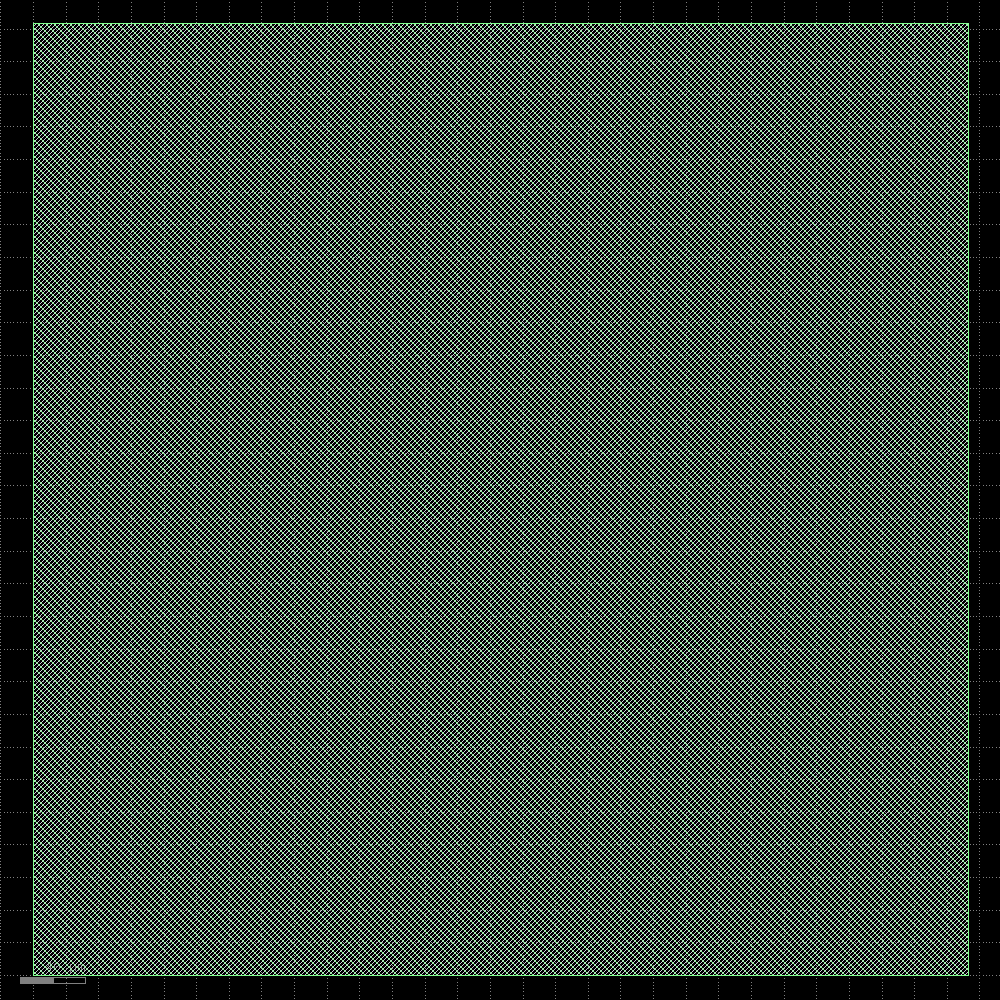

In [ ]:
display(floorplan)

#### Tap/Endcap Cell Insertion

In [ ]:
TapEndcapInsertion = Step.factory.get("OpenROAD.TapEndcapInsertion")

tdi = TapEndcapInsertion(state_in=floorplan.state_out)
tdi.start()

─────────────────────────────────────────────── Tap/Decap Insertion ───────────────────────────────────────────────

[11:17:56] VERBOSE  Running 'OpenROAD.TapEndcapInsertion'… (Log:                                       ]8;id=532429;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=344050;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=522357;file:///content/openlane_run/3-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\.]8;;\]8;id=521084;file:///content/openlane_run/3-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\/openlane_run/3-openroad-tapendcapinsertion/]8;;\]8;id=250103;file:///content/openlane_run/3-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\openroad-tapendcapinsertion.log]8;;\)                  

Reading OpenROAD database at '/content/openlane_run/2-openroad-floorplan/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO TAP-0004] Inserted 412 endcaps.

[INFO TAP-0005] Inserted 4472 tapcells.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/3-openroad-tapendcapinsertion/core.odb'…

Writing netlist to '/content/openlane_run/3-openroad-tapendcapinsertion/core.nl.v'…

Writing powered netlist to '/content/openlane_run/3-openroad-tapendcapinsertion/core.pnl.v'…

Writing layout to '/content/openlane_run/3-openroad-tapendcapinsertion/core.def'…

Writing timing constraints to '/content/openlane_run/3-openroad-tapendcapinsertion/core.sdc'…

Format,Path
nl,openlane_run/3-openroad-tapendcapinsertion/core.nl.v
pnl,openlane_run/3-openroad-tapendcapinsertion/core.pnl.v
def,openlane_run/3-openroad-tapendcapinsertion/core.def
odb,openlane_run/3-openroad-tapendcapinsertion/core.odb
sdc,openlane_run/3-openroad-tapendcapinsertion/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:19:18] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=451620;file:///tmp/tmpn7averfn/klayout-render.log\/tmp/tmpn7averfn/]8;;\]8;id=847080;file:///tmp/tmpn7averfn/klayout-render.log\klayout-render.log]8;;\)               ]8;id=258410;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=850376;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 1.82s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
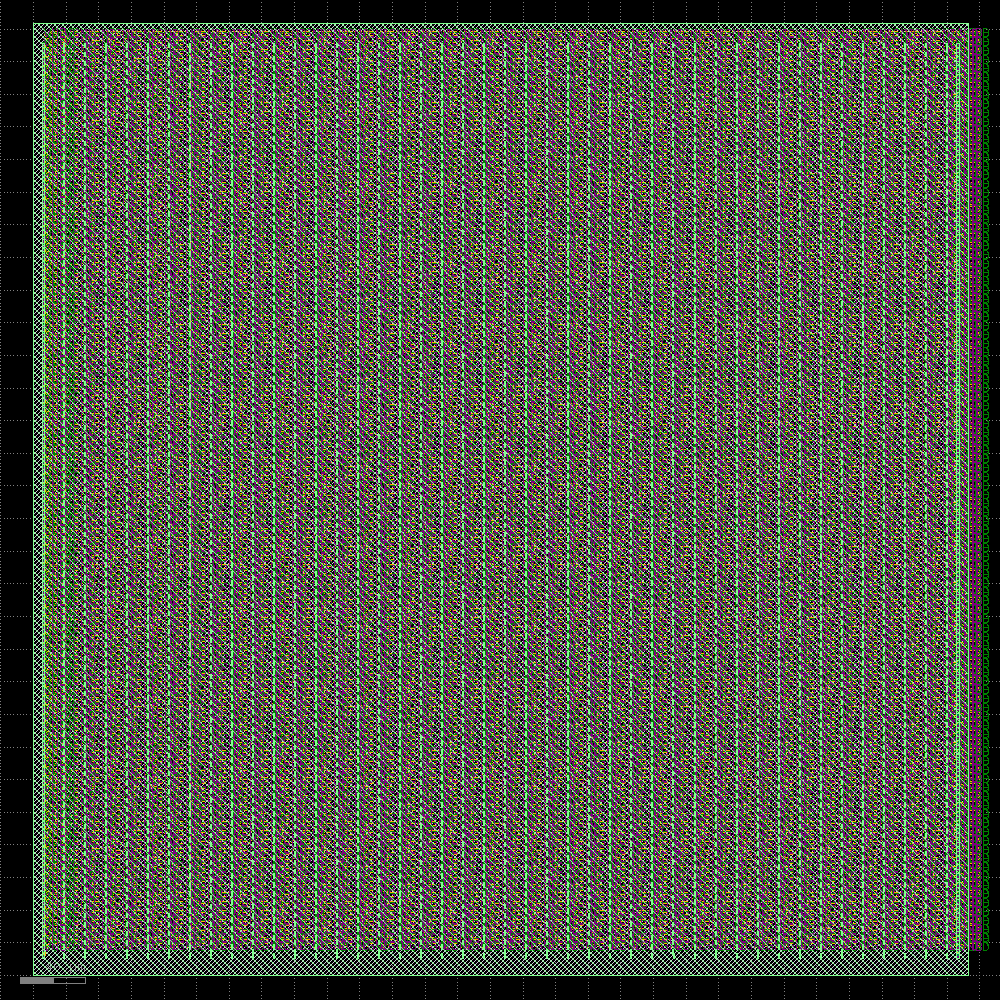

In [ ]:
display(tdi)

#### I/O Placement

In [ ]:
IOPlacement = Step.factory.get("OpenROAD.IOPlacement")

ioplace = IOPlacement(state_in=tdi.state_out)
ioplace.start()

────────────────────────────────────────────────── I/O Placement ──────────────────────────────────────────────────

[11:19:24] VERBOSE  Running 'OpenROAD.IOPlacement'… (Log:                                              ]8;id=684577;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=385159;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=81527;file:///content/openlane_run/4-openroad-ioplacement/openroad-ioplacement.log\.]8;;\]8;id=559200;file:///content/openlane_run/4-openroad-ioplacement/openroad-ioplacement.log\/openlane_run/4-openroad-ioplacement/]8;;\]8;id=459755;file:///content/openlane_run/4-openroad-ioplacement/openroad-ioplacement.log\openroad-ioplacement.log]8;;\)                                

Reading OpenROAD database at '/content/openlane_run/3-openroad-tapendcapinsertion/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] place_pins args: -min_distance 3

Found 0 macro blocks.

[INFO PPL-0010] Tentative 0 to set up sections.

[INFO PPL-0001] Number of slots           700

[INFO PPL-0002] Number of I/O             168

[INFO PPL-0003] Number of I/O w/sink      168

[INFO PPL-0004] Number of I/O w/o sink    0

[INFO PPL-0005] Slots per section         200

[INFO PPL-0006] Slots increase factor     0.01

[INFO PPL-0008] Successfully assigned pins to sections.

[INFO PPL-0012] I/O nets HPWL: 72116.02 um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/4-openroad-ioplacement/core.odb'…

Writing netlist to '/content/openlane_run/4-openroad-ioplacement/core.nl.v'…

Writing powered netlist to '/content/openlane_run/4-openroad-ioplacement/core.pnl.v'…

Writing layout to '/content/openlane_run/4-openroad-ioplacement/core.def'…

Writing timing constraints to '/content/openlane_run/4-openroad-ioplacement/core.sdc'…

Format,Path
nl,openlane_run/4-openroad-ioplacement/core.nl.v
pnl,openlane_run/4-openroad-ioplacement/core.pnl.v
def,openlane_run/4-openroad-ioplacement/core.def
odb,openlane_run/4-openroad-ioplacement/core.odb
sdc,openlane_run/4-openroad-ioplacement/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:19:29] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=765260;file:///tmp/tmpyiugjvpj/klayout-render.log\/tmp/tmpyiugjvpj/]8;;\]8;id=814159;file:///tmp/tmpyiugjvpj/klayout-render.log\klayout-render.log]8;;\)               ]8;id=740687;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=743679;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 1.63s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
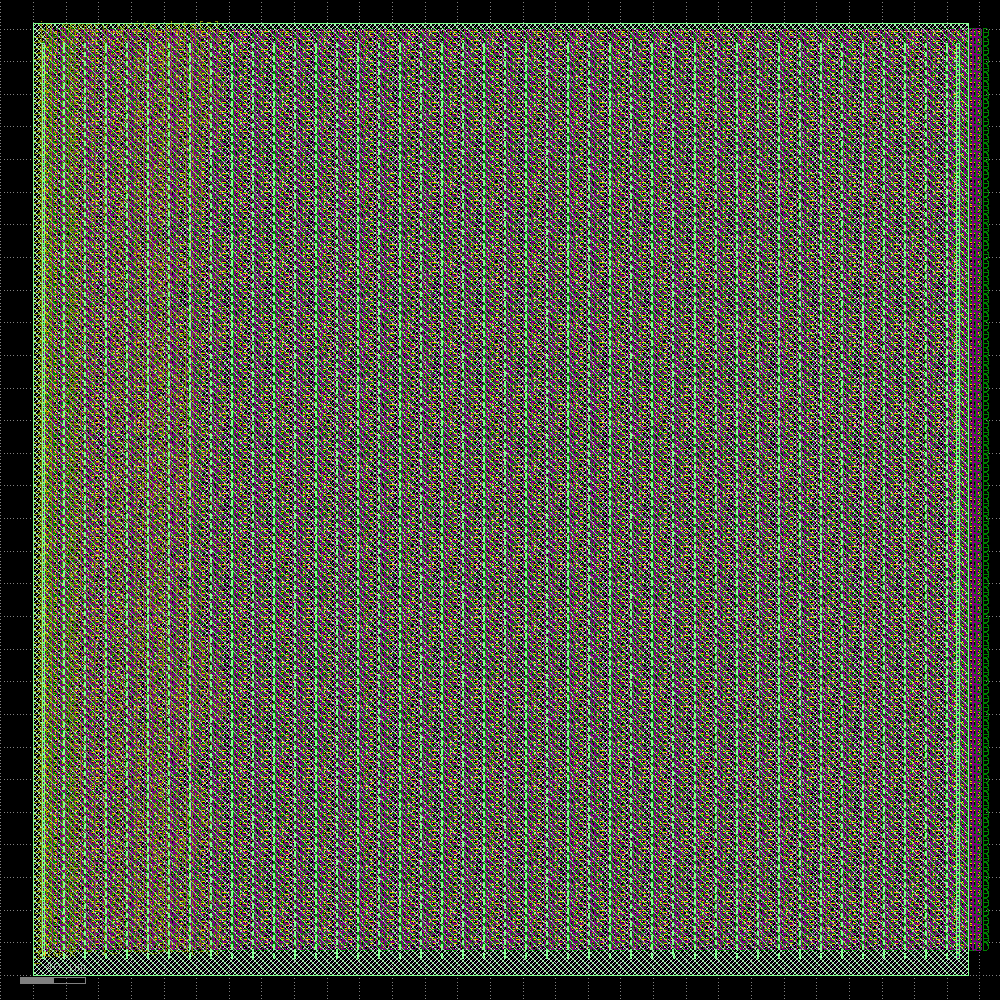

In [ ]:
display(ioplace)

#### Generating the Power Distribution Network (PDN)

In [ ]:
GeneratePDN = Step.factory.get("OpenROAD.GeneratePDN")

pdn = GeneratePDN(
    state_in=ioplace.state_out,
    FP_PDN_VWIDTH=1.6,
    FP_PDN_HWIDTH=1.6,
    FP_PDN_VPITCH=153.6,
    FP_PDN_HPITCH=153.18,
)
pdn.start()

────────────────────────────────────── Power Distribution Network Generation ──────────────────────────────────────

[11:19:37] VERBOSE  Running 'OpenROAD.GeneratePDN'… (Log:                                              ]8;id=533267;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=736698;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=610758;file:///content/openlane_run/5-openroad-generatepdn/openroad-generatepdn.log\.]8;;\]8;id=260863;file:///content/openlane_run/5-openroad-generatepdn/openroad-generatepdn.log\/openlane_run/5-openroad-generatepdn/]8;;\]8;id=206167;file:///content/openlane_run/5-openroad-generatepdn/openroad-generatepdn.log\openroad-generatepdn.log]8;;\)                                

[11:19:37] INFO     'FP_PDN_CFG' not explicitly set, setting it to                                 ]8;id=666747;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=980221;file:///content/openlane_ipynb/openlane/steps/openroad.py#1085\1085]8;;\
                    /content/openlane_ipynb/openlane/scripts/openroad/common/pdn_cfg.tcl…                          

Reading OpenROAD database at '/content/openlane_run/4-openroad-ioplacement/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting global connections...

[INFO PDN-0001] Inserting grid: stdcell_grid

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/5-openroad-generatepdn/core.odb'…

Writing netlist to '/content/openlane_run/5-openroad-generatepdn/core.nl.v'…

Writing powered netlist to '/content/openlane_run/5-openroad-generatepdn/core.pnl.v'…

Writing layout to '/content/openlane_run/5-openroad-generatepdn/core.def'…

Writing timing constraints to '/content/openlane_run/5-openroad-generatepdn/core.sdc'…

[INFO PSM-0076] Setting metal node density to be standard cell height times 5.

[INFO PSM-0031] Number of PDN nodes on net VPWR = 7670.

[INFO PSM-0064] Number of voltage sources = 204.

[INFO PSM-0040] All PDN stripes on net VPWR are connected.

[INFO PSM-0076] Setting metal node density to be standard cell height times 5.

[INFO PSM-0031] Number of PDN nodes on net VGND = 7640.

[INFO PSM-0064] Number of voltage sources = 204.

[INFO PSM-0040] All PDN stripes on net VGND are connected.

Format,Path
nl,openlane_run/5-openroad-generatepdn/core.nl.v
pnl,openlane_run/5-openroad-generatepdn/core.pnl.v
def,openlane_run/5-openroad-generatepdn/core.def
odb,openlane_run/5-openroad-generatepdn/core.odb
sdc,openlane_run/5-openroad-generatepdn/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:19:42] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=597034;file:///tmp/tmpa44zu9sk/klayout-render.log\/tmp/tmpa44zu9sk/]8;;\]8;id=219629;file:///tmp/tmpa44zu9sk/klayout-render.log\klayout-render.log]8;;\)               ]8;id=829595;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=292215;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 2.44s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
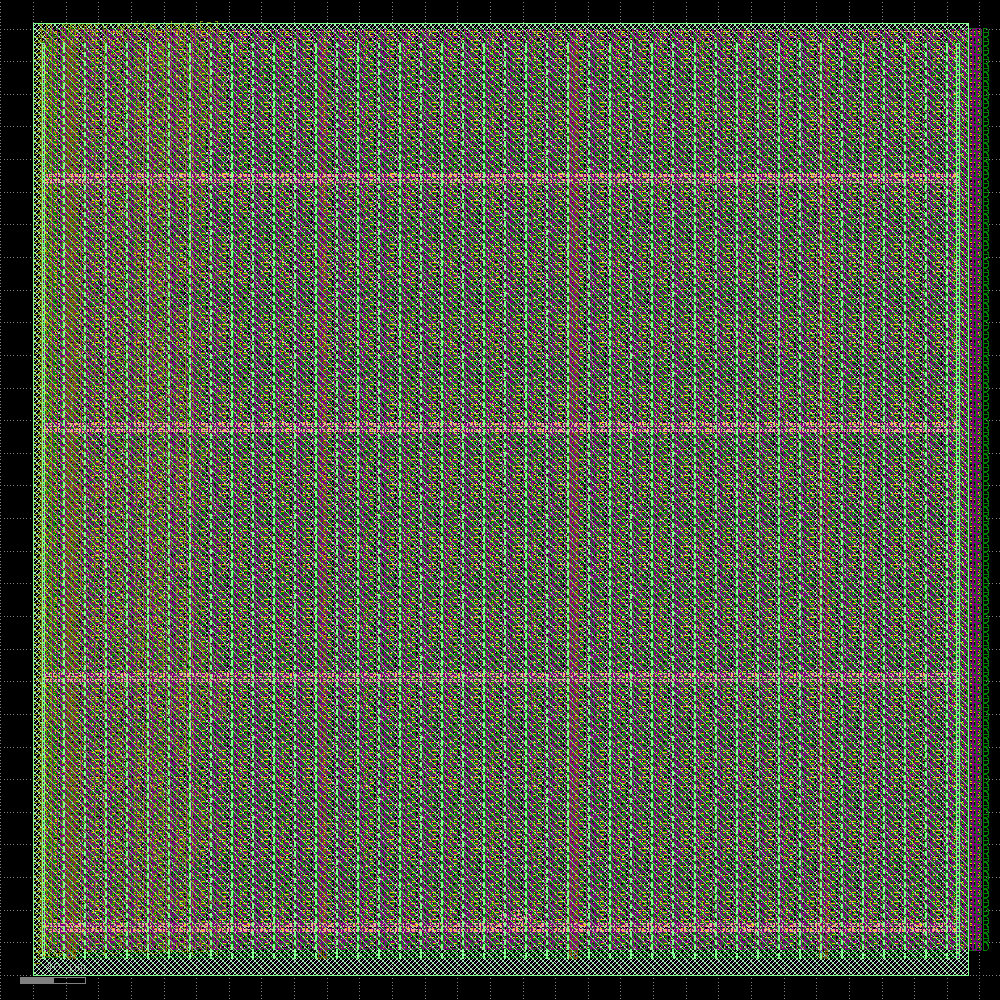

In [ ]:
display(pdn)

#### Global Placement

In [ ]:
GlobalPlacement = Step.factory.get("OpenROAD.GlobalPlacement")

gpl = GlobalPlacement(state_in=pdn.state_out)
gpl.start()

──────────────────────────────────────────────── Global Placement ─────────────────────────────────────────────────

[11:19:48] VERBOSE  Running 'OpenROAD.GlobalPlacement'… (Log:                                          ]8;id=49612;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=967774;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=156562;file:///content/openlane_run/6-openroad-globalplacement/openroad-globalplacement.log\.]8;;\]8;id=394762;file:///content/openlane_run/6-openroad-globalplacement/openroad-globalplacement.log\/openlane_run/6-openroad-globalplacement/]8;;\]8;id=191645;file:///content/openlane_run/6-openroad-globalplacement/openroad-globalplacement.log\openroad-globalplacement.log]8;;\)                        

[11:19:48] INFO     'PL_TARGET_DENSITY_PCT' not explicitly set, using dynamically calculated       ]8;id=719539;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=590693;file:///content/openlane_ipynb/openlane/steps/openroad.py#1172\1172]8;;\
                    target density: 61.937800…                                                                     

Reading OpenROAD database at '/content/openlane_run/5-openroad-generatepdn/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

{*}-density 0.619378 -timing_driven -routability_driven -pad_right 0 -pad_left 0 -init_wirelength_coef 0.25

[INFO GPL-0002] DBU: 1000

[INFO GPL-0003] SiteSize: 460 2720

[INFO GPL-0004] CoreAreaLxLy: 5520 10880

[INFO GPL-0005] CoreAreaUxUy: 567180 571200

[INFO GPL-0006] NumInstances: 17955

[INFO GPL-0007] NumPlaceInstances: 13071

[INFO GPL-0008] NumFixedInstances: 4884

[INFO GPL-0009] NumDummyInstances: 0

[INFO GPL-0010] NumNets: 13138

[INFO GPL-0011] NumPins: 50819

[INFO GPL-0012] DieAreaLxLy: 0 0

[INFO GPL-0013] DieAreaUxUy: 572925 583645

[INFO GPL-0014] CoreAreaLxLy: 5520 10880

[INFO GPL-0015] CoreAreaUxUy: 567180 571200

[INFO GPL-0016] CoreArea: 314709331200

[INFO GPL-0017] NonPlaceInstsArea: 7141849600

[INFO GPL-0018] PlaceInstsArea: 157857648000

[INFO GPL-0019] Util(%): 51.32

[INFO GPL-0020] StdInstsArea: 157857648000

[INFO GPL-0021] MacroInstsArea: 0

[InitialPlace]  Iter: 1 CG residual: 0.00527771 HPWL: 160280800

[InitialPlace]  Iter: 2 CG residual: 0.00030798 HPWL: 147224113

[InitialPlace]  Iter: 3 CG residual: 0.00008417 HPWL: 146526244

[InitialPlace]  Iter: 4 CG residual: 0.00006581 HPWL: 147092374

[InitialPlace]  Iter: 5 CG residual: 0.00002833 HPWL: 146968552

[InitialPlace]  Iter: 6 CG residual: 0.00004813 HPWL: 147281833

[InitialPlace]  Iter: 7 CG residual: 0.00003044 HPWL: 147223406

[InitialPlace]  Iter: 8 CG residual: 0.00002907 HPWL: 147423865

[InitialPlace]  Iter: 9 CG residual: 0.00002913 HPWL: 147243541

[InitialPlace]  Iter: 10 CG residual: 0.00002579 HPWL: 147537235

[InitialPlace]  Iter: 11 CG residual: 0.00003903 HPWL: 147331827

[InitialPlace]  Iter: 12 CG residual: 0.00001097 HPWL: 147522321

[InitialPlace]  Iter: 13 CG residual: 0.00001621 HPWL: 147412337

[InitialPlace]  Iter: 14 CG residual: 0.00000746 HPWL: 147573536

[INFO GPL-0031] FillerInit: NumGCells: 15812

[INFO GPL-0032] FillerInit: NumGNets: 13138

[INFO GPL-0033] FillerInit: NumGPins: 50819

[INFO GPL-0023] TargetDensity: 0.62

[INFO GPL-0024] AveragePlaceInstArea: 12076937

[INFO GPL-0025] IdealBinArea: 19498492

[INFO GPL-0026] IdealBinCnt: 16140

[INFO GPL-0027] TotalBinArea: 314709331200

[INFO GPL-0028] BinCnt: 64 64

[INFO GPL-0029] BinSize: 8776 8755

[INFO GPL-0030] NumBins: 4096

[NesterovSolve] Iter: 1 overflow: 0.990944 HPWL: 59164201

[NesterovSolve] Iter: 10 overflow: 0.979738 HPWL: 71693033

[NesterovSolve] Iter: 20 overflow: 0.978966 HPWL: 73057082

[NesterovSolve] Iter: 30 overflow: 0.979063 HPWL: 73100353

[NesterovSolve] Iter: 40 overflow: 0.978934 HPWL: 72941175

[NesterovSolve] Iter: 50 overflow: 0.978797 HPWL: 73072813

[NesterovSolve] Iter: 60 overflow: 0.978746 HPWL: 73182593

[NesterovSolve] Iter: 70 overflow: 0.978726 HPWL: 73208366

[NesterovSolve] Iter: 80 overflow: 0.978703 HPWL: 73228814

[NesterovSolve] Iter: 90 overflow: 0.978677 HPWL: 73288715

[NesterovSolve] Iter: 100 overflow: 0.978633 HPWL: 73393652

[NesterovSolve] Iter: 110 overflow: 0.978558 HPWL: 73549788

[NesterovSolve] Iter: 120 overflow: 0.978378 HPWL: 73822655

[NesterovSolve] Iter: 130 overflow: 0.978062 HPWL: 74314793

[NesterovSolve] Iter: 140 overflow: 0.977453 HPWL: 75185670

[NesterovSolve] Iter: 150 overflow: 0.976101 HPWL: 76749926

[NesterovSolve] Iter: 160 overflow: 0.973958 HPWL: 79307875

[NesterovSolve] Iter: 170 overflow: 0.971194 HPWL: 83370741

[NesterovSolve] Iter: 180 overflow: 0.965089 HPWL: 89510962

[NesterovSolve] Iter: 190 overflow: 0.956489 HPWL: 98324355

[NesterovSolve] Iter: 200 overflow: 0.94476 HPWL: 110585156

[NesterovSolve] Iter: 210 overflow: 0.929371 HPWL: 125977384

[NesterovSolve] Iter: 220 overflow: 0.910246 HPWL: 143255846

[NesterovSolve] Iter: 230 overflow: 0.891236 HPWL: 162111732

[NesterovSolve] Iter: 240 overflow: 0.866512 HPWL: 181807193

[NesterovSolve] Iter: 250 overflow: 0.835995 HPWL: 202593853

[NesterovSolve] Iter: 260 overflow: 0.803505 HPWL: 223871627

[INFO GPL-0100] worst slack 4.29e-10

[INFO GPL-0103] Weighted 1313 nets.

[NesterovSolve] Iter: 270 overflow: 0.770268 HPWL: 242870779

[NesterovSolve] Iter: 280 overflow: 0.736384 HPWL: 255680277

[NesterovSolve] Iter: 290 overflow: 0.696044 HPWL: 267467910

[NesterovSolve] Iter: 300 overflow: 0.654669 HPWL: 275908511

[INFO GPL-0100] worst slack -2.24e-10

[INFO GPL-0103] Weighted 1311 nets.

[NesterovSolve] Iter: 310 overflow: 0.608917 HPWL: 287315803

[NesterovSolve] Snapshot saved at iter = 312

[NesterovSolve] Iter: 320 overflow: 0.561677 HPWL: 298559425

[NesterovSolve] Iter: 330 overflow: 0.508367 HPWL: 308748658

[INFO GPL-0100] worst slack -4.75e-10

[INFO GPL-0103] Weighted 1310 nets.

[NesterovSolve] Iter: 340 overflow: 0.456332 HPWL: 313513702

[NesterovSolve] Iter: 350 overflow: 0.400083 HPWL: 314463516

[NesterovSolve] Iter: 360 overflow: 0.357077 HPWL: 317671462

[NesterovSolve] Iter: 370 overflow: 0.313692 HPWL: 321146407

[NesterovSolve] Iter: 380 overflow: 0.281054 HPWL: 322427693

[INFO GPL-0100] worst slack -4.34e-10

[INFO GPL-0103] Weighted 1310 nets.

[NesterovSolve] Iter: 390 overflow: 0.24796 HPWL: 324273727

[NesterovSolve] Iter: 400 overflow: 0.216412 HPWL: 326450196

[INFO GPL-0100] worst slack -5.32e-10

[INFO GPL-0103] Weighted 1313 nets.

[INFO GPL-0075] Routability numCall: 1 inflationIterCnt: 1 bloatIterCnt: 0

[INFO GPL-0036] TileLxLy: 0 0

[INFO GPL-0037] TileSize: 6900 6900

[INFO GPL-0038] TileCnt: 83 84

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6972

[INFO GPL-0063] TotalRouteOverflowH2: 15.600001692771912

[INFO GPL-0064] TotalRouteOverflowV2: 85.90000522136688

[INFO GPL-0065] OverflowTileCnt2: 535

[INFO GPL-0066] 0.5%RC: 1.4082125822703044

[INFO GPL-0067] 1.0%RC: 1.335024172845094

[INFO GPL-0068] 2.0%RC: 1.252294685529626

[INFO GPL-0069] 5.0%RC: 1.1244927611903868

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.3716184

[INFO GPL-0045] InflatedAreaDelta: 17075643176

[INFO GPL-0046] TargetDensity: 0.619378

[INFO GPL-0049] WhiteSpaceArea: 307567481600

[INFO GPL-0050] NesterovInstsArea: 157857648000

[INFO GPL-0051] TotalFillerArea: 32642888320

[INFO GPL-0052] TotalGCellsArea: 190500536320

[INFO GPL-0053] ExpectedTotalGCellsArea: 207576179496

[INFO GPL-0054] NewTargetDensity: 0.67489636

[INFO GPL-0055] NewWhiteSpaceArea: 307567481600

[INFO GPL-0056] MovableArea: 207576186880

[INFO GPL-0057] NewNesterovInstsArea: 174933291176

[INFO GPL-0058] NewTotalFillerArea: 32642895704

[INFO GPL-0059] NewTotalGCellsArea: 207576186880

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 410 overflow: 0.583843 HPWL: 299858264

[NesterovSolve] Iter: 420 overflow: 0.525353 HPWL: 321033880

[NesterovSolve] Iter: 430 overflow: 0.494203 HPWL: 327537988

[NesterovSolve] Iter: 440 overflow: 0.443628 HPWL: 325828671

[NesterovSolve] Iter: 450 overflow: 0.40703 HPWL: 323199714

[NesterovSolve] Iter: 460 overflow: 0.366874 HPWL: 326601211

[NesterovSolve] Iter: 470 overflow: 0.329517 HPWL: 328709275

[NesterovSolve] Iter: 480 overflow: 0.288525 HPWL: 330952718

[NesterovSolve] Iter: 490 overflow: 0.260241 HPWL: 332197076

[NesterovSolve] Iter: 500 overflow: 0.233123 HPWL: 334260873

[NesterovSolve] Iter: 510 overflow: 0.206634 HPWL: 334627959

[INFO GPL-0075] Routability numCall: 2 inflationIterCnt: 2 bloatIterCnt: 0

[INFO GPL-0036] TileLxLy: 0 0

[INFO GPL-0037] TileSize: 6900 6900

[INFO GPL-0038] TileCnt: 83 84

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6972

[INFO GPL-0063] TotalRouteOverflowH2: 11.000000596046448

[INFO GPL-0064] TotalRouteOverflowV2: 44.533337235450745

[INFO GPL-0065] OverflowTileCnt2: 344

[INFO GPL-0066] 0.5%RC: 1.2884058192156362

[INFO GPL-0067] 1.0%RC: 1.2275362230729365

[INFO GPL-0068] 2.0%RC: 1.1589372101901234

[INFO GPL-0069] 5.0%RC: 1.064541068457175

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.257971

[INFO GPL-0045] InflatedAreaDelta: 12603393084

[INFO GPL-0046] TargetDensity: 0.67489636

[INFO GPL-0049] WhiteSpaceArea: 307567481600

[INFO GPL-0050] NesterovInstsArea: 174933291176

[INFO GPL-0051] TotalFillerArea: 32642895704

[INFO GPL-0052] TotalGCellsArea: 207576186880

[INFO GPL-0053] ExpectedTotalGCellsArea: 220179579964

[INFO GPL-0054] NewTargetDensity: 0.715874

[INFO GPL-0055] NewWhiteSpaceArea: 307567481600

[INFO GPL-0056] MovableArea: 220179578880

[INFO GPL-0057] NewNesterovInstsArea: 187536684260

[INFO GPL-0058] NewTotalFillerArea: 32642894620

[INFO GPL-0059] NewTotalGCellsArea: 220179578880

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 520 overflow: 0.543294 HPWL: 321137213

[NesterovSolve] Iter: 530 overflow: 0.508546 HPWL: 332518391

[NesterovSolve] Iter: 540 overflow: 0.464505 HPWL: 336029309

[NesterovSolve] Iter: 550 overflow: 0.425704 HPWL: 332221610

[NesterovSolve] Iter: 560 overflow: 0.391016 HPWL: 332749196

[NesterovSolve] Iter: 570 overflow: 0.342891 HPWL: 338076670

[NesterovSolve] Iter: 580 overflow: 0.309157 HPWL: 339297368

[NesterovSolve] Iter: 590 overflow: 0.275884 HPWL: 339898404

[NesterovSolve] Iter: 600 overflow: 0.247855 HPWL: 342267930

[NesterovSolve] Iter: 610 overflow: 0.217557 HPWL: 343206357

[INFO GPL-0075] Routability numCall: 3 inflationIterCnt: 3 bloatIterCnt: 0

[INFO GPL-0036] TileLxLy: 0 0

[INFO GPL-0037] TileSize: 6900 6900

[INFO GPL-0038] TileCnt: 83 84

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6972

[INFO GPL-0063] TotalRouteOverflowH2: 10.000000715255737

[INFO GPL-0064] TotalRouteOverflowV2: 30.93333637714386

[INFO GPL-0065] OverflowTileCnt2: 254

[INFO GPL-0066] 0.5%RC: 1.257487922474958

[INFO GPL-0067] 1.0%RC: 1.194202895613684

[INFO GPL-0068] 2.0%RC: 1.1120773057142894

[INFO GPL-0069] 5.0%RC: 1.0448309222857157

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.2258455

[NesterovSolve] Iter: 620 overflow: 0.191039 HPWL: 343616869

[NesterovSolve] Iter: 630 overflow: 0.165627 HPWL: 343490051

[INFO GPL-0100] worst slack -4.15e-10

[INFO GPL-0103] Weighted 1311 nets.

[NesterovSolve] Iter: 640 overflow: 0.142596 HPWL: 343486288

[NesterovSolve] Iter: 650 overflow: 0.123887 HPWL: 343755954

[NesterovSolve] Iter: 660 overflow: 0.10255 HPWL: 344020493

[NesterovSolve] Finished with Overflow: 0.098310

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/6-openroad-globalplacement/core.odb'…

Writing netlist to '/content/openlane_run/6-openroad-globalplacement/core.nl.v'…

Writing powered netlist to '/content/openlane_run/6-openroad-globalplacement/core.pnl.v'…

Writing layout to '/content/openlane_run/6-openroad-globalplacement/core.def'…

Writing timing constraints to '/content/openlane_run/6-openroad-globalplacement/core.sdc'…

Format,Path
nl,openlane_run/6-openroad-globalplacement/core.nl.v
pnl,openlane_run/6-openroad-globalplacement/core.pnl.v
def,openlane_run/6-openroad-globalplacement/core.def
odb,openlane_run/6-openroad-globalplacement/core.odb
sdc,openlane_run/6-openroad-globalplacement/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:23:00] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=963247;file:///tmp/tmp1krnww_7/klayout-render.log\/tmp/tmp1krnww_7/]8;;\]8;id=991029;file:///tmp/tmp1krnww_7/klayout-render.log\klayout-render.log]8;;\)               ]8;id=105294;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=250200;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 61.49s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
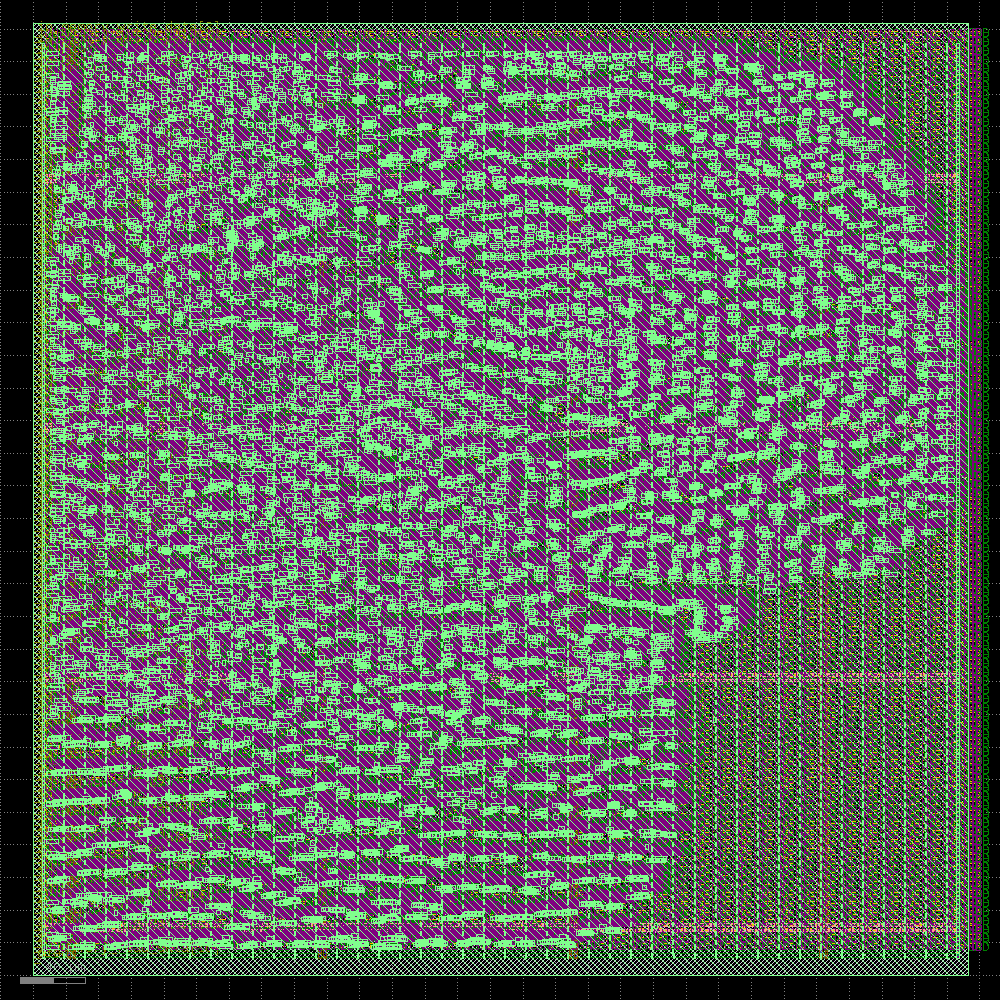

In [ ]:
display(gpl)

#### Detailed Placement

In [ ]:
DetailedPlacement = Step.factory.get("OpenROAD.DetailedPlacement")

dpl = DetailedPlacement(state_in=gpl.state_out)
dpl.start()

─────────────────────────────────────────────── Detailed Placement ────────────────────────────────────────────────

[11:23:27] VERBOSE  Running 'OpenROAD.DetailedPlacement'… (Log:                                        ]8;id=391195;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=900401;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=270920;file:///content/openlane_run/7-openroad-detailedplacement/openroad-detailedplacement.log\.]8;;\]8;id=599766;file:///content/openlane_run/7-openroad-detailedplacement/openroad-detailedplacement.log\/openlane_run/7-openroad-detailedplacement/]8;;\]8;id=426579;file:///content/openlane_run/7-openroad-detailedplacement/openroad-detailedplacement.log\openroad-detailedplacement.log]8;;\)                    

Reading OpenROAD database at '/content/openlane_run/6-openroad-globalplacement/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Placement Analysis

---------------------------------

total displacement      47580.7 u

average displacement        2.6 u

max displacement           14.2 u

original HPWL          344202.5 u

legalized HPWL         396857.5 u

delta HPWL                   15 %

[INFO DPL-0020] Mirrored 4346 instances

[INFO DPL-0021] HPWL before          396857.5 u

[INFO DPL-0022] HPWL after           387742.4 u

[INFO DPL-0023] HPWL delta               -2.3 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/7-openroad-detailedplacement/core.odb'…

Writing netlist to '/content/openlane_run/7-openroad-detailedplacement/core.nl.v'…

Writing powered netlist to '/content/openlane_run/7-openroad-detailedplacement/core.pnl.v'…

Writing layout to '/content/openlane_run/7-openroad-detailedplacement/core.def'…

Writing timing constraints to '/content/openlane_run/7-openroad-detailedplacement/core.sdc'…

Format,Path
nl,openlane_run/7-openroad-detailedplacement/core.nl.v
pnl,openlane_run/7-openroad-detailedplacement/core.pnl.v
def,openlane_run/7-openroad-detailedplacement/core.def
odb,openlane_run/7-openroad-detailedplacement/core.odb
sdc,openlane_run/7-openroad-detailedplacement/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:23:34] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=569373;file:///tmp/tmp13c0as8o/klayout-render.log\/tmp/tmp13c0as8o/]8;;\]8;id=15907;file:///tmp/tmp13c0as8o/klayout-render.log\klayout-render.log]8;;\)               ]8;id=120964;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=972943;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 2.22s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
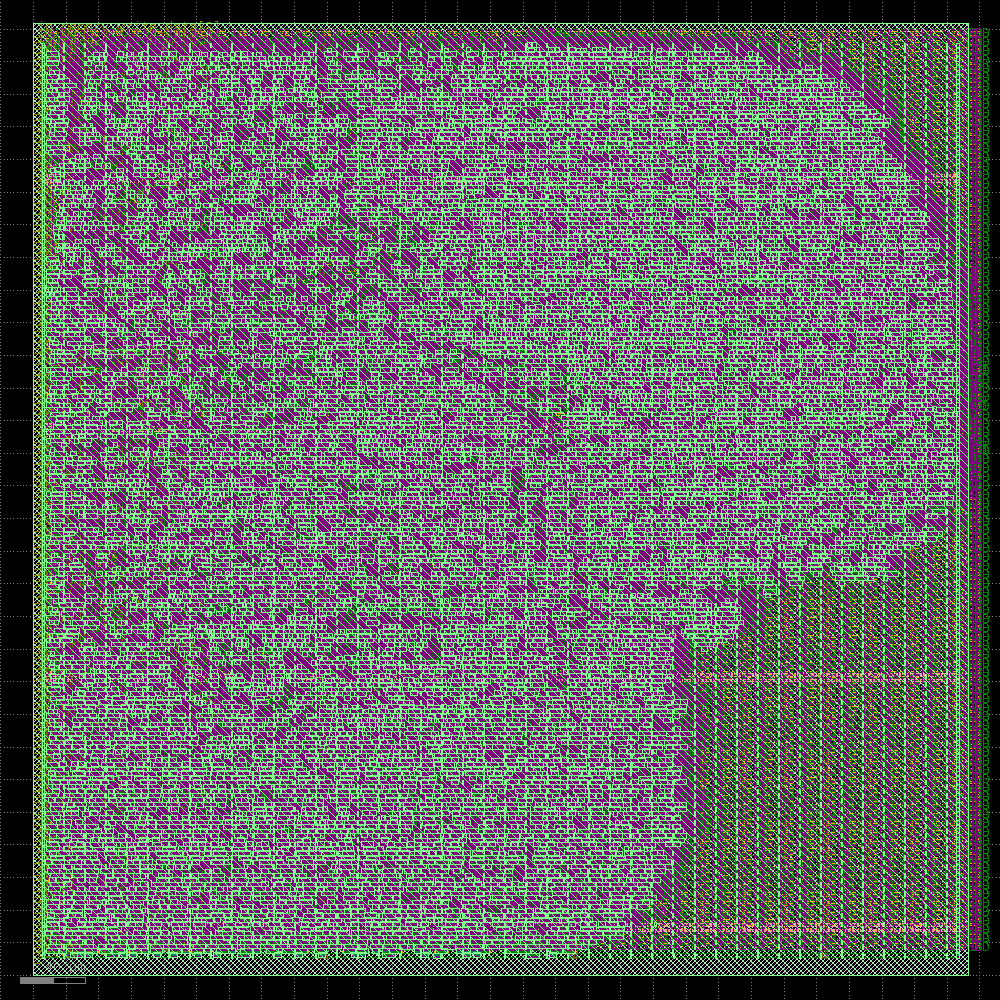

In [ ]:
display(dpl)

#### Clock Tree Synthesis (CTS)


In [ ]:
CTS = Step.factory.get("OpenROAD.CTS")

cts = CTS(state_in=dpl.state_out)
cts.start()

────────────────────────────────────────────── Clock Tree Synthesis ───────────────────────────────────────────────

[11:23:42] VERBOSE  Running 'OpenROAD.CTS'… (Log: ]8;id=184888;file:///content/openlane_run/8-openroad-cts/openroad-cts.log\.]8;;\]8;id=239142;file:///content/openlane_run/8-openroad-cts/openroad-cts.log\/openlane_run/8-openroad-cts/]8;;\]8;id=42428;file:///content/openlane_run/8-openroad-cts/openroad-cts.log\openroad-cts.log]8;;\)      ]8;id=863638;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=661692;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

Reading timing models for corner nom_tt_025C_1v80…

Reading timing library for the 'nom_tt_025C_1v80' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading timing models for corner nom_ff_n40C_1v95…

Reading timing library for the 'nom_ff_n40C_1v95' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib'…

Reading timing models for corner nom_ss_100C_1v60…

Reading timing library for the 'nom_ss_100C_1v60' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib'…

Reading OpenROAD database at '/content/openlane_run/7-openroad-detailedplacement/core.odb'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Configuring cts characterization…

[INFO] Performing clock tree synthesis…

[INFO] Looking for the following net(s): clock

[INFO] Running Clock Tree Synthesis…

[INFO CTS-0050] Root buffer is sky130_fd_sc_hd__clkbuf_16.

[INFO CTS-0051] Sink buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0052] The following clock buffers will be used for CTS:

sky130_fd_sc_hd__clkbuf_2

sky130_fd_sc_hd__clkbuf_4

sky130_fd_sc_hd__clkbuf_8

[INFO CTS-0049] Characterization buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0007] Net "clock" found for clock "clock".

[INFO CTS-0010]  Clock net "clock" has 2955 sinks.

[INFO CTS-0008] TritonCTS found 1 clock nets.

[INFO CTS-0097] Characterization used 3 buffer(s) types.

[INFO CTS-0200] 0 placement blockages have been identified.

[INFO CTS-0201] 0 placed hard macros will be treated like blockages.

[INFO CTS-0027] Generating H-Tree topology for net clock.

[INFO CTS-0028]  Total number of sinks: 2955.

[INFO CTS-0029]  Sinks will be clustered in groups of up to 25 and with maximum cluster diameter of 50.0 um.

[INFO CTS-0030]  Number of static layers: 0.

[INFO CTS-0020]  Wire segment unit: 13600  dbu (13 um).

[INFO CTS-0204] A clustering solution was found from clustering size of 25 and clustering diameter of 50.

[INFO CTS-0205] Better solution may be possible if either -sink_clustering_size, -sink_clustering_max_diameter, or 
both options are omitted to enable automatic clustering.

[INFO CTS-0019]  Total number of sinks after clustering: 308.

[INFO CTS-0024]  Normalized sink region: [(0.95541, 1.47729), (41.2259, 41.3522)].

[INFO CTS-0025]     Width:  40.2705.

[INFO CTS-0026]     Height: 39.8749.

Level 1

Direction: Horizontal

Sinks per sub-region: 154

Sub-region size: 20.1352 X 39.8749

[INFO CTS-0034]     Segment length (rounded): 10.

Level 2

Direction: Vertical

Sinks per sub-region: 77

Sub-region size: 20.1352 X 19.9375

[INFO CTS-0034]     Segment length (rounded): 10.

Level 3

Direction: Horizontal

Sinks per sub-region: 39

Sub-region size: 10.0676 X 19.9375

[INFO CTS-0034]     Segment length (rounded): 6.

Level 4

Direction: Vertical

Sinks per sub-region: 20

Sub-region size: 10.0676 X 9.9687

[INFO CTS-0034]     Segment length (rounded): 4.

Level 5

Direction: Horizontal

Sinks per sub-region: 10

Sub-region size: 5.0338 X 9.9687

[INFO CTS-0034]     Segment length (rounded): 2.

[INFO CTS-0032]  Stop criterion found. Max number of sinks is 15.

[INFO CTS-0035]  Number of sinks covered: 308.

[INFO CTS-0018]     Created 342 clock buffers.

[INFO CTS-0012]     Minimum number of buffers in the clock path: 3.

[INFO CTS-0013]     Maximum number of buffers in the clock path: 4.

[INFO CTS-0015]     Created 342 clock nets.

[INFO CTS-0016]     Fanout distribution for the current clock = 2:1, 3:6, 4:11, 5:14, 6:29, 7:38, 8:42, 9:42,      
10:34, 11:27, 12:22, 13:20, 14:18, 15:9, 16:5, 17:11, 18:3, 19:1, 20:2, 21:1, 23:1..

[INFO CTS-0017]     Max level of the clock tree: 5.

[INFO CTS-0098] Clock net "clock"

[INFO CTS-0099]  Sinks 2955

[INFO CTS-0100]  Leaf buffers 305

[INFO CTS-0101]  Average sink wire length 1000.16 um

[INFO CTS-0102]  Path depth 3 - 4

[INFO] Repairing long wires on clock nets…

[INFO RSZ-0058] Using max wire length 4459um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/8-openroad-cts/core.odb'…

Writing netlist to '/content/openlane_run/8-openroad-cts/core.nl.v'…

Writing powered netlist to '/content/openlane_run/8-openroad-cts/core.pnl.v'…

Writing layout to '/content/openlane_run/8-openroad-cts/core.def'…

Writing timing constraints to '/content/openlane_run/8-openroad-cts/core.sdc'…

[INFO] Legalizing…

Placement Analysis

---------------------------------

total displacement       3228.1 u

average displacement        0.2 u

max displacement           12.4 u

original HPWL          409661.9 u

legalized HPWL         421850.8 u

delta HPWL                    3 %

[INFO DPL-0020] Mirrored 4482 instances

[INFO DPL-0021] HPWL before          421850.8 u

[INFO DPL-0022] HPWL after           411494.9 u

[INFO DPL-0023] HPWL delta               -2.5 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/8-openroad-cts/core.odb'…

Writing netlist to '/content/openlane_run/8-openroad-cts/core.nl.v'…

Writing powered netlist to '/content/openlane_run/8-openroad-cts/core.pnl.v'…

Writing layout to '/content/openlane_run/8-openroad-cts/core.def'…

Writing timing constraints to '/content/openlane_run/8-openroad-cts/core.sdc'…

Format,Path
nl,openlane_run/8-openroad-cts/core.nl.v
pnl,openlane_run/8-openroad-cts/core.pnl.v
def,openlane_run/8-openroad-cts/core.def
odb,openlane_run/8-openroad-cts/core.odb
sdc,openlane_run/8-openroad-cts/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[11:24:21] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=312184;file:///tmp/tmpt_faaham/klayout-render.log\/tmp/tmpt_faaham/]8;;\]8;id=436929;file:///tmp/tmpt_faaham/klayout-render.log\klayout-render.log]8;;\)               ]8;id=97050;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=394651;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 23.08s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
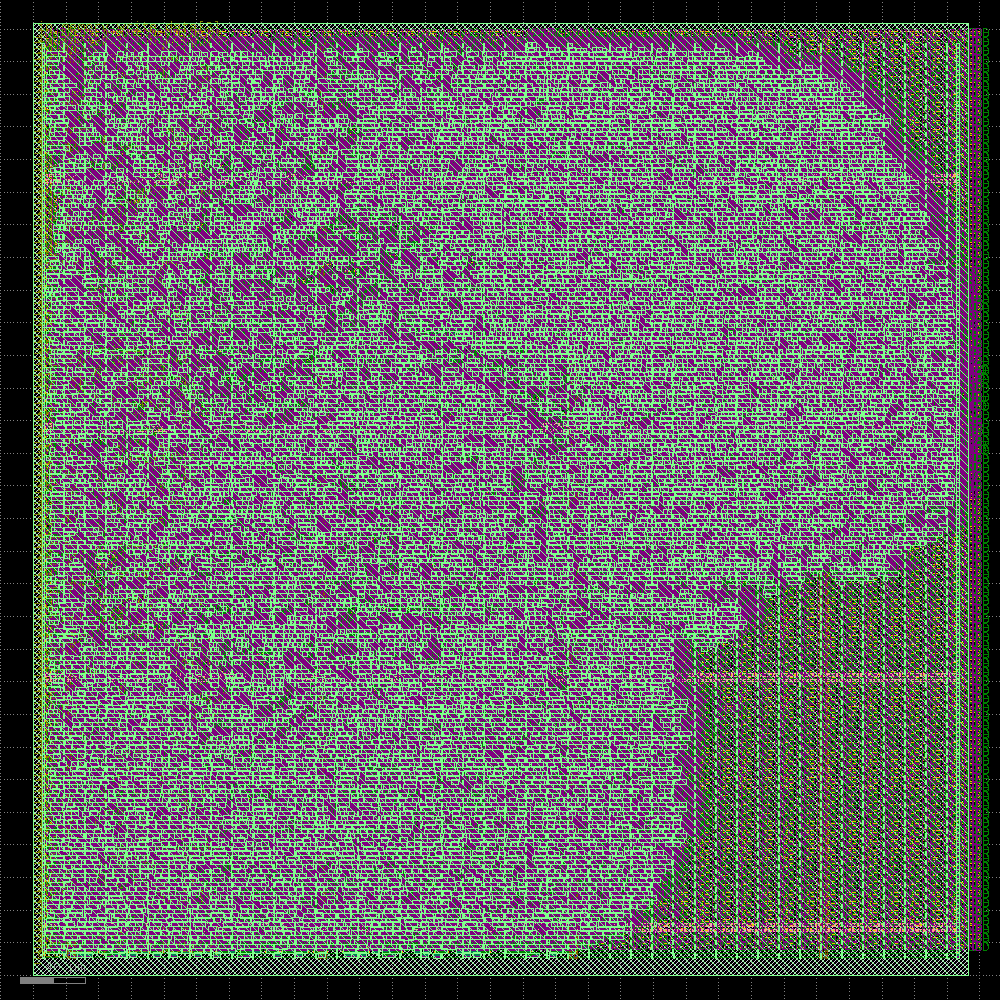

In [ ]:
display(cts)

#### Global Routing

In [ ]:
GlobalRouting = Step.factory.get("OpenROAD.GlobalRouting")

grt = GlobalRouting(state_in=cts.state_out)
grt.start()

───────────────────────────────────────────────── Global Routing ──────────────────────────────────────────────────

[11:24:29] VERBOSE  Running 'OpenROAD.GlobalRouting'… (Log:                                            ]8;id=893004;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=49697;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=253524;file:///content/openlane_run/9-openroad-globalrouting/openroad-globalrouting.log\.]8;;\]8;id=312035;file:///content/openlane_run/9-openroad-globalrouting/openroad-globalrouting.log\/openlane_run/9-openroad-globalrouting/]8;;\]8;id=458369;file:///content/openlane_run/9-openroad-globalrouting/openroad-globalrouting.log\openroad-globalrouting.log]8;;\)                            

Reading OpenROAD database at '/content/openlane_run/8-openroad-cts/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

-congestion_iterations 50 -verbose

[INFO GRT-0020] Min routing layer: met1

[INFO GRT-0021] Max routing layer: met5

[INFO GRT-0022] Global adjustment: 30%

[INFO GRT-0023] Grid origin: (0, 0)

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0088] Layer li1     Track-Pitch = 0.4600  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met1    Track-Pitch = 0.3400  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met2    Track-Pitch = 0.4600  line-2-Via Pitch: 0.3500

[INFO GRT-0088] Layer met3    Track-Pitch = 0.6800  line-2-Via Pitch: 0.6150

[INFO GRT-0088] Layer met4    Track-Pitch = 0.9200  line-2-Via Pitch: 1.0400

[INFO GRT-0088] Layer met5    Track-Pitch = 3.4000  line-2-Via Pitch: 3.1100

[INFO GRT-0019] Found 343 clock nets.

[INFO GRT-0001] Minimum degree: 2

[INFO GRT-0002] Maximum degree: 1387

[INFO GRT-0003] Macros: 0

[INFO GRT-0004] Blockages: 44895

[INFO GRT-0053] Routing resources analysis:

Routing      Original      Derated      Resource

Layer     Direction    Resources     Resources    Reduction (%)

---------------------------------------------------------------

li1        Vertical            0             0          0.00%

met1       Horizontal     140416         66882          52.37%

met2       Vertical       104595         68740          34.28%

met3       Horizontal      70208         48036          31.58%

met4       Vertical        41922         26341          37.17%

met5       Horizontal      14025          6642          52.64%

---------------------------------------------------------------

[INFO GRT-0101] Running extra iterations to remove overflow.

[INFO GRT-0197] Via related to pin nodes: 90816

[INFO GRT-0198] Via related Steiner nodes: 2660

[INFO GRT-0199] Via filling finished.

[INFO GRT-0111] Final number of vias: 116776

[INFO GRT-0112] Final usage 3D: 430310

[INFO GRT-0096] Final congestion report:

Layer         Resource        Demand        Usage (%)    Max H / Max V / Total Overflow

---------------------------------------------------------------------------------------

li1                  0             0            0.00%             0 /  0 /  0

met1             66882         33519           50.12%             0 /  0 /  0

met2             68740         34236           49.81%             0 /  0 /  0

met3             48036          6894           14.35%             0 /  0 /  0

met4             26341          5332           20.24%             0 /  0 /  0

met5              6642             1            0.02%             0 /  0 /  0

---------------------------------------------------------------------------------------

Total           216641         79982           36.92%             0 /  0 /  0

[INFO GRT-0018] Total wirelength: 841910 um

[INFO GRT-0014] Routed nets: 13480

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/9-openroad-globalrouting/core.odb'…

Writing layout to '/content/openlane_run/9-openroad-globalrouting/core.def'…

Format,Path
nl,openlane_run/8-openroad-cts/core.nl.v
pnl,openlane_run/8-openroad-cts/core.pnl.v
def,openlane_run/9-openroad-globalrouting/core.def
odb,openlane_run/9-openroad-globalrouting/core.odb
sdc,openlane_run/8-openroad-cts/core.sdc


#### Detailed Routing
This step may take a little longer to run.

In [ ]:
DetailedRouting = Step.factory.get("OpenROAD.DetailedRouting")

drt = DetailedRouting(state_in=grt.state_out)
drt.start()

──────────────────────────────────────────────── Detailed Routing ─────────────────────────────────────────────────

[11:30:58] VERBOSE  Running 'OpenROAD.DetailedRouting'… (Log:                                          ]8;id=321267;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=970379;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=988341;file:///content/openlane_run/10-openroad-detailedrouting/openroad-detailedrouting.log\.]8;;\]8;id=360363;file:///content/openlane_run/10-openroad-detailedrouting/openroad-detailedrouting.log\/openlane_run/10-openroad-detailedrouting/]8;;\]8;id=938210;file:///content/openlane_run/10-openroad-detailedrouting/openroad-detailedrouting.log\openroad-detailedrouting.log]8;;\)                       

[11:30:58] INFO     Running TritonRoute with 2 threads…                                            ]8;id=646951;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=531100;file:///content/openlane_ipynb/openlane/steps/openroad.py#1529\1529]8;;\

Reading OpenROAD database at '/content/openlane_run/9-openroad-globalrouting/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO ORD-0030] Using 2 thread(s).

[INFO DRT-0149] Reading tech and libs.

Units:                1000

Number of layers:     13

Number of macros:     441

Number of vias:       25

Number of viarulegen: 25

[INFO DRT-0150] Reading design.

Design:                   core

Die area:                 ( 0 0 ) ( 572925 583645 )

Number of track patterns: 12

Number of DEF vias:       0

Number of components:     18297

Number of terminals:      170

Number of snets:          2

Number of nets:           13480

[INFO DRT-0167] List of default vias:

Layer via

default via: M1M2_PR

Layer via2

default via: M2M3_PR

Layer via3

default via: M3M4_PR

Layer via4

default via: M4M5_PR

[INFO DRT-0162] Library cell analysis.

[INFO DRT-0163] Instance analysis.

Complete 10000 instances.

[INFO DRT-0164] Number of unique instances = 243.

[INFO DRT-0168] Init region query.

[INFO DRT-0018]   Complete 10000 insts.

[INFO DRT-0024]   Complete FR_MASTERSLICE.

[INFO DRT-0024]   Complete Fr_VIA.

[INFO DRT-0024]   Complete li1.

[INFO DRT-0024]   Complete mcon.

[INFO DRT-0024]   Complete met1.

[INFO DRT-0024]   Complete via.

[INFO DRT-0024]   Complete met2.

[INFO DRT-0024]   Complete via2.

[INFO DRT-0024]   Complete met3.

[INFO DRT-0024]   Complete via3.

[INFO DRT-0024]   Complete met4.

[INFO DRT-0024]   Complete via4.

[INFO DRT-0024]   Complete met5.

[INFO DRT-0033] FR_MASTERSLICE shape region query size = 0.

[INFO DRT-0033] FR_VIA shape region query size = 0.

[INFO DRT-0033] li1 shape region query size = 488278.

[INFO DRT-0033] mcon shape region query size = 291598.

[INFO DRT-0033] met1 shape region query size = 64975.

[INFO DRT-0033] via shape region query size = 4140.

[INFO DRT-0033] met2 shape region query size = 2484.

[INFO DRT-0033] via2 shape region query size = 3312.

[INFO DRT-0033] met3 shape region query size = 2652.

[INFO DRT-0033] via3 shape region query size = 3312.

[INFO DRT-0033] met4 shape region query size = 876.

[INFO DRT-0033] via4 shape region query size = 32.

[INFO DRT-0033] met5 shape region query size = 48.

[INFO DRT-0165] Start pin access.

[INFO DRT-0076]   Complete 100 pins.

[INFO DRT-0076]   Complete 200 pins.

[INFO DRT-0076]   Complete 300 pins.

[INFO DRT-0076]   Complete 400 pins.

[INFO DRT-0076]   Complete 500 pins.

[INFO DRT-0076]   Complete 600 pins.

[INFO DRT-0076]   Complete 700 pins.

[INFO DRT-0076]   Complete 800 pins.

[INFO DRT-0076]   Complete 900 pins.

[INFO DRT-0077]   Complete 1000 pins.

[INFO DRT-0078]   Complete 1062 pins.

[INFO DRT-0079]   Complete 100 unique inst patterns.

[INFO DRT-0079]   Complete 200 unique inst patterns.

[INFO DRT-0081]   Complete 237 unique inst patterns.

[INFO DRT-0082]   Complete 1000 groups.

[INFO DRT-0082]   Complete 2000 groups.

[INFO DRT-0082]   Complete 3000 groups.

[INFO DRT-0082]   Complete 4000 groups.

[INFO DRT-0082]   Complete 5000 groups.

[INFO DRT-0082]   Complete 6000 groups.

[INFO DRT-0082]   Complete 7000 groups.

[INFO DRT-0082]   Complete 8000 groups.

[INFO DRT-0084]   Complete 8025 groups.

#scanned instances     = 18297

#unique  instances     = 243

#stdCellGenAp          = 7449

#stdCellValidPlanarAp  = 84

#stdCellValidViaAp     = 5862

#stdCellPinNoAp        = 0

#stdCellPinCnt         = 51335

#instTermValidViaApCnt = 0

#macroGenAp            = 0

#macroValidPlanarAp    = 0

#macroValidViaAp       = 0

#macroNoAp             = 0

[INFO DRT-0166] Complete pin access.

[INFO DRT-0267] cpu time = 00:05:58, elapsed time = 00:03:41, memory = 223.96 (MB), peak = 233.98 (MB)

[INFO DRT-0156] guideIn read 100000 guides.

Number of guides:     124861

[INFO DRT-0169] Post process guides.

[INFO DRT-0176] GCELLGRID X 0 DO 83 STEP 6900 ;

[INFO DRT-0177] GCELLGRID Y 0 DO 84 STEP 6900 ;

[INFO DRT-0026]   Complete 10000 origin guides.

[INFO DRT-0026]   Complete 20000 origin guides.

[INFO DRT-0026]   Complete 30000 origin guides.

[INFO DRT-0026]   Complete 40000 origin guides.

[INFO DRT-0026]   Complete 50000 origin guides.

[INFO DRT-0026]   Complete 60000 origin guides.

[INFO DRT-0026]   Complete 70000 origin guides.

[INFO DRT-0026]   Complete 80000 origin guides.

[INFO DRT-0026]   Complete 90000 origin guides.

[INFO DRT-0027]   Complete 100000 origin guides.

[INFO DRT-0028]   Complete FR_MASTERSLICE.

[INFO DRT-0028]   Complete Fr_VIA.

[INFO DRT-0028]   Complete li1.

[INFO DRT-0028]   Complete mcon.

[INFO DRT-0028]   Complete met1.

[INFO DRT-0028]   Complete via.

[INFO DRT-0028]   Complete met2.

[INFO DRT-0028]   Complete via2.

[INFO DRT-0028]   Complete met3.

[INFO DRT-0028]   Complete via3.

[INFO DRT-0028]   Complete met4.

[INFO DRT-0028]   Complete via4.

[INFO DRT-0028]   Complete met5.

complete 10000 nets.

[INFO DRT-0178] Init guide query.

[INFO DRT-0029]   Complete 10000 nets (guide).

[INFO DRT-0035]   Complete FR_MASTERSLICE (guide).

[INFO DRT-0035]   Complete Fr_VIA (guide).

[INFO DRT-0035]   Complete li1 (guide).

[INFO DRT-0035]   Complete mcon (guide).

[INFO DRT-0035]   Complete met1 (guide).

[INFO DRT-0035]   Complete via (guide).

[INFO DRT-0035]   Complete met2 (guide).

[INFO DRT-0035]   Complete via2 (guide).

[INFO DRT-0035]   Complete met3 (guide).

[INFO DRT-0035]   Complete via3 (guide).

[INFO DRT-0035]   Complete met4 (guide).

[INFO DRT-0035]   Complete via4 (guide).

[INFO DRT-0035]   Complete met5 (guide).

[INFO DRT-0036] FR_MASTERSLICE guide region query size = 0.

[INFO DRT-0036] FR_VIA guide region query size = 0.

[INFO DRT-0036] li1 guide region query size = 42194.

[INFO DRT-0036] mcon guide region query size = 0.

[INFO DRT-0036] met1 guide region query size = 34826.

[INFO DRT-0036] via guide region query size = 0.

[INFO DRT-0036] met2 guide region query size = 19467.

[INFO DRT-0036] via2 guide region query size = 0.

[INFO DRT-0036] met3 guide region query size = 1847.

[INFO DRT-0036] via3 guide region query size = 0.

[INFO DRT-0036] met4 guide region query size = 578.

[INFO DRT-0036] via4 guide region query size = 0.

[INFO DRT-0036] met5 guide region query size = 0.

[INFO DRT-0179] Init gr pin query.

[INFO DRT-0245] skipped writing guide updates to database.

[INFO DRT-0185] Post process initialize RPin region query.

[INFO DRT-0181] Start track assignment.

[INFO DRT-0184] Done with 62239 vertical wires in 2 frboxes and 36673 horizontal wires in 2 frboxes.

[INFO DRT-0186] Done with 7335 vertical wires in 2 frboxes and 13272 horizontal wires in 2 frboxes.

[INFO DRT-0182] Complete track assignment.

[INFO DRT-0267] cpu time = 00:00:14, elapsed time = 00:00:09, memory = 398.29 (MB), peak = 398.29 (MB)

[INFO DRT-0187] Start routing data preparation.

[INFO DRT-0267] cpu time = 00:00:00, elapsed time = 00:00:00, memory = 398.29 (MB), peak = 398.29 (MB)

[INFO DRT-0194] Start detail routing.

[INFO DRT-0195] Start 0th optimization iteration.

Completing 10% with 0 violations.

elapsed time = 00:01:23, memory = 554.65 (MB).

Completing 20% with 0 violations.

elapsed time = 00:02:49, memory = 708.04 (MB).

Completing 30% with 2572 violations.

elapsed time = 00:04:32, memory = 812.70 (MB).

Completing 40% with 2572 violations.

elapsed time = 00:05:54, memory = 840.29 (MB).

Completing 50% with 2572 violations.

elapsed time = 00:08:26, memory = 836.10 (MB).

Completing 60% with 5513 violations.

elapsed time = 00:10:09, memory = 840.73 (MB).

Completing 70% with 5513 violations.

elapsed time = 00:12:09, memory = 842.80 (MB).

Completing 80% with 8159 violations.

elapsed time = 00:14:44, memory = 866.26 (MB).

Completing 90% with 8159 violations.

elapsed time = 00:16:41, memory = 866.26 (MB).

Completing 100% with 11131 violations.

elapsed time = 00:18:58, memory = 873.99 (MB).

[INFO DRT-0199]   Number of violations = 19636.

Viol/Layer         li1   mcon   met1    via   met2   via2   met3   met4

Cut Spacing          0     22      0      0      0      1      0      0

Metal Spacing      118      0   2416      0    323      0     76      0

Min Hole             0      0      7      0      0      0      0      0

NS Metal             3      0      2      0      0      0      0      0

Recheck              1      0   5856      0   2428      0    197     23

Short                0      0   7414      1    738      0      9      1

[INFO DRT-0267] cpu time = 00:31:34, elapsed time = 00:19:00, memory = 959.64 (MB), peak = 959.64 (MB)

Total wire length = 589106 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 251236 um.

Total wire length on LAYER met2 = 250303 um.

Total wire length on LAYER met3 = 52875 um.

Total wire length on LAYER met4 = 34690 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 115035.

Up-via summary (total 115035):.

-------------------------

FR_MASTERSLICE         0

li1     51109

met1     59873

met2      3060

met3       993

met4         0

-------------------------

115035

[INFO DRT-0195] Start 1st optimization iteration.

Completing 10% with 19636 violations.

elapsed time = 00:00:57, memory = 959.64 (MB).

Completing 20% with 19636 violations.

elapsed time = 00:02:39, memory = 959.64 (MB).

Completing 30% with 16398 violations.

elapsed time = 00:03:26, memory = 959.64 (MB).

Completing 40% with 16398 violations.

elapsed time = 00:04:52, memory = 959.64 (MB).

Completing 50% with 16398 violations.

elapsed time = 00:06:37, memory = 959.64 (MB).

Completing 60% with 13532 violations.

elapsed time = 00:07:49, memory = 959.64 (MB).

Completing 70% with 13532 violations.

elapsed time = 00:09:28, memory = 959.64 (MB).

Completing 80% with 9979 violations.

elapsed time = 00:11:09, memory = 959.64 (MB).

Completing 90% with 9979 violations.

elapsed time = 00:12:51, memory = 959.64 (MB).

Completing 100% with 6562 violations.

elapsed time = 00:14:58, memory = 961.19 (MB).

[INFO DRT-0199]   Number of violations = 6581.

Viol/Layer        mcon   met1    via   met2   met3   met4

Cut Spacing          6      0      0      0      0      0

Metal Spacing        0   1304      0    202     22      2

Min Hole             0      2      0      0      0      0

NS Metal             0      1      0      0      0      0

Recheck              0     13      0      5      1      0

Short                0   4619      1    402      1      0

[INFO DRT-0267] cpu time = 00:24:46, elapsed time = 00:15:00, memory = 961.19 (MB), peak = 961.19 (MB)

Total wire length = 583896 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 248526 um.

Total wire length on LAYER met2 = 248279 um.

Total wire length on LAYER met3 = 52868 um.

Total wire length on LAYER met4 = 34222 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 114639.

Up-via summary (total 114639):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59488

met2      3099

met3       956

met4         0

-------------------------

114639

[INFO DRT-0195] Start 2nd optimization iteration.

Completing 10% with 6581 violations.

elapsed time = 00:00:45, memory = 1008.57 (MB).

Completing 20% with 6581 violations.

elapsed time = 00:02:12, memory = 1010.46 (MB).

Completing 30% with 6678 violations.

elapsed time = 00:03:31, memory = 1016.32 (MB).

Completing 40% with 6678 violations.

elapsed time = 00:04:52, memory = 1016.32 (MB).

Completing 50% with 6678 violations.

elapsed time = 00:06:27, memory = 1016.32 (MB).

Completing 60% with 6589 violations.

elapsed time = 00:07:49, memory = 961.74 (MB).

Completing 70% with 6589 violations.

elapsed time = 00:09:30, memory = 993.35 (MB).

Completing 80% with 6405 violations.

elapsed time = 00:11:18, memory = 1020.36 (MB).

Completing 90% with 6405 violations.

elapsed time = 00:12:58, memory = 1020.55 (MB).

Completing 100% with 6358 violations.

elapsed time = 00:14:43, memory = 1016.63 (MB).

[INFO DRT-0199]   Number of violations = 6373.

Viol/Layer        mcon   met1   met2   met3

Cut Spacing          6      0      0      0

Metal Spacing        0   1282    161     13

Recheck              0     14      1      0

Short                0   4582    314      0

[INFO DRT-0267] cpu time = 00:24:29, elapsed time = 00:14:46, memory = 1016.63 (MB), peak = 1077.54 (MB)

Total wire length = 582213 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 248369 um.

Total wire length on LAYER met2 = 247023 um.

Total wire length on LAYER met3 = 52526 um.

Total wire length on LAYER met4 = 34292 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 114303.

Up-via summary (total 114303):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59214

met2      3036

met3       957

met4         0

-------------------------

114303

[INFO DRT-0195] Start 3rd optimization iteration.

Completing 10% with 6373 violations.

elapsed time = 00:00:55, memory = 1016.63 (MB).

Completing 20% with 6373 violations.

elapsed time = 00:02:29, memory = 993.26 (MB).

Completing 30% with 5292 violations.

elapsed time = 00:03:52, memory = 981.00 (MB).

Completing 40% with 5292 violations.

elapsed time = 00:05:59, memory = 1023.89 (MB).

Completing 50% with 5292 violations.

elapsed time = 00:07:59, memory = 963.05 (MB).

Completing 60% with 4103 violations.

elapsed time = 00:09:58, memory = 983.16 (MB).

Completing 70% with 4103 violations.

elapsed time = 00:12:04, memory = 1005.84 (MB).

Completing 80% with 2737 violations.

elapsed time = 00:14:14, memory = 1031.62 (MB).

Completing 90% with 2737 violations.

elapsed time = 00:16:39, memory = 1033.43 (MB).

Completing 100% with 1294 violations.

elapsed time = 00:18:33, memory = 962.89 (MB).

[INFO DRT-0199]   Number of violations = 1296.

Viol/Layer        mcon   met1    via   met2   met3

Cut Spacing          5      0      1      0      0

Metal Spacing        0    444      0     52      4

Min Hole             0      1      0      0      0

Recheck              0      2      0      0      0

Short                0    736      0     51      0

[INFO DRT-0267] cpu time = 00:30:59, elapsed time = 00:18:35, memory = 962.89 (MB), peak = 1077.54 (MB)

Total wire length = 580796 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 233677 um.

Total wire length on LAYER met2 = 248132 um.

Total wire length on LAYER met3 = 64709 um.

Total wire length on LAYER met4 = 34277 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 116593.

Up-via summary (total 116593):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59780

met2      4745

met3       972

met4         0

-------------------------

116593

[INFO DRT-0195] Start 4th optimization iteration.

Completing 10% with 1296 violations.

elapsed time = 00:00:16, memory = 985.32 (MB).

Completing 20% with 1296 violations.

elapsed time = 00:00:50, memory = 1025.77 (MB).

Completing 30% with 965 violations.

elapsed time = 00:01:25, memory = 984.25 (MB).

Completing 40% with 965 violations.

elapsed time = 00:02:06, memory = 1036.34 (MB).

Completing 50% with 965 violations.

elapsed time = 00:02:36, memory = 1016.40 (MB).

Completing 60% with 757 violations.

elapsed time = 00:03:06, memory = 1018.05 (MB).

Completing 70% with 757 violations.

elapsed time = 00:04:47, memory = 1081.33 (MB).

Completing 80% with 392 violations.

elapsed time = 00:05:03, memory = 1005.59 (MB).

Completing 90% with 392 violations.

elapsed time = 00:05:29, memory = 963.05 (MB).

Completing 100% with 109 violations.

elapsed time = 00:06:04, memory = 963.05 (MB).

[INFO DRT-0199]   Number of violations = 109.

Viol/Layer        mcon   met1   met2

Cut Spacing          1      0      0

Metal Spacing        0     52      6

Short                0     49      1

[INFO DRT-0267] cpu time = 00:09:50, elapsed time = 00:06:06, memory = 963.05 (MB), peak = 1081.33 (MB)

Total wire length = 580731 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 232784 um.

Total wire length on LAYER met2 = 248238 um.

Total wire length on LAYER met3 = 65450 um.

Total wire length on LAYER met4 = 34257 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 116708.

Up-via summary (total 116708):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59830

met2      4811

met3       971

met4         0

-------------------------

116708

[INFO DRT-0195] Start 5th optimization iteration.

Completing 10% with 109 violations.

elapsed time = 00:00:00, memory = 963.05 (MB).

Completing 20% with 109 violations.

elapsed time = 00:00:01, memory = 1016.41 (MB).

Completing 30% with 88 violations.

elapsed time = 00:00:22, memory = 962.93 (MB).

Completing 40% with 88 violations.

elapsed time = 00:00:23, memory = 983.55 (MB).

Completing 50% with 88 violations.

elapsed time = 00:00:26, memory = 1025.18 (MB).

Completing 60% with 78 violations.

elapsed time = 00:00:34, memory = 962.89 (MB).

Completing 70% with 78 violations.

elapsed time = 00:00:46, memory = 991.11 (MB).

Completing 80% with 37 violations.

elapsed time = 00:00:56, memory = 1013.76 (MB).

Completing 90% with 37 violations.

elapsed time = 00:01:04, memory = 1019.82 (MB).

Completing 100% with 25 violations.

elapsed time = 00:01:19, memory = 964.91 (MB).

[INFO DRT-0199]   Number of violations = 25.

Viol/Layer        met1

Metal Spacing       13

Short               12

[INFO DRT-0267] cpu time = 00:01:58, elapsed time = 00:01:21, memory = 964.91 (MB), peak = 1081.33 (MB)

Total wire length = 580799 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 232693 um.

Total wire length on LAYER met2 = 248282 um.

Total wire length on LAYER met3 = 65562 um.

Total wire length on LAYER met4 = 34260 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 116706.

Up-via summary (total 116706):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59827

met2      4814

met3       969

met4         0

-------------------------

116706

[INFO DRT-0195] Start 6th optimization iteration.

Completing 10% with 25 violations.

elapsed time = 00:00:00, memory = 964.91 (MB).

Completing 20% with 25 violations.

elapsed time = 00:00:00, memory = 964.91 (MB).

Completing 30% with 10 violations.

elapsed time = 00:00:03, memory = 1019.05 (MB).

Completing 40% with 10 violations.

elapsed time = 00:00:03, memory = 1019.05 (MB).

Completing 50% with 10 violations.

elapsed time = 00:00:03, memory = 1019.05 (MB).

Completing 60% with 5 violations.

elapsed time = 00:00:05, memory = 1023.54 (MB).

Completing 70% with 5 violations.

elapsed time = 00:00:05, memory = 1023.54 (MB).

Completing 80% with 2 violations.

elapsed time = 00:00:13, memory = 1023.54 (MB).

Completing 90% with 2 violations.

elapsed time = 00:00:13, memory = 1023.54 (MB).

Completing 100% with 1 violations.

elapsed time = 00:00:17, memory = 1023.54 (MB).

[INFO DRT-0199]   Number of violations = 1.

Viol/Layer        met1

Metal Spacing        1

[INFO DRT-0267] cpu time = 00:00:24, elapsed time = 00:00:19, memory = 1023.54 (MB), peak = 1081.33 (MB)

Total wire length = 580768 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 232639 um.

Total wire length on LAYER met2 = 248217 um.

Total wire length on LAYER met3 = 65620 um.

Total wire length on LAYER met4 = 34291 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 116716.

Up-via summary (total 116716):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59824

met2      4823

met3       973

met4         0

-------------------------

116716

[INFO DRT-0195] Start 7th optimization iteration.

Completing 10% with 1 violations.

elapsed time = 00:00:00, memory = 1023.54 (MB).

Completing 20% with 1 violations.

elapsed time = 00:00:00, memory = 1023.54 (MB).

Completing 30% with 1 violations.

elapsed time = 00:00:00, memory = 1023.54 (MB).

Completing 40% with 1 violations.

elapsed time = 00:00:00, memory = 1023.54 (MB).

Completing 50% with 1 violations.

elapsed time = 00:00:00, memory = 1023.54 (MB).

Completing 60% with 0 violations.

elapsed time = 00:00:01, memory = 1023.54 (MB).

Completing 70% with 0 violations.

elapsed time = 00:00:01, memory = 1023.54 (MB).

Completing 80% with 0 violations.

elapsed time = 00:00:01, memory = 1023.54 (MB).

Completing 90% with 0 violations.

elapsed time = 00:00:01, memory = 1023.54 (MB).

Completing 100% with 0 violations.

elapsed time = 00:00:01, memory = 1023.54 (MB).

[INFO DRT-0199]   Number of violations = 0.

[INFO DRT-0267] cpu time = 00:00:01, elapsed time = 00:00:02, memory = 1023.54 (MB), peak = 1081.33 (MB)

Total wire length = 580766 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 232637 um.

Total wire length on LAYER met2 = 248217 um.

Total wire length on LAYER met3 = 65620 um.

Total wire length on LAYER met4 = 34291 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 116716.

Up-via summary (total 116716):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59824

met2      4823

met3       973

met4         0

-------------------------

116716

[INFO DRT-0198] Complete detail routing.

Total wire length = 580766 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 232637 um.

Total wire length on LAYER met2 = 248217 um.

Total wire length on LAYER met3 = 65620 um.

Total wire length on LAYER met4 = 34291 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 116716.

Up-via summary (total 116716):.

-------------------------

FR_MASTERSLICE         0

li1     51096

met1     59824

met2      4823

met3       973

met4         0

-------------------------

116716

[INFO DRT-0267] cpu time = 02:04:06, elapsed time = 01:15:13, memory = 1023.54 (MB), peak = 1081.33 (MB)

[INFO DRT-0180] Post processing.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/10-openroad-detailedrouting/core.odb'…

Writing netlist to '/content/openlane_run/10-openroad-detailedrouting/core.nl.v'…

Writing powered netlist to '/content/openlane_run/10-openroad-detailedrouting/core.pnl.v'…

Writing layout to '/content/openlane_run/10-openroad-detailedrouting/core.def'…

Writing timing constraints to '/content/openlane_run/10-openroad-detailedrouting/core.sdc'…

Format,Path
nl,openlane_run/10-openroad-detailedrouting/core.nl.v
pnl,openlane_run/10-openroad-detailedrouting/core.pnl.v
def,openlane_run/10-openroad-detailedrouting/core.def
odb,openlane_run/10-openroad-detailedrouting/core.odb
sdc,openlane_run/10-openroad-detailedrouting/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:50:43] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=595800;file:///tmp/tmptgpes4kc/klayout-render.log\/tmp/tmptgpes4kc/]8;;\]8;id=277574;file:///tmp/tmptgpes4kc/klayout-render.log\klayout-render.log]8;;\)               ]8;id=605932;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=626195;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 4752.34s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
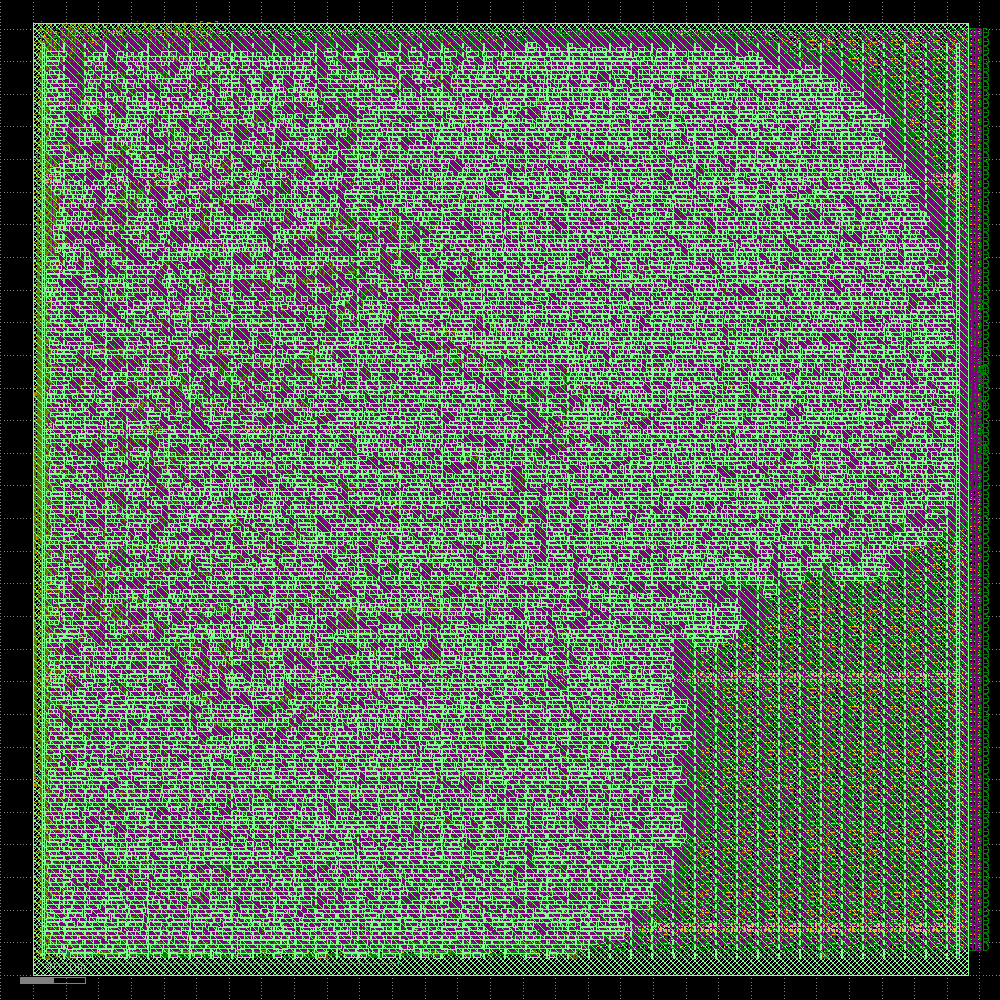

In [ ]:
display(drt)

#### Fill Insertion

In [ ]:
FillInsertion = Step.factory.get("OpenROAD.FillInsertion")

fill = FillInsertion(state_in=drt.state_out)
fill.start()

───────────────────────────────────────────────── Fill Insertion ──────────────────────────────────────────────────

[12:50:56] VERBOSE  Running 'OpenROAD.FillInsertion'… (Log:                                            ]8;id=90716;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=804286;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=860184;file:///content/openlane_run/11-openroad-fillinsertion/openroad-fillinsertion.log\.]8;;\]8;id=86103;file:///content/openlane_run/11-openroad-fillinsertion/openroad-fillinsertion.log\/openlane_run/11-openroad-fillinsertion/]8;;\]8;id=780098;file:///content/openlane_run/11-openroad-fillinsertion/openroad-fillinsertion.log\openroad-fillinsertion.log]8;;\)                           

Reading OpenROAD database at '/content/openlane_run/10-openroad-detailedrouting/core.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clock…

[INFO] Setting output delay to: 2

[INFO] Setting input delay to: 2

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

sky130_ef_sc_hd__decap_12 sky130_fd_sc_hd__decap_8 sky130_fd_sc_hd__decap_6 sky130_fd_sc_hd__decap_4               
sky130_fd_sc_hd__decap_3 sky130_fd_sc_hd__fill*

[INFO DPL-0001] Placed 18542 filler instances.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/11-openroad-fillinsertion/core.odb'…

Writing netlist to '/content/openlane_run/11-openroad-fillinsertion/core.nl.v'…

Writing powered netlist to '/content/openlane_run/11-openroad-fillinsertion/core.pnl.v'…

Writing layout to '/content/openlane_run/11-openroad-fillinsertion/core.def'…

Writing timing constraints to '/content/openlane_run/11-openroad-fillinsertion/core.sdc'…

Format,Path
nl,openlane_run/11-openroad-fillinsertion/core.nl.v
pnl,openlane_run/11-openroad-fillinsertion/core.pnl.v
def,openlane_run/11-openroad-fillinsertion/core.def
odb,openlane_run/11-openroad-fillinsertion/core.odb
sdc,openlane_run/11-openroad-fillinsertion/core.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:51:04] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=439043;file:///tmp/tmpwmrsdbxd/klayout-render.log\/tmp/tmpwmrsdbxd/]8;;\]8;id=20208;file:///tmp/tmpwmrsdbxd/klayout-render.log\klayout-render.log]8;;\)               ]8;id=856717;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=675052;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 3.03s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
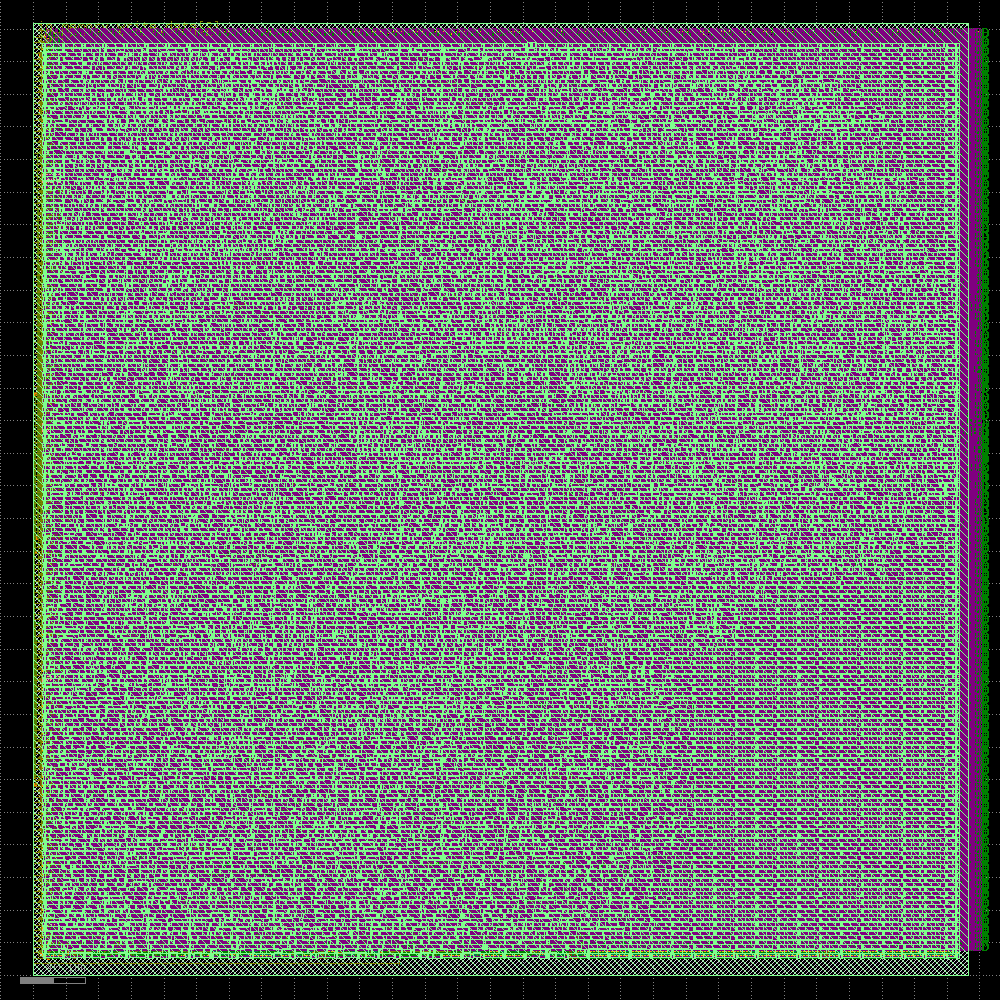

In [ ]:
display(fill)

#### **Parasitics Extraction a.k.a. Resistance/Capacitance Extraction (RCX)**

**Dear distinguished jury members, colleagues, and fellow developers,**

We would like to bring to your attention that we have utilized OpenLANE2, the next generation of OpenLANE, which has been rewritten from scratch with a modular architecture. As of the time of our submission, the official version is still under active development, and we have proactively provided feedback on several issues and suggested improvements.

At the time of our submission,** the timing analysis (STA) of the RCX stage was not yet stabilized**, *even for the official SPM examples*. We have already communicated this concern to the development team.

Furthermore, we have made available the results of a complete, end-to-end flow with successful signoff, based on a local OpenLANE Docker implementation, on our GitHub repository**:https://github.com/lyaniix/ChatChisel-core** We welcome everyone to access and review these artifacts.

We appreciate your understanding and consideration of the current state of the OpenLANE2 development, and we look forward to your valuable feedback.

In [ ]:
RCX = Step.factory.get("OpenROAD.RCX")

rcx = RCX(state_in=fill.state_out)
rcx.start()

─────────────────────────────────── Parasitic Resistance/Capacitance Extraction ───────────────────────────────────

[12:51:13] VERBOSE  Running 'OpenROAD.RCX'… (Log: ]8;id=981606;file:///content/openlane_run/12-openroad-rcx/openroad-rcx.log\.]8;;\]8;id=898767;file:///content/openlane_run/12-openroad-rcx/openroad-rcx.log\/openlane_run/12-openroad-rcx/]8;;\]8;id=961908;file:///content/openlane_run/12-openroad-rcx/openroad-rcx.log\openroad-rcx.log]8;;\)     ]8;id=384226;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=809849;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

[12:51:13] INFO     Running RCX for corners matching nom_*                                         ]8;id=277309;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=996305;file:///content/openlane_ipynb/openlane/steps/openroad.py#1653\1653]8;;\
                    (/content/openlane_run/12-openroad-rcx/nom/rcx.log)…                                           

[12:51:13] INFO     Running RCX for corners matching min_*                                         ]8;id=847682;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=68924;file:///content/openlane_ipynb/openlane/steps/openroad.py#1653\1653]8;;\
                    (/content/openlane_run/12-openroad-rcx/min/rcx.log)…                                           

[12:51:16] ERROR    Failed RCX for the corners matching min_*:                                     ]8;id=89217;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=497998;file:///content/openlane_ipynb/openlane/steps/openroad.py#1664\1664]8;;\

[12:51:16] ERROR    Failed RCX for the corners matching nom_*:                                     ]8;id=752702;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=337222;file:///content/openlane_ipynb/openlane/steps/openroad.py#1664\1664]8;;\

[12:51:16] INFO     Running RCX for corners matching max_*                                         ]8;id=317251;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=154380;file:///content/openlane_ipynb/openlane/steps/openroad.py#1653\1653]8;;\
                    (/content/openlane_run/12-openroad-rcx/max/rcx.log)…                                           

StepSignalled: Parasitics (RC) Extraction: Interrupted (SIGSEGV)

#### ***Static Timing Analysis (Post-PnR)***

**Dear distinguished jury members, colleagues, and fellow developers,**

We would like to bring to your attention that we have utilized OpenLANE2, the next generation of OpenLANE, which has been rewritten from scratch with a modular architecture. As of the time of our submission, the official version is still under active development, and we have proactively provided feedback on several issues and suggested improvements.

At the time of our submission,** the timing analysis (STA) of the post-place-and-route (Post-PnR) stage was not yet stabilized**, *even for the official SPM examples*. We have already communicated this concern to the development team.

Furthermore, we have made available the results of a complete, end-to-end flow with successful signoff, based on a local OpenLANE Docker implementation, on our GitHub repository. We welcome everyone to access and review these artifacts.

We appreciate your understanding and consideration of the current state of the OpenLANE2 development, and we look forward to your valuable feedback.

In [ ]:
STAPostPNR = Step.factory.get("OpenROAD.STAPostPNR")

sta_post_pnr = STAPostPNR(state_in=rcx.state_out)
sta_post_pnr.start()

#### Stream-out

In [ ]:
StreamOut = Step.factory.get("KLayout.StreamOut")

gds = StreamOut(state_in=fill.state_out)
gds.start()

─────────────────────────────────────────── GDSII Stream Out (KLayout) ────────────────────────────────────────────

[12:51:45] VERBOSE  Running 'KLayout.StreamOut'… (Log:                                                 ]8;id=411899;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=551186;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=908562;file:///content/openlane_run/13-klayout-streamout/klayout-streamout.log\.]8;;\]8;id=177245;file:///content/openlane_run/13-klayout-streamout/klayout-streamout.log\/openlane_run/13-klayout-streamout/]8;;\]8;id=668042;file:///content/openlane_run/13-klayout-streamout/klayout-streamout.log\klayout-streamout.log]8;;\)                                     

[INFO] Clearing cells…

[INFO] Merging GDS files…

[INFO] Copying top level cell 'core'…

[INFO] Checking for missing GDS…

[INFO] All LEF cells have matching GDS cells.

[INFO] Writing out GDS '/content/openlane_run/13-klayout-streamout/core.klayout.gds'…

[INFO] Done.

Format,Path
nl,openlane_run/11-openroad-fillinsertion/core.nl.v
pnl,openlane_run/11-openroad-fillinsertion/core.pnl.v
def,openlane_run/11-openroad-fillinsertion/core.def
odb,openlane_run/11-openroad-fillinsertion/core.odb
sdc,openlane_run/11-openroad-fillinsertion/core.sdc
gds,openlane_run/13-klayout-streamout/core.gds
klayout_gds,openlane_run/13-klayout-streamout/core.klayout.gds


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[12:51:55] VERBOSE  Running 'KLayout.Render'… (Log: ]8;id=452673;file:///tmp/tmpblf95zrt/klayout-render.log\/tmp/tmpblf95zrt/]8;;\]8;id=286219;file:///tmp/tmpblf95zrt/klayout-render.log\klayout-render.log]8;;\)               ]8;id=334456;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=944451;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

#### Time Elapsed: 3.75s
#### Views updated:
* GDSII Stream
* GDSII Stream (KLayout)
#### Preview:
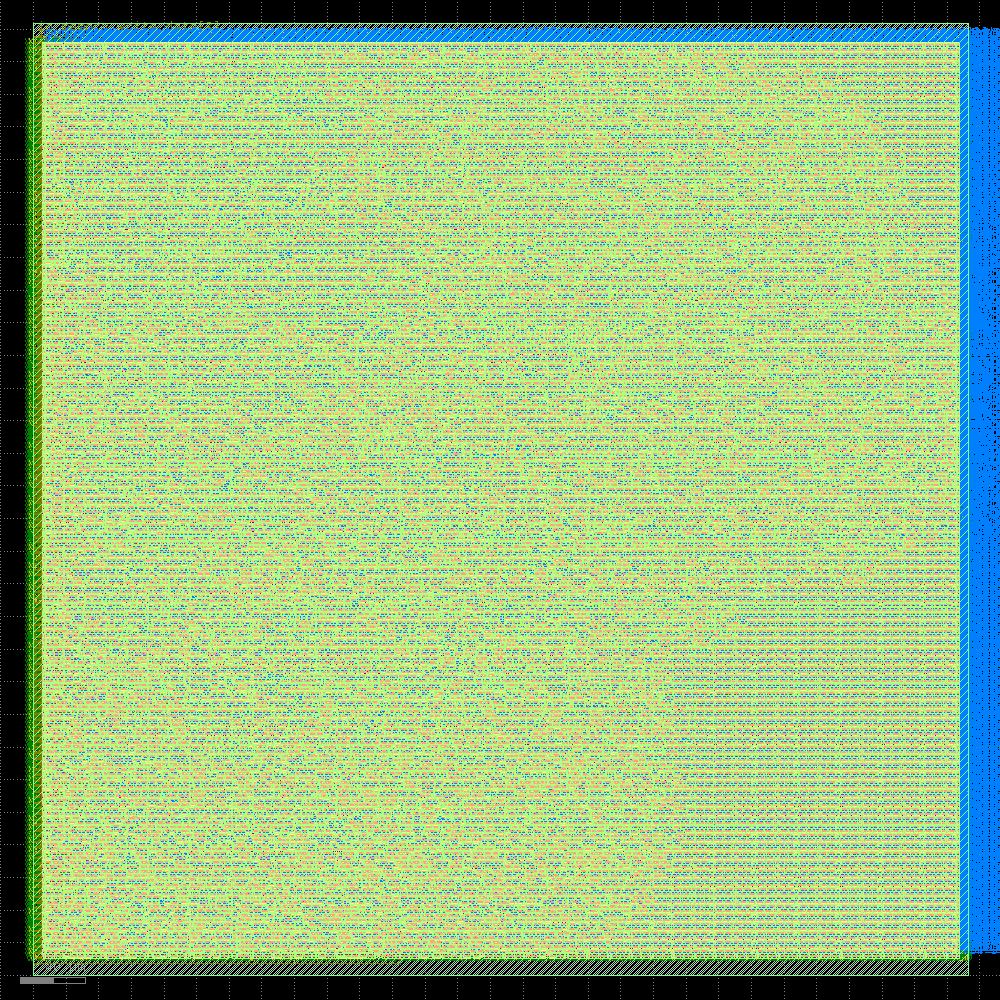

In [ ]:
display(gds)

#### Design Rule Checks (DRC)

In [ ]:
DRC = Step.factory.get("Magic.DRC")

drc = DRC(state_in=gds.state_out)
drc.start()

─────────────────────────────────────────────── Design Rule Checks ────────────────────────────────────────────────

[12:52:11] VERBOSE  Running 'Magic.DRC'… (Log: ]8;id=133670;file:///content/openlane_run/14-magic-drc/magic-drc.log\.]8;;\]8;id=493137;file:///content/openlane_run/14-magic-drc/magic-drc.log\/openlane_run/14-magic-drc/]8;;\]8;id=945046;file:///content/openlane_run/14-magic-drc/magic-drc.log\magic-drc.log]8;;\)              ]8;id=786886;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=192156;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

Magic 8.3 revision 466 - Compiled on Thu Mar 21 17:31:46 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

Warning: Calma reading is not undoable!  I hope that's OK.

Library written using GDS-II Release 6.0

Library name: LIB

Reading "VIA_M3M4_PR".

Reading "VIA_M2M3_PR".

Reading "VIA_M1M2_PR_MR".

Reading "VIA_M1M2_PR".

Reading "VIA_L1M1_PR_MR".

Reading "VIA_via2_3_1600_480_1_5_320_320".

Reading "VIA_via3_4_1600_480_1_4_400_400".

Reading "VIA_via4_5_1600_480_1_4_400_400".

Reading "VIA_via5_6_1600_1600_1_1_1600_1600".

Reading "sky130_fd_sc_hd__clkbuf_8".

Reading "sky130_fd_sc_hd__clkbuf_16".

Reading "sky130_fd_sc_hd__dfxtp_2".

Reading "sky130_fd_sc_hd__nand4b_2".

Reading "sky130_fd_sc_hd__nor3b_2".

Reading "sky130_fd_sc_hd__a311oi_2".

Reading "sky130_fd_sc_hd__o21bai_2".

Reading "sky130_fd_sc_hd__o41a_2".

Reading "sky130_fd_sc_hd__o31ai_2".

Reading "sky130_fd_sc_hd__a311o_2".

Reading "sky130_fd_sc_hd__o22ai_2".

Reading "sky130_fd_sc_hd__a41oi_2".

Reading "sky130_fd_sc_hd__a32oi_2".

Reading "sky130_fd_sc_hd__nor4b_2".

Reading "sky130_fd_sc_hd__and4b_2".

Reading "sky130_fd_sc_hd__o32a_2".

Reading "sky130_fd_sc_hd__a32o_2".

Reading "sky130_fd_sc_hd__nor4_2".

Reading "sky130_fd_sc_hd__or4b_2".

Reading "sky130_fd_sc_hd__o211ai_2".

Reading "sky130_fd_sc_hd__o311a_2".

Reading "sky130_fd_sc_hd__nor3_2".

Reading "sky130_fd_sc_hd__nand3b_2".

Reading "sky130_fd_sc_hd__a211oi_2".

Reading "sky130_fd_sc_hd__a41o_2".

Reading "sky130_fd_sc_hd__a31oi_2".

Reading "sky130_fd_sc_hd__o31a_2".

Reading "sky130_fd_sc_hd__or3b_2".

Reading "sky130_fd_sc_hd__a22oi_2".

Reading "sky130_fd_sc_hd__a221oi_2".

Reading "sky130_fd_sc_hd__o21ba_2".

Reading "sky130_fd_sc_hd__o221ai_2".

Reading "sky130_fd_sc_hd__a21bo_2".

Reading "sky130_fd_sc_hd__a21boi_2".

Reading "sky130_fd_sc_hd__and3b_2".

Reading "sky130_fd_sc_hd__o221a_2".

Reading "sky130_fd_sc_hd__o2bb2a_2".

Reading "sky130_fd_sc_hd__a2111o_2".

Reading "sky130_fd_sc_hd__o2111a_2".

Reading "sky130_fd_sc_hd__nand4_2".

Reading "sky130_fd_sc_hd__and4_2".

Reading "sky130_fd_sc_hd__or4bb_2".

Reading "sky130_fd_sc_hd__and4bb_2".

Reading "sky130_fd_sc_hd__a21oi_2".

Reading "sky130_fd_sc_hd__xor2_2".

Reading "sky130_fd_sc_hd__a2bb2o_2".

Reading "sky130_fd_sc_hd__a22o_2".

Reading "sky130_fd_sc_hd__mux2_1".

Reading "sky130_fd_sc_hd__mux4_2".

Reading "sky130_fd_sc_hd__a211o_2".

Reading "sky130_fd_sc_hd__o211a_2".

Reading "sky130_fd_sc_hd__o21ai_2".

Reading "sky130_fd_sc_hd__a221o_2".

Reading "sky130_fd_sc_hd__o21a_2".

Reading "sky130_fd_sc_hd__xnor2_2".

Reading "sky130_fd_sc_hd__or3_2".

Reading "sky130_fd_sc_hd__or2_2".

Reading "sky130_fd_sc_hd__or4_2".

Reading "sky130_fd_sc_hd__o22a_2".

Reading "sky130_fd_sc_hd__nand2b_2".

Reading "sky130_fd_sc_hd__and3_2".

Reading "sky130_fd_sc_hd__a21o_2".

Reading "sky130_fd_sc_hd__nand2_2".

Reading "sky130_fd_sc_hd__nor2_2".

Reading "sky130_fd_sc_hd__a31o_2".

Reading "sky130_fd_sc_hd__nand3_2".

Reading "sky130_fd_sc_hd__and2b_2".

Reading "sky130_fd_sc_hd__and2_2".

Reading "sky130_fd_sc_hd__inv_2".

Reading "sky130_fd_sc_hd__tapvpwrvgnd_1".

Reading "sky130_fd_sc_hd__fill_2".

Reading "sky130_fd_sc_hd__decap_4".

Reading "sky130_fd_sc_hd__decap_8".

Reading "sky130_fd_sc_hd__decap_6".

Reading "sky130_fd_sc_hd__fill_1".

Reading "sky130_ef_sc_hd__decap_12".

Reading "sky130_fd_sc_hd__decap_3".

Reading "core".

5000 uses

10000 uses

15000 uses

20000 uses

25000 uses

30000 uses

35000 uses

40000 uses

45000 uses

50000 uses

55000 uses

60000 uses

65000 uses

70000 uses

75000 uses

80000 uses

85000 uses

90000 uses

95000 uses

100000 uses

105000 uses

110000 uses

115000 uses

120000 uses

125000 uses

130000 uses

135000 uses

140000 uses

145000 uses

150000 uses

155000 uses

[INFO] Loading core

DRC style is now "drc(full)"

Loading DRC CIF style.

No errors found.

[INFO] COUNT: 0

[INFO] Should be divided by 3 or 4

[INFO] DRC Checking DONE (/content/openlane_run/14-magic-drc/reports/drc_violations.magic.rpt)

[INFO] Saving mag view with DRC errors (/content/openlane_run/14-magic-drc/views/core.drc.mag)

[INFO] Saved

Format,Path
nl,openlane_run/11-openroad-fillinsertion/core.nl.v
pnl,openlane_run/11-openroad-fillinsertion/core.pnl.v
def,openlane_run/11-openroad-fillinsertion/core.def
odb,openlane_run/11-openroad-fillinsertion/core.odb
sdc,openlane_run/11-openroad-fillinsertion/core.sdc
gds,openlane_run/13-klayout-streamout/core.gds
klayout_gds,openlane_run/13-klayout-streamout/core.klayout.gds


#### SPICE Extraction for Layout vs. Schematic Check

In [ ]:
SpiceExtraction = Step.factory.get("Magic.SpiceExtraction")

spx = SpiceExtraction(state_in=drc.state_out)
spx.start()

───────────────────────────────────────────── SPICE Model Extraction ──────────────────────────────────────────────

[12:56:07] VERBOSE  Running 'Magic.SpiceExtraction'… (Log:                                             ]8;id=181280;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=374638;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\
                    ]8;id=465733;file:///content/openlane_run/15-magic-spiceextraction/magic-spiceextraction.log\.]8;;\]8;id=187213;file:///content/openlane_run/15-magic-spiceextraction/magic-spiceextraction.log\/openlane_run/15-magic-spiceextraction/]8;;\]8;id=564231;file:///content/openlane_run/15-magic-spiceextraction/magic-spiceextraction.log\magic-spiceextraction.log]8;;\)                             

Magic 8.3 revision 466 - Compiled on Thu Mar 21 17:31:46 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef.

This action cannot be undone.

LEF read, Line 78 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 79 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 112 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 114 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 115 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 121 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 122 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 123 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 156 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 164 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 165 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 167 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 168 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 169 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 206 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 207 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 209 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 210 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 211 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 248 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 249 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 251 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 252 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 253 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 290 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 291 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read: Processed 797 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 278 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 68740 lines.

> def read /content/openlane_run/11-openroad-fillinsertion/core.def -noblockage -labels

Reading DEF data from file /content/openlane_run/11-openroad-fillinsertion/core.def.

This action cannot be undone.

Processed 4 vias total.

Processed 36839 subcell instances total.

Processed 170 pins total.

Processed 2 special nets total.

Processed 13480 nets total.

DEF read: Processed 307174 lines.

Moving label "_00011_" from metal1 to via1 in cell core.

Moving label "_00022_" from metal1 to via1 in cell core.

Moving label "_00028_" from metal1 to viali in cell core.

Moving label "_00033_" from metal2 to via1 in cell core.

Moving label "_00036_" from metal1 to via1 in cell core.

Moving label "_00039_" from metal1 to via1 in cell core.

Moving label "_00070_" from metal1 to via1 in cell core.

Moving label "_00078_" from metal1 to via1 in cell core.

Moving label "_00088_" from metal1 to via1 in cell core.

Moving label "_00089_" from metal1 to via1 in cell core.

Moving label "_00091_" from metal1 to via1 in cell core.

Moving label "_00100_" from metal1 to via1 in cell core.

Moving label "_00105_" from metal1 to via1 in cell core.

Moving label "_00112_" from metal1 to via1 in cell core.

Moving label "_00144_" from metal1 to via1 in cell core.

Moving label "_00146_" from metal1 to via1 in cell core.

Moving label "_00152_" from metal1 to via1 in cell core.

Moving label "_00164_" from metal1 to via1 in cell core.

Moving label "_00188_" from metal1 to via1 in cell core.

Moving label "_00192_" from metal1 to via1 in cell core.

Moving label "_00193_" from metal1 to via1 in cell core.

Moving label "_00194_" from metal1 to via1 in cell core.

Moving label "_00201_" from metal1 to via1 in cell core.

Moving label "_00205_" from metal1 to via1 in cell core.

Moving label "_00236_" from metal1 to via1 in cell core.

Moving label "_00240_" from metal1 to via1 in cell core.

Moving label "_00246_" from metal1 to via1 in cell core.

Moving label "_00255_" from metal1 to via1 in cell core.

Moving label "_00261_" from metal1 to via1 in cell core.

Moving label "_00268_" from metal1 to via1 in cell core.

Moving label "_00273_" from metal1 to via1 in cell core.

Moving label "_00275_" from metal1 to via1 in cell core.

Moving label "_00283_" from metal1 to via1 in cell core.

Moving label "_00301_" from metal1 to via1 in cell core.

Moving label "_00307_" from metal1 to via1 in cell core.

Moving label "_00343_" from metal1 to via1 in cell core.

Moving label "_00367_" from metal1 to via1 in cell core.

Moving label "_00368_" from metal1 to via1 in cell core.

Moving label "_00369_" from metal1 to via1 in cell core.

Moving label "_00371_" from metal1 to via1 in cell core.

Moving label "_00379_" from metal1 to via1 in cell core.

Moving label "_00383_" from metal1 to via1 in cell core.

Moving label "_00386_" from metal1 to via1 in cell core.

Moving label "_00389_" from metal1 to via1 in cell core.

Moving label "_00390_" from metal2 to via2 in cell core.

Moving label "_00393_" from metal2 to via2 in cell core.

Moving label "_00401_" from metal1 to via1 in cell core.

Moving label "_00407_" from metal1 to via1 in cell core.

Moving label "_00414_" from metal2 to via2 in cell core.

Moving label "_00421_" from metal1 to via1 in cell core.

Moving label "_00431_" from metal1 to viali in cell core.

Moving label "_00434_" from metal1 to via1 in cell core.

Moving label "_00437_" from metal1 to via1 in cell core.

Moving label "_00440_" from metal1 to via1 in cell core.

Moving label "_00444_" from metal1 to via1 in cell core.

Moving label "_00446_" from metal1 to via1 in cell core.

Moving label "_00449_" from metal1 to via1 in cell core.

Moving label "_00454_" from metal1 to via1 in cell core.

Moving label "_00476_" from metal1 to via1 in cell core.

Moving label "_00484_" from metal1 to via1 in cell core.

Moving label "_00501_" from metal1 to via1 in cell core.

Moving label "_00502_" from metal2 to via2 in cell core.

Moving label "_00511_" from metal1 to via1 in cell core.

Moving label "_00515_" from metal1 to via1 in cell core.

Moving label "_00534_" from metal3 to via3 in cell core.

Moving label "_00537_" from metal1 to via1 in cell core.

Moving label "_00540_" from metal1 to via1 in cell core.

Moving label "_00542_" from metal3 to via3 in cell core.

Moving label "_00549_" from metal1 to via1 in cell core.

Moving label "_00571_" from metal2 to via1 in cell core.

Moving label "_00574_" from metal1 to via1 in cell core.

Moving label "_00575_" from metal1 to via1 in cell core.

Moving label "_00580_" from metal1 to via1 in cell core.

Moving label "_00586_" from metal1 to via1 in cell core.

Moving label "_00606_" from metal1 to via1 in cell core.

Moving label "_00608_" from metal1 to via1 in cell core.

Moving label "_00611_" from metal1 to via1 in cell core.

Moving label "_00612_" from metal1 to via1 in cell core.

Moving label "_00618_" from metal1 to via1 in cell core.

Moving label "_00622_" from metal1 to viali in cell core.

Moving label "_00631_" from metal3 to via3 in cell core.

Moving label "_00666_" from metal1 to via1 in cell core.

Moving label "_00691_" from metal1 to via1 in cell core.

Moving label "_00707_" from metal1 to viali in cell core.

Moving label "_00711_" from metal1 to via1 in cell core.

Moving label "_00724_" from metal1 to via1 in cell core.

Moving label "_00734_" from metal2 to via2 in cell core.

Moving label "_00748_" from metal3 to via3 in cell core.

Moving label "_00756_" from metal2 to via2 in cell core.

Moving label "_00758_" from metal2 to via2 in cell core.

Moving label "_00763_" from metal1 to via1 in cell core.

Moving label "_00781_" from metal1 to via1 in cell core.

Moving label "_00793_" from metal1 to via1 in cell core.

Moving label "_00796_" from metal1 to via1 in cell core.

Moving label "_00801_" from metal1 to viali in cell core.

Moving label "_00830_" from metal1 to via1 in cell core.

Moving label "_00834_" from metal1 to via1 in cell core.

Moving label "_00843_" from metal2 to via2 in cell core.

Moving label "_00847_" from metal1 to via1 in cell core.

Moving label "_00864_" from metal1 to via1 in cell core.

Moving label "_00871_" from metal1 to via1 in cell core.

Moving label "_00875_" from metal1 to via1 in cell core.

Moving label "_00877_" from metal1 to via1 in cell core.

Moving label "_00882_" from metal1 to via1 in cell core.

Moving label "_00883_" from metal1 to via1 in cell core.

Moving label "_00886_" from metal1 to via1 in cell core.

Moving label "_00887_" from metal3 to via3 in cell core.

Moving label "_00888_" from metal1 to viali in cell core.

Moving label "_00896_" from metal1 to viali in cell core.

Moving label "_00902_" from metal1 to via1 in cell core.

Moving label "_00903_" from metal3 to via3 in cell core.

Moving label "_00906_" from metal1 to via1 in cell core.

Moving label "_00907_" from metal1 to via1 in cell core.

Moving label "_00921_" from metal1 to via1 in cell core.

Moving label "_00923_" from metal1 to via1 in cell core.

Moving label "_00938_" from metal1 to via1 in cell core.

Moving label "_00948_" from metal1 to via1 in cell core.

Moving label "_00968_" from metal1 to viali in cell core.

Moving label "_00980_" from metal1 to via1 in cell core.

Moving label "_01006_" from metal1 to via1 in cell core.

Moving label "_01024_" from metal1 to via1 in cell core.

Moving label "_01033_" from metal1 to via1 in cell core.

Moving label "_01042_" from metal1 to via1 in cell core.

Moving label "_01044_" from metal1 to via1 in cell core.

Moving label "_01075_" from metal1 to via1 in cell core.

Moving label "_01091_" from metal1 to via1 in cell core.

Moving label "_01094_" from metal1 to viali in cell core.

Moving label "_01098_" from metal1 to via1 in cell core.

Moving label "_01099_" from metal1 to via1 in cell core.

Moving label "_01106_" from metal1 to viali in cell core.

Moving label "_01112_" from metal1 to via1 in cell core.

Moving label "_01121_" from metal1 to via1 in cell core.

Moving label "_01140_" from metal1 to via1 in cell core.

Moving label "_01149_" from metal1 to via1 in cell core.

Moving label "_01154_" from metal1 to via1 in cell core.

Moving label "_01160_" from metal1 to via1 in cell core.

Moving label "_01171_" from metal1 to via1 in cell core.

Moving label "_01180_" from metal1 to via1 in cell core.

Moving label "_01192_" from metal1 to via1 in cell core.

Moving label "_01194_" from metal2 to via1 in cell core.

Moving label "_01200_" from metal1 to via1 in cell core.

Moving label "_01205_" from metal1 to via1 in cell core.

Moving label "_01206_" from metal1 to via1 in cell core.

Moving label "_01216_" from metal1 to via1 in cell core.

Moving label "_01236_" from metal1 to via1 in cell core.

Moving label "_01244_" from metal1 to via1 in cell core.

Moving label "_01253_" from metal1 to via1 in cell core.

Moving label "_01265_" from metal1 to via1 in cell core.

Moving label "_01286_" from metal1 to via1 in cell core.

Moving label "_01299_" from metal1 to via1 in cell core.

Moving label "_01302_" from metal1 to via1 in cell core.

Moving label "_01317_" from metal1 to via1 in cell core.

Moving label "_01328_" from metal1 to viali in cell core.

Moving label "_01331_" from metal1 to via1 in cell core.

Moving label "_01334_" from metal1 to via1 in cell core.

Moving label "_01347_" from metal1 to via1 in cell core.

Moving label "_01352_" from metal1 to via1 in cell core.

Moving label "_01353_" from metal1 to viali in cell core.

Moving label "_01367_" from metal1 to via1 in cell core.

Moving label "_01371_" from metal1 to via1 in cell core.

Moving label "_01372_" from metal1 to via1 in cell core.

Moving label "_01374_" from metal1 to via1 in cell core.

Moving label "_01399_" from metal1 to via1 in cell core.

Moving label "_01466_" from metal1 to via1 in cell core.

Moving label "_01478_" from metal1 to viali in cell core.

Moving label "_01480_" from metal1 to via1 in cell core.

Moving label "_01542_" from metal1 to via1 in cell core.

Moving label "_01548_" from metal1 to via1 in cell core.

Moving label "_01570_" from metal1 to via1 in cell core.

Moving label "_01606_" from metal1 to viali in cell core.

Moving label "_01611_" from metal1 to via1 in cell core.

Moving label "_01612_" from metal1 to via1 in cell core.

Moving label "_01616_" from metal1 to viali in cell core.

Moving label "_01622_" from metal1 to via1 in cell core.

Moving label "_01630_" from metal1 to via1 in cell core.

Moving label "_01634_" from metal1 to viali in cell core.

Moving label "_01648_" from metal1 to via1 in cell core.

Moving label "_01662_" from metal1 to viali in cell core.

Moving label "_01668_" from metal1 to via1 in cell core.

Moving label "_01671_" from metal1 to via1 in cell core.

Moving label "_01672_" from metal1 to via1 in cell core.

Moving label "_01673_" from metal1 to via1 in cell core.

Moving label "_01677_" from metal1 to via1 in cell core.

Moving label "_01682_" from metal1 to via1 in cell core.

Moving label "_01684_" from metal1 to via1 in cell core.

Moving label "_01686_" from metal1 to viali in cell core.

Moving label "_01687_" from metal1 to via1 in cell core.

Moving label "_01698_" from metal1 to via1 in cell core.

Moving label "_01704_" from metal1 to via1 in cell core.

Moving label "_01705_" from metal1 to via1 in cell core.

Moving label "_01724_" from metal1 to via1 in cell core.

Moving label "_01725_" from metal1 to via1 in cell core.

Moving label "_01731_" from metal1 to via1 in cell core.

Moving label "_01734_" from metal1 to via1 in cell core.

Moving label "_01745_" from metal1 to via1 in cell core.

Moving label "_01747_" from metal1 to via1 in cell core.

Moving label "_01763_" from metal1 to via1 in cell core.

Moving label "_01764_" from metal1 to via1 in cell core.

Moving label "_01775_" from metal1 to via1 in cell core.

Moving label "_01780_" from metal1 to viali in cell core.

Moving label "_01787_" from metal1 to via1 in cell core.

Moving label "_01791_" from metal1 to via1 in cell core.

Moving label "_01793_" from metal1 to via1 in cell core.

Moving label "_01806_" from metal1 to via1 in cell core.

Moving label "_01808_" from metal1 to via1 in cell core.

Moving label "_01832_" from metal1 to via1 in cell core.

Moving label "_01860_" from metal1 to via1 in cell core.

Moving label "_01864_" from metal1 to via1 in cell core.

Moving label "_01881_" from metal1 to via1 in cell core.

Moving label "_01907_" from metal1 to via1 in cell core.

Moving label "_01913_" from metal1 to via1 in cell core.

Moving label "_01957_" from metal1 to via1 in cell core.

Moving label "_01958_" from metal1 to via1 in cell core.

Moving label "_01968_" from metal1 to via1 in cell core.

Moving label "_01975_" from metal1 to via1 in cell core.

Moving label "_01977_" from metal1 to via1 in cell core.

Moving label "_01979_" from metal1 to via1 in cell core.

Moving label "_01980_" from metal1 to via1 in cell core.

Moving label "_02002_" from metal1 to via1 in cell core.

Moving label "_02027_" from metal1 to via1 in cell core.

Moving label "_02032_" from metal1 to via1 in cell core.

Moving label "_02069_" from metal1 to via1 in cell core.

Moving label "_02097_" from metal1 to via1 in cell core.

Moving label "_02102_" from metal1 to via1 in cell core.

Moving label "_02110_" from metal1 to via1 in cell core.

Moving label "_02116_" from metal1 to via1 in cell core.

Moving label "_02122_" from metal1 to via1 in cell core.

Moving label "_02127_" from metal1 to viali in cell core.

Moving label "_02131_" from metal1 to via1 in cell core.

Moving label "_02134_" from metal2 to via1 in cell core.

Moving label "_02138_" from metal1 to via1 in cell core.

Moving label "_02142_" from metal1 to via1 in cell core.

Moving label "_02143_" from metal1 to via1 in cell core.

Moving label "_02144_" from metal1 to viali in cell core.

Moving label "_02145_" from metal1 to via1 in cell core.

Moving label "_02155_" from metal1 to via1 in cell core.

Moving label "_02157_" from metal1 to via1 in cell core.

Moving label "_02163_" from metal1 to via1 in cell core.

Moving label "_02165_" from metal1 to via1 in cell core.

Moving label "_02169_" from metal1 to via1 in cell core.

Moving label "_02177_" from metal1 to via1 in cell core.

Moving label "_02180_" from metal1 to via1 in cell core.

Moving label "_02183_" from metal1 to via1 in cell core.

Moving label "_02190_" from metal1 to via1 in cell core.

Moving label "_02213_" from metal1 to via1 in cell core.

Moving label "_02222_" from metal1 to via1 in cell core.

Moving label "_02224_" from metal1 to viali in cell core.

Moving label "_02233_" from metal1 to via1 in cell core.

Moving label "_02277_" from metal1 to via1 in cell core.

Moving label "_02284_" from metal1 to viali in cell core.

Moving label "_02298_" from metal1 to via1 in cell core.

Moving label "_02311_" from metal1 to viali in cell core.

Moving label "_02319_" from metal1 to via1 in cell core.

Moving label "_02330_" from metal1 to via1 in cell core.

Moving label "_02341_" from metal1 to via1 in cell core.

Moving label "_02364_" from metal1 to via1 in cell core.

Moving label "_02365_" from metal1 to via1 in cell core.

Moving label "_02371_" from metal1 to via1 in cell core.

Moving label "_02374_" from metal1 to via1 in cell core.

Moving label "_02375_" from metal1 to via1 in cell core.

Moving label "_02388_" from metal1 to viali in cell core.

Moving label "_02389_" from metal1 to via1 in cell core.

Moving label "_02391_" from metal1 to via1 in cell core.

Moving label "_02392_" from metal1 to via1 in cell core.

Moving label "_02402_" from metal1 to via1 in cell core.

Moving label "_02404_" from metal1 to via1 in cell core.

Moving label "_02423_" from metal1 to via1 in cell core.

Moving label "_02446_" from metal1 to via1 in cell core.

Moving label "_02447_" from metal1 to via1 in cell core.

Moving label "_02458_" from metal1 to via1 in cell core.

Moving label "_02477_" from metal1 to viali in cell core.

Moving label "_02485_" from metal1 to via1 in cell core.

Moving label "_02487_" from metal1 to via1 in cell core.

Moving label "_02493_" from metal1 to via1 in cell core.

Moving label "_02505_" from metal1 to via1 in cell core.

Moving label "_02508_" from metal1 to via1 in cell core.

Moving label "_02514_" from metal1 to viali in cell core.

Moving label "_02520_" from metal1 to via1 in cell core.

Moving label "_02540_" from metal1 to via1 in cell core.

Moving label "_02542_" from metal1 to via1 in cell core.

Moving label "_02576_" from metal1 to via1 in cell core.

Moving label "_02593_" from metal1 to via1 in cell core.

Moving label "_02598_" from metal1 to via1 in cell core.

Moving label "_02613_" from metal1 to via1 in cell core.

Moving label "_02615_" from metal1 to via1 in cell core.

Moving label "_02618_" from metal1 to via1 in cell core.

Moving label "_02638_" from metal1 to via1 in cell core.

Moving label "_02644_" from metal1 to via1 in cell core.

Moving label "_02655_" from metal1 to viali in cell core.

Moving label "_02666_" from metal1 to via1 in cell core.

Moving label "_02679_" from metal1 to via1 in cell core.

Moving label "_02682_" from metal1 to via1 in cell core.

Moving label "_02690_" from metal1 to via1 in cell core.

Moving label "_02706_" from metal1 to via1 in cell core.

Moving label "_02716_" from metal1 to via1 in cell core.

Moving label "_02727_" from metal1 to via1 in cell core.

Moving label "_02736_" from metal1 to via1 in cell core.

Moving label "_02759_" from metal1 to via1 in cell core.

Moving label "_02775_" from metal1 to via1 in cell core.

Moving label "_02805_" from metal1 to via1 in cell core.

Moving label "_02810_" from metal1 to via1 in cell core.

Moving label "_02834_" from metal1 to via1 in cell core.

Moving label "_02852_" from metal1 to via1 in cell core.

Moving label "_02856_" from metal1 to via1 in cell core.

Moving label "_02865_" from metal1 to via1 in cell core.

Moving label "_02889_" from metal1 to viali in cell core.

Moving label "_02903_" from metal1 to via1 in cell core.

Moving label "_02904_" from metal1 to via1 in cell core.

Moving label "_02906_" from metal1 to via1 in cell core.

Moving label "_02909_" from metal1 to via1 in cell core.

Moving label "_02922_" from metal1 to via1 in cell core.

Moving label "_02925_" from metal1 to via1 in cell core.

Moving label "_02935_" from metal1 to viali in cell core.

Moving label "_02943_" from metal1 to via1 in cell core.

Moving label "_02955_" from metal1 to via1 in cell core.

Moving label "_02974_" from metal1 to via1 in cell core.

Moving label "_02984_" from metal3 to via3 in cell core.

Moving label "_02989_" from metal2 to via2 in cell core.

Moving label "_03045_" from metal2 to via1 in cell core.

Moving label "_03055_" from metal1 to via1 in cell core.

Moving label "_03118_" from metal1 to viali in cell core.

Moving label "_03122_" from metal1 to via1 in cell core.

Moving label "_03124_" from metal1 to via1 in cell core.

Moving label "_03204_" from metal1 to viali in cell core.

Moving label "_03258_" from metal2 to via2 in cell core.

Moving label "_03282_" from metal2 to via2 in cell core.

Moving label "_03291_" from metal1 to via1 in cell core.

Moving label "_03336_" from metal2 to via2 in cell core.

Moving label "_03361_" from metal2 to via2 in cell core.

Moving label "_03404_" from metal1 to viali in cell core.

Moving label "_03415_" from metal1 to viali in cell core.

Moving label "_03428_" from metal1 to via1 in cell core.

Moving label "_03451_" from metal3 to via3 in cell core.

Moving label "_03462_" from metal1 to via1 in cell core.

Moving label "_03463_" from metal1 to viali in cell core.

Moving label "_03477_" from metal2 to via1 in cell core.

Moving label "_03479_" from metal3 to via3 in cell core.

Moving label "_03482_" from metal1 to via1 in cell core.

Moving label "_03513_" from metal2 to via2 in cell core.

Moving label "_03523_" from metal1 to via1 in cell core.

Moving label "_03534_" from metal1 to viali in cell core.

Moving label "_03552_" from metal1 to via1 in cell core.

Moving label "_03583_" from metal2 to via2 in cell core.

Moving label "_03609_" from metal2 to via2 in cell core.

Moving label "_03648_" from metal1 to via1 in cell core.

Moving label "_03668_" from metal1 to via1 in cell core.

Moving label "_03694_" from metal1 to via1 in cell core.

Moving label "_03697_" from metal2 to via2 in cell core.

Moving label "_03736_" from metal1 to via1 in cell core.

Moving label "_03737_" from metal1 to via1 in cell core.

Moving label "_03774_" from metal1 to viali in cell core.

Moving label "_03776_" from metal1 to viali in cell core.

Moving label "_03781_" from metal1 to viali in cell core.

Moving label "_03802_" from metal1 to viali in cell core.

Moving label "_03804_" from metal2 to via2 in cell core.

Moving label "_03811_" from metal3 to via3 in cell core.

Moving label "_03902_" from metal1 to viali in cell core.

Moving label "_03914_" from metal2 to via2 in cell core.

Moving label "_03917_" from metal1 to viali in cell core.

Moving label "_03937_" from metal2 to via1 in cell core.

Moving label "_03968_" from metal1 to viali in cell core.

Moving label "_04084_" from metal1 to via1 in cell core.

Moving label "_04123_" from metal1 to viali in cell core.

Moving label "_04148_" from metal1 to viali in cell core.

Moving label "_04211_" from metal1 to viali in cell core.

Moving label "_04231_" from metal1 to viali in cell core.

Moving label "_04237_" from metal1 to viali in cell core.

Moving label "_04250_" from metal1 to viali in cell core.

Moving label "_04254_" from metal1 to via1 in cell core.

Moving label "_04260_" from metal1 to viali in cell core.

Moving label "_04292_" from metal1 to viali in cell core.

Moving label "_04303_" from metal2 to via2 in cell core.

Moving label "_04321_" from metal1 to viali in cell core.

Moving label "_04394_" from metal1 to viali in cell core.

Moving label "_04399_" from metal1 to via1 in cell core.

Moving label "_04431_" from metal1 to viali in cell core.

Moving label "_04443_" from metal2 to via2 in cell core.

Moving label "_04452_" from metal1 to viali in cell core.

Moving label "_04494_" from metal1 to via1 in cell core.

Moving label "_04543_" from metal1 to via1 in cell core.

Moving label "_04634_" from metal1 to viali in cell core.

Moving label "_04642_" from metal2 to via2 in cell core.

Moving label "_04663_" from metal3 to via3 in cell core.

Moving label "_04674_" from metal1 to viali in cell core.

Moving label "_04733_" from metal1 to viali in cell core.

Moving label "_04748_" from metal1 to viali in cell core.

Moving label "_04910_" from metal1 to viali in cell core.

Moving label "_05005_" from metal1 to via1 in cell core.

Moving label "_05019_" from metal1 to viali in cell core.

Moving label "_05035_" from metal2 to via2 in cell core.

Moving label "_05130_" from metal2 to via2 in cell core.

Moving label "_05261_" from metal3 to via3 in cell core.

Moving label "_05277_" from metal2 to via2 in cell core.

Moving label "_05316_" from metal3 to via3 in cell core.

Moving label "_05317_" from metal1 to viali in cell core.

Moving label "_05331_" from metal2 to via2 in cell core.

Moving label "_05333_" from metal3 to via3 in cell core.

Moving label "_05370_" from metal2 to via2 in cell core.

Moving label "_05372_" from metal3 to via3 in cell core.

Moving label "_05398_" from metal1 to via1 in cell core.

Moving label "_05406_" from metal3 to via3 in cell core.

Moving label "_05420_" from metal1 to via1 in cell core.

Moving label "_05459_" from metal1 to viali in cell core.

Moving label "_05484_" from metal1 to via1 in cell core.

Moving label "_05502_" from metal1 to viali in cell core.

Moving label "_05526_" from metal2 to via2 in cell core.

Moving label "_05528_" from metal2 to via2 in cell core.

Moving label "_05541_" from metal2 to via2 in cell core.

Moving label "_05543_" from metal2 to via2 in cell core.

Moving label "_05550_" from metal1 to viali in cell core.

Moving label "_05581_" from metal1 to viali in cell core.

Moving label "_05590_" from metal1 to via1 in cell core.

Moving label "_05594_" from metal1 to via1 in cell core.

Moving label "_05608_" from metal1 to viali in cell core.

Moving label "_05621_" from metal1 to viali in cell core.

Moving label "_05625_" from metal1 to viali in cell core.

Moving label "_05668_" from metal2 to via2 in cell core.

Moving label "_05714_" from metal1 to viali in cell core.

Moving label "_05733_" from metal1 to viali in cell core.

Moving label "_05743_" from metal1 to via1 in cell core.

Moving label "_05749_" from metal1 to via1 in cell core.

Moving label "_05758_" from metal2 to via1 in cell core.

Moving label "_05906_" from metal2 to via2 in cell core.

Moving label "_05908_" from metal2 to via2 in cell core.

Moving label "_05935_" from metal1 to via1 in cell core.

Moving label "_05950_" from metal1 to via1 in cell core.

Moving label "_05973_" from metal1 to viali in cell core.

Moving label "_05993_" from metal1 to via1 in cell core.

Moving label "_06003_" from metal1 to viali in cell core.

Moving label "_06026_" from metal1 to via1 in cell core.

Moving label "_06078_" from metal1 to viali in cell core.

Moving label "_06226_" from metal1 to viali in cell core.

Moving label "_06239_" from metal1 to via1 in cell core.

Moving label "_06297_" from metal1 to viali in cell core.

Moving label "_06401_" from metal1 to via1 in cell core.

Moving label "_06410_" from metal1 to viali in cell core.

Moving label "_06458_" from metal1 to viali in cell core.

Moving label "_06475_" from metal1 to viali in cell core.

Moving label "_06479_" from metal2 to via2 in cell core.

Moving label "_06483_" from metal1 to viali in cell core.

Moving label "_06515_" from metal1 to viali in cell core.

Moving label "_06546_" from metal1 to viali in cell core.

Moving label "_06588_" from metal1 to via1 in cell core.

Moving label "_06591_" from metal1 to viali in cell core.

Moving label "_06635_" from metal1 to viali in cell core.

Moving label "_06673_" from metal2 to via1 in cell core.

Moving label "_06726_" from metal2 to via1 in cell core.

Moving label "_06739_" from metal2 to via1 in cell core.

Moving label "_06741_" from metal2 to via1 in cell core.

Moving label "_06758_" from metal1 to viali in cell core.

Moving label "_06878_" from metal2 to via2 in cell core.

Moving label "_07038_" from metal2 to via1 in cell core.

Moving label "_07074_" from metal1 to viali in cell core.

Moving label "_07078_" from metal2 to via2 in cell core.

Moving label "_07109_" from metal1 to viali in cell core.

Moving label "_07123_" from metal1 to viali in cell core.

Moving label "_07157_" from metal1 to via1 in cell core.

Moving label "_07195_" from metal1 to viali in cell core.

Moving label "_07261_" from metal2 to via2 in cell core.

Moving label "_07262_" from metal1 to viali in cell core.

Moving label "_07344_" from metal1 to viali in cell core.

Moving label "_07369_" from metal1 to viali in cell core.

Moving label "_07384_" from metal1 to viali in cell core.

Moving label "_07398_" from metal2 to via2 in cell core.

Moving label "_07505_" from metal3 to via3 in cell core.

Moving label "_07508_" from metal1 to viali in cell core.

Moving label "_07580_" from metal1 to via1 in cell core.

Moving label "_07594_" from metal1 to via1 in cell core.

Moving label "_07613_" from metal1 to viali in cell core.

Moving label "_07636_" from metal2 to via2 in cell core.

Moving label "_07697_" from metal2 to via2 in cell core.

Moving label "_07706_" from metal2 to via2 in cell core.

Moving label "_07739_" from metal1 to via1 in cell core.

Moving label "_07784_" from metal1 to via1 in cell core.

Moving label "_07812_" from metal1 to via1 in cell core.

Moving label "_07846_" from metal1 to via1 in cell core.

Moving label "_07874_" from metal1 to viali in cell core.

Moving label "_07921_" from metal1 to viali in cell core.

Moving label "_07981_" from metal1 to via1 in cell core.

Moving label "_08013_" from metal1 to via1 in cell core.

Moving label "_08064_" from metal2 to via2 in cell core.

Moving label "_08068_" from metal2 to via2 in cell core.

Moving label "_08075_" from metal1 to viali in cell core.

Moving label "_08089_" from metal1 to viali in cell core.

Moving label "_08092_" from metal2 to via1 in cell core.

Moving label "_08118_" from metal1 to via1 in cell core.

Moving label "_08172_" from metal1 to viali in cell core.

Moving label "_08174_" from metal2 to via2 in cell core.

Moving label "_08187_" from metal1 to viali in cell core.

Moving label "_08230_" from metal2 to via2 in cell core.

Moving label "_08249_" from metal1 to via1 in cell core.

Moving label "_08358_" from metal3 to via3 in cell core.

Moving label "_08377_" from metal1 to viali in cell core.

Moving label "_08388_" from metal2 to via2 in cell core.

Moving label "_08415_" from metal1 to via1 in cell core.

Moving label "_08461_" from metal1 to via1 in cell core.

Moving label "_08508_" from metal1 to via1 in cell core.

Moving label "_08542_" from metal1 to via1 in cell core.

Moving label "_08549_" from metal1 to viali in cell core.

Moving label "_08578_" from metal1 to via1 in cell core.

Moving label "_08582_" from metal1 to viali in cell core.

Moving label "_08671_" from metal2 to via2 in cell core.

Moving label "_08672_" from metal1 to viali in cell core.

Moving label "_08679_" from metal1 to viali in cell core.

Moving label "_08712_" from metal2 to via2 in cell core.

Moving label "_08736_" from metal2 to via2 in cell core.

Moving label "_08760_" from metal2 to via2 in cell core.

Moving label "_08777_" from metal2 to via2 in cell core.

Moving label "_08837_" from metal2 to via2 in cell core.

Moving label "_08849_" from metal1 to via1 in cell core.

Moving label "_08870_" from metal2 to via2 in cell core.

Moving label "_08991_" from metal1 to via1 in cell core.

Moving label "_08994_" from metal3 to via3 in cell core.

Moving label "_08996_" from metal2 to via2 in cell core.

Moving label "_09014_" from metal1 to via1 in cell core.

Moving label "_09046_" from metal1 to viali in cell core.

Moving label "_09168_" from metal2 to via2 in cell core.

Moving label "_09225_" from metal2 to via2 in cell core.

Moving label "_09314_" from metal2 to via2 in cell core.

Moving label "_09336_" from metal1 to viali in cell core.

Moving label "_09424_" from metal2 to via1 in cell core.

Moving label "_09430_" from metal2 to via2 in cell core.

Moving label "_09463_" from metal2 to via2 in cell core.

Moving label "_09487_" from metal1 to viali in cell core.

Moving label "_09510_" from metal1 to viali in cell core.

Moving label "_09579_" from metal2 to via2 in cell core.

Moving label "_09581_" from metal1 to viali in cell core.

Moving label "_09611_" from metal2 to via2 in cell core.

Moving label "_09646_" from metal1 to viali in cell core.

Moving label "_09656_" from metal3 to via3 in cell core.

Moving label "_09679_" from metal1 to viali in cell core.

Moving label "_09706_" from metal2 to via2 in cell core.

Moving label "_09756_" from metal1 to via1 in cell core.

Moving label "_09814_" from metal1 to viali in cell core.

Moving label "_09823_" from metal2 to via2 in cell core.

Moving label "_09843_" from metal2 to via1 in cell core.

Moving label "_09888_" from metal1 to viali in cell core.

Moving label "_09904_" from metal2 to via2 in cell core.

Moving label "_09905_" from metal1 to viali in cell core.

Moving label "_09906_" from metal1 to via1 in cell core.

Moving label "_09921_" from metal2 to via2 in cell core.

Moving label "_09949_" from metal3 to via3 in cell core.

Moving label "_09985_" from metal1 to viali in cell core.

Moving label "_10018_" from metal2 to via2 in cell core.

Moving label "_10027_" from metal1 to viali in cell core.

Moving label "clknet_0_clock" from metal2 to via2 in cell core.

Moving label "clknet_2_3_0_clock" from metal2 to via2 in cell core.

Moving label "clknet_5_27__leaf_clock" from metal2 to via2 in cell core.

Moving label "clknet_leaf_10_clock" from metal1 to via1 in cell core.

Moving label "clknet_leaf_198_clock" from metal1 to via1 in cell core.

Moving label "csr._csr_read_data_T_8\[13\]" from metal1 to via1 in cell core.

Moving label "csr._csr_read_data_T_8\[17\]" from metal1 to via1 in cell core.

Moving label "csr._mcycle_T_2\[12\]" from metal1 to viali in cell core.

Moving label "csr._mcycle_T_2\[17\]" from metal1 to viali in cell core.

Moving label "csr._mcycle_T_2\[24\]" from metal1 to viali in cell core.

Moving label "csr._minstret_T_3\[35\]" from metal2 to via2 in cell core.

Moving label "csr._minstret_T_3\[39\]" from metal2 to via2 in cell core.

Moving label "csr.io_csr_address\[0\]" from metal1 to via1 in cell core.

Moving label "csr.io_mem_pc\[31\]" from metal3 to via3 in cell core.

Moving label "csr.io_mret_vector\[17\]" from metal1 to via1 in cell core.

Moving label "csr.mcycle\[21\]" from metal1 to via1 in cell core.

Moving label "csr.mcycle\[23\]" from metal1 to viali in cell core.

Moving label "csr.mcycle\[25\]" from metal1 to viali in cell core.

Moving label "csr.mcycle\[8\]" from metal1 to via1 in cell core.

Moving label "csr.minstret\[14\]" from metal1 to via1 in cell core.

Moving label "csr.minstret\[15\]" from metal1 to via1 in cell core.

Moving label "csr.minstret\[18\]" from metal1 to viali in cell core.

Moving label "csr.minstret\[25\]" from metal2 to via2 in cell core.

Moving label "csr.minstret\[28\]" from metal1 to via1 in cell core.

Moving label "csr.minstret\[2\]" from metal1 to via1 in cell core.

Moving label "csr.minstret\[30\]" from metal1 to viali in cell core.

Moving label "csr.mscratch\[15\]" from metal2 to via2 in cell core.

Moving label "csr.mscratch\[1\]" from metal1 to via1 in cell core.

Moving label "csr.mscratch\[7\]" from metal1 to viali in cell core.

Moving label "csr.msip" from metal1 to viali in cell core.

Moving label "decode.id_ex_imm_reg\[13\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_imm_reg\[8\]" from metal1 to via1 in cell core.

Moving label "decode.id_ex_pc_reg\[20\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[10\]" from metal1 to via1 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[14\]" from metal1 to via1 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[15\]" from metal1 to via1 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[18\]" from metal1 to via1 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[23\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[26\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[28\]" from metal1 to via1 in cell core.

Moving label "decode.id_ex_rs1_data_reg\[6\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[12\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[14\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[1\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[21\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[23\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[26\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[27\]" from metal2 to via2 in cell core.

Moving label "decode.id_ex_rs2_data_reg\[2\]" from metal2 to via2 in cell core.

Moving label "decode.immGen._imm_T_10\[0\]" from metal2 to via1 in cell core.

Moving label "decode.io_id_pc\[0\]" from metal1 to viali in cell core.

Moving label "decode.io_id_pc\[25\]" from metal1 to viali in cell core.

Moving label "decode.io_id_pc\[4\]" from metal2 to via2 in cell core.

Moving label "decode.regfile.registers_10\[31\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_10\[3\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_10\[9\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_11\[17\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_11\[18\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_11\[27\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_11\[29\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_11\[3\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_11\[4\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_11\[5\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_11\[9\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_12\[14\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_12\[24\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_12\[27\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_12\[4\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_12\[9\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_13\[10\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_13\[22\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_13\[24\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_13\[25\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_14\[15\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_14\[19\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_14\[22\]" from metal2 to via1 in cell core.

Moving label "decode.regfile.registers_14\[24\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_15\[10\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_15\[12\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_16\[3\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_16\[9\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_17\[17\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_17\[25\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_17\[9\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_18\[5\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_19\[22\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_20\[16\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_20\[22\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_20\[30\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_22\[8\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_24\[3\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_25\[12\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_27\[28\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_27\[8\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_28\[10\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_28\[3\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_29\[21\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_29\[26\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_29\[30\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_29\[9\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_30\[16\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_30\[17\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_30\[22\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_30\[30\]" from metal2 to via2 in cell core.

Moving label "decode.regfile.registers_30\[5\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_30\[6\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_31\[10\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_31\[3\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_3\[10\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_3\[11\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_3\[13\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_3\[30\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_4\[10\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_4\[30\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_4\[8\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_5\[0\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_5\[10\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_5\[11\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_5\[15\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_5\[20\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_6\[10\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_6\[12\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_6\[13\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_6\[4\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_7\[16\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_7\[3\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_8\[17\]" from metal1 to viali in cell core.

Moving label "decode.regfile.registers_8\[2\]" from metal1 to via1 in cell core.

Moving label "decode.regfile.registers_9\[16\]" from metal1 to viali in cell core.

Moving label "execute.csr_read_data_out_reg\[18\]" from metal2 to via2 in cell core.

Moving label "execute.csr_write_data_out_reg\[29\]" from metal3 to via3 in cell core.

Moving label "execute.io_mem_rd\[0\]" from metal1 to via1 in cell core.

Moving label "execute.io_reg_pc\[1\]" from metal2 to via2 in cell core.

Moving label "execute.io_reg_pc\[4\]" from metal2 to via2 in cell core.

Moving label "execute.io_reg_pc\[7\]" from metal2 to via2 in cell core.

Moving label "execute.io_target_pc\[15\]" from metal1 to via1 in cell core.

Moving label "execute.io_target_pc\[16\]" from metal1 to via1 in cell core.

Moving label "execute.io_target_pc\[17\]" from metal2 to via2 in cell core.

Moving label "execute.io_target_pc\[6\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_tag\[0\]\[17\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_tag\[0\]\[24\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_tag\[12\]\[23\]" from metal2 to via1 in cell core.

Moving label "fetch.bht.bhtTable_tag\[4\]\[6\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_tag\[8\]\[15\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[10\]\[0\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[13\]\[26\]" from metal2 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[13\]\[9\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[14\]\[29\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[14\]\[2\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[2\]\[7\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_target_pc\[4\]\[29\]" from metal1 to via1 in cell core.

Moving label "fetch.bht.bhtTable_valid\[6\]" from metal1 to via1 in cell core.

Moving label "fetch.btb.btbTable\[3\]\[1\]" from metal1 to via1 in cell core.

Moving label "fetch.btb.btbTable\[5\]\[0\]" from metal1 to via1 in cell core.

Moving label "fetch.btb.btbTable\[7\]\[1\]" from metal1 to viali in cell core.

Moving label "io_fetch_data[15]" from metal3 to via3 in cell core.

Moving label "io_fetch_data[18]" from metal3 to via3 in cell core.

Moving label "io_fetch_data[1]" from metal3 to via3 in cell core.

Moving label "io_memory_address[5]" from metal2 to via2 in cell core.

Moving label "memory.io_wb_readdata\[1\]" from metal3 to via2 in cell core.

Moving label "memory.io_wb_readdata\[28\]" from metal3 to via3 in cell core.

Moving label "memory.io_wb_readdata\[2\]" from metal3 to via3 in cell core.

Moving label "memory.io_wb_readdata\[5\]" from metal2 to via2 in cell core.

Moving label "memory.io_wb_reg_pc\[15\]" from metal1 to viali in cell core.

Moving label "memory.io_wb_reg_pc\[22\]" from metal1 to via1 in cell core.

Moving label "memory.io_wb_reg_pc\[27\]" from metal1 to viali in cell core.

Moving label "memory.io_wb_reg_pc\[30\]" from metal1 to viali in cell core.

Moving label "memory.io_wb_reg_pc\[5\]" from metal1 to via1 in cell core.

Processing core

Extracting sky130_ef_sc_hd__decap_12 into sky130_ef_sc_hd__decap_12.ext:

Extracting sky130_fd_sc_hd__fill_2 into sky130_fd_sc_hd__fill_2.ext:

Extracting sky130_fd_sc_hd__decap_3 into sky130_fd_sc_hd__decap_3.ext:

Extracting sky130_fd_sc_hd__dfxtp_2 into sky130_fd_sc_hd__dfxtp_2.ext:

Extracting sky130_fd_sc_hd__fill_1 into sky130_fd_sc_hd__fill_1.ext:

Extracting sky130_fd_sc_hd__decap_8 into sky130_fd_sc_hd__decap_8.ext:

Extracting sky130_fd_sc_hd__tapvpwrvgnd_1 into sky130_fd_sc_hd__tapvpwrvgnd_1.ext:

Extracting sky130_fd_sc_hd__mux2_1 into sky130_fd_sc_hd__mux2_1.ext:

Extracting sky130_fd_sc_hd__decap_6 into sky130_fd_sc_hd__decap_6.ext:

Extracting sky130_fd_sc_hd__decap_4 into sky130_fd_sc_hd__decap_4.ext:

Extracting sky130_fd_sc_hd__mux4_2 into sky130_fd_sc_hd__mux4_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_8 into sky130_fd_sc_hd__clkbuf_8.ext:

Extracting sky130_fd_sc_hd__or2_2 into sky130_fd_sc_hd__or2_2.ext:

Extracting sky130_fd_sc_hd__o211a_2 into sky130_fd_sc_hd__o211a_2.ext:

Extracting sky130_fd_sc_hd__a21oi_2 into sky130_fd_sc_hd__a21oi_2.ext:

Extracting sky130_fd_sc_hd__nor2_2 into sky130_fd_sc_hd__nor2_2.ext:

Extracting sky130_fd_sc_hd__inv_2 into sky130_fd_sc_hd__inv_2.ext:

Extracting sky130_fd_sc_hd__o21ai_2 into sky130_fd_sc_hd__o21ai_2.ext:

Extracting sky130_fd_sc_hd__o2bb2a_2 into sky130_fd_sc_hd__o2bb2a_2.ext:

Extracting sky130_fd_sc_hd__xnor2_2 into sky130_fd_sc_hd__xnor2_2.ext:

Extracting sky130_fd_sc_hd__a22o_2 into sky130_fd_sc_hd__a22o_2.ext:

Extracting sky130_fd_sc_hd__o21a_2 into sky130_fd_sc_hd__o21a_2.ext:

Extracting sky130_fd_sc_hd__and4_2 into sky130_fd_sc_hd__and4_2.ext:

Extracting sky130_fd_sc_hd__nand2_2 into sky130_fd_sc_hd__nand2_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_16 into sky130_fd_sc_hd__clkbuf_16.ext:

Extracting sky130_fd_sc_hd__a221o_2 into sky130_fd_sc_hd__a221o_2.ext:

Extracting sky130_fd_sc_hd__a311o_2 into sky130_fd_sc_hd__a311o_2.ext:

Extracting sky130_fd_sc_hd__a21o_2 into sky130_fd_sc_hd__a21o_2.ext:

Extracting sky130_fd_sc_hd__a211o_2 into sky130_fd_sc_hd__a211o_2.ext:

Extracting sky130_fd_sc_hd__a2bb2o_2 into sky130_fd_sc_hd__a2bb2o_2.ext:

Extracting sky130_fd_sc_hd__a22oi_2 into sky130_fd_sc_hd__a22oi_2.ext:

Extracting sky130_fd_sc_hd__o221a_2 into sky130_fd_sc_hd__o221a_2.ext:

Extracting sky130_fd_sc_hd__a221oi_2 into sky130_fd_sc_hd__a221oi_2.ext:

Extracting sky130_fd_sc_hd__o2111a_2 into sky130_fd_sc_hd__o2111a_2.ext:

Extracting sky130_fd_sc_hd__o22a_2 into sky130_fd_sc_hd__o22a_2.ext:

Extracting sky130_fd_sc_hd__a31o_2 into sky130_fd_sc_hd__a31o_2.ext:

Extracting sky130_fd_sc_hd__o311a_2 into sky130_fd_sc_hd__o311a_2.ext:

Extracting sky130_fd_sc_hd__or3_2 into sky130_fd_sc_hd__or3_2.ext:

Extracting sky130_fd_sc_hd__and2_2 into sky130_fd_sc_hd__and2_2.ext:

Extracting sky130_fd_sc_hd__or3b_2 into sky130_fd_sc_hd__or3b_2.ext:

Extracting sky130_fd_sc_hd__and3_2 into sky130_fd_sc_hd__and3_2.ext:

Extracting sky130_fd_sc_hd__a211oi_2 into sky130_fd_sc_hd__a211oi_2.ext:

Extracting sky130_fd_sc_hd__xor2_2 into sky130_fd_sc_hd__xor2_2.ext:

Extracting sky130_fd_sc_hd__nor3_2 into sky130_fd_sc_hd__nor3_2.ext:

Extracting sky130_fd_sc_hd__nor3b_2 into sky130_fd_sc_hd__nor3b_2.ext:

Extracting sky130_fd_sc_hd__nand3_2 into sky130_fd_sc_hd__nand3_2.ext:

Extracting sky130_fd_sc_hd__o31a_2 into sky130_fd_sc_hd__o31a_2.ext:

Extracting sky130_fd_sc_hd__o21ba_2 into sky130_fd_sc_hd__o21ba_2.ext:

Extracting sky130_fd_sc_hd__a21bo_2 into sky130_fd_sc_hd__a21bo_2.ext:

Extracting sky130_fd_sc_hd__or4_2 into sky130_fd_sc_hd__or4_2.ext:

Extracting sky130_fd_sc_hd__o221ai_2 into sky130_fd_sc_hd__o221ai_2.ext:

Extracting sky130_fd_sc_hd__a21boi_2 into sky130_fd_sc_hd__a21boi_2.ext:

Extracting sky130_fd_sc_hd__and2b_2 into sky130_fd_sc_hd__and2b_2.ext:

Extracting sky130_fd_sc_hd__nand2b_2 into sky130_fd_sc_hd__nand2b_2.ext:

Extracting sky130_fd_sc_hd__a32o_2 into sky130_fd_sc_hd__a32o_2.ext:

Extracting sky130_fd_sc_hd__and3b_2 into sky130_fd_sc_hd__and3b_2.ext:

Extracting sky130_fd_sc_hd__nand4_2 into sky130_fd_sc_hd__nand4_2.ext:

Extracting sky130_fd_sc_hd__a41o_2 into sky130_fd_sc_hd__a41o_2.ext:

Extracting sky130_fd_sc_hd__and4bb_2 into sky130_fd_sc_hd__and4bb_2.ext:

Extracting sky130_fd_sc_hd__o211ai_2 into sky130_fd_sc_hd__o211ai_2.ext:

Extracting sky130_fd_sc_hd__a31oi_2 into sky130_fd_sc_hd__a31oi_2.ext:

Extracting sky130_fd_sc_hd__and4b_2 into sky130_fd_sc_hd__and4b_2.ext:

Extracting sky130_fd_sc_hd__or4b_2 into sky130_fd_sc_hd__or4b_2.ext:

Extracting sky130_fd_sc_hd__nor4_2 into sky130_fd_sc_hd__nor4_2.ext:

Extracting sky130_fd_sc_hd__nand4b_2 into sky130_fd_sc_hd__nand4b_2.ext:

Extracting sky130_fd_sc_hd__or4bb_2 into sky130_fd_sc_hd__or4bb_2.ext:

Extracting sky130_fd_sc_hd__a2111o_2 into sky130_fd_sc_hd__a2111o_2.ext:

Extracting sky130_fd_sc_hd__o32a_2 into sky130_fd_sc_hd__o32a_2.ext:

Extracting sky130_fd_sc_hd__nand3b_2 into sky130_fd_sc_hd__nand3b_2.ext:

Extracting sky130_fd_sc_hd__o22ai_2 into sky130_fd_sc_hd__o22ai_2.ext:

Extracting sky130_fd_sc_hd__o31ai_2 into sky130_fd_sc_hd__o31ai_2.ext:

Extracting sky130_fd_sc_hd__nor4b_2 into sky130_fd_sc_hd__nor4b_2.ext:

Extracting sky130_fd_sc_hd__a41oi_2 into sky130_fd_sc_hd__a41oi_2.ext:

Extracting sky130_fd_sc_hd__a32oi_2 into sky130_fd_sc_hd__a32oi_2.ext:

Extracting sky130_fd_sc_hd__o21bai_2 into sky130_fd_sc_hd__o21bai_2.ext:

Extracting sky130_fd_sc_hd__a311oi_2 into sky130_fd_sc_hd__a311oi_2.ext:

Extracting sky130_fd_sc_hd__o41a_2 into sky130_fd_sc_hd__o41a_2.ext:

Extracting core into core.ext:

exttospice finished.

Using technology "sky130A", version 1.0.465-2-gbdc9412

Format,Path
nl,openlane_run/11-openroad-fillinsertion/core.nl.v
pnl,openlane_run/11-openroad-fillinsertion/core.pnl.v
def,openlane_run/11-openroad-fillinsertion/core.def
odb,openlane_run/11-openroad-fillinsertion/core.odb
sdc,openlane_run/11-openroad-fillinsertion/core.sdc
spice,openlane_run/15-magic-spiceextraction/core.spice
gds,openlane_run/13-klayout-streamout/core.gds
klayout_gds,openlane_run/13-klayout-streamout/core.klayout.gds


#### Layout vs. Schematic (LVS)


In [ ]:
LVS = Step.factory.get("Netgen.LVS")

lvs = LVS(state_in=spx.state_out)
lvs.start()

─────────────────────────────────────────────────── Netgen LVS ────────────────────────────────────────────────────

[12:57:48] VERBOSE  Running 'Netgen.LVS'… (Log: ]8;id=863386;file:///content/openlane_run/16-netgen-lvs/netgen-lvs.log\.]8;;\]8;id=859725;file:///content/openlane_run/16-netgen-lvs/netgen-lvs.log\/openlane_run/16-netgen-lvs/]8;;\]8;id=346161;file:///content/openlane_run/16-netgen-lvs/netgen-lvs.log\netgen-lvs.log]8;;\)           ]8;id=751966;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=713302;file:///content/openlane_ipynb/openlane/steps/step.py#1085\1085]8;;\

Netgen 1.5.255 compiled on Tue Dec  5 22:48:12 UTC 2023

Warning: netgen command 'format' use fully-qualified name '::netgen::format'

Warning: netgen command 'global' use fully-qualified name '::netgen::global'

Reading SPICE netlist file                                                                                         
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice'...

Call to undefined subcircuit sky130_fd_pr__pfet_01v8_hvt

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_pr__nfet_01v8

Creating placeholder cell definition.

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice'...

Call to undefined subcircuit sky130_fd_sc_hd__nand2_2

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_sc_hd__nor2_2

Creating placeholder cell definition.

Generating JSON file result

Reading netlist file /content/openlane_run/15-magic-spiceextraction/core.spice

Reading netlist file /content/openlane_run/11-openroad-fillinsertion/core.pnl.v

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Reading setup file /content/openlane_ipynb/openlane/scripts/netgen/setup.tcl

Model sky130_fd_pr__res_generic_po pin end_a == end_b

No property mult found for device sky130_fd_pr__res_generic_po

Model sky130_fd_pr__nfet_01v8 pin 1 == 3

No property mult found for device sky130_fd_pr__nfet_01v8

No property sa found for device sky130_fd_pr__nfet_01v8

No property sb found for device sky130_fd_pr__nfet_01v8

No property sd found for device sky130_fd_pr__nfet_01v8

No property nf found for device sky130_fd_pr__nfet_01v8

No property nrd found for device sky130_fd_pr__nfet_01v8

No property nrs found for device sky130_fd_pr__nfet_01v8

No property area found for device sky130_fd_pr__nfet_01v8

No property perim found for device sky130_fd_pr__nfet_01v8

No property topography found for device sky130_fd_pr__nfet_01v8

Model sky130_fd_pr__pfet_01v8_hvt pin 1 == 3

No property mult found for device sky130_fd_pr__pfet_01v8_hvt

No property sa found for device sky130_fd_pr__pfet_01v8_hvt

No property sb found for device sky130_fd_pr__pfet_01v8_hvt

No property sd found for device sky130_fd_pr__pfet_01v8_hvt

No property nf found for device sky130_fd_pr__pfet_01v8_hvt

No property nrd found for device sky130_fd_pr__pfet_01v8_hvt

No property nrs found for device sky130_fd_pr__pfet_01v8_hvt

No property area found for device sky130_fd_pr__pfet_01v8_hvt

No property perim found for device sky130_fd_pr__pfet_01v8_hvt

No property topography found for device sky130_fd_pr__pfet_01v8_hvt

No property value found for device sky130_fd_pr__diode_pw2nd_05v5

No property mult found for device sky130_fd_pr__diode_pw2nd_05v5

No property perim found for device sky130_fd_pr__diode_pw2nd_05v5

Comparison output logged to file /content/openlane_run/16-netgen-lvs/reports/lvs.netgen.rpt

Logging to file "/content/openlane_run/16-netgen-lvs/reports/lvs.netgen.rpt" enabled

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_3 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nand2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfxtp_2'

Circuit sky130_fd_sc_hd__dfxtp_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfxtp_2'

Circuit sky130_fd_sc_hd__dfxtp_2 contains 26 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  13

Class: sky130_fd_pr__pfet_01v8_hvt instances:  13

Circuit contains 18 nets.

Circuit sky130_fd_sc_hd__dfxtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_ef_sc_hd__decap_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o211a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__mux2_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o221a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__and3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__or2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__or3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a22o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__and4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux4_2'

Circuit sky130_fd_sc_hd__mux4_2 contains 0 device instances.

Circuit contains 0 nets, and 11 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux4_2'

Circuit sky130_fd_sc_hd__mux4_2 contains 28 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  14

Class: sky130_fd_pr__pfet_01v8_hvt instances:  14

Circuit contains 24 nets.

Circuit sky130_fd_sc_hd__mux4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__and2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a211o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__and4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xnor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__o21ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a221o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__or3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21bai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2bb2a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nor3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 4 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   2

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a31o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__nand2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__or4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o31a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21boi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  20

Class: sky130_fd_pr__pfet_01v8_hvt instances:  20

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o22a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o311a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a2bb2o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__and2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nand3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a32o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a31oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a211oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a41o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o221ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a22oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21bo_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o2111a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o22ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__and3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nand3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__or4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nand4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a311o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a2111o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o21ba_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nor4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o211ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4b_2'

Circuit sky130_fd_sc_hd__nand4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4b_2'

Circuit sky130_fd_sc_hd__nand4b_2 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__nand4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__and4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221oi_2'

Circuit sky130_fd_sc_hd__a221oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221oi_2'

Circuit sky130_fd_sc_hd__a221oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a221oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a32oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o31ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o41a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4bb_2'

Circuit sky130_fd_sc_hd__or4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__or4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a311oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41oi_2'

Circuit sky130_fd_sc_hd__a41oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41oi_2'

Circuit sky130_fd_sc_hd__a41oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a41oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nor3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o32a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4b_2'

Circuit sky130_fd_sc_hd__nor4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4b_2'

Circuit sky130_fd_sc_hd__nor4b_2 contains 18 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   9

Class: sky130_fd_pr__pfet_01v8_hvt instances:   9

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__nor4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'core'

Circuit core contains 36839 device instances.

Class: sky130_fd_sc_hd__a41o_2 instances:  13

Class: sky130_fd_sc_hd__a31o_2 instances: 106

Class: sky130_fd_sc_hd__a21o_2 instances: 389

Class: sky130_fd_sc_hd__clkbuf_16 instances:  33

Class: sky130_fd_sc_hd__a32oi_2 instances:   3

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2955

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  48

Class: sky130_fd_sc_hd__a31oi_2 instances:   7

Class: sky130_fd_sc_hd__nand4_2 instances:   5

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  20

Class: sky130_fd_sc_hd__and3b_2 instances:   8

Class: sky130_fd_sc_hd__xor2_2 instances:  41

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 198

Class: sky130_ef_sc_hd__decap_12 instances: 6039

Class: sky130_fd_sc_hd__and4_2 instances:  64

Class: sky130_fd_sc_hd__inv_2 instances: 193

Class: sky130_fd_sc_hd__clkbuf_8 instances: 309

Class: sky130_fd_sc_hd__or3_2 instances:  93

Class: sky130_fd_sc_hd__nand3_2 instances:  28

Class: sky130_fd_sc_hd__o21ba_2 instances:  13

Class: sky130_fd_sc_hd__and2b_2 instances:  33

Class: sky130_fd_sc_hd__a21boi_2 instances:  17

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  23

Class: sky130_fd_sc_hd__a221oi_2 instances:   3

Class: sky130_fd_sc_hd__and3_2 instances: 430

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 1921

Class: sky130_fd_sc_hd__decap_4 instances: 1928

Class: sky130_fd_sc_hd__decap_6 instances: 1776

Class: sky130_fd_sc_hd__decap_8 instances: 1603

Class: sky130_fd_sc_hd__or2_2 instances: 804

Class: sky130_fd_sc_hd__nand2_2 instances: 1029

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 2063

Class: sky130_fd_sc_hd__a211oi_2 instances:  28

Class: sky130_fd_sc_hd__and2_2 instances: 413

Class: sky130_fd_sc_hd__or4b_2 instances:  10

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances: 112

Class: sky130_fd_sc_hd__xnor2_2 instances:  70

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances: 350

Class: sky130_fd_sc_hd__o21bai_2 instances:   3

Class: sky130_fd_sc_hd__o211a_2 instances: 1599

Class: sky130_fd_sc_hd__nand2b_2 instances:  37

Class: sky130_fd_sc_hd__a311oi_2 instances:   2

Class: sky130_fd_sc_hd__a221o_2 instances: 173

Class: sky130_fd_sc_hd__a211o_2 instances: 389

Class: sky130_fd_sc_hd__o2111a_2 instances:  11

Class: sky130_fd_sc_hd__or3b_2 instances:  29

Class: sky130_fd_sc_hd__or4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor3_2 instances:  72

Class: sky130_fd_sc_hd__a32o_2 instances:  16

Class: sky130_fd_sc_hd__o41a_2 instances:   2

Class: sky130_fd_sc_hd__a22o_2 instances: 103

Class: sky130_fd_sc_hd__o31a_2 instances:  52

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  29

Class: sky130_fd_sc_hd__o21a_2 instances: 207

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  43

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  18

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__o21ai_2 instances: 130

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 4472

Class: sky130_fd_sc_hd__a21oi_2 instances: 190

Class: sky130_fd_sc_hd__a311o_2 instances:   9

Class: sky130_fd_sc_hd__fill_1 instances: 3967

Class: sky130_fd_sc_hd__fill_2 instances: 1720

Class: sky130_fd_sc_hd__o211ai_2 instances:   6

Class: sky130_fd_sc_hd__and4bb_2 instances:   5

Class: sky130_fd_sc_hd__nor2_2 instances: 345

Circuit contains 13482 nets.

Contents of circuit 2:  Circuit: 'core'

Circuit core contains 36839 device instances.

Class: sky130_fd_sc_hd__a41o_2 instances:  13

Class: sky130_fd_sc_hd__a31o_2 instances: 106

Class: sky130_fd_sc_hd__a21o_2 instances: 389

Class: sky130_fd_sc_hd__clkbuf_16 instances:  33

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2955

Class: sky130_fd_sc_hd__a32oi_2 instances:   3

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  48

Class: sky130_fd_sc_hd__a31oi_2 instances:   7

Class: sky130_fd_sc_hd__nand4_2 instances:   5

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  20

Class: sky130_fd_sc_hd__and3b_2 instances:   8

Class: sky130_fd_sc_hd__xor2_2 instances:  41

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 198

Class: sky130_ef_sc_hd__decap_12 instances: 6039

Class: sky130_fd_sc_hd__and4_2 instances:  64

Class: sky130_fd_sc_hd__inv_2 instances: 193

Class: sky130_fd_sc_hd__clkbuf_8 instances: 309

Class: sky130_fd_sc_hd__or3_2 instances:  93

Class: sky130_fd_sc_hd__nand3_2 instances:  28

Class: sky130_fd_sc_hd__o21ba_2 instances:  13

Class: sky130_fd_sc_hd__and2b_2 instances:  33

Class: sky130_fd_sc_hd__a21boi_2 instances:  17

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  23

Class: sky130_fd_sc_hd__a221oi_2 instances:   3

Class: sky130_fd_sc_hd__and3_2 instances: 430

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 1921

Class: sky130_fd_sc_hd__decap_4 instances: 1928

Class: sky130_fd_sc_hd__decap_6 instances: 1776

Class: sky130_fd_sc_hd__decap_8 instances: 1603

Class: sky130_fd_sc_hd__or2_2 instances: 804

Class: sky130_fd_sc_hd__nand2_2 instances: 1029

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 2063

Class: sky130_fd_sc_hd__and2_2 instances: 413

Class: sky130_fd_sc_hd__a211oi_2 instances:  28

Class: sky130_fd_sc_hd__or4b_2 instances:  10

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances: 112

Class: sky130_fd_sc_hd__xnor2_2 instances:  70

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances: 350

Class: sky130_fd_sc_hd__o21bai_2 instances:   3

Class: sky130_fd_sc_hd__o211a_2 instances: 1599

Class: sky130_fd_sc_hd__nand2b_2 instances:  37

Class: sky130_fd_sc_hd__a311oi_2 instances:   2

Class: sky130_fd_sc_hd__a221o_2 instances: 173

Class: sky130_fd_sc_hd__a211o_2 instances: 389

Class: sky130_fd_sc_hd__o2111a_2 instances:  11

Class: sky130_fd_sc_hd__or3b_2 instances:  29

Class: sky130_fd_sc_hd__or4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor3_2 instances:  72

Class: sky130_fd_sc_hd__a32o_2 instances:  16

Class: sky130_fd_sc_hd__o41a_2 instances:   2

Class: sky130_fd_sc_hd__a22o_2 instances: 103

Class: sky130_fd_sc_hd__o31a_2 instances:  52

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  29

Class: sky130_fd_sc_hd__o21a_2 instances: 207

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  43

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  18

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 4472

Class: sky130_fd_sc_hd__o21ai_2 instances: 130

Class: sky130_fd_sc_hd__a21oi_2 instances: 190

Class: sky130_fd_sc_hd__a311o_2 instances:   9

Class: sky130_fd_sc_hd__fill_1 instances: 3967

Class: sky130_fd_sc_hd__fill_2 instances: 1720

Class: sky130_fd_sc_hd__o211ai_2 instances:   6

Class: sky130_fd_sc_hd__and4bb_2 instances:   5

Class: sky130_fd_sc_hd__nor2_2 instances: 345

Circuit contains 13482 nets.

Circuit was modified by parallel/series device merging.

New circuit summary:

Contents of circuit 1:  Circuit: 'core'

Circuit core contains 13421 device instances.

Class: sky130_fd_sc_hd__a41o_2 instances:  13

Class: sky130_fd_sc_hd__a31o_2 instances: 106

Class: sky130_fd_sc_hd__a21o_2 instances: 389

Class: sky130_fd_sc_hd__clkbuf_16 instances:  33

Class: sky130_fd_sc_hd__a32oi_2 instances:   3

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2955

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  48

Class: sky130_fd_sc_hd__a31oi_2 instances:   7

Class: sky130_fd_sc_hd__nand4_2 instances:   5

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  20

Class: sky130_fd_sc_hd__and3b_2 instances:   8

Class: sky130_fd_sc_hd__xor2_2 instances:  41

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 198

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__and4_2 instances:  64

Class: sky130_fd_sc_hd__inv_2 instances: 193

Class: sky130_fd_sc_hd__clkbuf_8 instances: 309

Class: sky130_fd_sc_hd__or3_2 instances:  93

Class: sky130_fd_sc_hd__nand3_2 instances:  28

Class: sky130_fd_sc_hd__o21ba_2 instances:  13

Class: sky130_fd_sc_hd__and2b_2 instances:  33

Class: sky130_fd_sc_hd__a21boi_2 instances:  17

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  23

Class: sky130_fd_sc_hd__a221oi_2 instances:   3

Class: sky130_fd_sc_hd__and3_2 instances: 430

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 804

Class: sky130_fd_sc_hd__nand2_2 instances: 1029

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 2063

Class: sky130_fd_sc_hd__a211oi_2 instances:  28

Class: sky130_fd_sc_hd__and2_2 instances: 413

Class: sky130_fd_sc_hd__or4b_2 instances:  10

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances: 112

Class: sky130_fd_sc_hd__xnor2_2 instances:  70

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances: 350

Class: sky130_fd_sc_hd__o21bai_2 instances:   3

Class: sky130_fd_sc_hd__o211a_2 instances: 1599

Class: sky130_fd_sc_hd__nand2b_2 instances:  37

Class: sky130_fd_sc_hd__a311oi_2 instances:   2

Class: sky130_fd_sc_hd__a221o_2 instances: 173

Class: sky130_fd_sc_hd__a211o_2 instances: 389

Class: sky130_fd_sc_hd__o2111a_2 instances:  11

Class: sky130_fd_sc_hd__or3b_2 instances:  29

Class: sky130_fd_sc_hd__or4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor3_2 instances:  72

Class: sky130_fd_sc_hd__a32o_2 instances:  16

Class: sky130_fd_sc_hd__o41a_2 instances:   2

Class: sky130_fd_sc_hd__a22o_2 instances: 103

Class: sky130_fd_sc_hd__o31a_2 instances:  52

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  29

Class: sky130_fd_sc_hd__o21a_2 instances: 207

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  43

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  18

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__o21ai_2 instances: 130

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__a21oi_2 instances: 190

Class: sky130_fd_sc_hd__a311o_2 instances:   9

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:   6

Class: sky130_fd_sc_hd__and4bb_2 instances:   5

Class: sky130_fd_sc_hd__nor2_2 instances: 345

Circuit contains 13482 nets.

Contents of circuit 2:  Circuit: 'core'

Circuit core contains 13421 device instances.

Class: sky130_fd_sc_hd__a41o_2 instances:  13

Class: sky130_fd_sc_hd__a31o_2 instances: 106

Class: sky130_fd_sc_hd__a21o_2 instances: 389

Class: sky130_fd_sc_hd__clkbuf_16 instances:  33

Class: sky130_fd_sc_hd__dfxtp_2 instances: 2955

Class: sky130_fd_sc_hd__a32oi_2 instances:   3

Class: sky130_fd_sc_hd__o31ai_2 instances:   2

Class: sky130_fd_sc_hd__or4_2 instances:  48

Class: sky130_fd_sc_hd__a31oi_2 instances:   7

Class: sky130_fd_sc_hd__nand4_2 instances:   5

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  20

Class: sky130_fd_sc_hd__and3b_2 instances:   8

Class: sky130_fd_sc_hd__xor2_2 instances:  41

Class: sky130_fd_sc_hd__o221ai_2 instances:   5

Class: sky130_fd_sc_hd__mux4_2 instances: 198

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__and4_2 instances:  64

Class: sky130_fd_sc_hd__inv_2 instances: 193

Class: sky130_fd_sc_hd__clkbuf_8 instances: 309

Class: sky130_fd_sc_hd__or3_2 instances:  93

Class: sky130_fd_sc_hd__nand3_2 instances:  28

Class: sky130_fd_sc_hd__o21ba_2 instances:  13

Class: sky130_fd_sc_hd__and2b_2 instances:  33

Class: sky130_fd_sc_hd__a21boi_2 instances:  17

Class: sky130_fd_sc_hd__nand4b_2 instances:   1

Class: sky130_fd_sc_hd__a21bo_2 instances:  23

Class: sky130_fd_sc_hd__a221oi_2 instances:   3

Class: sky130_fd_sc_hd__and3_2 instances: 430

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 804

Class: sky130_fd_sc_hd__nand2_2 instances: 1029

Class: sky130_fd_sc_hd__nor4b_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:   4

Class: sky130_fd_sc_hd__mux2_1 instances: 2063

Class: sky130_fd_sc_hd__and2_2 instances: 413

Class: sky130_fd_sc_hd__a211oi_2 instances:  28

Class: sky130_fd_sc_hd__or4b_2 instances:  10

Class: sky130_fd_sc_hd__nor4_2 instances:   2

Class: sky130_fd_sc_hd__o32a_2 instances:   2

Class: sky130_fd_sc_hd__o22a_2 instances: 112

Class: sky130_fd_sc_hd__xnor2_2 instances:  70

Class: sky130_fd_sc_hd__nor3b_2 instances:   3

Class: sky130_fd_sc_hd__o221a_2 instances: 350

Class: sky130_fd_sc_hd__o21bai_2 instances:   3

Class: sky130_fd_sc_hd__o211a_2 instances: 1599

Class: sky130_fd_sc_hd__nand2b_2 instances:  37

Class: sky130_fd_sc_hd__a311oi_2 instances:   2

Class: sky130_fd_sc_hd__a221o_2 instances: 173

Class: sky130_fd_sc_hd__a211o_2 instances: 389

Class: sky130_fd_sc_hd__o2111a_2 instances:  11

Class: sky130_fd_sc_hd__or3b_2 instances:  29

Class: sky130_fd_sc_hd__or4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor3_2 instances:  72

Class: sky130_fd_sc_hd__a32o_2 instances:  16

Class: sky130_fd_sc_hd__o41a_2 instances:   2

Class: sky130_fd_sc_hd__a22o_2 instances: 103

Class: sky130_fd_sc_hd__o31a_2 instances:  52

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  29

Class: sky130_fd_sc_hd__o21a_2 instances: 207

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:  43

Class: sky130_fd_sc_hd__o22ai_2 instances:   2

Class: sky130_fd_sc_hd__a22oi_2 instances:  18

Class: sky130_fd_sc_hd__and4b_2 instances:   3

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances: 130

Class: sky130_fd_sc_hd__a21oi_2 instances: 190

Class: sky130_fd_sc_hd__a311o_2 instances:   9

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:   6

Class: sky130_fd_sc_hd__and4bb_2 instances:   5

Class: sky130_fd_sc_hd__nor2_2 instances: 345

Circuit contains 13482 nets.

Circuit 1 contains 13421 devices, Circuit 2 contains 13421 devices.

Circuit 1 contains 13482 nets,    Circuit 2 contains 13482 nets.

Final result:

Circuits match uniquely.

.

Logging to file "/content/openlane_run/16-netgen-lvs/reports/lvs.netgen.rpt" disabled

LVS Done.

Format,Path
nl,openlane_run/11-openroad-fillinsertion/core.nl.v
pnl,openlane_run/11-openroad-fillinsertion/core.pnl.v
def,openlane_run/11-openroad-fillinsertion/core.def
odb,openlane_run/11-openroad-fillinsertion/core.odb
sdc,openlane_run/11-openroad-fillinsertion/core.sdc
spice,openlane_run/15-magic-spiceextraction/core.spice
gds,openlane_run/13-klayout-streamout/core.gds
klayout_gds,openlane_run/13-klayout-streamout/core.klayout.gds


The detailed PPA information is illustrated below. We will tape it out in mid-year on the efabless OpenMPW-9 shuttle.


|$$Feature$$|$$Parameters$$|
|:--:|:----------:|
|$$PDK$$ <br />|$$Skywater 130nm$$|
|$$Gate Count$$ <br /> |$$ 66,000$$|
|$$IO$$ <br />| $$186 Ports$$|
|$$Frequency$$ <br /> | $$125MHz$$|
|$$Total Power$$ <br />|$$28.7mW$$|
|$$Core Area$$ <br /> |$$0.42{mm}^2$$|


## Evaluation

### A. Design Capability Analysis
We performed tests on various modules in our RISC-V CPU to investigate the capability of ChatChisel in hardware designs. We generate Chisel and Verilog using the same prompt and compare the pass rate of the generated design in terms of syntax and function verification, respectively. The generation capability is shown in the figure. The results indicate that the design generation using Chisel outperforms Verilog by 31.86%. This improvement can be attributed to the higher abstraction level, modular design nature, and reusable design libraries of Chisel. As such, the LLM can generate accurate hardware designs with Chisel codes based on the prompt requirements.

<div style="text-align:center;">
    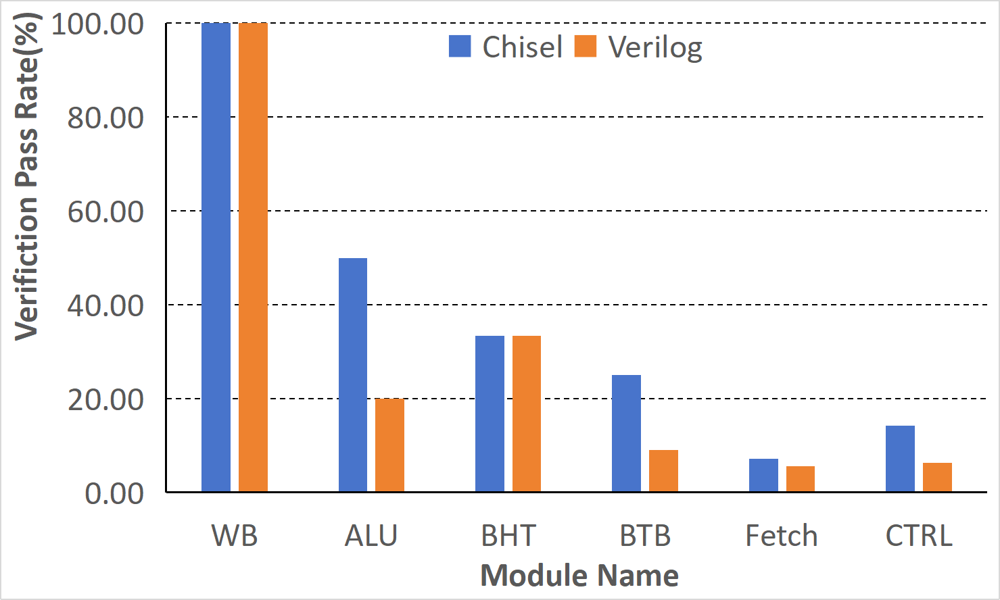
    <div style="text-align:center;"> Comparisons of Chisel & Verilog</div>
</div>

In addition, we analyzed the power and area for these modules. The results, shown in table, reveal that ChatChisel achieves an average of 11.45% area reduction and 1.80% power decrease as compared to the Verilog generation of the same CPU design, implying the advantages of LLM-based hardware design with Chisel.


|$Workload$|$HDL$|$Area/{mm^2}$|$Static Power/mW$|
|:--:|:----------:|:----------:|:----------:|
|$Control$ <br /> |$Chisel$|$2.11\times 10^{-3}$|$0.014$|
|        <br /> |$Verilog$|$2.84\times 10^{-3}$|$0.0152$|
|$ALU$ <br /> |$Chisel$|$0.02336$|$0.559$|
|        <br /> |$Verilog$|$0.02058$|$0.445$|
|$BTB$ <br />|$Chisel$|$5.85\times 10^{-3}$|$0.633$|
|        <br /> |Verilog|$6.88\times 10^{-3}$|$0.53$|
|$BHT$ <br /> |$Chisel$|$0.09695$|$10.9$|
|        <br /> |$Verilog$|$0.1127$|$11.2$|
|$Fetch$ <br /> |$Chisel$|$0.1144$|$13.2$|
|        <br /> |$Verilog$|$0.13102$|$13.4$|

### B. Ablation Studies

We conducted a series of ablation experiments to assess the impact of design decomposition, Tool Enhanced LLM Error Correction, and the utilization of RAG in ChatChisel. We employed GPT-3.5-turbo to test various modules within our CPU, with the results presented in the figure below.

<div style="text-align:center;">
    <div style="display:inline-block;">
        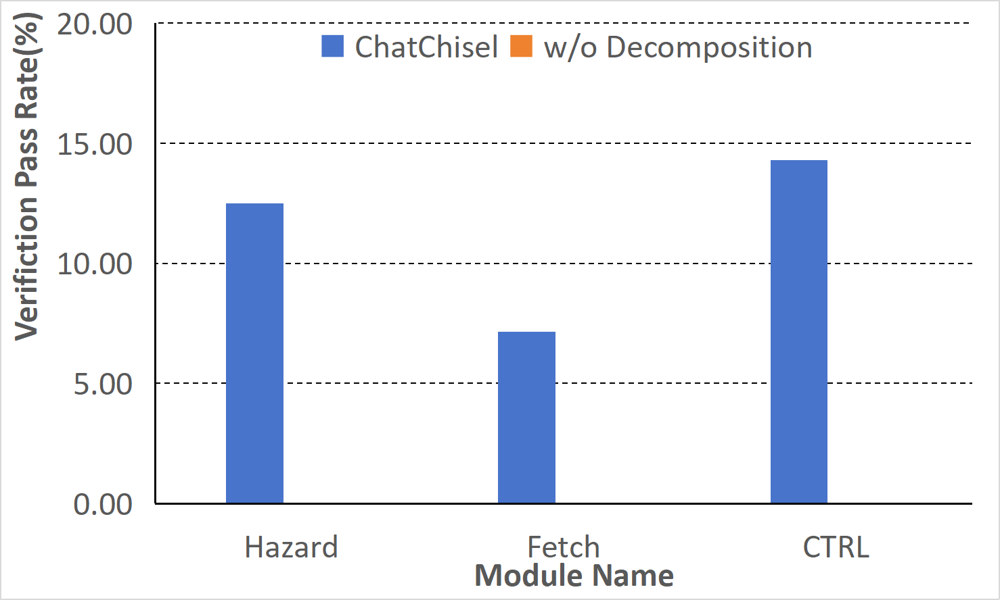
        <div>Design Decomposition Analysis</div>
    </div>
    <div style="display:inline-block;">
        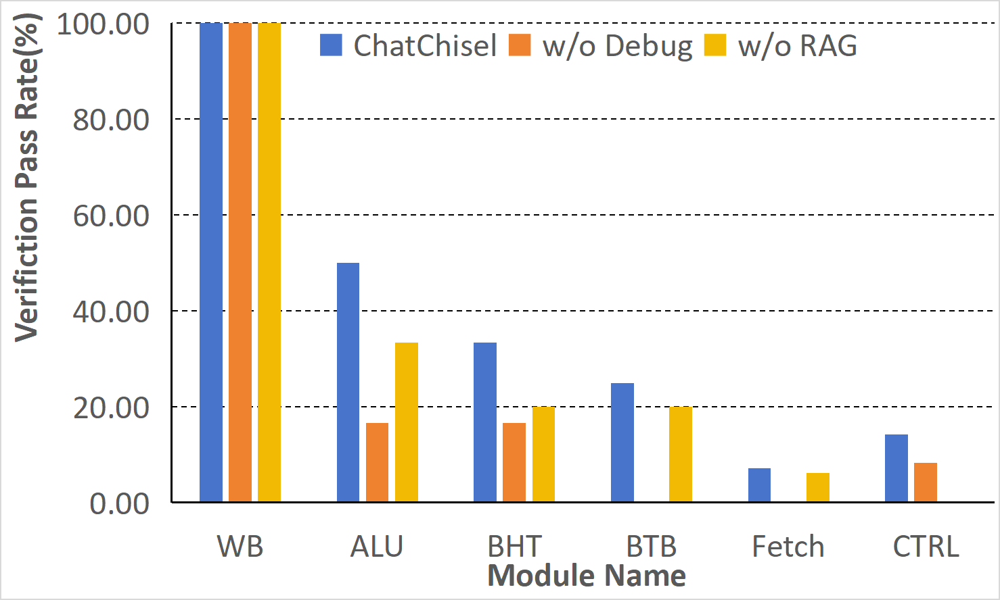
        <div>Debugging & RAG Analysis</div>
    </div>
</div>


In the first set of experiments, we observed that none of
the modules were successfully generated without the suppor
of design decompositio . Specifically, the Control modu e
failed to generate a complete module due to the limi ed
output tokens, while the Fetch and Hazard modules were
unable to be generated due to their high complexity. This
highlights the rapid decrease in the pass rate of modulegeneration with increasing design complexity. In the second  et of
experiments, ChatChisel demonstrated an average gen ration
capability improvement of 62.17% over the workflow without
tool-enhanced LLM error correction. Notably, This  ebugging
stage significantly reduced iteration times and pre ented the
LLM from e countering recurring errors during ve ification,
showcasing its importance in the generation pro ess. In the
third set of experiments, the average design  apability of
ChatChisel was 27.93% higher when RA  was employed
compared. This evaluation provides empirical impacts of RAG
upon improving the hardware design capability of LLMs.

## Conclusion
This article explored the use of LLMs to generate Chisel code for RTL-level circuit design. Through comparative experiments, it was demonstrated that the ability of GPT-3.5-turbo to generate Chisel surpassed its ability to generate Verilog. We introduced ChatChisel, a framework for directly generating
agile HDLs from natural language using LLMs. This workflow leverages multiple expert LLMs and addresses certain challenges in LLM generation through techniques such as Design Decomposition, Tool Enhanced LLM Error Correction, and Structured Prompt with RAG. These advancements significantly improve the efficiency of RTL-level agile design. By utilizing the ChatChisel workflow, we successfully generated a RISC-V CPU, showcasing the potential of LLMs in generating complex circuits.

## Acknowledgement


*   We would like to express our sincere gratitude to the **VLSI'24 Code-a-Chip Contest** organizing committee for their support and coordination.
*   We are also deeply appreciative of the generous support provided by Amazon Cloud Technology, which has enabled the successful completion of this project.
*   Additionally, *some portions of the work* presented in this project have been accepted as * research papers* at the **61th ACM/IEEE DAC'24** and **ACM/IEEE ISEDA'24** conference. We welcome any citations, suggestions, and potential future collaborations regarding this project.
*   We are thankful for the opportunity to contribute to the VLSI community and look forward to the valuable feedback and discussions that may arise from this endeavor.










